In [1]:
import numpy as np
import openslide
from openslide import open_slide  
from openslide.deepzoom import DeepZoomGenerator
from glob import glob
from xml.dom import minidom
from shapely.geometry import Polygon, Point
import matplotlib.pyplot as plt
import cv2
import matplotlib.pyplot as plt
import utilities
import math
import os
from PIL import Image, ImageDraw
from scipy import misc

In [12]:
#读取感兴趣区域，返回坐标和标签
def get_regions(path):
    ''' Parses the xml at the given path, assuming annotation format importable by ImageScope. '''
    xml = minidom.parse(path)
    # The first region marked is always the tumour delineation
    regions_ = xml.getElementsByTagName("Region")
    regions, region_labels = [], []
    for region in regions_:
        vertices = region.getElementsByTagName("Vertex")
        attribute = region.getElementsByTagName("Attribute")
        if len(attribute) > 0:
            r_label = attribute[0].attributes['Value'].value
        else:
            r_label = region.getAttribute('Text')
        region_labels.append(r_label)

        # Store x, y coordinates into a 2D array in format [x1, y1], [x2, y2], ...
        coords = np.zeros((len(vertices), 2))

        for i, vertex in enumerate(vertices):
            coords[i][0] = vertex.attributes['X'].value
            coords[i][1] = vertex.attributes['Y'].value
        regions.append(coords)
    return regions

In [11]:
def coordinate_regions(hregions):
    max_x=0
    max_y=0
    min_x=9000000000000
    min_y=9000000000000
    for j in range(len(hregions)):
        if(min_x)>=hregions[j][0]:
            min_x=hregions[j][0]
        if(min_y)>=hregions[j][1]:
            min_y=hregions[j][1]
        if(max_x)<=hregions[j][0]:
            max_x=hregions[j][0] 
        if(max_y)<=hregions[j][1]:
            max_y=hregions[j][1]  
    h=int(max_y-min_y)
    w=int(max_x-min_x)
    print("zuizhi",max_x,max_y,min_x,min_y)
    return int(min_x),int(min_y),w,h

NameError: name 'image' is not defined

C:\Users\Yi\Documents\HCCW\HCC\1-7\66af8c41-00c8-4dd7-8c7e-fe5240a4d6e6\image.svs
[array([[124099.,  50743.],
       [124134.,  50743.],
       [124240.,  50743.],
       [124345.,  50813.],
       [124626.,  50953.],
       [124731.,  51094.],
       [124977.,  51340.],
       [125258.,  51515.],
       [125469.,  51656.],
       [125820.,  51972.],
       [126101.,  52182.],
       [126417.,  52463.],
       [126768.,  52779.],
       [126873.,  52885.],
       [127084.,  53025.],
       [127224.,  53201.],
       [127330.,  53306.],
       [127541.,  53411.],
       [127681.,  53446.],
       [127821.,  53552.],
       [127962.,  53727.],
       [128173.,  53903.],
       [128313.,  54079.],
       [128489.,  54289.],
       [128629.,  54500.],
       [128734.,  54640.],
       [128805.,  54746.],
       [128875.,  54886.],
       [128945.,  54992.],
       [129051.,  55167.],
       [129121.,  55308.],
       [129226.,  55448.],
       [129331.,  55589.],
       [129507.,  55799.],

zuizhi 148645.0 42841.0 121992.0 11237.0
[[121992.  18471.]
 [122343.  18190.]
 [123081.  17453.]
 [123853.  16680.]
 [124626.  16048.]
 [125293.  15486.]
 [125715.  15205.]
 [126101.  14854.]
 [126557.  14327.]
 [127154.  13766.]
 [127786.  13239.]
 [128243.  12923.]
 [128945.  12431.]
 [129647.  11975.]
 [129964.  11869.]
 [130420.  11764.]
 [130877.  11624.]
 [131333.  11518.]
 [132106.  11483.]
 [132632.  11378.]
 [133300.  11307.]
 [133861.  11237.]
 [134388.  11237.]
 [134810.  11237.]
 [135055.  11237.]
 [135371.  11272.]
 [135898.  11307.]
 [136284.  11413.]
 [136600.  11553.]
 [136952.  11694.]
 [137197.  11764.]
 [137443.  11904.]
 [138075.  12150.]
 [138567.  12361.]
 [138883.  12501.]
 [139059.  12607.]
 [139515.  12923.]
 [139936.  13274.]
 [140463.  13660.]
 [141130.  14222.]
 [141482.  14573.]
 [141798.  14854.]
 [142149.  15135.]
 [142289.  15311.]
 [142500.  15592.]
 [142956.  15943.]
 [143202.  16224.]
 [143553.  16575.]
 [143729.  16750.]
 [143905.  16926.]
 [144080.

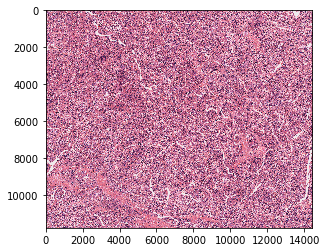

In [7]:
import scipy.misc
import matplotlib
image_path='C:\\Users\\Yi\\Documents\\HCCW\\HCC\\1-7\\66af8c41-00c8-4dd7-8c7e-fe5240a4d6e6\\image.svs'
at_path='C:\\Users\\Yi\\Documents\\HCCW\\HCC\\1-7\\66af8c41-00c8-4dd7-8c7e-fe5240a4d6e6\\AT.xml'
image= open_slide(image_path)
regions = get_regions(at_path)
#有的region是三个
print(image_path)
print(regions)
        
contours=[]
for k in range(len(regions)):
    x,y,w,h = coordinate_regions(regions[k])
    print(regions[k])
    m=regions[k]
    region=[]
    for n in range(len(m)):
        a = m[n][0]-x
        b = m[n][1]-y
        region.append((a,b))
    print(region)
    contours.append(region)
    if w>25000 or h>25000:
        continue
    img = np.array(image.read_region((x,y),0,(w,h)))
    plt.imshow(img)
    r, g, b, a = cv2.split(img)
    imgs = cv2.merge([r, g, b])
    images = Image.new('L',(w,h))
    ImageDraw.Draw(images).polygon(region, outline=1, fill=1)
    mask=images
    im=np.array(mask)
    masked=cv2.bitwise_and(imgs,imgs,mask=im)
    file_path= os.path.join('C:\\Users\\Yi\\Documents\\HCCW\\HCC\\1-7\\66af8c41-00c8-4dd7-8c7e-fe5240a4d6e6',"k_Roi.tiff")
    matplotlib.image.imsave(file_path, masked)        

C:\Users\Yi\Documents\HCCW\HCC\1-7\66af8c41-00c8-4dd7-8c7e-fe5240a4d6e6\image.svs
[array([[124099.,  50743.],
       [124134.,  50743.],
       [124240.,  50743.],
       [124345.,  50813.],
       [124626.,  50953.],
       [124731.,  51094.],
       [124977.,  51340.],
       [125258.,  51515.],
       [125469.,  51656.],
       [125820.,  51972.],
       [126101.,  52182.],
       [126417.,  52463.],
       [126768.,  52779.],
       [126873.,  52885.],
       [127084.,  53025.],
       [127224.,  53201.],
       [127330.,  53306.],
       [127541.,  53411.],
       [127681.,  53446.],
       [127821.,  53552.],
       [127962.,  53727.],
       [128173.,  53903.],
       [128313.,  54079.],
       [128489.,  54289.],
       [128629.,  54500.],
       [128734.,  54640.],
       [128805.,  54746.],
       [128875.,  54886.],
       [128945.,  54992.],
       [129051.,  55167.],
       [129121.,  55308.],
       [129226.,  55448.],
       [129331.,  55589.],
       [129507.,  55799.],

zuizhi 148645.0 42841.0 121992.0 11237.0
[[121992.  18471.]
 [122343.  18190.]
 [123081.  17453.]
 [123853.  16680.]
 [124626.  16048.]
 [125293.  15486.]
 [125715.  15205.]
 [126101.  14854.]
 [126557.  14327.]
 [127154.  13766.]
 [127786.  13239.]
 [128243.  12923.]
 [128945.  12431.]
 [129647.  11975.]
 [129964.  11869.]
 [130420.  11764.]
 [130877.  11624.]
 [131333.  11518.]
 [132106.  11483.]
 [132632.  11378.]
 [133300.  11307.]
 [133861.  11237.]
 [134388.  11237.]
 [134810.  11237.]
 [135055.  11237.]
 [135371.  11272.]
 [135898.  11307.]
 [136284.  11413.]
 [136600.  11553.]
 [136952.  11694.]
 [137197.  11764.]
 [137443.  11904.]
 [138075.  12150.]
 [138567.  12361.]
 [138883.  12501.]
 [139059.  12607.]
 [139515.  12923.]
 [139936.  13274.]
 [140463.  13660.]
 [141130.  14222.]
 [141482.  14573.]
 [141798.  14854.]
 [142149.  15135.]
 [142289.  15311.]
 [142500.  15592.]
 [142956.  15943.]
 [143202.  16224.]
 [143553.  16575.]
 [143729.  16750.]
 [143905.  16926.]
 [144080.

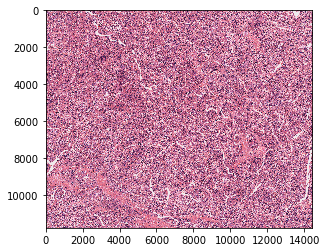

In [9]:
import scipy.misc
import matplotlib
image_path='C:\\Users\\Yi\\Documents\\HCCW\\HCC\\1-7\\66af8c41-00c8-4dd7-8c7e-fe5240a4d6e6\\image.svs'
at_path='C:\\Users\\Yi\\Documents\\HCCW\\HCC\\1-7\\66af8c41-00c8-4dd7-8c7e-fe5240a4d6e6\\AT.xml'
image= open_slide(image_path)
regions = get_regions(at_path)
#有的region是三个
print(image_path)
print(regions)
        
contours=[]
for k in range(len(regions)):
    x,y,w,h = coordinate_regions(regions[k])
    print(regions[k])
    m=regions[k]
    region=[]
    for n in range(len(m)):
        a = m[n][0]-x
        b = m[n][1]-y
        region.append((a,b))
    print(region)
    contours.append(region)
    if w>25000 or h>25000:
        continue
    img = np.array(image.read_region((x,y),0,(w,h)))
    plt.imshow(img)
    r, g, b, a = cv2.split(img)
    imgs = cv2.merge([r, g, b])
    images = Image.new('L',(w,h))
    ImageDraw.Draw(images).polygon(region, outline=1, fill=1)
    mask=images
    im=np.array(mask)
    masked=cv2.bitwise_or(imgs,imgs,mask=im)
    file_path= os.path.join('C:\\Users\\Yi\\Documents\\HCCW\\HCC\\1-7\\66af8c41-00c8-4dd7-8c7e-fe5240a4d6e6',"1k_Roi.tiff")
    matplotlib.image.imsave(file_path, masked)        

In [ ]:
# import scipy.misc
# import matplotlib
# EXTERNAL_DIR ='D:\\HCCW\\HCC'
# EXTERNAL_id=next(os.walk(EXTERNAL_DIR))[1]
# for i in range(len(EXTERNAL_id)):
#     inner_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i])
#     inner_id=next(os.walk(inner_path))[1]
#     for j in range(len(inner_id)):
#         image_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j],"image.svs")
#         at_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j],'CT.xml')
#         print(image_path)
#         image= open_slide(image_path)
#         regions = get_regions(at_path)
#         #有的region是三个
#         print(image_path)
#         print(regions)
#         for k in range(len(regions)):
#             x,y,w,h = coordinate_regions(regions[k])
#             print(x,y,w,h)
#             if w>25000 or h>25000:
#                 continue
#             imgs = np.array(image.read_region((x,y),0,(w,h)))
            
#             plt.imshow(imgs)
#             r, g, b, a = cv2.split(imgs)
#             merged = cv2.merge([r, g, b])
#             file_path= os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j],str(k)+"c_Roi.tiff")
#             matplotlib.image.imsave(file_path, merged)        

D:\im\IM\TCGA-2Y-A9GY-01Z-00-DX1.9AF8DAB8-B99C-4484-A065-20E7345E1FF4\TCGA-2Y-A9GY-01Z-00-DX1.9AF8DAB8-B99C-4484-A065-20E7345E1FF4.svs
zuizhi 75879.0 32465.0 63288.0 20844.0
D:\im\IM\TCGA-BC-A10Z-01Z-00-DX1.4AB6A0FC-31FD-4399-B58B-EAB6953AFBFE\TCGA-BC-A10Z-01Z-00-DX1.4AB6A0FC-31FD-4399-B58B-EAB6953AFBFE.svs
zuizhi 86320.0 25797.0 82448.0 15524.0
D:\im\IM\TCGA-CC-A7IK-01Z-00-DX1.AE013D44-A3C6-407B-A295-7E82DBB41C27\TCGA-CC-A7IK-01Z-00-DX1.AE013D44-A3C6-407B-A295-7E82DBB41C27.svs
zuizhi 23368.0 21590.0 20580.0 16829.0
D:\im\IM\TCGA-DD-A3A6\TCGA-DD-A3A6-01Z-00-DX1.FCF4A7E7-A0F9-4B5D-B751-D990703EA261.svs
zuizhi 99715.0 48566.0 91788.0 43329.0
D:\im\IM\TCGA-DD-AACL-01Z-00-DX1.C5A948CF-45E0-4CDB-9A3C-01F8D4715FF2\TCGA-DD-AACL-01Z-00-DX1.C5A948CF-45E0-4CDB-9A3C-01F8D4715FF2.svs
zuizhi 37298.0 12701.0 35071.0 7936.0
D:\im\IM\TCGA-DD-AADN-01Z-00-DX1.0C031278-22F9-40DE-9CFC-48A93EF8B8D8\TCGA-DD-AADN-01Z-00-DX1.0C031278-22F9-40DE-9CFC-48A93EF8B8D8.svs
zuizhi 7485.0 23022.0 4498.0 18107.0
D:\im\I

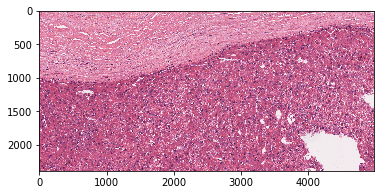

In [17]:
import scipy.misc
import matplotlib
EXTERNAL_DIR ='D:\\im'
EXTERNAL_id=next(os.walk(EXTERNAL_DIR))[1]
for i in range(len(EXTERNAL_id)):
    inner_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i])
    inner_id=next(os.walk(inner_path))[1]
    for j in range(len(inner_id)):
        os_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j])
        f_list = os.listdir(os_path)
        for l in f_list:
            if os.path.splitext(l)[1] ==".svs":           
                image_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j],l)
                at_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j],'IM.xml')
                if os.path.exists(at_path):
                    image= open_slide(image_path)
                    regions = get_regions(at_path)
                    #有的region是三个
                    print(image_path)
                    contours=[]
                    for k in range(len(regions)):
                        x,y,w,h = coordinate_regions(regions[k])
                        m=regions[k]
                        region=[]
                        for n in range(len(m)):
                            a = m[n][0]-x
                            b = m[n][1]-y
                            region.append((a,b))
                        contours.append(region)
                        if w>27000 or h>27000:
                            continue
                        img = np.array(image.read_region((x,y),0,(w,h)))
                        plt.imshow(img)
                        r, g, b, a = cv2.split(img)
                        imgs = cv2.merge([r, g, b])
                        images = Image.new('L',(w,h))
                        ImageDraw.Draw(images).polygon(region, outline=1, fill=1)
                        mask=images
                        im=np.array(mask)
                        masked=cv2.bitwise_or(imgs,imgs,mask=im)
                        file_path= os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j],"Ii"+str(k)+"_IMROI.tiff")
                        matplotlib.image.imsave(file_path, masked)     


E:\HIAYUE\CT\TCGA-DD-AAC8-01Z-00-DX1.9B06A570-EE68-494D-8798-8375AB92F895\TCGA-DD-AAC8-01Z-00-DX1.9B06A570-EE68-494D-8798-8375AB92F895.svs
zuizhi 14713.0 67436.0 8582.0 61735.0
E:\HIAYUE\CT\TCGA-DD-AAC8-01Z-00-DX1.9B06A570-EE68-494D-8798-8375AB92F895\Cc0_CTROI.tiff
E:\HIAYUE\CT\TCGA-DD-AACL-01Z-00-DX1.C5A948CF-45E0-4CDB-9A3C-01F8D4715FF2\TCGA-DD-AACL-01Z-00-DX1.C5A948CF-45E0-4CDB-9A3C-01F8D4715FF2.svs
zuizhi 51633.0 37059.0 48753.0 34608.0
E:\HIAYUE\CT\TCGA-DD-AACL-01Z-00-DX1.C5A948CF-45E0-4CDB-9A3C-01F8D4715FF2\Cc0_CTROI.tiff
E:\HIAYUE\CT\TCGA-DD-AAD2-01Z-00-DX1.B91E4434-883A-43B5-8655-993FA4472F73\TCGA-DD-AAD2-01Z-00-DX1.B91E4434-883A-43B5-8655-993FA4472F73.svs
zuizhi 20205.0 30921.0 15088.0 27641.0
E:\HIAYUE\CT\TCGA-DD-AAD2-01Z-00-DX1.B91E4434-883A-43B5-8655-993FA4472F73\Cc0_CTROI.tiff
E:\HIAYUE\CT\TCGA-DD-AAD3-01Z-00-DX1.DB86DCF0-4571-4E47-BDA5-FFD44D7D950E\TCGA-DD-AAD3-01Z-00-DX1.DB86DCF0-4571-4E47-BDA5-FFD44D7D950E.svs
zuizhi 66226.0 29848.0 60544.0 23317.0
E:\HIAYUE\CT\TCGA-DD-A

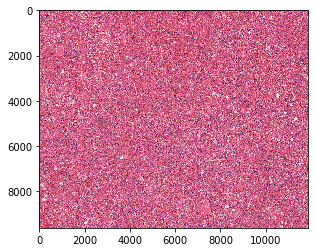

In [5]:
import scipy.misc
import matplotlib
EXTERNAL_DIR ='E:\HIAYUE'
EXTERNAL_id=next(os.walk(EXTERNAL_DIR))[1]
for i in range(len(EXTERNAL_id)):
    inner_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i])
    inner_id=next(os.walk(inner_path))[1]
    for j in range(len(inner_id)):
        os_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j])
        f_list = os.listdir(os_path)
        for l in f_list:
            if os.path.splitext(l)[1] ==".svs":           
                image_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j],l)
                at_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j],'CT.xml')
                if os.path.exists(at_path):
                    image= open_slide(image_path)
                    regions = get_regions(at_path)
                    #有的region是三个
                    print(image_path)
                    contours=[]
                    for k in range(len(regions)):
                        x,y,w,h = coordinate_regions(regions[k])
                        m=regions[k]
                        region=[]
                        for n in range(len(m)):
                            a = m[n][0]-x
                            b = m[n][1]-y
                            region.append((a,b))
                        contours.append(region)
                        if w>25000 or h>25000:
                            continue
                        img = np.array(image.read_region((x,y),0,(w,h)))
                        plt.imshow(img)
                        r, g, b, a = cv2.split(img)
                        imgs = cv2.merge([r, g, b])
                        images = Image.new('L',(w,h))
                        ImageDraw.Draw(images).polygon(region, outline=1, fill=1)
                        mask=images
                        im=np.array(mask)
                        masked=cv2.bitwise_or(imgs,imgs,mask=im)
                        file_path= os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j],"Cc"+str(k)+"_CTROI.tiff")
                        print(file_path)
                        matplotlib.image.imsave(file_path, masked)     


In [8]:
import scipy.misc
import matplotlib
EXTERNAL_DIR ='E:\\HCC\\yue'
EXTERNAL_id=next(os.walk(EXTERNAL_DIR))[1]
for i in range(len(EXTERNAL_id)):
    inner_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i])
    inner_id=next(os.walk(inner_path))[1]
    for j in range(len(inner_id)):
        os_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j])
        f_list = os.listdir(os_path)
        for l in f_list:
            if os.path.splitext(l)[1] ==".svs":           
                image_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j],l)
                at_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j],'CT.xml')
                if os.path.exists(at_path):
                    image= open_slide(image_path)
                    regions = get_regions(at_path)
                    #有的region是三个
                    print(image_path)
                    contours=[]
                    for k in range(len(regions)):
                        x,y,w,h = coordinate_regions(regions[k])
                        m=regions[k]
                        region=[]
                        for n in range(len(m)):
                            a = m[n][0]-x
                            b = m[n][1]-y
                            region.append((a,b))
                        contours.append(region)
                        if w>25000 or h>25000:
                            continue
                        img = np.array(image.read_region((x,y),0,(w,h)))
                        plt.imshow(img)
                        r, g, b, a = cv2.split(img)
                        imgs = cv2.merge([r, g, b])
                        images = Image.new('L',(w,h))
                        ImageDraw.Draw(images).polygon(region, outline=1, fill=1)
                        mask=images
                        im=np.array(mask)
                        masked=cv2.bitwise_or(imgs,imgs,mask=im)
                        file_path= os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j],"Cc"+str(k)+"_CTROI.tiff")
                        print(file_path)
                        matplotlib.image.imsave(file_path, masked)     


E:\HIAYUE\AT\TCGA-BW-A5NQ-01Z-00-DX1.F5543010-CBEB-4BA3-8402-1332A8617A76\TCGA-BW-A5NQ-01Z-00-DX1.F5543010-CBEB-4BA3-8402-1332A8617A76.svs
zuizhi 86944.0 44109.0 83069.0 41845.0
E:\HIAYUE\AT\TCGA-CC-5260-01Z-00-DX1.48FDF3FB-5ABA-4456-84D7-564C94ACDD85\TCGA-CC-5260-01Z-00-DX1.48FDF3FB-5ABA-4456-84D7-564C94ACDD85.svs
zuizhi 31207.0 34352.0 27873.0 31078.0
E:\HIAYUE\AT\TCGA-DD-A118-01Z-00-DX1.60B26023-8F1C-4373-A5A5-1279162F4076\TCGA-DD-A118-01Z-00-DX1.60B26023-8F1C-4373-A5A5-1279162F4076.svs
zuizhi 83716.0 35682.0 79161.0 29980.0
E:\HIAYUE\AT\TCGA-DD-A11C-01Z-00-DX1.FBF80337-ED73-4611-8E0F-F3FE8A666DB9\TCGA-DD-A11C-01Z-00-DX1.FBF80337-ED73-4611-8E0F-F3FE8A666DB9.svs
zuizhi 30206.0 32992.0 22655.0 25626.0
E:\HIAYUE\AT\TCGA-DD-AACC-01Z-00-DX1.5B3061BB-6716-4253-8510-4D553CBF58A9\TCGA-DD-AACC-01Z-00-DX1.5B3061BB-6716-4253-8510-4D553CBF58A9.svs
zuizhi 81843.0 46501.0 75387.0 37493.0
E:\HIAYUE\AT\TCGA-DD-AAD2-01Z-00-DX1.B91E4434-883A-43B5-8655-993FA4472F73\TCGA-DD-AAD2-01Z-00-DX1.B91E4434-883

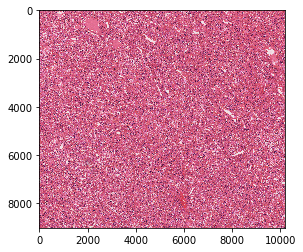

In [6]:
import scipy.misc
import matplotlib
EXTERNAL_DIR ='E:\HIAYUE'
EXTERNAL_id=next(os.walk(EXTERNAL_DIR))[1]
for i in range(len(EXTERNAL_id)):
    inner_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i])
    inner_id=next(os.walk(inner_path))[1]
    for j in range(len(inner_id)):
        os_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j])
        f_list = os.listdir(os_path)
        for l in f_list:
            if os.path.splitext(l)[1] ==".svs":           
                image_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j],l)
                at_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j],'AT.xml')
                if os.path.exists(at_path):
                    image= open_slide(image_path)
                    regions = get_regions(at_path)
                    #有的region是三个
                    print(image_path)
                    contours=[]
                    for k in range(len(regions)):
                        x,y,w,h = coordinate_regions(regions[k])
                        m=regions[k]
                        region=[]
                        for n in range(len(m)):
                            a = m[n][0]-x
                            b = m[n][1]-y
                            region.append((a,b))
                        contours.append(region)
                        if w>25000 or h>25000:
                            continue
                        img = np.array(image.read_region((x,y),0,(w,h)))
                        plt.imshow(img)
                        r, g, b, a = cv2.split(img)
                        imgs = cv2.merge([r, g, b])
                        images = Image.new('L',(w,h))
                        ImageDraw.Draw(images).polygon(region, outline=1, fill=1)
                        mask=images
                        im=np.array(mask)
                        masked=cv2.bitwise_or(imgs,imgs,mask=im)
                        file_path= os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j],"Aa"+str(k)+"_ATROI.tiff")
                        matplotlib.image.imsave(file_path, masked)     


In [ ]:
import scipy.misc
import matplotlib
EXTERNAL_DIR ='D:\\HCCW\\hcc2'
EXTERNAL_id=next(os.walk(EXTERNAL_DIR))[1]
for i in range(len(EXTERNAL_id)):
    inner_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i])
    inner_id=next(os.walk(inner_path))[1]
    for j in range(len(inner_id)):
        image_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j],"image.svs")
        at_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j],'AT.xml')
        if os.path.exists(at_path):
            print(image_path)
            image= open_slide(image_path)
            regions = get_regions(at_path)
            #有的region是三个
            print(image_path)
            print(regions)
            contours=[]
            for k in range(len(regions)):
                x,y,w,h = coordinate_regions(regions[k])
                print(regions[k])
                m=regions[k]
                region=[]
                for n in range(len(m)):
                    a = m[n][0]-x
                    b = m[n][1]-y
                    region.append((a,b))
                print(region)
                contours.append(region)
                if w>25000 or h>25000:
                    continue
                img = np.array(image.read_region((x,y),0,(w,h)))
                plt.imshow(img)
                r, g, b, a = cv2.split(img)
                imgs = cv2.merge([r, g, b])
                images = Image.new('L',(w,h))
                ImageDraw.Draw(images).polygon(region, outline=1, fill=1)
                mask=images
                im=np.array(mask)
                masked=cv2.bitwise_or(imgs,imgs,mask=im)
                file_path= os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j],"Aa"+str(k)+"_ATROI.tiff")
                matplotlib.image.imsave(file_path, masked)     


D:\HCCW\hcc2\12-12\047c7038-a57b-4017-8daa-ab2589dac4c1\image.svs
D:\HCCW\hcc2\12-12\047c7038-a57b-4017-8daa-ab2589dac4c1\image.svs
[array([[66708., 23406.],
       [66578., 23536.],
       [66535., 23623.],
       [66405., 23796.],
       [66362., 23883.],
       [66362., 24013.],
       [66275., 24100.],
       [66275., 24143.],
       [66232., 24273.],
       [66188., 24446.],
       [66145., 24533.],
       [66102., 24793.],
       [66102., 24923.],
       [66015., 25270.],
       [65971., 25443.],
       [65971., 25660.],
       [65928., 25790.],
       [65928., 26007.],
       [65928., 26137.],
       [65841., 26310.],
       [65798., 26440.],
       [65711., 26570.],
       [65711., 26787.],
       [65711., 26874.],
       [65711., 27134.],
       [65711., 27264.],
       [65711., 27394.],
       [65711., 27524.],
       [65711., 27654.],
       [65711., 27784.],
       [65755., 27871.],
       [65755., 27914.],
       [65798., 28001.],
       [65798., 28044.],
       [65841., 2

zuizhi 64887.0 60423.0 56348.0 52534.0
[[58776. 55092.]
 [58949. 54918.]
 [59079. 54788.]
 [59469. 54355.]
 [59859. 54095.]
 [60033. 53921.]
 [60293. 53791.]
 [60423. 53705.]
 [60553. 53618.]
 [60726. 53488.]
 [60943. 53358.]
 [61073. 53228.]
 [61333. 53098.]
 [61463. 52968.]
 [61593. 52924.]
 [61766. 52794.]
 [61940. 52708.]
 [62113. 52664.]
 [62243. 52621.]
 [62417. 52578.]
 [62503. 52578.]
 [62633. 52578.]
 [62763. 52534.]
 [62893. 52534.]
 [62980. 52534.]
 [63110. 52534.]
 [63240. 52534.]
 [63283. 52534.]
 [63327. 52534.]
 [63413. 52621.]
 [63500. 52664.]
 [63587. 52708.]
 [63717. 52751.]
 [63760. 52838.]
 [63847. 52881.]
 [63934. 52968.]
 [63977. 53011.]
 [63977. 53054.]
 [64107. 53141.]
 [64107. 53185.]
 [64237. 53271.]
 [64324. 53358.]
 [64410. 53445.]
 [64454. 53531.]
 [64540. 53661.]
 [64584. 53748.]
 [64670. 53791.]
 [64757. 53878.]
 [64757. 53921.]
 [64801. 54051.]
 [64844. 54181.]
 [64887. 54398.]
 [64887. 54572.]
 [64844. 54745.]
 [64714. 54962.]
 [64497. 55308.]
 [64410. 

zuizhi 19722.0 27741.0 16168.0 24187.0
[[18075. 24273.]
 [17988. 24273.]
 [17858. 24317.]
 [17728. 24360.]
 [17685. 24360.]
 [17555. 24447.]
 [17468. 24447.]
 [17425. 24490.]
 [17338. 24490.]
 [17252. 24577.]
 [17165. 24577.]
 [17078. 24620.]
 [16991. 24707.]
 [16948. 24707.]
 [16905. 24707.]
 [16905. 24750.]
 [16775. 24750.]
 [16775. 24793.]
 [16731. 24837.]
 [16688. 24837.]
 [16645. 24880.]
 [16558. 24967.]
 [16515. 25054.]
 [16471. 25097.]
 [16385. 25227.]
 [16341. 25314.]
 [16255. 25400.]
 [16211. 25487.]
 [16211. 25574.]
 [16168. 25617.]
 [16168. 25660.]
 [16168. 25790.]
 [16168. 25877.]
 [16168. 26094.]
 [16211. 26181.]
 [16255. 26311.]
 [16298. 26397.]
 [16341. 26484.]
 [16428. 26614.]
 [16428. 26701.]
 [16515. 26917.]
 [16645. 27047.]
 [16645. 27134.]
 [16645. 27264.]
 [16731. 27351.]
 [16775. 27438.]
 [16905. 27568.]
 [16948. 27611.]
 [17035. 27611.]
 [17078. 27698.]
 [17208. 27698.]
 [17338. 27698.]
 [17382. 27698.]
 [17555. 27698.]
 [17642. 27741.]
 [17815. 27741.]
 [18032. 

zuizhi 20288.0 43488.0 14431.0 37518.0
[[16498. 37599.]
 [16237. 37518.]
 [16156. 37518.]
 [16075. 37518.]
 [15961. 37518.]
 [15863. 37550.]
 [15782. 37599.]
 [15684. 37648.]
 [15505. 37778.]
 [15391. 37859.]
 [15261. 38022.]
 [15098. 38250.]
 [15001. 38396.]
 [14936. 38526.]
 [14838. 38705.]
 [14757. 38900.]
 [14675. 39128.]
 [14610. 39356.]
 [14545. 39551.]
 [14513. 39779.]
 [14464. 40039.]
 [14431. 40348.]
 [14431. 40658.]
 [14464. 40836.]
 [14513. 41064.]
 [14627. 41341.]
 [14789. 41650.]
 [14984. 41894.]
 [15115. 41992.]
 [15310. 42138.]
 [15570. 42333.]
 [15993. 42675.]
 [16237. 42838.]
 [16416. 42984.]
 [16563. 43082.]
 [16807. 43196.]
 [17034. 43342.]
 [17213. 43391.]
 [17376. 43488.]
 [17604. 43488.]
 [17767. 43488.]
 [18043. 43488.]
 [18206. 43456.]
 [18417. 43358.]
 [18645. 43261.]
 [18905. 43147.]
 [19149. 42935.]
 [19296. 42773.]
 [19459. 42577.]
 [19572. 42382.]
 [19784. 42089.]
 [19882. 41878.]
 [19979. 41682.]
 [20142. 41422.]
 [20207. 41064.]
 [20240. 40869.]
 [20240. 

zuizhi 14688.0 25988.0 10241.0 20848.0
[[10404. 23214.]
 [10404. 23500.]
 [10526. 23826.]
 [10853. 24479.]
 [11057. 24887.]
 [11138. 25091.]
 [11342. 25376.]
 [11383. 25458.]
 [11587. 25662.]
 [11791. 25825.]
 [11913. 25948.]
 [12117. 25988.]
 [12240. 25988.]
 [12444. 25988.]
 [12689. 25988.]
 [13056. 25988.]
 [13505. 25866.]
 [13872. 25744.]
 [13994. 25703.]
 [14117. 25621.]
 [14239. 25499.]
 [14402. 25336.]
 [14484. 25172.]
 [14525. 24928.]
 [14565. 24724.]
 [14606. 24560.]
 [14688. 24356.]
 [14688. 24071.]
 [14688. 23826.]
 [14688. 23541.]
 [14688. 23296.]
 [14647. 23051.]
 [14606. 22806.]
 [14525. 22643.]
 [14280. 22398.]
 [14117. 22153.]
 [13953. 21909.]
 [13790. 21745.]
 [13668. 21582.]
 [13464. 21419.]
 [13341. 21378.]
 [13260. 21297.]
 [13097. 21174.]
 [13137. 21215.]
 [13137. 21174.]
 [13137. 21093.]
 [13137. 21052.]
 [13137. 20970.]
 [13097. 20929.]
 [13056. 20929.]
 [13015. 20889.]
 [12974. 20889.]
 [12933. 20889.]
 [12893. 20848.]
 [12811. 20848.]
 [12770. 20848.]
 [12729. 

zuizhi 42863.0 65215.0 39822.0 58778.0
[[39893. 61183.]
 [39893. 61395.]
 [39893. 61466.]
 [39893. 61678.]
 [39893. 61820.]
 [39893. 61961.]
 [39893. 62244.]
 [40034. 62456.]
 [40105. 62739.]
 [40176. 62952.]
 [40246. 63164.]
 [40388. 63376.]
 [40458. 63588.]
 [40529. 63871.]
 [40600. 64083.]
 [40600. 64366.]
 [40600. 64508.]
 [40600. 64578.]
 [40671. 64720.]
 [40812. 64861.]
 [40954. 65074.]
 [41166. 65144.]
 [41237. 65215.]
 [41307. 65215.]
 [41449. 65215.]
 [41519. 65215.]
 [41661. 65215.]
 [41802. 65215.]
 [42015. 65144.]
 [42227. 64932.]
 [42298. 64791.]
 [42439. 64649.]
 [42510. 64437.]
 [42651. 64225.]
 [42722. 64083.]
 [42863. 63800.]
 [42863. 63517.]
 [42863. 63376.]
 [42863. 63093.]
 [42863. 62952.]
 [42863. 62739.]
 [42863. 62598.]
 [42863. 62315.]
 [42863. 62174.]
 [42863. 61961.]
 [42863. 61820.]
 [42863. 61678.]
 [42793. 61254.]
 [42722. 61042.]
 [42651. 60759.]
 [42580. 60476.]
 [42580. 60264.]
 [42510. 60052.]
 [42368. 59910.]
 [42368. 59769.]
 [42298. 59698.]
 [42227. 

D:\HCCW\hcc2\12-12\0e149976-b2e9-4323-b78b-9bc08c7be03e\image.svs
D:\HCCW\hcc2\12-12\0e149976-b2e9-4323-b78b-9bc08c7be03e\image.svs
[array([[35734., 34947.],
       [35734., 34904.],
       [35647., 34904.],
       [35516., 34904.],
       [35472., 34904.],
       [35428., 34904.],
       [35428., 34947.],
       [35341., 35122.],
       [35297., 35166.],
       [35297., 35209.],
       [35297., 35297.],
       [35297., 35340.],
       [35297., 35428.],
       [35297., 35515.],
       [35297., 35559.],
       [35297., 35646.],
       [35341., 35734.],
       [35428., 35821.],
       [35472., 35865.],
       [35559., 35908.],
       [35603., 35952.],
       [35690., 36039.],
       [35734., 36083.],
       [35778., 36127.],
       [35821., 36170.],
       [35865., 36214.],
       [35996., 36258.],
       [36040., 36301.],
       [36171., 36389.],
       [36215., 36389.],
       [36258., 36389.],
       [36346., 36476.],
       [36389., 36476.],
       [36433., 36476.],
       [36520., 3

zuizhi 31780.0 54589.0 29636.0 52643.0
[[29950. 52643.]
 [29900. 52659.]
 [29801. 52742.]
 [29702. 52857.]
 [29636. 52989.]
 [29636. 53072.]
 [29636. 53253.]
 [29636. 53385.]
 [29686. 53566.]
 [29818. 53830.]
 [29983. 54028.]
 [30214. 54242.]
 [30329. 54308.]
 [30412. 54391.]
 [30560. 54440.]
 [30741. 54523.]
 [30857. 54572.]
 [31022. 54589.]
 [31121. 54589.]
 [31253. 54589.]
 [31368. 54589.]
 [31484. 54589.]
 [31549. 54572.]
 [31615. 54506.]
 [31665. 54440.]
 [31747. 54358.]
 [31780. 54209.]
 [31780. 54094.]
 [31780. 53979.]
 [31780. 53830.]
 [31780. 53715.]
 [31747. 53566.]
 [31714. 53467.]
 [31681. 53368.]
 [31665. 53335.]
 [31632. 53302.]
 [31599. 53220.]
 [31549. 53170.]
 [31484. 53121.]
 [31434. 53072.]
 [31319. 53022.]
 [31253. 52973.]
 [31203. 52940.]
 [31154. 52907.]
 [31121. 52907.]
 [31071. 52890.]
 [30989. 52857.]
 [30956. 52841.]
 [30857. 52808.]
 [30791. 52775.]
 [30692. 52742.]
 [30626. 52725.]
 [30560. 52709.]
 [30478. 52709.]
 [30428. 52692.]
 [30379. 52676.]
 [30329. 

D:\HCCW\hcc2\12-12\1a1650ae-743c-45a1-aa38-10e232ca6dfc\image.svs
D:\HCCW\hcc2\12-12\1a1650ae-743c-45a1-aa38-10e232ca6dfc\image.svs
[array([[ 8313., 24876.],
       [ 8285., 24876.],
       [ 8274., 24876.],
       [ 8241., 24887.],
       [ 8218., 24904.],
       [ 8207., 24915.],
       [ 8196., 24937.],
       [ 8174., 24959.],
       [ 8152., 24976.],
       [ 8130., 25009.],
       [ 8119., 25026.],
       [ 8096., 25059.],
       [ 8091., 25070.],
       [ 8085., 25103.],
       [ 8069., 25126.],
       [ 8069., 25142.],
       [ 8069., 25175.],
       [ 8069., 25198.],
       [ 8069., 25220.],
       [ 8069., 25259.],
       [ 8069., 25292.],
       [ 8069., 25320.],
       [ 8069., 25347.],
       [ 8069., 25369.],
       [ 8069., 25397.],
       [ 8069., 25430.],
       [ 8069., 25453.],
       [ 8074., 25486.],
       [ 8080., 25513.],
       [ 8096., 25552.],
       [ 8102., 25580.],
       [ 8119., 25613.],
       [ 8124., 25635.],
       [ 8141., 25652.],
       [ 8157., 2

zuizhi 10839.0 17634.0 9088.0 15821.0
[[ 9332. 16082.]
 [ 9298. 16121.]
 [ 9254. 16193.]
 [ 9232. 16243.]
 [ 9182. 16315.]
 [ 9143. 16370.]
 [ 9116. 16420.]
 [ 9110. 16470.]
 [ 9093. 16531.]
 [ 9088. 16592.]
 [ 9088. 16631.]
 [ 9088. 16675.]
 [ 9088. 16725.]
 [ 9088. 16780.]
 [ 9088. 16847.]
 [ 9099. 16935.]
 [ 9121. 16996.]
 [ 9138. 17052.]
 [ 9154. 17096.]
 [ 9176. 17140.]
 [ 9210. 17185.]
 [ 9249. 17229.]
 [ 9282. 17262.]
 [ 9309. 17296.]
 [ 9332. 17318.]
 [ 9370. 17362.]
 [ 9409. 17395.]
 [ 9509. 17456.]
 [ 9570. 17484.]
 [ 9636. 17528.]
 [ 9708. 17556.]
 [ 9736. 17584.]
 [ 9797. 17589.]
 [ 9847. 17606.]
 [ 9947. 17634.]
 [10041. 17634.]
 [10130. 17634.]
 [10224. 17634.]
 [10290. 17628.]
 [10373. 17595.]
 [10412. 17567.]
 [10462. 17534.]
 [10512. 17495.]
 [10551. 17445.]
 [10579. 17406.]
 [10623. 17345.]
 [10656. 17284.]
 [10700. 17218.]
 [10739. 17168.]
 [10756. 17107.]
 [10778. 17052.]
 [10806. 16946.]
 [10822. 16880.]
 [10833. 16824.]
 [10833. 16775.]
 [10839. 16697.]
 [10839. 1

zuizhi 29508.0 43986.0 21289.0 36627.0
[[26533. 36796.]
 [24700. 36627.]
 [24545. 36627.]
 [24362. 36641.]
 [24277. 36655.]
 [24038. 36698.]
 [23897. 36726.]
 [23685. 36782.]
 [23432. 36853.]
 [23276. 36895.]
 [23065. 36980.]
 [21951. 38093.]
 [21853. 38277.]
 [21768. 38460.]
 [21683. 38700.]
 [21599. 38911.]
 [21528. 39151.]
 [21458. 39447.]
 [21373. 39912.]
 [21331. 40208.]
 [21303. 40476.]
 [21289. 40716.]
 [21669. 42295.]
 [21796. 42450.]
 [21937. 42605.]
 [21994. 42661.]
 [22120. 42760.]
 [22261. 42873.]
 [22388. 42957.]
 [22515. 43070.]
 [22656. 43169.]
 [24630. 43888.]
 [24813. 43930.]
 [25025. 43958.]
 [25264. 43986.]
 [25518. 43986.]
 [25800. 43986.]
 [26152. 43986.]
 [26392. 43986.]
 [26646. 43986.]
 [26886. 43986.]
 [28479. 43211.]
 [28662. 43028.]
 [28831. 42816.]
 [28986. 42605.]
 [29057. 42407.]
 [29169. 42154.]
 [29268. 41942.]
 [29381. 41660.]
 [29466. 41421.]
 [29508. 41139.]
 [29268. 38545.]
 [29198. 38418.]
 [29099. 38291.]
 [29028. 38136.]
 [28873. 37967.]
 [28676. 

zuizhi 56045.0 56363.0 48681.0 51587.0
[[48721. 52980.]
 [48721. 53099.]
 [48681. 53259.]
 [48681. 53338.]
 [48681. 53458.]
 [48681. 53577.]
 [48681. 53657.]
 [48681. 53816.]
 [48681. 53935.]
 [48721. 54095.]
 [48721. 54294.]
 [48761. 54453.]
 [48801. 54612.]
 [48801. 54891.]
 [48920. 55050.]
 [48960. 55328.]
 [49040. 55448.]
 [49040. 55527.]
 [49080. 55607.]
 [49159. 55727.]
 [49159. 55766.]
 [49199. 55766.]
 [49239. 55886.]
 [49279. 55926.]
 [49318. 56005.]
 [49398. 56085.]
 [49478. 56164.]
 [49557. 56244.]
 [49557. 56284.]
 [49597. 56284.]
 [49756. 56284.]
 [49915. 56284.]
 [49995. 56284.]
 [50114. 56284.]
 [50194. 56284.]
 [50274. 56363.]
 [50353. 56363.]
 [50433. 56363.]
 [50632. 56363.]
 [50751. 56363.]
 [50791. 56363.]
 [50911. 56324.]
 [51030. 56324.]
 [51110. 56324.]
 [51229. 56244.]
 [51309. 56244.]
 [51388. 56244.]
 [51508. 56244.]
 [51707. 56244.]
 [51826. 56244.]
 [51985. 56244.]
 [52184. 56244.]
 [52304. 56204.]
 [52503. 56164.]
 [52702. 56125.]
 [52901. 56085.]
 [53100. 

zuizhi 78933.0 32122.0 73798.0 27385.0
[[75151. 27425.]
 [74952. 27505.]
 [74793. 27544.]
 [74594. 27664.]
 [74435. 27744.]
 [74276. 27823.]
 [74236. 27863.]
 [74196. 27903.]
 [74116. 27982.]
 [74037. 28102.]
 [73917. 28341.]
 [73878. 28500.]
 [73838. 28699.]
 [73798. 28977.]
 [73798. 29216.]
 [73798. 29495.]
 [73798. 29774.]
 [73798. 30052.]
 [73798. 30291.]
 [73798. 30450.]
 [73798. 30649.]
 [73878. 30928.]
 [73997. 31127.]
 [74116. 31286.]
 [74276. 31445.]
 [74475. 31684.]
 [74753. 31883.]
 [74952. 31963.]
 [75151. 32042.]
 [75231. 32042.]
 [75311. 32082.]
 [75510. 32122.]
 [75549. 32122.]
 [75709. 32122.]
 [75828. 32122.]
 [75908. 32122.]
 [75948. 32122.]
 [76067. 32122.]
 [76147. 32122.]
 [76266. 32122.]
 [76465. 32042.]
 [76664. 31963.]
 [76823. 31883.]
 [77022. 31843.]
 [77142. 31764.]
 [77420. 31644.]
 [77579. 31565.]
 [77619. 31525.]
 [77818. 31406.]
 [77978. 31286.]
 [78097. 31246.]
 [78256. 31127.]
 [78415. 31007.]
 [78495. 30928.]
 [78575. 30769.]
 [78694. 30609.]
 [78774. 

D:\HCCW\hcc2\12-12\40303413-48c4-447b-abe2-1b57cffe054c\image.svs
D:\HCCW\hcc2\12-12\40303413-48c4-447b-abe2-1b57cffe054c\image.svs
[array([[17769., 14452.],
       [17510., 14452.],
       [17394., 14510.],
       [17279., 14568.],
       [17192., 14683.],
       [17077., 14827.],
       [17019., 14885.],
       [16962., 14971.],
       [16904., 15087.],
       [16904., 15202.],
       [16875., 15346.],
       [16817., 15491.],
       [16760., 15721.],
       [16702., 15894.],
       [16702., 16039.],
       [16673., 16183.],
       [16673., 16471.],
       [16673., 16587.],
       [16673., 16644.],
       [16760., 16760.],
       [16875., 16846.],
       [16904., 16875.],
       [17106., 17048.],
       [17250., 17135.],
       [17279., 17164.],
       [17365., 17279.],
       [17481., 17337.],
       [17567., 17394.],
       [17740., 17481.],
       [17885., 17510.],
       [17971., 17510.],
       [18115., 17568.],
       [18288., 17568.],
       [18490., 17568.],
       [18663., 1

zuizhi 28788.0 11135.0 23913.0 6808.0
[[25529.  6808.]
 [25298.  6808.]
 [25182.  6808.]
 [25067.  6866.]
 [24952.  6923.]
 [24865.  6981.]
 [24663.  7125.]
 [24490.  7269.]
 [24346.  7442.]
 [24173.  7616.]
 [24000.  7817.]
 [23942.  7904.]
 [23913.  8048.]
 [23913.  8221.]
 [23913.  8366.]
 [23913.  8567.]
 [23913.  8741.]
 [23913.  8914.]
 [23913.  9087.]
 [24000.  9289.]
 [24202.  9606.]
 [24375.  9866.]
 [24548. 10067.]
 [24779. 10241.]
 [25009. 10442.]
 [25269. 10616.]
 [25673. 10846.]
 [25817. 10904.]
 [26019. 11019.]
 [26250. 11048.]
 [26423. 11077.]
 [26769. 11135.]
 [27173. 11135.]
 [27375. 11135.]
 [27490. 11135.]
 [27577. 11135.]
 [27663. 11135.]
 [27779. 11077.]
 [27952. 10962.]
 [28038. 10875.]
 [28154. 10760.]
 [28269. 10616.]
 [28355. 10500.]
 [28384. 10298.]
 [28471.  9952.]
 [28529.  9664.]
 [28644.  9317.]
 [28673.  9116.]
 [28702.  8942.]
 [28759.  8712.]
 [28788.  8567.]
 [28759.  8221.]
 [28644.  8019.]
 [28644.  7875.]
 [28586.  7731.]
 [28500.  7644.]
 [28413.  

D:\HCCW\hcc2\12-12\429b4d93-4745-4da5-98df-a5ae69df6b12\image.svs
D:\HCCW\hcc2\12-12\429b4d93-4745-4da5-98df-a5ae69df6b12\image.svs
[array([[82939., 19527.],
       [82916., 19550.],
       [82892., 19596.],
       [82869., 19619.],
       [82846., 19642.],
       [82800., 19689.],
       [82777., 19735.],
       [82684., 19827.],
       [82661., 19873.],
       [82615., 19897.],
       [82569., 19966.],
       [82546., 20035.],
       [82476., 20151.],
       [82430., 20197.],
       [82384., 20266.],
       [82338., 20359.],
       [82315., 20428.],
       [82315., 20451.],
       [82315., 20520.],
       [82315., 20544.],
       [82315., 20636.],
       [82315., 20682.],
       [82315., 20752.],
       [82338., 20821.],
       [82361., 20844.],
       [82407., 20913.],
       [82430., 20936.],
       [82500., 20983.],
       [82523., 21029.],
       [82569., 21052.],
       [82638., 21098.],
       [82684., 21144.],
       [82777., 21168.],
       [82869., 21214.],
       [82962., 2

[[82939. 19527.]
 [82916. 19550.]
 [82892. 19596.]
 [82869. 19619.]
 [82846. 19642.]
 [82800. 19689.]
 [82777. 19735.]
 [82684. 19827.]
 [82661. 19873.]
 [82615. 19897.]
 [82569. 19966.]
 [82546. 20035.]
 [82476. 20151.]
 [82430. 20197.]
 [82384. 20266.]
 [82338. 20359.]
 [82315. 20428.]
 [82315. 20451.]
 [82315. 20520.]
 [82315. 20544.]
 [82315. 20636.]
 [82315. 20682.]
 [82315. 20752.]
 [82338. 20821.]
 [82361. 20844.]
 [82407. 20913.]
 [82430. 20936.]
 [82500. 20983.]
 [82523. 21029.]
 [82569. 21052.]
 [82638. 21098.]
 [82684. 21144.]
 [82777. 21168.]
 [82869. 21214.]
 [82962. 21237.]
 [83077. 21260.]
 [83170. 21260.]
 [83308. 21260.]
 [83424. 21260.]
 [83516. 21260.]
 [83586. 21237.]
 [83655. 21168.]
 [83724. 21144.]
 [83863. 21098.]
 [84025. 21029.]
 [84140. 20960.]
 [84233. 20960.]
 [84371. 20890.]
 [84441. 20821.]
 [84579. 20775.]
 [84626. 20752.]
 [84672. 20705.]
 [84718. 20682.]
 [84764. 20636.]
 [84810. 20590.]
 [84834. 20567.]
 [84880. 20497.]
 [84903. 20451.]
 [84903. 20428

zuizhi 76607.0 55022.0 70090.0 50216.0
[[71430. 50331.]
 [71222. 50470.]
 [70991. 50655.]
 [70899. 50747.]
 [70760. 50909.]
 [70644. 51094.]
 [70483. 51371.]
 [70344. 51694.]
 [70228. 51879.]
 [70159. 52064.]
 [70113. 52157.]
 [70090. 52365.]
 [70090. 52573.]
 [70090. 52734.]
 [70090. 52850.]
 [70113. 53012.]
 [70205. 53220.]
 [70228. 53358.]
 [70575. 53797.]
 [70899. 54098.]
 [70968. 54167.]
 [71014. 54236.]
 [71083. 54306.]
 [71153. 54329.]
 [71245. 54375.]
 [71384. 54468.]
 [71453. 54468.]
 [71546. 54537.]
 [71684. 54560.]
 [71823. 54583.]
 [72008. 54652.]
 [72123. 54676.]
 [72239. 54745.]
 [72262. 54745.]
 [72424. 54768.]
 [72516. 54814.]
 [72794. 54907.]
 [72909. 54907.]
 [73094. 54930.]
 [73325. 54953.]
 [73741. 54999.]
 [74041. 55022.]
 [74342. 55022.]
 [74758. 55022.]
 [75058. 55022.]
 [75312. 55022.]
 [75590. 54976.]
 [75798. 54953.]
 [75867. 54884.]
 [75959. 54860.]
 [76029. 54791.]
 [76144. 54652.]
 [76191. 54560.]
 [76283. 54468.]
 [76329. 54352.]
 [76399. 54213.]
 [76422. 

zuizhi 25374.0 52564.0 20247.0 46075.0
[[22259. 46075.]
 [21999. 46204.]
 [21740. 46334.]
 [21675. 46399.]
 [21545. 46464.]
 [21350. 46594.]
 [21285. 46594.]
 [21026. 46853.]
 [20896. 46918.]
 [20831. 46983.]
 [20701. 47048.]
 [20572. 47243.]
 [20507. 47308.]
 [20507. 47437.]
 [20442. 47567.]
 [20377. 47762.]
 [20312. 47892.]
 [20247. 48086.]
 [20247. 48216.]
 [20247. 48411.]
 [20247. 48606.]
 [20247. 48800.]
 [20247. 49060.]
 [20312. 49125.]
 [20377. 49254.]
 [20377. 49514.]
 [20507. 49709.]
 [20507. 49968.]
 [20572. 50228.]
 [20637. 50487.]
 [20637. 50617.]
 [20701. 50877.]
 [20766. 51007.]
 [20831. 51136.]
 [20896. 51461.]
 [20961. 51526.]
 [21221. 51785.]
 [21221. 51850.]
 [21221. 51980.]
 [21285. 52045.]
 [21415. 52175.]
 [21480. 52304.]
 [21610. 52434.]
 [21740. 52434.]
 [21805. 52434.]
 [21934. 52499.]
 [22259. 52564.]
 [22389. 52564.]
 [22648. 52564.]
 [22908. 52564.]
 [23167. 52564.]
 [23751. 52564.]
 [24141. 52564.]
 [24465. 52564.]
 [24725. 52564.]
 [24920. 52564.]
 [25049. 

zuizhi 34057.0 26287.0 27287.0 22645.0
[[30043. 22790.]
 [29350. 22935.]
 [28980. 22999.]
 [28818. 23015.]
 [28706. 23015.]
 [28609. 23080.]
 [28512. 23128.]
 [28399. 23177.]
 [28286. 23241.]
 [28109. 23402.]
 [27867. 23563.]
 [27706. 23725.]
 [27545. 23870.]
 [27416. 24015.]
 [27319. 24176.]
 [27287. 24273.]
 [27287. 24369.]
 [27287. 24434.]
 [27287. 24531.]
 [27287. 24611.]
 [27319. 24692.]
 [27384. 24853.]
 [27432. 24998.]
 [27481. 25079.]
 [27545. 25207.]
 [27610. 25369.]
 [27658. 25481.]
 [27738. 25578.]
 [27819. 25707.]
 [27916. 25804.]
 [27980. 25884.]
 [28045. 25933.]
 [28158. 26013.]
 [28222. 26046.]
 [28270. 26078.]
 [28303. 26110.]
 [28335. 26126.]
 [28383. 26142.]
 [28383. 26158.]
 [28448. 26174.]
 [28480. 26207.]
 [28544. 26255.]
 [28577. 26255.]
 [28657. 26287.]
 [28722. 26287.]
 [28883. 26287.]
 [29012. 26287.]
 [29125. 26287.]
 [29205. 26287.]
 [29318. 26287.]
 [29431. 26287.]
 [29528. 26287.]
 [29640. 26287.]
 [29785. 26287.]
 [29930. 26287.]
 [30156. 26287.]
 [30366. 

zuizhi 27033.0 49954.0 24192.0 47576.0
[[24787. 47592.]
 [24754. 47609.]
 [24688. 47625.]
 [24655. 47642.]
 [24589. 47675.]
 [24556. 47675.]
 [24506. 47675.]
 [24456. 47708.]
 [24440. 47725.]
 [24423. 47725.]
 [24423. 47758.]
 [24390. 47791.]
 [24341. 47857.]
 [24308. 47906.]
 [24275. 48005.]
 [24258. 48121.]
 [24225. 48220.]
 [24209. 48303.]
 [24209. 48369.]
 [24209. 48451.]
 [24192. 48534.]
 [24192. 48616.]
 [24192. 48682.]
 [24192. 48748.]
 [24209. 48814.]
 [24242. 48897.]
 [24308. 48980.]
 [24341. 49062.]
 [24407. 49161.]
 [24490. 49293.]
 [24572. 49409.]
 [24754. 49624.]
 [24869. 49706.]
 [24968. 49772.]
 [24985. 49772.]
 [25018. 49772.]
 [25084. 49805.]
 [25183. 49855.]
 [25299. 49888.]
 [25464. 49954.]
 [25596. 49954.]
 [25612. 49954.]
 [25712. 49954.]
 [25926. 49954.]
 [26108. 49954.]
 [26223. 49954.]
 [26323. 49954.]
 [26389. 49954.]
 [26488. 49937.]
 [26653. 49888.]
 [26719. 49838.]
 [26768. 49805.]
 [26851. 49739.]
 [26950. 49657.]
 [26983. 49591.]
 [27033. 49508.]
 [27033. 

zuizhi 42539.0 55718.0 37172.0 50169.0
[[37271. 51986.]
 [37271. 51953.]
 [37288. 51920.]
 [37354. 51870.]
 [37469. 51755.]
 [37568. 51639.]
 [37635. 51540.]
 [37717. 51474.]
 [37783. 51391.]
 [37816. 51358.]
 [37915. 51259.]
 [38064. 51160.]
 [38130. 51094.]
 [38229. 51045.]
 [38295. 50978.]
 [38394. 50912.]
 [38526. 50830.]
 [38675. 50747.]
 [38791. 50681.]
 [38857. 50632.]
 [38956. 50599.]
 [39038. 50582.]
 [39121. 50549.]
 [39319. 50500.]
 [39435. 50467.]
 [39534. 50434.]
 [39649. 50400.]
 [39732. 50367.]
 [39831. 50334.]
 [39913. 50318.]
 [39996. 50268.]
 [40112. 50235.]
 [40194. 50202.]
 [40293. 50169.]
 [40376. 50169.]
 [40541. 50169.]
 [40607. 50169.]
 [40690. 50169.]
 [40789. 50169.]
 [40855. 50169.]
 [40904. 50169.]
 [40954. 50169.]
 [41020. 50169.]
 [41102. 50169.]
 [41152. 50169.]
 [41202. 50169.]
 [41268. 50169.]
 [41350. 50169.]
 [41433. 50186.]
 [41499. 50202.]
 [41581. 50219.]
 [41664. 50252.]
 [41730. 50268.]
 [41746. 50268.]
 [41763. 50285.]
 [41780. 50285.]
 [41796. 

zuizhi 83249.0 38875.0 80543.0 36813.0
[[82605. 36899.]
 [82433. 36856.]
 [82347. 36856.]
 [82261. 36813.]
 [82175. 36813.]
 [82089. 36813.]
 [82046. 36813.]
 [81917. 36813.]
 [81832. 36813.]
 [81703. 36813.]
 [81531. 36813.]
 [81488. 36813.]
 [81359. 36813.]
 [81316. 36813.]
 [81230. 36813.]
 [81144. 36813.]
 [81101. 36856.]
 [81015. 36899.]
 [80972. 36899.]
 [80972. 36942.]
 [80887. 36985.]
 [80844. 37028.]
 [80844. 37071.]
 [80715. 37157.]
 [80672. 37200.]
 [80629. 37286.]
 [80586. 37329.]
 [80586. 37372.]
 [80586. 37457.]
 [80586. 37500.]
 [80586. 37586.]
 [80543. 37629.]
 [80543. 37672.]
 [80543. 37758.]
 [80543. 37801.]
 [80543. 37844.]
 [80543. 37887.]
 [80543. 37930.]
 [80543. 38016.]
 [80543. 38059.]
 [80543. 38102.]
 [80543. 38145.]
 [80543. 38231.]
 [80586. 38317.]
 [80629. 38360.]
 [80629. 38403.]
 [80672. 38488.]
 [80715. 38531.]
 [80758. 38574.]
 [80801. 38660.]
 [80887. 38703.]
 [80929. 38703.]
 [80972. 38703.]
 [81058. 38746.]
 [81101. 38746.]
 [81187. 38789.]
 [81230. 

zuizhi 34173.0 32081.0 28552.0 28089.0
[[30117. 28153.]
 [30005. 28153.]
 [29893. 28201.]
 [29733. 28281.]
 [28552. 29558.]
 [28552. 29622.]
 [28552. 29686.]
 [28552. 29734.]
 [29702. 31171.]
 [29781. 31235.]
 [30596. 31618.]
 [30676. 31650.]
 [30740. 31666.]
 [30787. 31698.]
 [31857. 32033.]
 [31937. 32081.]
 [32001. 32081.]
 [32033. 32081.]
 [33326. 31810.]
 [33374. 31746.]
 [33486. 31666.]
 [33550. 31602.]
 [34141. 30580.]
 [34141. 30484.]
 [34173. 30421.]
 [34173. 30293.]
 [34173. 30229.]
 [33853. 29111.]
 [33790. 29031.]
 [33758. 28967.]
 [33710. 28904.]
 [33023. 28393.]
 [32927. 28329.]
 [32863. 28329.]
 [32672. 28281.]
 [31889. 28137.]
 [31857. 28137.]
 [31825. 28121.]
 [31809. 28121.]
 [31410. 28089.]
 [31378. 28089.]
 [30420. 28089.]
 [30117. 28153.]]
[(1565.0, 64.0), (1453.0, 64.0), (1341.0, 112.0), (1181.0, 192.0), (0.0, 1469.0), (0.0, 1533.0), (0.0, 1597.0), (0.0, 1645.0), (1150.0, 3082.0), (1229.0, 3146.0), (2044.0, 3529.0), (2124.0, 3561.0), (2188.0, 3577.0), (2235.0, 360

zuizhi 41892.0 65610.0 31346.0 48519.0
[[36223. 48519.]
 [36014. 48644.]
 [35848. 48811.]
 [35514. 48978.]
 [35306. 49061.]
 [35139. 49228.]
 [34847. 49561.]
 [34764. 49603.]
 [34472. 49895.]
 [34222. 50228.]
 [34097. 50437.]
 [33888. 50687.]
 [33722. 50937.]
 [33597. 51187.]
 [33472. 51437.]
 [33347. 51646.]
 [33221. 51896.]
 [33055. 52187.]
 [32930. 52396.]
 [32763. 52604.]
 [32638. 52854.]
 [32596. 53021.]
 [32429. 53313.]
 [32263. 53563.]
 [32221. 53855.]
 [32138. 53980.]
 [32013. 54355.]
 [32013. 54438.]
 [31971. 54647.]
 [31929. 54813.]
 [31846. 54980.]
 [31846. 55147.]
 [31804. 55314.]
 [31804. 55439.]
 [31804. 55564.]
 [31763. 55647.]
 [31679. 55814.]
 [31679. 55856.]
 [31638. 56022.]
 [31638. 56147.]
 [31638. 56272.]
 [31638. 56397.]
 [31596. 56564.]
 [31554. 56731.]
 [31554. 56814.]
 [31554. 56939.]
 [31512. 56981.]
 [31512. 57064.]
 [31512. 57148.]
 [31512. 57189.]
 [31512. 57273.]
 [31512. 57314.]
 [31471. 57440.]
 [31429. 57440.]
 [31429. 57606.]
 [31429. 57690.]
 [31429. 

zuizhi 53313.0 59483.0 48311.0 53022.0
[[49603. 53022.]
 [49437. 53063.]
 [49353. 53147.]
 [49270. 53188.]
 [49187. 53272.]
 [49145. 53313.]
 [49061. 53397.]
 [48978. 53439.]
 [48978. 53480.]
 [48936. 53564.]
 [48853. 53647.]
 [48811. 53814.]
 [48770. 53855.]
 [48728. 53939.]
 [48645. 54147.]
 [48603. 54272.]
 [48478. 54397.]
 [48436. 54606.]
 [48353. 54814.]
 [48311. 54981.]
 [48311. 55106.]
 [48311. 55356.]
 [48311. 55523.]
 [48311. 55648.]
 [48311. 55731.]
 [48311. 55856.]
 [48311. 56023.]
 [48311. 56106.]
 [48353. 56315.]
 [48436. 56481.]
 [48478. 56732.]
 [48520. 56773.]
 [48561. 56898.]
 [48686. 57065.]
 [48686. 57148.]
 [48686. 57232.]
 [48770. 57315.]
 [48811. 57398.]
 [48895. 57440.]
 [48936. 57523.]
 [48978. 57565.]
 [49020. 57565.]
 [49061. 57607.]
 [49145. 57690.]
 [49187. 57774.]
 [49228. 57774.]
 [49270. 57815.]
 [49312. 57857.]
 [49395. 57940.]
 [49478. 57982.]
 [49562. 58065.]
 [49645. 58107.]
 [49728. 58190.]
 [49812. 58232.]
 [49937. 58315.]
 [50020. 58399.]
 [50104. 

D:\HCCW\hcc2\12-12\5b54f176-3727-4a02-aa7a-921eebe5aeea\image.svs
D:\HCCW\hcc2\12-12\5b54f176-3727-4a02-aa7a-921eebe5aeea\image.svs
[array([[17848., 25842.],
       [17820., 25842.],
       [17792., 25842.],
       [17778., 25857.],
       [17750., 25871.],
       [17708., 25899.],
       [17651., 25941.],
       [17342., 26279.],
       [17285., 26335.],
       [17018., 26983.],
       [17018., 27039.],
       [17018., 27067.],
       [17004., 27109.],
       [17004., 27137.],
       [16990., 27180.],
       [16990., 27194.],
       [16976., 27222.],
       [16976., 27236.],
       [16962., 27264.],
       [16962., 27292.],
       [16948., 27349.],
       [16948., 27363.],
       [16933., 27391.],
       [16933., 27405.],
       [16919., 27447.],
       [16919., 27461.],
       [16919., 27475.],
       [16948., 28080.],
       [16948., 28109.],
       [16990., 28165.],
       [16990., 28207.],
       [17004., 28263.],
       [17032., 28320.],
       [17046., 28376.],
       [17060., 2

zuizhi 22240.0 43170.0 18200.0 40552.0
[[18552. 40946.]
 [18862. 40904.]
 [18876. 40904.]
 [18918. 40890.]
 [18960. 40890.]
 [19664. 40791.]
 [19706. 40791.]
 [19762. 40777.]
 [19776. 40763.]
 [19819. 40749.]
 [19903. 40721.]
 [19959. 40707.]
 [19988. 40693.]
 [20382. 40566.]
 [20410. 40566.]
 [20438. 40566.]
 [20452. 40566.]
 [20494. 40566.]
 [20537. 40566.]
 [20565. 40566.]
 [21423. 40566.]
 [21451. 40566.]
 [21888. 40552.]
 [21902. 40552.]
 [21986. 40552.]
 [22043. 40552.]
 [22057. 40552.]
 [22141. 40735.]
 [22169. 40806.]
 [22183. 40834.]
 [22183. 40848.]
 [22183. 40876.]
 [22183. 40890.]
 [22240. 41256.]
 [22240. 41270.]
 [22240. 41284.]
 [22240. 41298.]
 [22197. 41692.]
 [22197. 41720.]
 [22183. 41749.]
 [22169. 41777.]
 [21972. 42171.]
 [21972. 42185.]
 [21958. 42199.]
 [21944. 42199.]
 [21930. 42213.]
 [21902. 42241.]
 [21902. 42255.]
 [21606. 42523.]
 [21564. 42537.]
 [21550. 42537.]
 [21536. 42551.]
 [21508. 42565.]
 [21071. 42776.]
 [21043. 42790.]
 [21015. 42804.]
 [20987. 

zuizhi 12382.0 35297.0 10289.0 33491.0
[[11219. 33505.]
 [10932. 33505.]
 [10918. 33505.]
 [10877. 33505.]
 [10850. 33519.]
 [10795. 33546.]
 [10740. 33573.]
 [10699. 33587.]
 [10330. 33998.]
 [10330. 34025.]
 [10316. 34080.]
 [10302. 34121.]
 [10289. 34162.]
 [10289. 34217.]
 [10426. 34627.]
 [10494. 34709.]
 [10549. 34764.]
 [10645. 34860.]
 [10713. 34914.]
 [10768. 34969.]
 [11205. 35284.]
 [11246. 35297.]
 [11260. 35297.]
 [11288. 35297.]
 [11342. 35297.]
 [11411. 35297.]
 [11479. 35297.]
 [12382. 34860.]
 [12382. 34818.]
 [12382. 34750.]
 [12382. 34709.]
 [12382. 34654.]
 [12382. 34613.]
 [12355. 34271.]
 [12355. 34258.]
 [12327. 34217.]
 [12314. 34175.]
 [12273. 34107.]
 [12259. 34093.]
 [12218. 34011.]
 [11944. 33847.]
 [11903. 33847.]
 [11876. 33833.]
 [11862. 33820.]
 [11835. 33806.]
 [11807. 33792.]
 [11794. 33792.]
 [11547. 33697.]
 [11520. 33697.]
 [11493. 33697.]
 [11479. 33669.]
 [11465. 33669.]
 [11315. 33628.]
 [11288. 33628.]
 [11246. 33615.]
 [11233. 33615.]
 [11219. 

zuizhi 17783.0 35388.0 14769.0 32731.0
[[16355. 32811.]
 [16316. 32791.]
 [16256. 32771.]
 [16177. 32731.]
 [16137. 32731.]
 [16058. 32731.]
 [16018. 32731.]
 [15959. 32731.]
 [15919. 32731.]
 [15860. 32731.]
 [15820. 32731.]
 [15681. 32791.]
 [15641. 32811.]
 [15562. 32870.]
 [15443. 32910.]
 [15344. 33009.]
 [15285. 33048.]
 [15146. 33108.]
 [15106. 33187.]
 [15047. 33247.]
 [14967. 33306.]
 [14928. 33366.]
 [14848. 33445.]
 [14809. 33485.]
 [14789. 33604.]
 [14769. 33663.]
 [14769. 33742.]
 [14769. 33861.]
 [14769. 33941.]
 [14769. 34040.]
 [14829. 34178.]
 [14868. 34258.]
 [14948. 34416.]
 [15027. 34516.]
 [15086. 34595.]
 [15185. 34674.]
 [15245. 34753.]
 [15285. 34773.]
 [15384. 34833.]
 [15483. 34892.]
 [15562. 34952.]
 [15701. 35031.]
 [15800. 35090.]
 [15919. 35150.]
 [16018. 35190.]
 [16177. 35269.]
 [16335. 35309.]
 [16434. 35328.]
 [16573. 35348.]
 [16633. 35348.]
 [16712. 35388.]
 [16851. 35388.]
 [16930. 35388.]
 [16990. 35388.]
 [17069. 35388.]
 [17188. 35368.]
 [17267. 

zuizhi 95769.0 76407.0 90118.0 71025.0
[[93921. 71220.]
 [93896. 71204.]
 [93888. 71196.]
 [93831. 71179.]
 [93766. 71163.]
 [93685. 71130.]
 [93603. 71130.]
 [93489. 71114.]
 [93400. 71098.]
 [93310. 71090.]
 [93212. 71057.]
 [93115. 71041.]
 [93009. 71025.]
 [92854. 71025.]
 [92708. 71025.]
 [92569. 71025.]
 [92463. 71025.]
 [92382. 71025.]
 [92317. 71025.]
 [92243. 71025.]
 [92138. 71041.]
 [92032. 71065.]
 [91877. 71082.]
 [91755. 71106.]
 [91665. 71114.]
 [91584. 71139.]
 [91478. 71163.]
 [91397. 71204.]
 [91291. 71236.]
 [91218. 71277.]
 [91079. 71342.]
 [91022. 71383.]
 [90949. 71432.]
 [90900. 71481.]
 [90835. 71546.]
 [90770. 71611.]
 [90688. 71684.]
 [90623. 71766.]
 [90550. 71863.]
 [90460. 71977.]
 [90379. 72075.]
 [90330. 72173.]
 [90265. 72295.]
 [90232. 72368.]
 [90224. 72466.]
 [90216. 72564.]
 [90200. 72621.]
 [90184. 72718.]
 [90175. 72816.]
 [90159. 72914.]
 [90143. 73011.]
 [90135. 73125.]
 [90118. 73247.]
 [90118. 73353.]
 [90118. 73451.]
 [90118. 73573.]
 [90118. 

zuizhi 84832.0 45348.0 71671.0 30542.0
[[78537. 30756.]
 [78180. 30613.]
 [77822. 30542.]
 [77607. 30542.]
 [77178. 30542.]
 [76821. 30542.]
 [76606. 30542.]
 [76105. 30613.]
 [75605. 30828.]
 [74961. 31042.]
 [74389. 31329.]
 [73960. 31615.]
 [73530. 31972.]
 [73244. 32258.]
 [72958. 32831.]
 [72672. 33546.]
 [72171. 34547.]
 [71885. 35263.]
 [71671. 35906.]
 [71671. 36479.]
 [71671. 37194.]
 [71671. 37909.]
 [71742. 38767.]
 [71814. 39340.]
 [71957. 39983.]
 [72028. 40699.]
 [72171. 41414.]
 [72314. 41843.]
 [73030. 42916.]
 [73602. 43631.]
 [73960. 43917.]
 [74246. 44060.]
 [74746. 44347.]
 [75462. 44919.]
 [76105. 45133.]
 [76535. 45205.]
 [77035. 45205.]
 [77464. 45348.]
 [78037. 45348.]
 [78609. 45348.]
 [79038. 45348.]
 [79610. 45276.]
 [80039. 45133.]
 [80540. 44919.]
 [81041. 44561.]
 [81470. 44275.]
 [81828. 43989.]
 [82257. 43631.]
 [82686. 43274.]
 [83258. 42558.]
 [83687. 42058.]
 [83973. 41557.]
 [84259. 40770.]
 [84617. 39769.]
 [84689. 39554.]
 [84760. 39125.]
 [84832. 

[[84491. 88360.]
 [84355. 88496.]
 [84355. 88633.]
 [84264. 88815.]
 [84127. 88997.]
 [84036. 89134.]
 [83990. 89225.]
 [83945. 89361.]
 [83899. 89498.]
 [83899. 89589.]
 [83854. 89817.]
 [83854. 89862.]
 [83854. 89999.]
 [83854. 90044.]
 [83854. 90181.]
 [83854. 90317.]
 [83899. 90499.]
 [83945. 90636.]
 [83990. 90818.]
 [83990. 90909.]
 [84082. 91091.]
 [84173. 91228.]
 [84264. 91319.]
 [84355. 91410.]
 [84400. 91546.]
 [84491. 91638.]
 [84628. 91729.]
 [84901. 91865.]
 [85129. 91911.]
 [85220. 92002.]
 [85311. 92002.]
 [85356. 92002.]
 [85493. 92047.]
 [85629. 92093.]
 [85811. 92138.]
 [85948. 92184.]
 [86039. 92184.]
 [86130. 92229.]
 [86221. 92229.]
 [86312. 92229.]
 [86403. 92229.]
 [86540. 92229.]
 [86722. 92229.]
 [86813. 92229.]
 [87041. 92138.]
 [87086. 92138.]
 [87177. 92002.]
 [87223. 91911.]
 [87314. 91774.]
 [87359. 91683.]
 [87450. 91501.]
 [87496. 91410.]
 [87496. 91228.]
 [87496. 91182.]
 [87496. 91046.]
 [87541. 90864.]
 [87541. 90682.]
 [87632. 90591.]
 [87678. 90499

zuizhi 37329.0 54809.0 29726.0 48118.0
[[32594. 48118.]
 [32412. 48118.]
 [32321. 48118.]
 [32139. 48254.]
 [31820. 48391.]
 [31411. 48618.]
 [31137. 48800.]
 [30728. 49028.]
 [30318. 49210.]
 [30090. 49392.]
 [29908. 49620.]
 [29772. 49847.]
 [29772. 50121.]
 [29726. 50576.]
 [29726. 51077.]
 [30045. 51896.]
 [30272. 52488.]
 [30728. 53125.]
 [31274. 53808.]
 [31775. 54309.]
 [32093. 54536.]
 [32276. 54673.]
 [32458. 54718.]
 [32685. 54809.]
 [32958. 54809.]
 [33095. 54809.]
 [33368. 54764.]
 [33687. 54627.]
 [34233. 54536.]
 [34597. 54400.]
 [35143. 54127.]
 [35553. 53899.]
 [35872. 53762.]
 [36099. 53626.]
 [36373. 53444.]
 [36600. 53262.]
 [36964. 52989.]
 [37101. 52670.]
 [37146. 52488.]
 [37283. 52033.]
 [37329. 51850.]
 [37329. 51714.]
 [37329. 51577.]
 [37238. 51350.]
 [37101. 51122.]
 [36964. 50894.]
 [36964. 50849.]
 [36828. 50576.]
 [36737. 50394.]
 [36600. 50212.]
 [36373. 49939.]
 [36054. 49574.]
 [35872. 49438.]
 [35690. 49301.]
 [35371. 49028.]
 [35235. 48891.]
 [34961. 

zuizhi 55025.0 44489.0 43808.0 32893.0
[[44036. 37971.]
 [43884. 38578.]
 [43808. 39639.]
 [43808. 40169.]
 [43808. 40700.]
 [43808. 41155.]
 [43960. 41837.]
 [44187. 42367.]
 [44263. 42670.]
 [44566. 43049.]
 [44945. 43428.]
 [45324. 43732.]
 [45476. 43883.]
 [45703. 44035.]
 [46158. 44262.]
 [46309. 44262.]
 [46385. 44414.]
 [46612. 44414.]
 [46688. 44414.]
 [46840. 44489.]
 [47067. 44489.]
 [47143. 44489.]
 [47295. 44489.]
 [47598. 44489.]
 [47749. 44489.]
 [47977. 44489.]
 [48432. 44489.]
 [48886. 44489.]
 [49114. 44489.]
 [49417. 44489.]
 [49796. 44414.]
 [50251. 44338.]
 [50629. 44262.]
 [51236. 43959.]
 [51994. 43656.]
 [52600. 43428.]
 [52979. 43353.]
 [53358. 43125.]
 [53813. 42898.]
 [54192. 42595.]
 [54495. 42292.]
 [54646. 42064.]
 [54874. 41837.]
 [54950. 41458.]
 [54950. 41306.]
 [55025. 41155.]
 [55025. 40851.]
 [55025. 40624.]
 [55025. 40397.]
 [55025. 40245.]
 [55025. 40018.]
 [55025. 39715.]
 [55025. 39411.]
 [54874. 39108.]
 [54722. 38805.]
 [54646. 38426.]
 [54495. 

D:\HCCW\hcc2\12-12\a2abc421-0db6-43a4-9ff8-eb79d0e4fb23\image.svs
D:\HCCW\hcc2\12-12\a2abc421-0db6-43a4-9ff8-eb79d0e4fb23\image.svs
[array([[ 99268.,  50542.],
       [ 99200.,  50542.],
       [ 99143.,  50542.],
       [ 99098.,  50542.],
       [ 98179.,  50950.],
       [ 98099.,  50973.],
       [ 97997.,  51030.],
       [ 97883.,  51075.],
       [ 97827.,  51121.],
       [ 97770.,  51155.],
       [ 97747.,  51177.],
       [ 97679.,  51211.],
       [ 97611.,  51268.],
       [ 97543.,  51314.],
       [ 97486.,  51370.],
       [ 97236.,  51915.],
       [ 97225.,  51995.],
       [ 97202.,  52097.],
       [ 97202.,  52187.],
       [ 97202.,  52301.],
       [ 97191.,  52437.],
       [ 97180.,  52528.],
       [ 97157.,  52619.],
       [ 97157.,  52664.],
       [ 97146.,  52744.],
       [ 97146.,  53504.],
       [ 97180.,  53618.],
       [ 97191.,  53742.],
       [ 97202.,  53845.],
       [ 97236.,  53958.],
       [ 97293.,  54106.],
       [ 97316.,  54196.],
   

zuizhi 59069.0 37462.0 44907.0 25981.0
[[53550. 25981.]
 [53446. 25981.]
 [53342. 25981.]
 [53212. 25981.]
 [53160. 25981.]
 [52952. 25981.]
 [52743. 25981.]
 [52405. 25981.]
 [52171. 25981.]
 [51910. 25981.]
 [51728. 25981.]
 [51468. 25981.]
 [51129. 25981.]
 [50817. 25981.]
 [50400. 25981.]
 [50010. 25981.]
 [49775. 25981.]
 [49515. 25981.]
 [49281. 25981.]
 [49021. 25981.]
 [48760. 26060.]
 [48552. 26086.]
 [48344. 26138.]
 [48161. 26216.]
 [47927. 26294.]
 [47693. 26398.]
 [47511. 26502.]
 [47276. 26736.]
 [47094. 26867.]
 [46886. 27075.]
 [46756. 27205.]
 [46469. 27569.]
 [46183. 28116.]
 [45923. 28611.]
 [45662. 28975.]
 [45428. 29262.]
 [45298. 29444.]
 [45220. 29600.]
 [45168. 29808.]
 [45089. 30017.]
 [45063. 30199.]
 [44985. 30355.]
 [44959. 30511.]
 [44907. 30720.]
 [44907. 30876.]
 [44907. 31058.]
 [44907. 31370.]
 [45037. 31709.]
 [45142. 32125.]
 [45272. 32516.]
 [45480. 32932.]
 [45766. 33375.]
 [46261. 34052.]
 [46547. 34416.]
 [46730. 34703.]
 [47068. 35171.]
 [47406. 

zuizhi 91481.0 46131.0 83306.0 38217.0
[[86248. 38217.]
 [86040. 38217.]
 [85779. 38217.]
 [85467. 38217.]
 [85285. 38295.]
 [84972. 38373.]
 [84738. 38503.]
 [84556. 38581.]
 [84374. 38738.]
 [84087. 39128.]
 [83827. 39493.]
 [83619. 39805.]
 [83489. 40091.]
 [83410. 40352.]
 [83306. 40586.]
 [83306. 40794.]
 [83306. 41081.]
 [83306. 41445.]
 [83306. 41862.]
 [83358. 42382.]
 [83541. 42877.]
 [83957. 43632.]
 [84270. 44101.]
 [84712. 44621.]
 [85050. 45038.]
 [85363. 45376.]
 [85753. 45610.]
 [86092. 45819.]
 [86404. 45949.]
 [86769. 46053.]
 [87341. 46131.]
 [87654. 46131.]
 [88096. 46079.]
 [88565. 45923.]
 [88929. 45689.]
 [89346. 45532.]
 [89710. 45298.]
 [90127. 44934.]
 [90413. 44647.]
 [90596. 44335.]
 [90778. 43918.]
 [90882. 43502.]
 [90986. 43137.]
 [91116. 42669.]
 [91246. 42226.]
 [91272. 41836.]
 [91351. 41445.]
 [91403. 41055.]
 [91429. 40742.]
 [91481. 40378.]
 [91481. 40117.]
 [91481. 39935.]
 [91455. 39779.]
 [91351. 39623.]
 [91220. 39467.]
 [91064. 39362.]
 [90882. 

zuizhi 41363.0 37374.0 39368.0 34659.0
[[39637. 34893.]
 [39603. 34960.]
 [39570. 35027.]
 [39536. 35078.]
 [39536. 35128.]
 [39486. 35195.]
 [39452. 35279.]
 [39436. 35312.]
 [39436. 35363.]
 [39419. 35430.]
 [39419. 35513.]
 [39402. 35564.]
 [39402. 35647.]
 [39402. 35681.]
 [39402. 35748.]
 [39368. 35798.]
 [39368. 35832.]
 [39368. 35882.]
 [39368. 35999.]
 [39385. 36100.]
 [39419. 36167.]
 [39436. 36234.]
 [39503. 36335.]
 [39553. 36402.]
 [39620. 36485.]
 [39670. 36553.]
 [39737. 36636.]
 [39771. 36703.]
 [39838. 36770.]
 [39871. 36821.]
 [39955. 36921.]
 [40039. 36971.]
 [40106. 37005.]
 [40173. 37072.]
 [40257. 37139.]
 [40341. 37173.]
 [40408. 37206.]
 [40475. 37240.]
 [40508. 37273.]
 [40575. 37323.]
 [40625. 37340.]
 [40676. 37357.]
 [40709. 37374.]
 [40743. 37374.]
 [40793. 37374.]
 [40827. 37374.]
 [40843. 37374.]
 [40894. 37374.]
 [40910. 37357.]
 [40961. 37340.]
 [40994. 37307.]
 [41044. 37273.]
 [41061. 37240.]
 [41061. 37206.]
 [41111. 37106.]
 [41128. 37055.]
 [41145. 

zuizhi 89346.0 75352.0 86128.0 72519.0
[[87402. 72536.]
 [87201. 72519.]
 [87134. 72519.]
 [87083. 72519.]
 [87033. 72519.]
 [86983. 72519.]
 [86899. 72536.]
 [86731. 72620.]
 [86597. 72687.]
 [86530. 72754.]
 [86430. 72838.]
 [86346. 72955.]
 [86296. 73022.]
 [86245. 73173.]
 [86195. 73340.]
 [86145. 73525.]
 [86128. 73692.]
 [86128. 73927.]
 [86128. 74061.]
 [86145. 74245.]
 [86145. 74296.]
 [86229. 74514.]
 [86312. 74664.]
 [86446. 74815.]
 [86564. 74949.]
 [86681. 75016.]
 [86815. 75083.]
 [86882. 75134.]
 [86949. 75184.]
 [87016. 75268.]
 [87067. 75284.]
 [87117. 75318.]
 [87184. 75335.]
 [87268. 75352.]
 [87351. 75352.]
 [87452. 75352.]
 [87569. 75352.]
 [87703. 75352.]
 [87888. 75335.]
 [88055. 75318.]
 [88156. 75301.]
 [88290. 75234.]
 [88441. 75167.]
 [88608. 75083.]
 [88793. 74983.]
 [88927. 74882.]
 [89044. 74782.]
 [89111. 74681.]
 [89145. 74597.]
 [89212. 74480.]
 [89262. 74312.]
 [89296. 74162.]
 [89346. 74011.]
 [89346. 73927.]
 [89346. 73726.]
 [89329. 73609.]
 [89312. 

zuizhi 43218.0 53071.0 35050.0 47021.0
[[36346. 47150.]
 [36001. 47323.]
 [35698. 47539.]
 [35482. 47669.]
 [35396. 47755.]
 [35309. 47842.]
 [35266. 47971.]
 [35179. 48101.]
 [35093. 48317.]
 [35050. 48447.]
 [35050. 48620.]
 [35050. 48793.]
 [35136. 48965.]
 [35309. 49182.]
 [35396. 49570.]
 [35439. 49787.]
 [35482. 49959.]
 [35568. 50305.]
 [35655. 50564.]
 [35828. 50910.]
 [35957. 51126.]
 [36087. 51429.]
 [36303. 51645.]
 [36476. 51947.]
 [36735. 52293.]
 [36995. 52509.]
 [37167. 52682.]
 [37427. 52769.]
 [37643. 52941.]
 [37816. 52985.]
 [37989. 52985.]
 [38118. 52985.]
 [38334. 53071.]
 [38637. 53071.]
 [39069. 53071.]
 [39544. 53071.]
 [40236. 53071.]
 [40409. 53071.]
 [41187. 53071.]
 [41446. 53028.]
 [41662. 52985.]
 [41878. 52898.]
 [41965. 52855.]
 [42051. 52769.]
 [42094. 52725.]
 [42224. 52639.]
 [42310. 52552.]
 [42397. 52336.]
 [42483. 52164.]
 [42570. 51991.]
 [42699. 51775.]
 [42743. 51558.]
 [42786. 51386.]
 [42872. 51170.]
 [42959. 50910.]
 [43088. 50694.]
 [43088. 

D:\HCCW\hcc2\12-12\b2c8cdb6-bc3d-4c37-91ec-4499642fa355\image.svs
D:\HCCW\hcc2\12-12\b2c8cdb6-bc3d-4c37-91ec-4499642fa355\image.svs
[array([[11620., 23781.],
       [11553., 23781.],
       [11485., 23781.],
       [11418., 23781.],
       [11350., 23849.],
       [11283., 23849.],
       [11215., 23849.],
       [11215., 23917.],
       [11147., 23917.],
       [11080., 23984.],
       [11012., 23984.],
       [10945., 24052.],
       [10877., 24119.],
       [10877., 24187.],
       [10810., 24254.],
       [10742., 24322.],
       [10742., 24389.],
       [10674., 24525.],
       [10607., 24525.],
       [10539., 24660.],
       [10539., 24727.],
       [10472., 24795.],
       [10472., 24862.],
       [10404., 25065.],
       [10337., 25133.],
       [10202., 25200.],
       [10202., 25268.],
       [10202., 25335.],
       [10134., 25403.],
       [10134., 25470.],
       [10134., 25538.],
       [10066., 25606.],
       [ 9999., 25741.],
       [ 9931., 25808.],
       [ 9931., 2

zuizhi 25943.0 27632.0 22700.0 24457.0
[[23781. 24525.]
 [23781. 24457.]
 [23714. 24457.]
 [23511. 24525.]
 [23443. 24525.]
 [23376. 24660.]
 [23308. 24727.]
 [23173. 24862.]
 [23106. 24930.]
 [23106. 24998.]
 [23106. 25065.]
 [23038. 25065.]
 [22971. 25133.]
 [22835. 25268.]
 [22835. 25335.]
 [22768. 25470.]
 [22700. 25538.]
 [22700. 25606.]
 [22700. 25673.]
 [22700. 25741.]
 [22700. 25876.]
 [22700. 25943.]
 [22700. 26011.]
 [22700. 26078.]
 [22700. 26281.]
 [22700. 26349.]
 [22700. 26416.]
 [22768. 26551.]
 [22835. 26687.]
 [22835. 26754.]
 [22971. 26754.]
 [23038. 26822.]
 [23106. 26957.]
 [23173. 26957.]
 [23308. 27024.]
 [23579. 27159.]
 [23781. 27227.]
 [23916. 27430.]
 [24051. 27430.]
 [24254. 27497.]
 [24322. 27565.]
 [24457. 27632.]
 [24592. 27632.]
 [24660. 27632.]
 [24727. 27632.]
 [24795. 27632.]
 [24862. 27632.]
 [24930. 27632.]
 [25065. 27632.]
 [25132. 27632.]
 [25132. 27565.]
 [25335. 27430.]
 [25403. 27362.]
 [25538. 27227.]
 [25538. 27159.]
 [25741. 27024.]
 [25741. 

zuizhi 28781.0 61751.0 23511.0 57562.0
[[26551. 57562.]
 [26484. 57562.]
 [26416. 57562.]
 [26281. 57562.]
 [26011. 57562.]
 [25741. 57629.]
 [25673. 57629.]
 [25470. 57697.]
 [25335. 57764.]
 [25200. 57832.]
 [24997. 57967.]
 [24862. 58035.]
 [24727. 58102.]
 [24592. 58237.]
 [24457. 58305.]
 [24322. 58440.]
 [24119. 58575.]
 [23984. 58710.]
 [23849. 58845.]
 [23714. 58981.]
 [23714. 59048.]
 [23579. 59318.]
 [23579. 59386.]
 [23511. 59656.]
 [23511. 59926.]
 [23511. 60062.]
 [23511. 60264.]
 [23511. 60467.]
 [23511. 60602.]
 [23579. 60872.]
 [23714. 61075.]
 [23849. 61210.]
 [23984. 61345.]
 [24051. 61480.]
 [24187. 61548.]
 [24254. 61615.]
 [24389. 61683.]
 [24592. 61751.]
 [24660. 61751.]
 [24795. 61751.]
 [25065. 61751.]
 [25268. 61751.]
 [25335. 61683.]
 [25470. 61683.]
 [25673. 61683.]
 [25808. 61683.]
 [25943. 61683.]
 [26078. 61683.]
 [26281. 61683.]
 [26349. 61683.]
 [26551. 61683.]
 [26754. 61615.]
 [26957. 61615.]
 [27159. 61548.]
 [27227. 61548.]
 [27430. 61480.]
 [27497. 

zuizhi 50089.0 25594.0 46979.0 22843.0
[[48769. 22871.]
 [48727. 22857.]
 [48658. 22850.]
 [48617. 22850.]
 [48548. 22843.]
 [48451. 22843.]
 [48368. 22843.]
 [48285. 22843.]
 [48209. 22843.]
 [48140. 22843.]
 [48071. 22843.]
 [48022. 22843.]
 [47995. 22843.]
 [47953. 22850.]
 [47891. 22885.]
 [47836. 22913.]
 [47780. 22933.]
 [47697. 22982.]
 [47649. 23016.]
 [47594. 23065.]
 [47538. 23106.]
 [47511. 23127.]
 [47435. 23196.]
 [47373. 23244.]
 [47317. 23293.]
 [47283. 23320.]
 [47234. 23369.]
 [47220. 23396.]
 [47186. 23452.]
 [47138. 23514.]
 [47110. 23555.]
 [47082. 23604.]
 [47055. 23652.]
 [47048. 23680.]
 [47027. 23735.]
 [47020. 23763.]
 [46999. 23839.]
 [46992. 23873.]
 [46979. 23901.]
 [46979. 23936.]
 [46979. 23991.]
 [46979. 24046.]
 [46979. 24094.]
 [46979. 24150.]
 [46992. 24205.]
 [47013. 24267.]
 [47041. 24343.]
 [47068. 24392.]
 [47096. 24433.]
 [47131. 24488.]
 [47144. 24516.]
 [47186. 24571.]
 [47214. 24613.]
 [47241. 24661.]
 [47262. 24703.]
 [47297. 24744.]
 [47331. 

zuizhi 30011.0 35512.0 26997.0 32872.0
[[28407. 32920.]
 [28366. 32899.]
 [28296. 32892.]
 [28227. 32872.]
 [28179. 32872.]
 [28131. 32872.]
 [28055. 32872.]
 [27979. 32879.]
 [27882. 32906.]
 [27806. 32934.]
 [27716. 32975.]
 [27619. 33031.]
 [27495. 33141.]
 [27412. 33224.]
 [27336. 33307.]
 [27267. 33425.]
 [27191. 33563.]
 [27121. 33715.]
 [27066. 33867.]
 [27025. 34026.]
 [27004. 34199.]
 [26997. 34344.]
 [27011. 34482.]
 [27052. 34572.]
 [27163. 34738.]
 [27232. 34814.]
 [27308. 34890.]
 [27405. 34973.]
 [27515. 35077.]
 [27647. 35173.]
 [27757. 35256.]
 [27847. 35312.]
 [27923. 35360.]
 [28013. 35401.]
 [28082. 35429.]
 [28172. 35471.]
 [28269. 35498.]
 [28338. 35512.]
 [28400. 35512.]
 [28462. 35512.]
 [28573. 35512.]
 [28704. 35512.]
 [28822. 35512.]
 [28918. 35477.]
 [29036. 35450.]
 [29188. 35394.]
 [29292. 35353.]
 [29382. 35298.]
 [29492. 35236.]
 [29582. 35180.]
 [29672. 35097.]
 [29748. 35021.]
 [29817. 34938.]
 [29858. 34890.]
 [29907. 34814.]
 [29941. 34724.]
 [29983. 

zuizhi 45768.0 25009.0 37139.0 19523.0
[[37706. 20296.]
 [37783. 20219.]
 [37886. 20193.]
 [37964. 20141.]
 [38092. 20064.]
 [38376. 19935.]
 [38530. 19884.]
 [38711. 19781.]
 [38891. 19755.]
 [39123. 19704.]
 [39329. 19652.]
 [39560. 19575.]
 [39792. 19523.]
 [40127. 19523.]
 [40462. 19523.]
 [40771. 19523.]
 [40951. 19523.]
 [41183. 19523.]
 [41389. 19523.]
 [41595. 19523.]
 [41775. 19523.]
 [41956. 19549.]
 [42110. 19575.]
 [42316. 19626.]
 [42471. 19652.]
 [42651. 19704.]
 [42806. 19781.]
 [42909. 19858.]
 [43089. 19910.]
 [43321. 19961.]
 [43475. 20013.]
 [43656. 20064.]
 [43784. 20167.]
 [44042. 20270.]
 [44248. 20399.]
 [44377. 20476.]
 [44531. 20528.]
 [44660. 20605.]
 [44789. 20682.]
 [44918. 20759.]
 [44995. 20837.]
 [45124. 20940.]
 [45201. 20991.]
 [45330. 21120.]
 [45381. 21197.]
 [45407. 21249.]
 [45459. 21378.]
 [45484. 21506.]
 [45536. 21687.]
 [45587. 21919.]
 [45665. 22073.]
 [45768. 22331.]
 [45768. 22434.]
 [45768. 22588.]
 [45768. 22665.]
 [45768. 22794.]
 [45768. 

D:\HCCW\hcc2\12-12\dc5ab1df-3cb0-4240-af47-5f1901d5d17a\image.svs
D:\HCCW\hcc2\12-12\dc5ab1df-3cb0-4240-af47-5f1901d5d17a\image.svs
[array([[19988., 28664.],
       [20038., 28639.],
       [20063., 28615.],
       [20113., 28590.],
       [20162., 28490.],
       [20212., 28441.],
       [20262., 28341.],
       [20287., 28267.],
       [20361., 28192.],
       [20386., 28142.],
       [20436., 28117.],
       [20485., 28068.],
       [20560., 27993.],
       [20610., 27968.],
       [20660., 27919.],
       [20759., 27819.],
       [20908., 27720.],
       [21008., 27645.],
       [21057., 27620.],
       [21157., 27570.],
       [21331., 27471.],
       [21430., 27421.],
       [21554., 27372.],
       [21629., 27322.],
       [21729., 27322.],
       [21803., 27272.],
       [21878., 27272.],
       [21952., 27222.],
       [22002., 27222.],
       [22052., 27222.],
       [22126., 27222.],
       [22151., 27222.],
       [22201., 27222.],
       [22226., 27222.],
       [22275., 2

zuizhi 20237.0 36645.0 16508.0 33114.0
[[16607. 33835.]
 [16558. 33885.]
 [16558. 33935.]
 [16533. 34009.]
 [16508. 34084.]
 [16508. 34159.]
 [16508. 34283.]
 [16508. 34407.]
 [16508. 34606.]
 [16508. 34755.]
 [16508. 34979.]
 [16508. 35103.]
 [16558. 35277.]
 [16657. 35451.]
 [16707. 35600.]
 [16806. 35750.]
 [16955. 35973.]
 [17055. 36098.]
 [17154. 36197.]
 [17229. 36272.]
 [17303. 36371.]
 [17403. 36446.]
 [17453. 36471.]
 [17552. 36520.]
 [17602. 36545.]
 [17651. 36595.]
 [17726. 36620.]
 [17825. 36645.]
 [17999. 36645.]
 [18223. 36645.]
 [18596. 36645.]
 [18919. 36645.]
 [19168. 36570.]
 [19392. 36495.]
 [19466. 36446.]
 [19690. 36297.]
 [19740. 36247.]
 [19914. 36073.]
 [20063. 35924.]
 [20137. 35849.]
 [20187. 35774.]
 [20237. 35700.]
 [20237. 35526.]
 [20237. 35377.]
 [20237. 35277.]
 [20237. 35103.]
 [20237. 35029.]
 [20212. 34830.]
 [20212. 34730.]
 [20137. 34531.]
 [20063. 34382.]
 [20038. 34283.]
 [19988. 34134.]
 [19939. 34009.]
 [19939. 33910.]
 [19864. 33736.]
 [19765. 

zuizhi 77416.0 17154.0 73115.0 13127.0
[[73911. 13599.]
 [73836. 13624.]
 [73761. 13699.]
 [73737. 13723.]
 [73612. 13823.]
 [73488. 13922.]
 [73463. 13997.]
 [73389. 14071.]
 [73339. 14146.]
 [73239. 14320.]
 [73190. 14419.]
 [73140. 14469.]
 [73115. 14594.]
 [73115. 14668.]
 [73115. 14792.]
 [73115. 14942.]
 [73115. 15016.]
 [73115. 15116.]
 [73165. 15215.]
 [73215. 15314.]
 [73215. 15364.]
 [73289. 15488.]
 [73364. 15563.]
 [73364. 15638.]
 [73413. 15787.]
 [73488. 15886.]
 [73513. 15961.]
 [73563. 16035.]
 [73612. 16110.]
 [73687. 16234.]
 [73737. 16359.]
 [73761. 16408.]
 [73836. 16458.]
 [73960. 16558.]
 [74035. 16632.]
 [74159. 16707.]
 [74284. 16781.]
 [74408. 16831.]
 [74557. 16906.]
 [74656. 16955.]
 [74731. 17005.]
 [74880. 17055.]
 [75054. 17080.]
 [75203. 17104.]
 [75328. 17104.]
 [75427. 17104.]
 [75576. 17154.]
 [75651. 17154.]
 [75775. 17154.]
 [75875. 17154.]
 [75999. 17154.]
 [76148. 17129.]
 [76272. 17080.]
 [76372. 17055.]
 [76446. 17005.]
 [76496. 16930.]
 [76670. 

       [20045., 40393.]])]
zuizhi 27672.0 23406.0 23776.0 17958.0
[[23935. 19246.]
 [23935. 19331.]
 [23935. 19394.]
 [23935. 19510.]
 [23935. 19605.]
 [23914. 19732.]
 [23903. 19859.]
 [23903. 19986.]
 [23903. 20038.]
 [23903. 20133.]
 [23903. 20165.]
 [23903. 20239.]
 [23903. 20292.]
 [23882. 20355.]
 [23861. 20408.]
 [23861. 20471.]
 [23850. 20524.]
 [23850. 20587.]
 [23850. 20651.]
 [23850. 20714.]
 [23850. 20788.]
 [23850. 20841.]
 [23850. 20883.]
 [23850. 20946.]
 [23829. 21010.]
 [23829. 21073.]
 [23829. 21147.]
 [23819. 21189.]
 [23798. 21252.]
 [23798. 21305.]
 [23776. 21379.]
 [23776. 21442.]
 [23776. 21516.]
 [23776. 21559.]
 [23776. 21654.]
 [23776. 21706.]
 [23798. 21759.]
 [23798. 21812.]
 [23808. 21833.]
 [23819. 21865.]
 [23840. 21907.]
 [23850. 21960.]
 [23871. 22002.]
 [23893. 22044.]
 [23924. 22087.]
 [23945. 22139.]
 [23977. 22192.]
 [24030. 22255.]
 [24061. 22298.]
 [24083. 22329.]
 [24146. 22414.]
 [24188. 22488.]
 [24241. 22572.]
 [24325. 22657.]
 [24378. 22752.]

zuizhi 23502.0 36984.0 19807.0 32697.0
[[21021. 32740.]
 [20978. 33014.]
 [20947. 33088.]
 [20926. 33130.]
 [20894. 33183.]
 [20852. 33257.]
 [20820. 33320.]
 [20535. 33848.]
 [20514. 33890.]
 [20482. 33943.]
 [20472. 34007.]
 [20451. 34080.]
 [20429. 34133.]
 [20292. 34534.]
 [20271. 34587.]
 [20261. 34640.]
 [20239. 34693.]
 [20229. 34756.]
 [20113. 35210.]
 [20081. 35263.]
 [20060. 35326.]
 [20039. 35390.]
 [20028. 35432.]
 [19933. 35738.]
 [19923. 35791.]
 [19912. 35833.]
 [19912. 35854.]
 [19902. 35907.]
 [19902. 35949.]
 [19828. 36171.]
 [19828. 36181.]
 [19828. 36203.]
 [19828. 36224.]
 [19828. 36245.]
 [19807. 36276.]
 [19807. 36287.]
 [19807. 36308.]
 [19807. 36319.]
 [19817. 36329.]
 [20039. 36477.]
 [20060. 36488.]
 [20218. 36583.]
 [20250. 36583.]
 [20292. 36614.]
 [20313. 36614.]
 [20356. 36625.]
 [20524. 36688.]
 [20535. 36688.]
 [20567. 36709.]
 [20577. 36720.]
 [20598. 36741.]
 [20609. 36752.]
 [20672. 36815.]
 [20693. 36836.]
 [20715. 36857.]
 [20736. 36878.]
 [20810. 

zuizhi 78599.0 50896.0 72843.0 45254.0
[[74742. 45254.]
 [74572. 45395.]
 [74431. 45480.]
 [74232. 45594.]
 [74090. 45707.]
 [74034. 45821.]
 [73920. 45934.]
 [73835. 46076.]
 [73693. 46359.]
 [73467. 46643.]
 [73268. 46955.]
 [73183. 47153.]
 [73098. 47295.]
 [73013. 47494.]
 [72956. 47664.]
 [72928. 47976.]
 [72899. 48259.]
 [72899. 48599.]
 [72843. 48855.]
 [72843. 49110.]
 [72956. 49365.]
 [72985. 49535.]
 [73098. 49734.]
 [73211. 49932.]
 [73552. 50329.]
 [73949. 50556.]
 [74062. 50669.]
 [74090. 50698.]
 [74204. 50783.]
 [74289. 50811.]
 [74374. 50868.]
 [74516. 50868.]
 [74686. 50896.]
 [74884. 50896.]
 [75111. 50896.]
 [75310. 50896.]
 [75565. 50896.]
 [75848. 50839.]
 [76075. 50839.]
 [76302. 50811.]
 [76472. 50726.]
 [76586. 50641.]
 [76699. 50584.]
 [76869. 50499.]
 [77039. 50414.]
 [77209. 50301.]
 [77323. 50216.]
 [77493. 50102.]
 [77606. 49989.]
 [77805. 49734.]
 [77947. 49535.]
 [78117. 49280.]
 [78202. 49053.]
 [78287. 48826.]
 [78400. 48599.]
 [78485. 48373.]
 [78542. 

D:\HCCW\hcc2\12-12\fc701607-ae7a-4f0c-ad76-491830af0189\image.svs
D:\HCCW\hcc2\12-12\fc701607-ae7a-4f0c-ad76-491830af0189\image.svs
[array([[23735., 51285.],
       [23650., 51285.],
       [23566., 51285.],
       [23481., 51285.],
       [23396., 51285.],
       [23227., 51285.],
       [23057., 51370.],
       [22972., 51370.],
       [22888., 51455.],
       [22803., 51540.],
       [22633., 51709.],
       [22548., 51794.],
       [22464., 51879.],
       [22294., 52303.],
       [22209., 52557.],
       [22209., 52642.],
       [22209., 52811.],
       [22209., 52981.],
       [22209., 53065.],
       [22209., 53235.],
       [22209., 53320.],
       [22209., 53574.],
       [22209., 53659.],
       [22209., 53828.],
       [22209., 53913.],
       [22209., 53998.],
       [22209., 54083.],
       [22209., 54167.],
       [22294., 54252.],
       [22294., 54337.],
       [22379., 54422.],
       [22464., 54422.],
       [22548., 54507.],
       [22718., 54507.],
       [22803., 5

zuizhi 27719.0 70782.0 24329.0 66713.0
[[25685. 66883.]
 [25600. 66883.]
 [25346. 66883.]
 [25092. 66883.]
 [25007. 66968.]
 [24837. 67137.]
 [24752. 67222.]
 [24668. 67391.]
 [24583. 67476.]
 [24498. 67646.]
 [24498. 67815.]
 [24329. 67985.]
 [24329. 68154.]
 [24329. 68239.]
 [24329. 68409.]
 [24329. 68578.]
 [24329. 68663.]
 [24329. 68832.]
 [24329. 68917.]
 [24329. 69087.]
 [24329. 69171.]
 [24413. 69341.]
 [24498. 69426.]
 [24583. 69511.]
 [24583. 69595.]
 [24837. 69850.]
 [24922. 69934.]
 [25092. 70104.]
 [25261. 70273.]
 [25431. 70358.]
 [25600. 70528.]
 [25770. 70613.]
 [25939. 70697.]
 [26109. 70697.]
 [26109. 70782.]
 [26194. 70782.]
 [26278. 70782.]
 [26363. 70782.]
 [26448. 70782.]
 [26533. 70782.]
 [26617. 70782.]
 [26702. 70782.]
 [26787. 70782.]
 [26956. 70782.]
 [27041. 70697.]
 [27211. 70528.]
 [27380. 70443.]
 [27550. 70273.]
 [27635. 70104.]
 [27635. 69934.]
 [27635. 69765.]
 [27635. 69680.]
 [27635. 69426.]
 [27719. 69171.]
 [27719. 69002.]
 [27719. 68917.]
 [27719. 

zuizhi 14919.0 46623.0 13478.0 44504.0
[[13648. 44673.]
 [13648. 44928.]
 [13563. 45012.]
 [13563. 45182.]
 [13563. 45267.]
 [13563. 45521.]
 [13563. 45691.]
 [13563. 45775.]
 [13478. 45775.]
 [13478. 45945.]
 [13478. 46030.]
 [13478. 46114.]
 [13478. 46199.]
 [13478. 46284.]
 [13478. 46369.]
 [13478. 46454.]
 [13648. 46538.]
 [13817. 46538.]
 [13817. 46623.]
 [13902. 46623.]
 [13987. 46623.]
 [14072. 46623.]
 [14156. 46623.]
 [14241. 46623.]
 [14411. 46538.]
 [14411. 46454.]
 [14495. 46369.]
 [14580. 46369.]
 [14665. 46369.]
 [14665. 46284.]
 [14750. 46199.]
 [14750. 46114.]
 [14835. 46114.]
 [14919. 46030.]
 [14919. 45945.]
 [14919. 45860.]
 [14919. 45775.]
 [14919. 45691.]
 [14919. 45521.]
 [14919. 45436.]
 [14919. 45182.]
 [14919. 45097.]
 [14835. 45012.]
 [14835. 44928.]
 [14835. 44843.]
 [14750. 44758.]
 [14665. 44758.]
 [14580. 44673.]
 [14495. 44589.]
 [14411. 44589.]
 [14326. 44504.]
 [14241. 44504.]
 [14156. 44504.]
 [14072. 44504.]
 [13902. 44504.]
 [13648. 44673.]]
[(170.0,

zuizhi 68736.0 47605.0 61614.0 39031.0
[[61708. 40671.]
 [61614. 40905.]
 [61614. 41186.]
 [61614. 41702.]
 [61614. 42170.]
 [61614. 42404.]
 [61614. 43013.]
 [61614. 43435.]
 [61614. 43529.]
 [61614. 43763.]
 [61661. 43951.]
 [61708. 44232.]
 [61802. 44466.]
 [61849. 44747.]
 [61942. 44935.]
 [61942. 45169.]
 [62036. 45403.]
 [62083. 45684.]
 [62177. 45872.]
 [62270. 46012.]
 [62364. 46200.]
 [62458. 46340.]
 [62505. 46481.]
 [62645. 46668.]
 [62786. 46809.]
 [62880. 46902.]
 [62926. 46996.]
 [63114. 47137.]
 [63114. 47230.]
 [63161. 47277.]
 [63254. 47324.]
 [63301. 47418.]
 [63348. 47465.]
 [63395. 47465.]
 [63442. 47512.]
 [63489. 47558.]
 [63536. 47558.]
 [63582. 47605.]
 [63629. 47605.]
 [63676. 47605.]
 [63770. 47605.]
 [63817. 47605.]
 [63910. 47605.]
 [63957. 47605.]
 [64051. 47605.]
 [64098. 47605.]
 [64191. 47605.]
 [64426. 47558.]
 [64473. 47558.]
 [64660. 47512.]
 [64801. 47465.]
 [64894. 47465.]
 [65082. 47418.]
 [65222. 47371.]
 [65363. 47324.]
 [65503. 47324.]
 [65597. 

zuizhi 40105.0 39029.0 34581.0 33649.0
[[36303. 33720.]
 [35944. 33720.]
 [35729. 33720.]
 [35585. 33720.]
 [35370. 33720.]
 [35298. 33792.]
 [35083. 33936.]
 [34868. 34079.]
 [34796. 34223.]
 [34724. 34510.]
 [34581. 34653.]
 [34581. 34797.]
 [34581. 34940.]
 [34581. 35299.]
 [34581. 35586.]
 [34581. 35873.]
 [34581. 36016.]
 [34581. 36231.]
 [34581. 36518.]
 [34724. 36734.]
 [35011. 37092.]
 [35227. 37308.]
 [35514. 37523.]
 [35729. 37738.]
 [36088. 37953.]
 [36375. 38169.]
 [36662. 38312.]
 [36805. 38312.]
 [37020. 38456.]
 [37092. 38527.]
 [37307. 38814.]
 [37738. 38958.]
 [37881. 39029.]
 [37953. 39029.]
 [38096. 39029.]
 [38168. 39029.]
 [38383. 39029.]
 [38527. 39029.]
 [38814. 39029.]
 [39029. 39029.]
 [39244. 39029.]
 [39460. 38743.]
 [39603. 38599.]
 [39818. 38240.]
 [39818. 37953.]
 [39818. 37595.]
 [39890. 37379.]
 [39890. 37092.]
 [39890. 36877.]
 [39962. 36734.]
 [40105. 36447.]
 [40105. 36303.]
 [40105. 36088.]
 [40105. 35801.]
 [40105. 35514.]
 [40105. 35299.]
 [40105. 

zuizhi 86114.0 28103.0 79586.0 15540.0
[[79695. 17698.]
 [79750. 17862.]
 [79887. 18135.]
 [79914. 18544.]
 [79941. 18817.]
 [79941. 19036.]
 [79969. 19282.]
 [80023. 19418.]
 [80051. 19555.]
 [80078. 19664.]
 [80160. 19828.]
 [80160. 19965.]
 [80242. 20101.]
 [80269. 20183.]
 [80324. 20320.]
 [80324. 20402.]
 [80351. 20483.]
 [80351. 20538.]
 [80378. 20647.]
 [80378. 20729.]
 [80378. 20811.]
 [80378. 21002.]
 [80378. 21084.]
 [80378. 21221.]
 [80433. 21385.]
 [80460. 21494.]
 [80460. 21712.]
 [80569. 21931.]
 [80651. 22149.]
 [80733. 22313.]
 [80761. 22423.]
 [80761. 22450.]
 [80815. 22668.]
 [80897. 22887.]
 [80924. 23051.]
 [80924. 23187.]
 [81006. 23324.]
 [81006. 23460.]
 [81088. 23597.]
 [81088. 23734.]
 [81170. 23952.]
 [81170. 24034.]
 [81170. 24116.]
 [81198. 24225.]
 [81225. 24362.]
 [81280. 24526.]
 [81307. 24635.]
 [81307. 24744.]
 [81416. 24881.]
 [81443. 24963.]
 [81498. 25154.]
 [81498. 25290.]
 [81525. 25345.]
 [81525. 25454.]
 [81553. 25591.]
 [81553. 25673.]
 [81607. 

zuizhi 28148.0 60900.0 20091.0 46878.0
[[20300. 49076.]
 [20300. 49494.]
 [20300. 49808.]
 [20195. 50122.]
 [20091. 50855.]
 [20091. 51273.]
 [20091. 51692.]
 [20091. 52006.]
 [20091. 52738.]
 [20091. 53052.]
 [20091. 53261.]
 [20091. 53471.]
 [20195. 53889.]
 [20195. 54099.]
 [20300. 54517.]
 [20404. 54726.]
 [20614. 55145.]
 [20614. 55459.]
 [20718. 55877.]
 [20928. 56401.]
 [21032. 56819.]
 [21137. 57028.]
 [21451. 57342.]
 [21765. 57761.]
 [22079. 58284.]
 [22497. 58598.]
 [22706. 58807.]
 [22916. 59017.]
 [23334. 59435.]
 [23544. 59644.]
 [23962. 60063.]
 [24590. 60377.]
 [24799. 60586.]
 [24904. 60691.]
 [25009. 60795.]
 [25218. 60795.]
 [25322. 60900.]
 [25427. 60900.]
 [25846. 60795.]
 [26055. 60691.]
 [26264. 60272.]
 [26578. 59749.]
 [26683. 59644.]
 [26997. 59017.]
 [27206. 58703.]
 [27311. 58180.]
 [27415. 57656.]
 [27625. 57238.]
 [27834. 57028.]
 [27938. 56610.]
 [27938. 56296.]
 [28148. 56087.]
 [28148. 55668.]
 [28148. 55040.]
 [28148. 54726.]
 [28148. 54308.]
 [28148. 

zuizhi 19071.0 24786.0 13873.0 18499.0
[[14370. 19817.]
 [14542. 19607.]
 [14714. 19473.]
 [14810. 19397.]
 [14886. 19359.]
 [14943. 19320.]
 [15001. 19263.]
 [15039. 19244.]
 [15096. 19206.]
 [15154. 19148.]
 [15211. 19110.]
 [15287. 19053.]
 [15345. 19015.]
 [15459. 18957.]
 [15536. 18919.]
 [15631. 18862.]
 [15708. 18824.]
 [15823. 18766.]
 [15918. 18728.]
 [15995. 18709.]
 [16071. 18690.]
 [16128. 18652.]
 [16224. 18632.]
 [16358. 18575.]
 [16568. 18556.]
 [16816. 18499.]
 [16893. 18499.]
 [16988. 18499.]
 [17065. 18499.]
 [17160. 18499.]
 [17198. 18499.]
 [17275. 18499.]
 [17294. 18499.]
 [17351. 18499.]
 [17390. 18499.]
 [17428. 18499.]
 [17485. 18499.]
 [17542. 18499.]
 [17638. 18499.]
 [17714. 18499.]
 [17829. 18518.]
 [17905. 18537.]
 [17963. 18575.]
 [17982. 18575.]
 [18039. 18575.]
 [18097. 18613.]
 [18116. 18632.]
 [18154. 18652.]
 [18173. 18652.]
 [18230. 18671.]
 [18288. 18747.]
 [18345. 18785.]
 [18402. 18843.]
 [18441. 18881.]
 [18517. 18919.]
 [18555. 18957.]
 [18574. 

D:\HCCW\hcc2\12-13\6c2439cb-f70c-4b69-a661-b437f8fe160d\image.svs
D:\HCCW\hcc2\12-13\6c2439cb-f70c-4b69-a661-b437f8fe160d\image.svs
[array([[13934., 47850.],
       [13873., 47895.],
       [13843., 47925.],
       [13721., 48790.],
       [13752., 48941.],
       [13752., 49063.],
       [13782., 49138.],
       [13797., 49229.],
       [13812., 49290.],
       [13812., 49335.],
       [13812., 49396.],
       [13828., 49517.],
       [13828., 49563.],
       [13828., 49608.],
       [13828., 49684.],
       [13858., 49745.],
       [13858., 49790.],
       [13858., 49881.],
       [13858., 49957.],
       [13888., 50033.],
       [14995., 51003.],
       [15040., 51034.],
       [15056., 51064.],
       [15101., 51079.],
       [15222., 51109.],
       [15344., 51155.],
       [15450., 51185.],
       [15556., 51200.],
       [15647., 51200.],
       [15692., 51200.],
       [15738., 51200.],
       [16223., 50715.],
       [16238., 50609.],
       [16269., 50548.],
       [16269., 5

zuizhi 24395.0 39208.0 20074.0 35130.0
[[20984. 35509.]
 [20150. 36343.]
 [20135. 36388.]
 [20105. 36510.]
 [20089. 36570.]
 [20089. 36661.]
 [20074. 36737.]
 [20074. 36828.]
 [20074. 36889.]
 [20074. 36934.]
 [20089. 37010.]
 [20089. 37101.]
 [20120. 37222.]
 [20165. 37298.]
 [20180. 37404.]
 [20211. 37450.]
 [20226. 37525.]
 [20271. 37601.]
 [20286. 37662.]
 [20332. 37813.]
 [20908. 38541.]
 [20999. 38602.]
 [21045. 38647.]
 [21105. 38678.]
 [21272. 38769.]
 [21317. 38814.]
 [21363. 38844.]
 [21515. 38935.]
 [21651. 38951.]
 [21742. 38996.]
 [21818. 39011.]
 [21939. 39072.]
 [22030. 39087.]
 [22182. 39132.]
 [22318. 39148.]
 [22470. 39193.]
 [22591. 39193.]
 [22697. 39208.]
 [22834. 39208.]
 [22955. 39208.]
 [23031. 39208.]
 [23137. 39208.]
 [23288. 39163.]
 [23516. 39057.]
 [24274. 37798.]
 [24304. 37601.]
 [24335. 37480.]
 [24350. 37343.]
 [24365. 37192.]
 [24365. 37086.]
 [24395. 36980.]
 [24395. 36934.]
 [24395. 36843.]
 [24395. 36752.]
 [24395. 36631.]
 [24395. 36525.]
 [24395. 

zuizhi 59570.0 26442.0 54248.0 21454.0
[[57296. 21454.]
 [55628. 21636.]
 [55507. 21666.]
 [55401. 21727.]
 [55370. 21742.]
 [55340. 21788.]
 [55310. 21833.]
 [55279. 21863.]
 [55173. 21924.]
 [55098. 21939.]
 [55082. 21985.]
 [54385. 23000.]
 [54370. 23107.]
 [54355. 23213.]
 [54324. 23319.]
 [54294. 23455.]
 [54248. 23592.]
 [54248. 23728.]
 [54248. 23865.]
 [54248. 24001.]
 [54264. 24153.]
 [54264. 24259.]
 [54279. 24395.]
 [54885. 25593.]
 [54991. 25669.]
 [55067. 25730.]
 [55173. 25820.]
 [55279. 25927.]
 [55370. 25987.]
 [55568. 26124.]
 [55704. 26200.]
 [55810. 26275.]
 [58190. 26442.]
 [58281. 26366.]
 [58403. 26290.]
 [58479. 26245.]
 [58570. 26169.]
 [58691. 26078.]
 [58964. 25896.]
 [59055. 25805.]
 [59176. 25654.]
 [59570. 24304.]
 [59570. 24092.]
 [59570. 23971.]
 [59570. 23865.]
 [59570. 23759.]
 [59570. 23637.]
 [59555. 23486.]
 [59525. 23334.]
 [59464. 23107.]
 [59449. 23000.]
 [58054. 21712.]
 [58024. 21712.]
 [58009. 21697.]
 [57963. 21681.]
 [57902. 21666.]
 [57432. 

[(123.0, 1383.0), (70.0, 1418.0), (53.0, 1488.0), (53.0, 1575.0), (18.0, 1628.0), (0.0, 1645.0), (0.0, 1698.0), (0.0, 1733.0), (0.0, 1803.0), (0.0, 1873.0), (0.0, 1995.0), (0.0, 2118.0), (0.0, 2188.0), (0.0, 2240.0), (0.0, 2293.0), (0.0, 2345.0), (0.0, 2380.0), (0.0, 2433.0), (18.0, 2538.0), (18.0, 2608.0), (18.0, 2678.0), (18.0, 2765.0), (18.0, 2870.0), (18.0, 2941.0), (18.0, 3011.0), (18.0, 3063.0), (70.0, 3168.0), (105.0, 3221.0), (105.0, 3291.0), (158.0, 3378.0), (175.0, 3448.0), (228.0, 3518.0), (280.0, 3588.0), (315.0, 3658.0), (368.0, 3746.0), (420.0, 3833.0), (490.0, 3903.0), (560.0, 3956.0), (613.0, 4026.0), (648.0, 4061.0), (665.0, 4078.0), (700.0, 4096.0), (735.0, 4131.0), (788.0, 4201.0), (858.0, 4236.0), (910.0, 4271.0), (963.0, 4306.0), (1033.0, 4341.0), (1085.0, 4393.0), (1155.0, 4446.0), (1208.0, 4446.0), (1278.0, 4516.0), (1348.0, 4568.0), (1383.0, 4621.0), (1488.0, 4656.0), (1523.0, 4691.0), (1593.0, 4708.0), (1680.0, 4743.0), (1820.0, 4796.0), (1960.0, 4831.0), (2048

zuizhi 15907.0 30447.0 10558.0 25776.0
[[10655. 29169.]
 [10646. 29142.]
 [10637. 29098.]
 [10611. 29037.]
 [10593. 28905.]
 [10567. 28746.]
 [10567. 28517.]
 [10567. 28314.]
 [10567. 28138.]
 [10558. 28006.]
 [10558. 27882.]
 [10558. 27794.]
 [10558. 27680.]
 [10558. 27547.]
 [10584. 27424.]
 [10611. 27309.]
 [10884. 26728.]
 [10972. 26622.]
 [11042. 26543.]
 [11104. 26472.]
 [11175. 26419.]
 [11236. 26375.]
 [11368. 26261.]
 [11483. 26199.]
 [11580. 26146.]
 [11668. 26102.]
 [11765. 26067.]
 [11871. 26040.]
 [12717. 25847.]
 [12796. 25820.]
 [12867. 25811.]
 [12911. 25794.]
 [13060. 25785.]
 [13140. 25776.]
 [13228. 25776.]
 [13298. 25776.]
 [13334. 25776.]
 [13360. 25776.]
 [13413. 25776.]
 [13422. 25785.]
 [13475. 25794.]
 [14074. 26049.]
 [14188. 26102.]
 [14294. 26164.]
 [14312. 26199.]
 [14373. 26234.]
 [14418. 26270.]
 [14426. 26278.]
 [14497. 26331.]
 [14541. 26375.]
 [14585. 26411.]
 [14647. 26446.]
 [14691. 26481.]
 [14735. 26516.]
 [14796. 26552.]
 [14867. 26596.]
 [14929. 

D:\HCCW\hcc2\12-13\75e088de-c390-4266-99ac-cdbde6137087\image.svs
D:\HCCW\hcc2\12-13\75e088de-c390-4266-99ac-cdbde6137087\image.svs
[array([[48023., 14243.],
       [46308., 14243.],
       [44817., 14542.],
       [44071., 14765.],
       [43698., 14914.],
       [43251., 15287.],
       [42803., 15586.],
       [42132., 16257.],
       [41759., 16555.],
       [41237., 16853.],
       [40566., 17450.],
       [40268., 17748.],
       [39895., 18270.],
       [39597., 18568.],
       [39373., 18941.],
       [39000., 19538.],
       [38925., 20060.],
       [38553., 20806.],
       [38478., 21178.],
       [38478., 21775.],
       [38478., 22297.],
       [38478., 22819.],
       [38254., 23788.],
       [38254., 24534.],
       [38180., 25429.],
       [38180., 26100.],
       [38180., 26473.],
       [38105., 27591.],
       [38105., 28337.],
       [38105., 29008.],
       [38105., 29605.],
       [38105., 30127.],
       [38105., 30500.],
       [38180., 31171.],
       [38329., 3

[array([[15546., 33497.],
       [15505., 33580.],
       [15463., 33622.],
       [15422., 33705.],
       [15380., 33746.],
       [15339., 33871.],
       [15298., 33953.],
       [15256., 34036.],
       [15215., 34119.],
       [15173., 34285.],
       [15132., 34368.],
       [15132., 34451.],
       [15132., 34575.],
       [15132., 34783.],
       [15132., 34824.],
       [15132., 34907.],
       [15132., 34948.],
       [15132., 35073.],
       [15132., 35156.],
       [15215., 35363.],
       [15215., 35529.],
       [15339., 35653.],
       [15380., 35736.],
       [15463., 35778.],
       [15546., 35902.],
       [15629., 36026.],
       [15754., 36192.],
       [15878., 36358.],
       [15961., 36482.],
       [16085., 36524.],
       [16251., 36607.],
       [16293., 36648.],
       [16417., 36731.],
       [16707., 36855.],
       [16790., 36855.],
       [16914., 36855.],
       [17205., 36855.],
       [17370., 36855.],
       [17578., 36855.],
       [17744., 36855.],

zuizhi 32171.0 34700.0 25535.0 25828.0
[[28108. 26367.]
 [27984. 26450.]
 [27859. 26574.]
 [27735. 26657.]
 [27652. 26781.]
 [27569. 26947.]
 [27528. 27072.]
 [27403. 27237.]
 [27362. 27403.]
 [27279. 27569.]
 [27237. 27818.]
 [27154. 27984.]
 [27154. 28025.]
 [27113. 28108.]
 [27113. 28191.]
 [27122. 28260.]
 [27103. 28326.]
 [27103. 28335.]
 [27103. 28354.]
 [27047. 28456.]
 [26973. 28559.]
 [26833. 28811.]
 [26786. 28988.]
 [26777. 29007.]
 [26767. 29044.]
 [26767. 29063.]
 [26767. 29212.]
 [26730. 29380.]
 [26711. 29399.]
 [26683. 29502.]
 [26665. 29539.]
 [26655. 29558.]
 [26637. 29595.]
 [26627. 29623.]
 [26609. 29660.]
 [26450. 29894.]
 [26273. 30146.]
 [26245. 30192.]
 [26207. 30239.]
 [26189. 30286.]
 [26161. 30342.]
 [26114. 30435.]
 [25965. 30752.]
 [25937. 30799.]
 [25909. 30855.]
 [25890. 30874.]
 [25881. 30902.]
 [25871. 30930.]
 [25797. 31098.]
 [25778. 31135.]
 [25759. 31172.]
 [25731. 31200.]
 [25731. 31247.]
 [25703. 31294.]
 [25629. 31452.]
 [25629. 31480.]
 [25610. 

zuizhi 19581.0 12217.0 15717.0 8624.0
[[18629.  9128.]
 [18564.  9063.]
 [18480.  8997.]
 [18368.  8951.]
 [18284.  8885.]
 [18181.  8867.]
 [18088.  8829.]
 [17976.  8783.]
 [17882.  8745.]
 [17724.  8689.]
 [17658.  8680.]
 [17108.  8643.]
 [17005.  8643.]
 [16902.  8643.]
 [16809.  8624.]
 [16725.  8624.]
 [16641.  8624.]
 [16576.  8624.]
 [16529.  8624.]
 [16473.  8624.]
 [16454.  8633.]
 [16165.  8773.]
 [16109.  8857.]
 [16062.  8923.]
 [16006.  9007.]
 [15950.  9100.]
 [15904.  9184.]
 [15876.  9240.]
 [15829.  9305.]
 [15801.  9380.]
 [15764.  9473.]
 [15745.  9548.]
 [15717. 10145.]
 [15717. 10192.]
 [15736. 10257.]
 [15764. 10313.]
 [15801. 10388.]
 [16324. 11135.]
 [16389. 11200.]
 [16482. 11293.]
 [16576. 11359.]
 [16669. 11424.]
 [16753. 11499.]
 [16930. 11611.]
 [17481. 12012.]
 [17593. 12049.]
 [17696. 12096.]
 [17836. 12152.]
 [17938. 12189.]
 [17994. 12189.]
 [18078. 12199.]
 [18209. 12217.]
 [18340. 12217.]
 [18433. 12217.]
 [18900. 12049.]
 [18974. 11984.]
 [19040. 1

zuizhi 36560.0 60373.0 33054.0 58120.0
[[34757. 58170.]
 [34431. 58245.]
 [34231. 58320.]
 [34131. 58370.]
 [33955. 58420.]
 [33905. 58445.]
 [33855. 58470.]
 [33780. 58495.]
 [33705. 58570.]
 [33630. 58621.]
 [33505. 58696.]
 [33430. 58796.]
 [33354. 58846.]
 [33329. 58921.]
 [33279. 58996.]
 [33229. 59096.]
 [33204. 59247.]
 [33129. 59422.]
 [33129. 59522.]
 [33079. 59647.]
 [33054. 59747.]
 [33054. 59823.]
 [33079. 59923.]
 [33154. 60023.]
 [33254. 60148.]
 [33329. 60248.]
 [33379. 60298.]
 [33455. 60298.]
 [33505. 60323.]
 [33580. 60323.]
 [33605. 60323.]
 [33680. 60323.]
 [33780. 60323.]
 [33855. 60323.]
 [33930. 60323.]
 [34005. 60323.]
 [34056. 60348.]
 [34156. 60348.]
 [34331. 60373.]
 [34406. 60373.]
 [34506. 60373.]
 [34581. 60373.]
 [34682. 60373.]
 [34782. 60373.]
 [34882. 60373.]
 [35032. 60373.]
 [35132. 60373.]
 [35258. 60373.]
 [35308. 60373.]
 [35433. 60348.]
 [35508. 60323.]
 [35633. 60223.]
 [35733. 60148.]
 [35808. 60123.]
 [35934. 59998.]
 [35959. 59973.]
 [35984. 

zuizhi 49880.0 28792.0 42219.0 21419.0
[[44979. 22201.]
 [43661. 22737.]
 [43496. 22984.]
 [43249. 23272.]
 [43084. 23519.]
 [42919. 23890.]
 [42590. 25455.]
 [42549. 25661.]
 [42466. 25908.]
 [42384. 26238.]
 [42301. 26485.]
 [42219. 27721.]
 [42219. 28009.]
 [42260. 28215.]
 [42343. 28338.]
 [43455. 28792.]
 [43702. 28792.]
 [43908. 28792.]
 [44196. 28792.]
 [44526. 28792.]
 [45720. 28792.]
 [46050. 28792.]
 [46338. 28709.]
 [47285. 28256.]
 [47615. 27968.]
 [47985. 27679.]
 [48233. 27473.]
 [48727. 26856.]
 [49757. 24384.]
 [49839. 23890.]
 [49880. 23478.]
 [49880. 23190.]
 [49880. 22943.]
 [49180. 21789.]
 [49056. 21707.]
 [48974. 21625.]
 [48850. 21583.]
 [48644. 21501.]
 [47326. 21419.]
 [47038. 21419.]
 [46873. 21419.]
 [46585. 21419.]
 [45597. 21583.]
 [45514. 21625.]
 [45432. 21666.]
 [45391. 21707.]
 [45308. 21748.]
 [44732. 22407.]
 [44979. 22201.]]
[(2760.0, 782.0), (1442.0, 1318.0), (1277.0, 1565.0), (1030.0, 1853.0), (865.0, 2100.0), (700.0, 2471.0), (371.0, 4036.0), (330

zuizhi 20370.0 44505.0 16563.0 41135.0
[[16833. 42092.]
 [16854. 42009.]
 [16979. 41801.]
 [17062. 41717.]
 [17228. 41530.]
 [17416. 41364.]
 [17457. 41343.]
 [17624. 41280.]
 [17790. 41218.]
 [17873. 41197.]
 [18144. 41135.]
 [18373. 41135.]
 [18560. 41135.]
 [18810. 41135.]
 [18997. 41135.]
 [19059. 41135.]
 [19122. 41135.]
 [19143. 41135.]
 [19267. 41135.]
 [19434. 41156.]
 [19559. 41197.]
 [19600. 41239.]
 [19684. 41280.]
 [19788. 41301.]
 [19933. 41364.]
 [19954. 41384.]
 [20016. 41447.]
 [20100. 41592.]
 [20120. 41613.]
 [20204. 41717.]
 [20225. 41821.]
 [20266. 41863.]
 [20287. 42009.]
 [20329. 42133.]
 [20349. 42237.]
 [20349. 42362.]
 [20370. 42591.]
 [20370. 42778.]
 [20370. 42924.]
 [20370. 42987.]
 [20349. 43278.]
 [20329. 43319.]
 [20308. 43486.]
 [20287. 43611.]
 [20245. 43652.]
 [20183. 43819.]
 [20100. 43944.]
 [20058. 43985.]
 [19933. 44089.]
 [19746. 44214.]
 [19663. 44256.]
 [19434. 44339.]
 [19101. 44381.]
 [18955. 44443.]
 [18498. 44464.]
 [18352. 44505.]
 [18269. 

zuizhi 104603.0 58075.0 101447.0 51978.0
[[101706.  53318.]
 [101576.  54832.]
 [101576.  54961.]
 [101533.  55178.]
 [101533.  55307.]
 [101447.  55999.]
 [101447.  56129.]
 [101490.  56302.]
 [101619.  56648.]
 [101663.  56778.]
 [102138.  57513.]
 [102268.  57642.]
 [102311.  57686.]
 [102441.  57729.]
 [102528.  57772.]
 [102614.  57815.]
 [102960.  58032.]
 [103003.  58032.]
 [103133.  58075.]
 [103176.  58075.]
 [103263.  58075.]
 [103825.  57859.]
 [103998.  57772.]
 [104084.  57599.]
 [104128.  57556.]
 [104214.  57469.]
 [104430.  56907.]
 [104473.  56734.]
 [104473.  56648.]
 [104473.  56561.]
 [104560.  56086.]
 [104603.  55956.]
 [104603.  55826.]
 [104603.  55740.]
 [104603.  55697.]
 [104603.  55005.]
 [104603.  54875.]
 [104603.  54745.]
 [104603.  54615.]
 [104603.  54486.]
 [104387.  53880.]
 [104301.  53707.]
 [104301.  53664.]
 [104257.  53578.]
 [104257.  53491.]
 [103998.  52972.]
 [103955.  52886.]
 [103868.  52799.]
 [103868.  52756.]
 [103825.  52583.]
 [103782.

zuizhi 78658.0 12886.0 74463.0 9297.0
[[76236.  9427.]
 [75674.  9427.]
 [75588.  9427.]
 [75544.  9427.]
 [75458.  9427.]
 [75285.  9427.]
 [75026.  9427.]
 [74853.  9513.]
 [74723.  9643.]
 [74507. 10335.]
 [74507. 10465.]
 [74463. 10594.]
 [74463. 10638.]
 [74463. 11200.]
 [74507. 11330.]
 [74593. 11459.]
 [74593. 11546.]
 [74853. 12021.]
 [74896. 12151.]
 [75069. 12324.]
 [75069. 12411.]
 [75631. 12800.]
 [75717. 12843.]
 [75804. 12843.]
 [75847. 12843.]
 [76020. 12886.]
 [76712. 12886.]
 [76842. 12886.]
 [77015. 12886.]
 [77490. 12886.]
 [77534. 12886.]
 [77620. 12886.]
 [77663. 12886.]
 [78182. 12540.]
 [78269. 12454.]
 [78399. 12281.]
 [78528. 12194.]
 [78615. 12108.]
 [78658. 11459.]
 [78658. 11373.]
 [78658. 11330.]
 [78658. 11070.]
 [78485. 10594.]
 [78442. 10551.]
 [78312. 10335.]
 [78269. 10249.]
 [78139. 10162.]
 [77750.  9859.]
 [77663.  9816.]
 [77620.  9773.]
 [77274.  9600.]
 [77188.  9557.]
 [77058.  9470.]
 [76972.  9470.]
 [76842.  9470.]
 [76799.  9470.]
 [76712.  

D:\HCCW\hcc2\12-13\c669b763-9944-49d3-9c57-f9f251c7c925\image.svs
D:\HCCW\hcc2\12-13\c669b763-9944-49d3-9c57-f9f251c7c925\image.svs
[array([[29128., 49173.],
       [28926., 49173.],
       [28723., 49173.],
       [28496., 49173.],
       [28268., 49173.],
       [28116., 49173.],
       [27990., 49223.],
       [27863., 49274.],
       [27585., 49451.],
       [27256., 49653.],
       [27028., 49805.],
       [26825., 49957.],
       [26699., 50109.],
       [26522., 50311.],
       [26370., 50539.],
       [26142., 50817.],
       [25965., 51071.],
       [25889., 51248.],
       [25813., 51400.],
       [25788., 51577.],
       [25712., 51804.],
       [25687., 51982.],
       [25687., 52184.],
       [25611., 52412.],
       [25611., 52716.],
       [25611., 52943.],
       [25611., 53222.],
       [25611., 53424.],
       [25611., 53627.],
       [25712., 53854.],
       [25763., 54032.],
       [25864., 54234.],
       [25940., 54462.],
       [26041., 54690.],
       [26117., 5

zuizhi 43892.0 31200.0 36312.0 23709.0
[[38780. 24061.]
 [38516. 24061.]
 [38163. 24238.]
 [37899. 24502.]
 [37634. 24678.]
 [37458. 24855.]
 [37106. 25207.]
 [37017. 25472.]
 [36929. 25648.]
 [36929. 25824.]
 [36665. 26177.]
 [36665. 26441.]
 [36489. 26705.]
 [36489. 26882.]
 [36489. 27058.]
 [36489. 27411.]
 [36489. 27675.]
 [36489. 27939.]
 [36489. 28292.]
 [36489. 28468.]
 [36312. 28733.]
 [36312. 29085.]
 [36489. 29438.]
 [36489. 29526.]
 [36753. 30055.]
 [37017. 30319.]
 [37194. 30495.]
 [37282. 30495.]
 [37370. 30583.]
 [37634. 30760.]
 [37811. 30760.]
 [37899. 30760.]
 [38163. 30848.]
 [38251. 30848.]
 [38428. 31024.]
 [38604. 31024.]
 [38692. 31024.]
 [39045. 31024.]
 [39221. 31024.]
 [39662. 31024.]
 [40014. 31112.]
 [40278. 31200.]
 [40631. 31200.]
 [40807. 31200.]
 [40984. 31200.]
 [41160. 31200.]
 [41512. 31200.]
 [41777. 31200.]
 [41953. 31112.]
 [42129. 31024.]
 [42306. 30848.]
 [42482. 30672.]
 [42570. 30583.]
 [42834. 30407.]
 [43011. 30231.]
 [43187. 29966.]
 [43187. 

zuizhi 39235.0 27021.0 30516.0 18434.0
[[31738. 25913.]
 [31681. 25838.]
 [31663. 25819.]
 [31606. 25725.]
 [31569. 25612.]
 [31456. 25405.]
 [31399. 25274.]
 [31268. 25067.]
 [31080. 24729.]
 [30986. 24541.]
 [30892. 24353.]
 [30817. 24128.]
 [30761. 23827.]
 [30685. 23545.]
 [30610. 23338.]
 [30573. 23075.]
 [30554. 22906.]
 [30535. 22756.]
 [30516. 22568.]
 [30516. 22380.]
 [30516. 22192.]
 [30516. 22004.]
 [30516. 21910.]
 [30516. 21722.]
 [30516. 21572.]
 [30535. 21403.]
 [30573. 21328.]
 [30629. 21159.]
 [30629. 21083.]
 [30685. 20914.]
 [30704. 20764.]
 [30742. 20614.]
 [30817. 20388.]
 [30948. 20163.]
 [31042. 20050.]
 [31174. 19918.]
 [31362. 19712.]
 [31475. 19618.]
 [31606. 19505.]
 [31794. 19392.]
 [31944. 19317.]
 [32020. 19242.]
 [32189. 19148.]
 [32358. 19092.]
 [32546. 19016.]
 [32809. 18960.]
 [33015. 18866.]
 [33429. 18735.]
 [33673. 18697.]
 [33880. 18659.]
 [34143. 18603.]
 [34425. 18547.]
 [34707. 18509.]
 [34970. 18472.]
 [35195. 18434.]
 [35402. 18434.]
 [35571. 

D:\HCCW\hcc2\12-13\eaeddb52-278e-4db5-9e68-fd06f44ec64b\image.svs
D:\HCCW\hcc2\12-13\eaeddb52-278e-4db5-9e68-fd06f44ec64b\image.svs
[array([[41175., 36398.],
       [40795., 36609.],
       [40499., 36947.],
       [40203., 37454.],
       [39907., 37962.],
       [39611., 38511.],
       [39315., 39019.],
       [39231., 39314.],
       [39146., 39568.],
       [39146., 39737.],
       [39104., 39949.],
       [39104., 40160.],
       [39104., 40329.],
       [39146., 40667.],
       [39400., 40963.],
       [39569., 41132.],
       [39780., 41386.],
       [39992., 41597.],
       [40457., 41935.],
       [40795., 42105.],
       [41006., 42189.],
       [41091., 42189.],
       [41682., 42316.],
       [42317., 42316.],
       [42993., 42316.],
       [43585., 42316.],
       [43796., 42316.],
       [44134., 42316.],
       [44557., 42316.],
       [44811., 42231.],
       [45022., 42105.],
       [45403., 41893.],
       [45572., 41766.],
       [45825., 41597.],
       [45868., 4

zuizhi 52927.0 24011.0 46502.0 20418.0
[[48785. 20418.]
 [48446. 20587.]
 [48108. 20841.]
 [47854. 21010.]
 [47685. 21179.]
 [47474. 21390.]
 [47178. 21813.]
 [46967. 22151.]
 [46798. 22405.]
 [46629. 22701.]
 [46502. 22954.]
 [46502. 23208.]
 [46502. 23335.]
 [46502. 23546.]
 [46544. 23715.]
 [46629. 23800.]
 [46840. 23842.]
 [47051. 23884.]
 [47263. 23969.]
 [47516. 23969.]
 [47897. 24011.]
 [48235. 24011.]
 [48658. 23884.]
 [49207. 23758.]
 [49588. 23673.]
 [50095. 23504.]
 [50560. 23335.]
 [51025. 23208.]
 [51152. 23123.]
 [51363. 22954.]
 [51532. 22785.]
 [51955. 22489.]
 [52251. 22236.]
 [52505. 21982.]
 [52631. 21813.]
 [52758. 21602.]
 [52843. 21432.]
 [52885. 21390.]
 [52927. 21263.]
 [52927. 21179.]
 [52927. 21094.]
 [52927. 20925.]
 [52843. 20841.]
 [52716. 20756.]
 [52631. 20672.]
 [52589. 20672.]
 [52505. 20672.]
 [52378. 20629.]
 [52209. 20629.]
 [52040. 20629.]
 [51871. 20587.]
 [51701. 20587.]
 [51448. 20587.]
 [51152. 20587.]
 [51025. 20587.]
 [50814. 20587.]
 [50645. 

D:\HCCW\hcc2\12-13\f6e7dadf-a46a-4377-bdb7-6c8bb458c33f\image.svs
D:\HCCW\hcc2\12-13\f6e7dadf-a46a-4377-bdb7-6c8bb458c33f\image.svs
[array([[34074., 26494.],
       [34218., 26349.],
       [34435., 26133.],
       [34796., 25555.],
       [35229., 25122.],
       [35518., 24689.],
       [35807., 24184.],
       [36168., 23534.],
       [36528., 23029.],
       [37034., 22451.],
       [37395., 22090.],
       [37900., 21657.],
       [38333., 21368.],
       [38766., 21079.],
       [38911., 20863.],
       [39127., 20718.],
       [39272., 20502.],
       [39633., 20213.],
       [39994., 20069.],
       [40355., 19924.],
       [40571., 19780.],
       [40643., 19780.],
       [40932., 19708.],
       [41221., 19491.],
       [41438., 19491.],
       [41871., 19419.],
       [42159., 19419.],
       [42448., 19419.],
       [42809., 19419.],
       [43314., 19419.],
       [43459., 19419.],
       [43820., 19419.],
       [44181., 19419.],
       [44470., 19419.],
       [44614., 1

zuizhi 79410.0 45841.0 67571.0 35229.0
[[67571. 39127.]
 [67571. 38983.]
 [67715. 38550.]
 [67787. 38333.]
 [68004. 38117.]
 [68221. 37900.]
 [68509. 37611.]
 [68942. 37034.]
 [69159. 36817.]
 [69231. 36673.]
 [69664. 36312.]
 [69737. 36312.]
 [69809. 36095.]
 [70242. 35807.]
 [70531. 35662.]
 [70819. 35518.]
 [71397. 35446.]
 [71902. 35301.]
 [72119. 35229.]
 [72624. 35229.]
 [73057. 35229.]
 [73491. 35229.]
 [74068. 35229.]
 [74501. 35229.]
 [74934. 35301.]
 [75295. 35301.]
 [75512. 35446.]
 [75801. 35590.]
 [76234. 35734.]
 [76523. 35879.]
 [76956. 36095.]
 [77244. 36240.]
 [77461. 36384.]
 [77750. 36601.]
 [78111. 36962.]
 [78544. 37467.]
 [78616. 37683.]
 [78833. 38117.]
 [78905. 38333.]
 [78905. 38478.]
 [79049. 38839.]
 [79194. 39488.]
 [79194. 39777.]
 [79338. 40138.]
 [79410. 40355.]
 [79410. 40788.]
 [79410. 41149.]
 [79410. 41582.]
 [79266. 42159.]
 [78833. 42665.]
 [78688. 42881.]
 [78400. 43314.]
 [78183. 43531.]
 [77822. 43892.]
 [77389. 44469.]
 [77244. 44686.]
 [77100. 

D:\HCCW\hcc2\12-14\135749c2-92be-46f0-8eb5-795cd3f369c5\image.svs
D:\HCCW\hcc2\12-14\135749c2-92be-46f0-8eb5-795cd3f369c5\image.svs
[array([[115165.,  21823.],
       [114214.,  21823.],
       [113825.,  21823.],
       [111838.,  23119.],
       [111838.,  23335.],
       [111708.,  23552.],
       [111405.,  24589.],
       [111405.,  24675.],
       [111319.,  25064.],
       [111189.,  26317.],
       [111189.,  26490.],
       [111189.,  26663.],
       [111233.,  26965.],
       [111794.,  28132.],
       [111924.,  28305.],
       [112097.,  28564.],
       [112788.,  29169.],
       [112918.,  29299.],
       [113004.,  29342.],
       [113091.,  29429.],
       [113264.,  29515.],
       [113825.,  29731.],
       [113869.,  29731.],
       [113998.,  29774.],
       [114085.,  29774.],
       [114171.,  29861.],
       [114647.,  30034.],
       [114733.,  30077.],
       [114819.,  30163.],
       [114992.,  30206.],
       [115165.,  30293.],
       [116202.,  30639.],
   

D:\HCCW\hcc2\12-14\33ef6820-9ea6-4015-99b2-6d8ecf42f1d9\image.svs
D:\HCCW\hcc2\12-14\33ef6820-9ea6-4015-99b2-6d8ecf42f1d9\image.svs
[array([[20226., 23737.],
       [20226., 23710.],
       [20252., 23671.],
       [20291., 23619.],
       [20344., 23566.],
       [20396., 23501.],
       [20475., 23409.],
       [20540., 23331.],
       [20619., 23265.],
       [20698., 23160.],
       [20789., 23082.],
       [20933., 22977.],
       [21051., 22885.],
       [21169., 22820.],
       [21326., 22741.],
       [21457., 22676.],
       [21536., 22636.],
       [21628., 22623.],
       [21706., 22597.],
       [21772., 22584.],
       [21877., 22545.],
       [21942., 22545.],
       [22047., 22531.],
       [22139., 22531.],
       [22270., 22531.],
       [22335., 22531.],
       [22401., 22531.],
       [22453., 22531.],
       [22492., 22531.],
       [22545., 22545.],
       [22597., 22571.],
       [22649., 22610.],
       [22702., 22636.],
       [22728., 22662.],
       [22780., 2

zuizhi 53648.0 28607.0 46349.0 23800.0
[[47740. 24099.]
 [47684. 24117.]
 [47628. 24145.]
 [47591. 24155.]
 [47535. 24173.]
 [47227. 24295.]
 [47161. 24323.]
 [47124. 24332.]
 [47068. 24369.]
 [47021. 24407.]
 [46667. 24677.]
 [46620. 24724.]
 [46592. 24780.]
 [46545. 24864.]
 [46508. 24948.]
 [46349. 25872.]
 [46349. 25909.]
 [46359. 25965.]
 [46377. 26021.]
 [46405. 26096.]
 [46611. 26460.]
 [46648. 26553.]
 [46713. 26647.]
 [46760. 26731.]
 [46816. 26805.]
 [47143. 27207.]
 [47199. 27281.]
 [47273. 27375.]
 [47348. 27449.]
 [47395. 27505.]
 [47731. 27813.]
 [47833. 27907.]
 [47936. 27963.]
 [48011. 28028.]
 [48113. 28093.]
 [48683. 28392.]
 [48804. 28448.]
 [48925. 28495.]
 [49019. 28551.]
 [49121. 28579.]
 [49579. 28607.]
 [49644. 28607.]
 [49700. 28607.]
 [49756. 28597.]
 [49849. 28569.]
 [50409. 28513.]
 [50484. 28485.]
 [50549. 28476.]
 [50596. 28476.]
 [51193. 28252.]
 [51287. 28215.]
 [51343. 28177.]
 [51408. 28131.]
 [51511. 28084.]
 [52089. 27729.]
 [52220. 27664.]
 [52351. 

zuizhi 44304.0 59242.0 42054.0 57518.0
[[42960. 57567.]
 [42904. 57567.]
 [42879. 57567.]
 [42823. 57575.]
 [42734. 57607.]
 [42669. 57640.]
 [42596. 57672.]
 [42539. 57704.]
 [42483. 57737.]
 [42450. 57761.]
 [42434. 57785.]
 [42402. 57810.]
 [42378. 57842.]
 [42345. 57874.]
 [42313. 57923.]
 [42289. 57947.]
 [42256. 58028.]
 [42240. 58093.]
 [42208. 58141.]
 [42192. 58190.]
 [42159. 58255.]
 [42135. 58344.]
 [42094. 58449.]
 [42078. 58538.]
 [42062. 58611.]
 [42054. 58651.]
 [42054. 58716.]
 [42054. 58789.]
 [42054. 58861.]
 [42094. 58934.]
 [42151. 58999.]
 [42232. 59064.]
 [42329. 59129.]
 [42426. 59177.]
 [42475. 59209.]
 [42507. 59209.]
 [42580. 59218.]
 [42653. 59234.]
 [42717. 59242.]
 [42815. 59242.]
 [42952. 59242.]
 [43049. 59242.]
 [43171. 59242.]
 [43260. 59242.]
 [43332. 59242.]
 [43413. 59242.]
 [43462. 59242.]
 [43535. 59201.]
 [43591. 59193.]
 [43664. 59169.]
 [43729. 59120.]
 [43794. 59088.]
 [43915. 59015.]
 [43980. 58967.]
 [44045. 58910.]
 [44101. 58861.]
 [44158. 

zuizhi 61200.0 53731.0 54591.0 46536.0
[[56312. 46575.]
 [56195. 46575.]
 [56156. 46575.]
 [56077. 46575.]
 [55921. 46653.]
 [55882. 46692.]
 [55804. 46731.]
 [55725. 46809.]
 [55608. 46888.]
 [55530. 46966.]
 [55413. 47044.]
 [55374. 47122.]
 [55295. 47200.]
 [55178. 47357.]
 [55139. 47474.]
 [55139. 47591.]
 [55100. 47748.]
 [55022. 47943.]
 [55022. 48022.]
 [54982. 48256.]
 [54943. 48452.]
 [54943. 48569.]
 [54943. 48804.]
 [54943. 48960.]
 [54826. 49195.]
 [54826. 49429.]
 [54787. 49625.]
 [54709. 49938.]
 [54709. 50172.]
 [54631. 50407.]
 [54591. 50681.]
 [54591. 50798.]
 [54591. 50915.]
 [54591. 51033.]
 [54591. 51150.]
 [54591. 51306.]
 [54670. 51424.]
 [54709. 51502.]
 [54748. 51737.]
 [54826. 51815.]
 [54943. 51971.]
 [55022. 52089.]
 [55139. 52167.]
 [55256. 52284.]
 [55413. 52441.]
 [55569. 52519.]
 [55686. 52636.]
 [55725. 52675.]
 [55843. 52753.]
 [55921. 52832.]
 [56117. 52988.]
 [56234. 53105.]
 [56429. 53223.]
 [56547. 53301.]
 [56703. 53418.]
 [56820. 53457.]
 [56899. 

D:\HCCW\hcc2\12-14\49304a03-0d23-40a5-8523-39f5c6f9ea1e\image.svs
D:\HCCW\hcc2\12-14\49304a03-0d23-40a5-8523-39f5c6f9ea1e\image.svs
[array([[45046., 12346.],
       [44575., 12346.],
       [44198., 12440.],
       [44009., 12628.],
       [43632., 12628.],
       [42973., 12817.],
       [42502., 13288.],
       [42125., 13665.],
       [41748., 14136.],
       [41465., 14607.],
       [41276., 14890.],
       [41088., 15267.],
       [41088., 15455.],
       [40994., 15832.],
       [40805., 16304.],
       [40805., 16963.],
       [40805., 17340.],
       [40805., 17906.],
       [40994., 18377.],
       [41276., 18660.],
       [41842., 18848.],
       [42219., 19037.],
       [42784., 19413.],
       [43256., 19508.],
       [43632., 19602.],
       [44009., 19602.],
       [44575., 19696.],
       [44952., 19696.],
       [45423., 19790.],
       [46083., 19790.],
       [46365., 19790.],
       [46648., 19790.],
       [46931., 19790.],
       [47496., 19790.],
       [47873., 1

D:\HCCW\hcc2\12-14\66c77cfe-7665-4a8a-b3fc-aa4a719432be\image.svs
D:\HCCW\hcc2\12-14\66c77cfe-7665-4a8a-b3fc-aa4a719432be\image.svs
[array([[71734., 24558.],
       [71863., 24558.],
       [71993., 24472.],
       [72208., 24386.],
       [72424., 24300.],
       [72682., 24256.],
       [72984., 24127.],
       [73113., 24127.],
       [73414., 24084.],
       [73630., 24084.],
       [73888., 24084.],
       [74190., 24084.],
       [74362., 24041.],
       [74578., 24041.],
       [74836., 24041.],
       [75095., 24041.],
       [75310., 24041.],
       [75612., 24041.],
       [75956., 24041.],
       [76344., 24170.],
       [76732., 24300.],
       [76947., 24386.],
       [77507., 24515.],
       [77723., 24644.],
       [78024., 24730.],
       [78326., 24903.],
       [78498., 24946.],
       [78757., 25075.],
       [78929., 25161.],
       [79145., 25290.],
       [79317., 25420.],
       [79489., 25506.],
       [79532., 25549.],
       [79662., 25678.],
       [79748., 2

[(3274.0, 517.0), (3403.0, 517.0), (3533.0, 431.0), (3748.0, 345.0), (3964.0, 259.0), (4222.0, 215.0), (4524.0, 86.0), (4653.0, 86.0), (4954.0, 43.0), (5170.0, 43.0), (5428.0, 43.0), (5730.0, 43.0), (5902.0, 0.0), (6118.0, 0.0), (6376.0, 0.0), (6635.0, 0.0), (6850.0, 0.0), (7152.0, 0.0), (7496.0, 0.0), (7884.0, 129.0), (8272.0, 259.0), (8487.0, 345.0), (9047.0, 474.0), (9263.0, 603.0), (9564.0, 689.0), (9866.0, 862.0), (10038.0, 905.0), (10297.0, 1034.0), (10469.0, 1120.0), (10685.0, 1249.0), (10857.0, 1379.0), (11029.0, 1465.0), (11072.0, 1508.0), (11202.0, 1637.0), (11288.0, 1723.0), (11460.0, 1896.0), (11546.0, 2068.0), (11675.0, 2240.0), (11805.0, 2370.0), (11891.0, 2456.0), (11977.0, 2542.0), (12063.0, 2671.0), (12106.0, 2714.0), (12192.0, 2800.0), (12192.0, 3016.0), (12192.0, 3145.0), (12192.0, 3404.0), (12192.0, 3533.0), (12192.0, 3748.0), (12192.0, 4007.0), (12192.0, 4179.0), (12192.0, 4438.0), (12192.0, 4567.0), (12192.0, 4782.0), (12192.0, 4912.0), (12063.0, 5041.0), (12020.0

D:\HCCW\hcc2\12-14\6db55264-610b-4e60-ae64-53bcc5bc0a79\image.svs
D:\HCCW\hcc2\12-14\6db55264-610b-4e60-ae64-53bcc5bc0a79\image.svs
[array([[ 9472., 18094.],
       [ 9389., 18094.],
       [ 9244., 18156.],
       [ 9015., 18301.],
       [ 8912., 18426.],
       [ 8766., 18592.],
       [ 8683., 18758.],
       [ 8621., 18883.],
       [ 8621., 19049.],
       [ 8621., 19153.],
       [ 8621., 19278.],
       [ 8641., 19465.],
       [ 8662., 19652.],
       [ 8683., 19776.],
       [ 8704., 19880.],
       [ 8745., 20005.],
       [ 8787., 20150.],
       [ 8808., 20254.],
       [ 8828., 20379.],
       [ 8870., 20566.],
       [ 8912., 20711.],
       [ 8953., 20836.],
       [ 8974., 20898.],
       [ 9057., 21043.],
       [ 9119., 21106.],
       [ 9223., 21272.],
       [ 9306., 21376.],
       [ 9369., 21438.],
       [ 9452., 21521.],
       [ 9514., 21604.],
       [ 9535., 21687.],
       [ 9597., 21770.],
       [ 9701., 21853.],
       [ 9805., 21978.],
       [ 9846., 2

zuizhi 26514.0 27907.0 22996.0 23372.0
[[24369. 23500.]
 [24271. 23500.]
 [24221. 23500.]
 [24152. 23500.]
 [24024. 23540.]
 [23925. 23579.]
 [23816. 23609.]
 [23737. 23658.]
 [23628. 23757.]
 [23539. 23856.]
 [23421. 24014.]
 [23332. 24142.]
 [23213. 24300.]
 [23134. 24439.]
 [23105. 24518.]
 [23075. 24577.]
 [23065. 24785.]
 [23045. 24933.]
 [23016. 25091.]
 [23006. 25239.]
 [22996. 25397.]
 [22996. 25635.]
 [22996. 25803.]
 [22996. 25980.]
 [22996. 26109.]
 [23016. 26228.]
 [23035. 26396.]
 [23095. 26583.]
 [23174. 26771.]
 [23253. 26890.]
 [23352. 27028.]
 [23431. 27176.]
 [23529. 27305.]
 [23717. 27562.]
 [23846. 27690.]
 [23944. 27759.]
 [24024. 27799.]
 [24093. 27838.]
 [24152. 27878.]
 [24221. 27898.]
 [24300. 27907.]
 [24379. 27907.]
 [24488. 27907.]
 [24646. 27907.]
 [24765. 27907.]
 [24883. 27907.]
 [25022. 27907.]
 [25101. 27878.]
 [25140. 27868.]
 [25200. 27828.]
 [25239. 27799.]
 [25358. 27710.]
 [25437. 27631.]
 [25526. 27562.]
 [25585. 27502.]
 [25704. 27354.]
 [25792. 

zuizhi 62466.0 27735.0 51933.0 21188.0
[[54739. 21188.]
 [54535. 21188.]
 [54291. 21310.]
 [54007. 21432.]
 [53803. 21635.]
 [53559. 21879.]
 [53234. 22205.]
 [52827. 22611.]
 [52583. 22855.]
 [52421. 23181.]
 [52258. 23465.]
 [52095. 23994.]
 [51933. 24360.]
 [51933. 24604.]
 [51933. 24889.]
 [51973. 25214.]
 [52136. 25580.]
 [52217. 25865.]
 [52339. 26109.]
 [52543. 26353.]
 [52705. 26597.]
 [52827. 26759.]
 [52949. 26881.]
 [53234. 27085.]
 [53437. 27166.]
 [53559. 27207.]
 [53803. 27247.]
 [54169. 27369.]
 [54454. 27451.]
 [54698. 27532.]
 [55145. 27573.]
 [55796. 27735.]
 [56162. 27735.]
 [56609. 27735.]
 [56975. 27735.]
 [57301. 27735.]
 [57626. 27735.]
 [57911. 27735.]
 [58236. 27695.]
 [58277. 27695.]
 [58358. 27613.]
 [58399. 27532.]
 [58399. 27491.]
 [58439. 27410.]
 [58480. 27369.]
 [58562. 27288.]
 [58602. 27247.]
 [58643. 27247.]
 [58724. 27207.]
 [58806. 27166.]
 [58887. 27125.]
 [58968. 27085.]
 [59050. 27044.]
 [59131. 26963.]
 [59253. 26963.]
 [59334. 26922.]
 [59375. 

zuizhi 37060.0 18392.0 29684.0 11681.0
[[33051. 11819.]
 [32937. 11773.]
 [32776. 11727.]
 [32662. 11727.]
 [32502. 11727.]
 [32295. 11727.]
 [32066. 11727.]
 [31814. 11727.]
 [31562. 11773.]
 [31311. 11910.]
 [31081. 12002.]
 [30852. 12139.]
 [30715. 12208.]
 [30555. 12346.]
 [30371. 12437.]
 [30280. 12575.]
 [30165. 12712.]
 [30051. 12941.]
 [29959. 13262.]
 [29868. 13605.]
 [29845. 13903.]
 [29776. 14247.]
 [29707. 14613.]
 [29684. 15048.]
 [29684. 15392.]
 [29684. 15758.]
 [29799. 16125.]
 [29913. 16445.]
 [30188. 16789.]
 [30417. 17087.]
 [30646. 17384.]
 [30852. 17614.]
 [31196. 17888.]
 [31540. 18117.]
 [31746. 18186.]
 [31975. 18278.]
 [32112. 18301.]
 [32364. 18369.]
 [32547. 18392.]
 [32822. 18392.]
 [33120. 18392.]
 [33464. 18392.]
 [33761. 18392.]
 [34288. 18392.]
 [34609. 18392.]
 [34769. 18392.]
 [34998. 18278.]
 [35181. 18163.]
 [35296. 18072.]
 [35502. 17797.]
 [35846. 17362.]
 [36212. 16903.]
 [36464. 16514.]
 [36739. 16125.]
 [36876. 15644.]
 [36991. 15209.]
 [37037. 

[[40167. 13787.]
 [40143. 13787.]
 [40119. 13811.]
 [40119. 13822.]
 [40107. 13822.]
 [40095. 13858.]
 [40095. 13882.]
 [40095. 13894.]
 [40083. 13918.]
 [40083. 13942.]
 [40083. 13966.]
 [40071. 14002.]
 [40071. 14013.]
 [40071. 14037.]
 [40071. 14073.]
 [40059. 14109.]
 [40059. 14133.]
 [40047. 14157.]
 [40047. 14181.]
 [40047. 14216.]
 [40047. 14228.]
 [40047. 14264.]
 [40047. 14300.]
 [40047. 14324.]
 [40047. 14336.]
 [40047. 14360.]
 [40047. 14407.]
 [40059. 14431.]
 [40083. 14455.]
 [40107. 14479.]
 [40143. 14515.]
 [40155. 14539.]
 [40190. 14574.]
 [40202. 14586.]
 [40226. 14610.]
 [40262. 14622.]
 [40274. 14634.]
 [40298. 14658.]
 [40310. 14670.]
 [40334. 14694.]
 [40358. 14706.]
 [40369. 14706.]
 [40381. 14706.]
 [40393. 14706.]
 [40405. 14706.]
 [40417. 14718.]
 [40429. 14718.]
 [40441. 14718.]
 [40465. 14718.]
 [40477. 14718.]
 [40489. 14718.]
 [40513. 14718.]
 [40560. 14694.]
 [40584. 14670.]
 [40608. 14646.]
 [40632. 14646.]
 [40656. 14634.]
 [40680. 14610.]
 [40716. 14586

zuizhi 16878.0 28647.0 14467.0 25317.0
[[15171. 25424.]
 [14992. 25508.]
 [14980. 25520.]
 [14956. 25544.]
 [14920. 25567.]
 [14860. 25615.]
 [14813. 25675.]
 [14765. 25711.]
 [14717. 25782.]
 [14514. 26308.]
 [14490. 26427.]
 [14478. 26522.]
 [14467. 26630.]
 [14467. 26713.]
 [14467. 26773.]
 [14467. 26857.]
 [14610. 27489.]
 [14646. 27561.]
 [14693. 27656.]
 [14729. 27704.]
 [14765. 27764.]
 [14825. 27847.]
 [14884. 27919.]
 [15195. 28289.]
 [15230. 28349.]
 [15290. 28408.]
 [15338. 28456.]
 [15410. 28516.]
 [15445. 28540.]
 [15493. 28575.]
 [15696. 28647.]
 [15732. 28647.]
 [15756. 28647.]
 [15791. 28647.]
 [15803. 28647.]
 [15839. 28623.]
 [15887. 28599.]
 [16209. 28337.]
 [16472. 27967.]
 [16496. 27895.]
 [16532. 27823.]
 [16567. 27740.]
 [16591. 27680.]
 [16639. 27597.]
 [16699. 27465.]
 [16842. 26976.]
 [16866. 26904.]
 [16866. 26833.]
 [16866. 26797.]
 [16878. 26713.]
 [16878. 26654.]
 [16878. 26606.]
 [16854. 26200.]
 [16818. 26140.]
 [16806. 26081.]
 [16782. 26045.]
 [16770. 

D:\HCCW\hcc2\12-14\9c420698-c0c6-4a6b-8874-d542b26c23a0\image.svs
D:\HCCW\hcc2\12-14\9c420698-c0c6-4a6b-8874-d542b26c23a0\image.svs
[array([[16526., 39834.],
       [16638., 39684.],
       [16676., 39572.],
       [16751., 39384.],
       [16788., 39197.],
       [16863., 38972.],
       [16901., 38822.],
       [17013., 38635.],
       [17013., 38448.],
       [17051., 38335.],
       [17051., 38073.],
       [17088., 37923.],
       [17163., 37773.],
       [17126., 37361.],
       [17126., 37211.],
       [17088., 37061.],
       [17051., 36799.],
       [17013., 36649.],
       [17013., 36536.],
       [16863., 36387.],
       [16788., 36199.],
       [16563., 36012.],
       [16451., 35862.],
       [16301., 35787.],
       [16189., 35675.],
       [16076., 35600.],
       [15964., 35562.],
       [15852., 35450.],
       [15702., 35412.],
       [15552., 35375.],
       [15402., 35375.],
       [15327., 35375.],
       [15252., 35375.],
       [15102., 35300.],
       [15065., 3

zuizhi 23908.0 44696.0 18942.0 40865.0
[[21709. 40865.]
 [21638. 40865.]
 [21567. 40865.]
 [21425. 40865.]
 [21354. 40865.]
 [21212. 40865.]
 [21000. 40865.]
 [20787. 40865.]
 [20432. 40936.]
 [20148. 41078.]
 [19723. 41149.]
 [19652. 41290.]
 [19439. 41361.]
 [19368. 41432.]
 [19226. 41574.]
 [19155. 41716.]
 [19155. 41787.]
 [18942. 42142.]
 [18942. 42284.]
 [18942. 42568.]
 [18942. 42922.]
 [18942. 43206.]
 [18942. 43490.]
 [18942. 43632.]
 [18942. 43915.]
 [18942. 44128.]
 [19013. 44341.]
 [19084. 44483.]
 [19226. 44625.]
 [19297. 44696.]
 [19368. 44696.]
 [19439. 44696.]
 [19510. 44696.]
 [19581. 44696.]
 [19652. 44696.]
 [19865. 44696.]
 [20006. 44696.]
 [20148. 44696.]
 [20361. 44696.]
 [20503. 44696.]
 [20716. 44696.]
 [20929. 44696.]
 [21142. 44696.]
 [21283. 44625.]
 [21425. 44625.]
 [21567. 44554.]
 [21638. 44554.]
 [21993. 44412.]
 [22064. 44341.]
 [22277. 44341.]
 [22560. 44270.]
 [22773. 44199.]
 [22844. 44128.]
 [22986. 44057.]
 [23128. 43986.]
 [23199. 43845.]
 [23341. 

D:\HCCW\hcc2\12-14\9d143e50-e94e-4451-8a7f-e026e7ffa755\image.svs
D:\HCCW\hcc2\12-14\9d143e50-e94e-4451-8a7f-e026e7ffa755\image.svs
[array([[83299., 21073.],
       [82715., 21482.],
       [82248., 21774.],
       [81840., 22065.],
       [81548., 22299.],
       [81373., 22416.],
       [81139., 22883.],
       [80906., 23350.],
       [80789., 23642.],
       [80614., 24050.],
       [80439., 24634.],
       [80322., 25159.],
       [80147., 25743.],
       [80030., 26268.],
       [80030., 26677.],
       [80030., 27377.],
       [80030., 27844.],
       [80030., 28311.],
       [80205., 29187.],
       [80555., 30063.],
       [80964., 30646.],
       [81606., 31405.],
       [81840., 31639.],
       [82365., 32222.],
       [82598., 32456.],
       [83065., 32748.],
       [83532., 33040.],
       [83766., 33215.],
       [84116., 33390.],
       [84291., 33448.],
       [84466., 33448.],
       [84641., 33507.],
       [84817., 33565.],
       [84933., 33565.],
       [85225., 3

zuizhi 53263.0 26264.0 44719.0 16062.0
[[47679. 16123.]
 [47480. 16123.]
 [47311. 16123.]
 [47050. 16231.]
 [46805. 16338.]
 [46529. 16492.]
 [44719. 20112.]
 [44719. 20404.]
 [44719. 20695.]
 [44719. 20894.]
 [44734. 20971.]
 [44826. 21339.]
 [44887. 21477.]
 [44918. 21631.]
 [45025. 21784.]
 [45102. 21938.]
 [45179. 22076.]
 [45317. 22244.]
 [45440. 22383.]
 [45532. 22551.]
 [45624. 22689.]
 [45731. 22858.]
 [45808. 22950.]
 [45854. 22981.]
 [45961. 23104.]
 [46130. 23380.]
 [46283. 23564.]
 [46468. 23763.]
 [46636. 23932.]
 [46820. 24116.]
 [47004. 24331.]
 [49075. 25972.]
 [49183. 26034.]
 [49336. 26080.]
 [49658. 26141.]
 [49904. 26187.]
 [50149. 26264.]
 [50425. 26264.]
 [50778. 26264.]
 [51008. 26233.]
 [51254. 26172.]
 [51423. 26110.]
 [51607. 26018.]
 [51745. 25911.]
 [51975. 25727.]
 [52174. 25558.]
 [52404. 25405.]
 [52588. 25251.]
 [52757. 25098.]
 [52834. 24990.]
 [52895. 24868.]
 [52972. 24699.]
 [53033. 24469.]
 [53110. 24177.]
 [53217. 23809.]
 [53263. 23472.]
 [53263. 

D:\HCCW\hcc2\12-14\ac5f8688-cd1d-4bce-84cc-cf95b547bd07\image.svs
D:\HCCW\hcc2\12-14\ac5f8688-cd1d-4bce-84cc-cf95b547bd07\image.svs
[array([[26658., 22622.],
       [26450., 22691.],
       [26320., 22753.],
       [26227., 22799.],
       [26143., 22853.],
       [26081., 22907.],
       [26012., 22984.],
       [25928., 23060.],
       [25851., 23153.],
       [25781., 23260.],
       [25728., 23330.],
       [25658., 23429.],
       [25612., 23506.],
       [25520., 23652.],
       [25474., 23752.],
       [25412., 23875.],
       [25351., 23998.],
       [25305., 24068.],
       [25274., 24137.],
       [25228., 24214.],
       [25166., 24329.],
       [25143., 24437.],
       [25112., 24521.],
       [25074., 24629.],
       [25051., 24729.],
       [25020., 24914.],
       [25013., 25044.],
       [25013., 25160.],
       [25013., 25236.],
       [25028., 25313.],
       [25059., 25367.],
       [25097., 25406.],
       [25136., 25429.],
       [25174., 25452.],
       [25189., 2

zuizhi 60845.0 16202.0 55939.0 14033.0
[[56455. 14925.]
 [56485. 14879.]
 [56570. 14825.]
 [56739. 14718.]
 [56831. 14648.]
 [56900. 14610.]
 [57000. 14556.]
 [57093. 14510.]
 [57162. 14456.]
 [57262. 14410.]
 [57362. 14372.]
 [57454. 14341.]
 [57569. 14302.]
 [57692. 14256.]
 [57808. 14210.]
 [57900. 14179.]
 [58008. 14149.]
 [58123. 14118.]
 [58200. 14095.]
 [58361. 14064.]
 [58477. 14041.]
 [58569. 14033.]
 [58623. 14033.]
 [58707. 14033.]
 [58815. 14033.]
 [58907. 14033.]
 [59000. 14033.]
 [59100. 14033.]
 [59184. 14033.]
 [59261. 14033.]
 [59353. 14033.]
 [59438. 14033.]
 [59553. 14033.]
 [59615. 14033.]
 [59699. 14033.]
 [59776. 14033.]
 [59845. 14041.]
 [59945. 14064.]
 [60053. 14072.]
 [60138. 14087.]
 [60222. 14110.]
 [60268. 14118.]
 [60322. 14141.]
 [60361. 14149.]
 [60445. 14179.]
 [60514. 14210.]
 [60561. 14233.]
 [60599. 14256.]
 [60637. 14279.]
 [60653. 14295.]
 [60684. 14318.]
 [60707. 14348.]
 [60730. 14379.]
 [60760. 14410.]
 [60784. 14441.]
 [60799. 14464.]
 [60814. 

zuizhi 46681.0 28396.0 43190.0 25874.0
[[43652. 26774.]
 [43429. 26943.]
 [43390. 26974.]
 [43375. 26989.]
 [43329. 27020.]
 [43298. 27058.]
 [43267. 27089.]
 [43237. 27135.]
 [43190. 27289.]
 [43190. 27327.]
 [43190. 27351.]
 [43190. 27381.]
 [43190. 27443.]
 [43190. 27481.]
 [43229. 27689.]
 [43252. 27743.]
 [43283. 27781.]
 [43298. 27827.]
 [43313. 27866.]
 [43344. 27912.]
 [43513. 28143.]
 [43544. 28166.]
 [43606. 28227.]
 [43629. 28242.]
 [43660. 28266.]
 [43698. 28281.]
 [43721. 28296.]
 [43821. 28350.]
 [43882. 28365.]
 [43929. 28365.]
 [43959. 28373.]
 [43998. 28373.]
 [44021. 28373.]
 [44259. 28396.]
 [44298. 28396.]
 [44359. 28396.]
 [44444. 28389.]
 [44536. 28365.]
 [44590. 28350.]
 [44659. 28335.]
 [44913. 28273.]
 [44959. 28266.]
 [45044. 28235.]
 [45113. 28212.]
 [45159. 28196.]
 [45213. 28189.]
 [45428. 28127.]
 [45490. 28119.]
 [45528. 28112.]
 [45582. 28104.]
 [45636. 28096.]
 [45759. 28073.]
 [45920. 28035.]
 [45989. 27996.]
 [46059. 27966.]
 [46135. 27935.]
 [46174. 

D:\HCCW\hcc2\12-14\cb4c068a-1bcd-48ca-93a1-e625d82b055b\image.svs
D:\HCCW\hcc2\12-14\cb4c068a-1bcd-48ca-93a1-e625d82b055b\image.svs
[array([[16576., 37774.],
       [16522., 37751.],
       [16445., 37751.],
       [16375., 37743.],
       [16283., 37712.],
       [16221., 37704.],
       [16160., 37689.],
       [16121., 37689.],
       [16013., 37674.],
       [15929., 37674.],
       [15836., 37674.],
       [15775., 37674.],
       [15667., 37681.],
       [15559., 37697.],
       [15451., 37727.],
       [15359., 37743.],
       [15266., 37781.],
       [15182., 37835.],
       [15112., 37889.],
       [15027., 37966.],
       [14950., 38036.],
       [14889., 38113.],
       [14850., 38167.],
       [14827., 38205.],
       [14812., 38267.],
       [14789., 38321.],
       [14789., 38375.],
       [14781., 38413.],
       [14766., 38467.],
       [14750., 38544.],
       [14719., 38652.],
       [14712., 38721.],
       [14696., 38790.],
       [14689., 38837.],
       [14689., 3

zuizhi 50005.0 14257.0 48188.0 13009.0
[[48935. 13040.]
 [48881. 13040.]
 [48850. 13040.]
 [48819. 13048.]
 [48796. 13048.]
 [48758. 13071.]
 [48719. 13071.]
 [48688. 13079.]
 [48650. 13094.]
 [48604. 13109.]
 [48565. 13125.]
 [48534. 13140.]
 [48503. 13163.]
 [48480. 13163.]
 [48450. 13186.]
 [48426. 13202.]
 [48403. 13217.]
 [48380. 13233.]
 [48349. 13256.]
 [48334. 13271.]
 [48311. 13294.]
 [48280. 13325.]
 [48242. 13356.]
 [48226. 13371.]
 [48203. 13394.]
 [48203. 13425.]
 [48188. 13456.]
 [48188. 13479.]
 [48188. 13518.]
 [48188. 13549.]
 [48195. 13579.]
 [48218. 13610.]
 [48249. 13656.]
 [48288. 13687.]
 [48342. 13733.]
 [48403. 13795.]
 [48434. 13826.]
 [48465. 13872.]
 [48503. 13911.]
 [48565. 13964.]
 [48619. 14003.]
 [48681. 14041.]
 [48735. 14072.]
 [48765. 14095.]
 [48788. 14111.]
 [48858. 14149.]
 [48904. 14165.]
 [48919. 14172.]
 [48942. 14180.]
 [48989. 14203.]
 [49043. 14226.]
 [49089. 14234.]
 [49127. 14242.]
 [49150. 14257.]
 [49181. 14257.]
 [49220. 14257.]
 [49258. 

zuizhi 43628.0 9829.0 41841.0 7787.0
[[41902.  8465.]
 [41879.  8496.]
 [41871.  8527.]
 [41856.  8565.]
 [41848.  8604.]
 [41848.  8650.]
 [41841.  8704.]
 [41841.  8743.]
 [41841.  8781.]
 [41841.  8827.]
 [41841.  8866.]
 [41841.  8897.]
 [41841.  8927.]
 [41841.  8958.]
 [41841.  8981.]
 [41848.  9012.]
 [41848.  9051.]
 [41848.  9089.]
 [41864.  9120.]
 [41879.  9159.]
 [41895.  9197.]
 [41948.  9266.]
 [41972.  9305.]
 [42002.  9343.]
 [42041.  9397.]
 [42079.  9444.]
 [42118.  9497.]
 [42156.  9551.]
 [42195.  9590.]
 [42226.  9621.]
 [42257.  9651.]
 [42287.  9682.]
 [42341.  9713.]
 [42395.  9759.]
 [42434.  9782.]
 [42457.  9798.]
 [42472.  9806.]
 [42503.  9821.]
 [42542.  9829.]
 [42580.  9829.]
 [42626.  9829.]
 [42665.  9829.]
 [42711.  9829.]
 [42765.  9829.]
 [42819.  9829.]
 [42865.  9821.]
 [42896.  9806.]
 [42919.  9790.]
 [42934.  9782.]
 [42981.  9752.]
 [43019.  9736.]
 [43073.  9698.]
 [43112.  9667.]
 [43150.  9628.]
 [43189.  9598.]
 [43196.  9559.]
 [43204.  9

zuizhi 95310.0 46863.0 90486.0 42435.0
[[92490. 42435.]
 [92164. 42435.]
 [92047. 42435.]
 [91931. 42435.]
 [91791. 42435.]
 [91698. 42458.]
 [91558. 42482.]
 [91465. 42505.]
 [91418. 42552.]
 [91348. 42622.]
 [91255. 42668.]
 [91208. 42738.]
 [91115. 42855.]
 [91115. 42948.]
 [91045. 43064.]
 [90998. 43227.]
 [90882. 43460.]
 [90789. 43693.]
 [90765. 43903.]
 [90696. 44113.]
 [90602. 44346.]
 [90556. 44532.]
 [90532. 44789.]
 [90486. 45022.]
 [90486. 45325.]
 [90486. 45511.]
 [90486. 45674.]
 [90532. 45814.]
 [90602. 45977.]
 [90812. 46233.]
 [91022. 46420.]
 [91255. 46606.]
 [91348. 46676.]
 [91511. 46769.]
 [91604. 46769.]
 [91791. 46816.]
 [91977. 46839.]
 [92187. 46863.]
 [92420. 46863.]
 [92676. 46863.]
 [92816. 46863.]
 [92956. 46863.]
 [93072. 46863.]
 [93212. 46816.]
 [93375. 46746.]
 [93539. 46653.]
 [93655. 46583.]
 [93818. 46536.]
 [94028. 46443.]
 [94168. 46350.]
 [94284. 46257.]
 [94401. 46187.]
 [94564. 46024.]
 [94680. 45907.]
 [94750. 45698.]
 [94890. 45418.]
 [95030. 

D:\HCCW\hcc2\12-14\dee9e67a-345c-4cdd-9781-bd76372d09c6\image.svs
D:\HCCW\hcc2\12-14\dee9e67a-345c-4cdd-9781-bd76372d09c6\image.svs
[array([[25161., 39761.],
       [24839., 39853.],
       [24472., 40083.],
       [23875., 40404.],
       [23186., 40679.],
       [22406., 41184.],
       [21717., 41598.],
       [21304., 41827.],
       [20936., 42103.],
       [20753., 42332.],
       [20615., 42562.],
       [20431., 42883.],
       [20294., 43113.],
       [20064., 43480.],
       [19926., 43756.],
       [19789., 44031.],
       [19651., 44307.],
       [19421., 44858.],
       [19192., 45317.],
       [18916., 46051.],
       [18779., 46373.],
       [18687., 46786.],
       [18595., 47107.],
       [18503., 47475.],
       [18411., 48072.],
       [18365., 48439.],
       [18365., 48944.],
       [18365., 49219.],
       [18365., 49495.],
       [18457., 49908.],
       [18549., 50229.],
       [18549., 50597.],
       [18641., 51010.],
       [18687., 51331.],
       [18779., 5

[(6796.0, 92.0), (6474.0, 184.0), (6107.0, 414.0), (5510.0, 735.0), (4821.0, 1010.0), (4041.0, 1515.0), (3352.0, 1929.0), (2939.0, 2158.0), (2571.0, 2434.0), (2388.0, 2663.0), (2250.0, 2893.0), (2066.0, 3214.0), (1929.0, 3444.0), (1699.0, 3811.0), (1561.0, 4087.0), (1424.0, 4362.0), (1286.0, 4638.0), (1056.0, 5189.0), (827.0, 5648.0), (551.0, 6382.0), (414.0, 6704.0), (322.0, 7117.0), (230.0, 7438.0), (138.0, 7806.0), (46.0, 8403.0), (0.0, 8770.0), (0.0, 9275.0), (0.0, 9550.0), (0.0, 9826.0), (92.0, 10239.0), (184.0, 10560.0), (184.0, 10928.0), (276.0, 11341.0), (322.0, 11662.0), (414.0, 11892.0), (414.0, 12076.0), (551.0, 12443.0), (643.0, 12627.0), (735.0, 12856.0), (873.0, 13040.0), (1010.0, 13269.0), (1194.0, 13499.0), (1240.0, 13545.0), (1378.0, 13866.0), (1607.0, 14142.0), (1791.0, 14325.0), (1929.0, 14463.0), (2066.0, 14647.0), (2296.0, 14922.0), (2480.0, 15060.0), (2709.0, 15336.0), (2847.0, 15565.0), (3031.0, 15703.0), (3260.0, 15932.0), (3444.0, 16070.0), (3673.0, 16208.0), (

zuizhi 58022.0 61646.0 49059.0 54066.0
[[54208. 54400.]
 [54113. 54400.]
 [53922. 54304.]
 [53779. 54257.]
 [53636. 54257.]
 [53541. 54209.]
 [53445. 54209.]
 [53302. 54113.]
 [53112. 54113.]
 [52968. 54066.]
 [52778. 54066.]
 [52539. 54066.]
 [52444. 54066.]
 [52206. 54066.]
 [52015. 54066.]
 [51777. 54066.]
 [51681. 54066.]
 [51491. 54066.]
 [51395. 54066.]
 [51252. 54066.]
 [51109. 54066.]
 [50918. 54066.]
 [50823. 54066.]
 [50728. 54066.]
 [50585. 54113.]
 [50489. 54113.]
 [50442. 54113.]
 [50394. 54161.]
 [50299. 54209.]
 [50108. 54352.]
 [50013. 54400.]
 [49917. 54400.]
 [49869. 54495.]
 [49774. 54590.]
 [49679. 54590.]
 [49631. 54686.]
 [49536. 54733.]
 [49488. 54829.]
 [49393. 54924.]
 [49345. 55067.]
 [49202. 55210.]
 [49202. 55353.]
 [49154. 55496.]
 [49107. 55639.]
 [49059. 55830.]
 [49059. 56021.]
 [49059. 56211.]
 [49059. 56354.]
 [49107. 56736.]
 [49250. 57069.]
 [49345. 57308.]
 [49536. 57594.]
 [49679. 57880.]
 [49822. 58166.]
 [49965. 58452.]
 [50060. 58643.]
 [50108. 

zuizhi 75748.0 17874.0 66971.0 10423.0
[[67108. 14309.]
 [67108. 14263.]
 [67108. 14149.]
 [67131. 14080.]
 [67200. 13966.]
 [67222. 13851.]
 [67314. 13714.]
 [67382. 13600.]
 [67451. 13463.]
 [67520. 13349.]
 [67588. 13303.]
 [67702. 13166.]
 [67817. 13051.]
 [68000. 12823.]
 [68182. 12640.]
 [68388. 12480.]
 [68640. 12274.]
 [68982. 11977.]
 [69234. 11794.]
 [69531. 11589.]
 [69714. 11474.]
 [69965. 11291.]
 [70171. 11177.]
 [70422. 11086.]
 [70651. 10994.]
 [70902. 10926.]
 [71200. 10834.]
 [71405. 10811.]
 [71748. 10697.]
 [71908. 10651.]
 [72205. 10606.]
 [72548. 10537.]
 [72800. 10514.]
 [73097. 10491.]
 [73417. 10423.]
 [73600. 10423.]
 [73805. 10423.]
 [73965. 10446.]
 [74148. 10469.]
 [74217. 10514.]
 [74354. 10606.]
 [74422. 10651.]
 [74605. 10766.]
 [74742. 10880.]
 [74880. 10994.]
 [75040. 11131.]
 [75154. 11223.]
 [75268. 11383.]
 [75337. 11474.]
 [75474. 11680.]
 [75565. 11794.]
 [75611. 11909.]
 [75657. 12091.]
 [75702. 12206.]
 [75748. 12366.]
 [75748. 12503.]
 [75748. 

zuizhi 86926.0 30903.0 82606.0 27497.0
[[84869. 27589.]
 [84686. 27589.]
 [84412. 27589.]
 [84229. 27589.]
 [83977. 27589.]
 [83703. 27635.]
 [83475. 27726.]
 [83246. 27886.]
 [83040. 28046.]
 [82857. 28206.]
 [82697. 28389.]
 [82606. 28572.]
 [82606. 28663.]
 [82606. 28777.]
 [82606. 28937.]
 [82606. 29097.]
 [82606. 29280.]
 [82606. 29440.]
 [82606. 29623.]
 [82629. 29760.]
 [82652. 29943.]
 [82720. 30172.]
 [82789. 30286.]
 [82880. 30400.]
 [82972. 30446.]
 [83040. 30515.]
 [83177. 30629.]
 [83315. 30675.]
 [83452. 30720.]
 [83566. 30766.]
 [83680. 30812.]
 [83817. 30835.]
 [83955. 30857.]
 [84183. 30903.]
 [84343. 30903.]
 [84526. 30903.]
 [84709. 30903.]
 [84915. 30903.]
 [85143. 30903.]
 [85257. 30903.]
 [85395. 30903.]
 [85486. 30903.]
 [85669. 30903.]
 [85806. 30812.]
 [85989. 30766.]
 [86195. 30606.]
 [86355. 30515.]
 [86377. 30492.]
 [86537. 30309.]
 [86629. 30149.]
 [86697. 30012.]
 [86766. 29829.]
 [86812. 29646.]
 [86857. 29509.]
 [86926. 29395.]
 [86926. 29257.]
 [86926. 

zuizhi 42905.0 29922.0 31590.0 24458.0
[[37876. 24664.]
 [37351. 24573.]
 [36733. 24527.]
 [35933. 24458.]
 [35385. 24458.]
 [34882. 24527.]
 [34402. 24596.]
 [33807. 24710.]
 [33579. 24756.]
 [33419. 24824.]
 [33213. 24916.]
 [32985. 24961.]
 [32802. 25053.]
 [32527. 25190.]
 [32230. 25304.]
 [32047. 25441.]
 [32002. 25464.]
 [31842. 25579.]
 [31750. 25716.]
 [31705. 25830.]
 [31636. 26013.]
 [31590. 26241.]
 [31590. 26356.]
 [31590. 26424.]
 [31613. 26493.]
 [31773. 26653.]
 [32025. 26881.]
 [32276. 27087.]
 [32527. 27293.]
 [32733. 27499.]
 [32985. 27682.]
 [33259. 27887.]
 [33373. 27933.]
 [33579. 28070.]
 [33830. 28184.]
 [34036. 28299.]
 [34242. 28390.]
 [34425. 28482.]
 [34653. 28550.]
 [34905. 28642.]
 [35110. 28687.]
 [35316. 28802.]
 [35568. 28893.]
 [36025. 29053.]
 [36299. 29144.]
 [36619. 29259.]
 [37168. 29419.]
 [37556. 29556.]
 [37968. 29693.]
 [38333. 29784.]
 [38768. 29853.]
 [39111. 29922.]
 [39453. 29922.]
 [39682. 29922.]
 [39911. 29922.]
 [40162. 29922.]
 [40368. 

D:\HCCW\hcc2\12-14\fa9287a4-9400-4c59-b488-cbd068584358\image.svs
D:\HCCW\hcc2\12-14\fa9287a4-9400-4c59-b488-cbd068584358\image.svs
[array([[52211., 16245.],
       [52066., 16390.],
       [51994., 16510.],
       [51970., 16607.],
       [51970., 16873.],
       [51921., 17066.],
       [51897., 17259.],
       [51849., 17428.],
       [51849., 17548.],
       [51849., 17717.],
       [51849., 17838.],
       [51849., 18007.],
       [51849., 18104.],
       [51849., 18248.],
       [51849., 18393.],
       [51897., 18586.],
       [51945., 18683.],
       [52042., 18852.],
       [52187., 19069.],
       [52283., 19190.],
       [52404., 19286.],
       [52597., 19431.],
       [52670., 19479.],
       [52742., 19528.],
       [52863., 19600.],
       [53007., 19648.],
       [53128., 19673.],
       [53225., 19721.],
       [53321., 19745.],
       [53490., 19745.],
       [53852., 19745.],
       [54094., 19745.],
       [54359., 19697.],
       [54601., 19648.],
       [54794., 1

       [24404., 41156.]])]
zuizhi 55614.0 19745.0 51849.0 15810.0
[[52211. 16245.]
 [52066. 16390.]
 [51994. 16510.]
 [51970. 16607.]
 [51970. 16873.]
 [51921. 17066.]
 [51897. 17259.]
 [51849. 17428.]
 [51849. 17548.]
 [51849. 17717.]
 [51849. 17838.]
 [51849. 18007.]
 [51849. 18104.]
 [51849. 18248.]
 [51849. 18393.]
 [51897. 18586.]
 [51945. 18683.]
 [52042. 18852.]
 [52187. 19069.]
 [52283. 19190.]
 [52404. 19286.]
 [52597. 19431.]
 [52670. 19479.]
 [52742. 19528.]
 [52863. 19600.]
 [53007. 19648.]
 [53128. 19673.]
 [53225. 19721.]
 [53321. 19745.]
 [53490. 19745.]
 [53852. 19745.]
 [54094. 19745.]
 [54359. 19697.]
 [54601. 19648.]
 [54794. 19576.]
 [54866. 19504.]
 [55035. 19383.]
 [55132. 19310.]
 [55180. 19214.]
 [55252. 19117.]
 [55349. 19021.]
 [55445. 18924.]
 [55542. 18755.]
 [55590. 18586.]
 [55590. 18466.]
 [55590. 18345.]
 [55590. 18248.]
 [55614. 18152.]
 [55614. 18079.]
 [55614. 17886.]
 [55614. 17741.]
 [55590. 17597.]
 [55566. 17452.]
 [55542. 17355.]
 [55494. 17235.]

zuizhi 28193.0 45694.0 22907.0 40963.0
[[24404. 41156.]
 [23969. 41445.]
 [23679. 41759.]
 [23438. 42049.]
 [23269. 42338.]
 [23148. 42556.]
 [23052. 42845.]
 [22931. 43183.]
 [22907. 43521.]
 [22907. 43690.]
 [22931. 43835.]
 [23076. 44076.]
 [23172. 44269.]
 [23341. 44583.]
 [23438. 44752.]
 [23535. 44897.]
 [23679. 45042.]
 [23872. 45163.]
 [24017. 45259.]
 [24307. 45332.]
 [24548. 45476.]
 [24645. 45500.]
 [24959. 45549.]
 [25224. 45597.]
 [25441. 45621.]
 [25707. 45669.]
 [25924. 45694.]
 [26117. 45694.]
 [26262. 45694.]
 [26383. 45694.]
 [26552. 45694.]
 [26721. 45669.]
 [26841. 45621.]
 [27035. 45549.]
 [27252. 45452.]
 [27445. 45356.]
 [27542. 45283.]
 [27590. 45235.]
 [27638. 45211.]
 [27807. 45042.]
 [27904. 44897.]
 [27952. 44776.]
 [28024. 44656.]
 [28097. 44487.]
 [28145. 44318.]
 [28193. 44076.]
 [28193. 43883.]
 [28193. 43690.]
 [28145. 43521.]
 [28121. 43328.]
 [28097. 43159.]
 [27976. 42869.]
 [27928. 42700.]
 [27879. 42604.]
 [27807. 42483.]
 [27759. 42290.]
 [27590. 

zuizhi 60569.0 35829.0 49929.0 27532.0
[[55137. 27643.]
 [55137. 27606.]
 [55137. 27569.]
 [55100. 27532.]
 [54989. 27532.]
 [54691. 27569.]
 [54096. 27718.]
 [53352. 27904.]
 [52645. 28164.]
 [52049. 28388.]
 [51789. 28574.]
 [51454. 28834.]
 [51231. 29057.]
 [51082. 29280.]
 [50896. 29653.]
 [50450. 30434.]
 [50152. 31104.]
 [50040. 31810.]
 [49929. 32220.]
 [50003. 32666.]
 [50226. 33075.]
 [50450. 33410.]
 [50636. 33633.]
 [51008. 33894.]
 [51491. 34192.]
 [51975. 34601.]
 [52570. 34973.]
 [53128. 35308.]
 [53426. 35494.]
 [53761. 35680.]
 [54431. 35791.]
 [55510. 35829.]
 [56254. 35829.]
 [57072. 35605.]
 [57816. 35308.]
 [58523. 34936.]
 [58784. 34638.]
 [59230. 34303.]
 [59490. 34043.]
 [59788. 33671.]
 [60123. 33261.]
 [60272. 32964.]
 [60495. 32443.]
 [60532. 32145.]
 [60569. 31848.]
 [60569. 31550.]
 [60569. 31178.]
 [60569. 30917.]
 [60569. 30657.]
 [60495. 30508.]
 [60458. 30322.]
 [60346. 30136.]
 [60086. 29876.]
 [59862. 29653.]
 [59565. 29467.]
 [59304. 29318.]
 [59044. 

D:\HCCW\hcc2\12-18\1326c02f-a6ab-4637-b3c0-cf411ba95143\image.svs
D:\HCCW\hcc2\12-18\1326c02f-a6ab-4637-b3c0-cf411ba95143\image.svs
[array([[20369., 24853.],
       [20156., 25024.],
       [19942., 25238.],
       [19729., 25494.],
       [19686., 25750.],
       [19601., 26092.],
       [19558., 26519.],
       [19558., 26989.],
       [19473., 27586.],
       [19345., 28099.],
       [19345., 28569.],
       [19430., 28953.],
       [19601., 29209.],
       [19686., 29423.],
       [19900., 29636.],
       [20070., 29764.],
       [20199., 29892.],
       [20369., 29978.],
       [20455., 30021.],
       [20626., 30063.],
       [20796., 30191.],
       [20967., 30191.],
       [21138., 30191.],
       [21394., 30234.],
       [21480., 30234.],
       [21650., 30191.],
       [21736., 30106.],
       [21821., 29935.],
       [21907., 29679.],
       [21992., 29508.],
       [22163., 29166.],
       [22291., 28953.],
       [22462., 28654.],
       [22547., 28440.],
       [22590., 2

zuizhi 30063.0 19686.0 24554.0 14007.0
[[25451. 14050.]
 [25323. 14050.]
 [25195. 14050.]
 [25067. 14092.]
 [24810. 14306.]
 [24682. 14562.]
 [24597. 14861.]
 [24554. 15032.]
 [24554. 15416.]
 [24554. 15630.]
 [24597. 16014.]
 [24768. 16484.]
 [24896. 16911.]
 [25109. 17466.]
 [25323. 17807.]
 [25536. 18277.]
 [25793. 18533.]
 [26049. 18790.]
 [26220. 18918.]
 [26476. 19089.]
 [26732. 19302.]
 [26988. 19473.]
 [27330. 19558.]
 [27543. 19558.]
 [28056. 19644.]
 [28440. 19686.]
 [28739. 19686.]
 [29038. 19686.]
 [29252. 19644.]
 [29465. 19473.]
 [29593. 19302.]
 [29764. 19046.]
 [29849. 18832.]
 [29935. 18576.]
 [30020. 18320.]
 [30020. 18064.]
 [30063. 17722.]
 [30063. 17509.]
 [30020. 17210.]
 [29978. 16868.]
 [29849. 16612.]
 [29636. 16356.]
 [29551. 16057.]
 [29337. 15758.]
 [29209. 15544.]
 [29038. 15373.]
 [28782. 15160.]
 [28568. 15032.]
 [28355. 14861.]
 [28056. 14690.]
 [27928. 14605.]
 [27672. 14434.]
 [27543. 14391.]
 [27330. 14306.]
 [27202. 14263.]
 [26860. 14220.]
 [26732. 

D:\HCCW\hcc2\12-18\16bda167-9eb4-40a5-8932-b3af10a90bf2\image.svs
D:\HCCW\hcc2\12-18\16bda167-9eb4-40a5-8932-b3af10a90bf2\image.svs
[array([[59314., 34419.],
       [58994., 34419.],
       [58353., 34419.],
       [57953., 34419.],
       [57553., 34419.],
       [57393., 34419.],
       [57073., 34500.],
       [56752., 34740.],
       [56512., 34900.],
       [56352., 35060.],
       [56192., 35300.],
       [55952., 35540.],
       [55872., 35620.],
       [55872., 36020.],
       [55792., 36501.],
       [55552., 36741.],
       [55552., 37301.],
       [55712., 38422.],
       [56272., 39222.],
       [56913., 40023.],
       [57313., 40583.],
       [58193., 41383.],
       [58914., 41944.],
       [59874., 42584.],
       [60435., 42824.],
       [61235., 43305.],
       [61875., 43545.],
       [62676., 43865.],
       [62836., 43865.],
       [63156., 43865.],
       [63476., 43785.],
       [63876., 43705.],
       [64357., 43465.],
       [64997., 43224.],
       [65718., 4

zuizhi 81807.0 35540.0 75723.0 30257.0
[[77484. 30257.]
 [77244. 30257.]
 [77084. 30257.]
 [77004. 30257.]
 [76924. 30257.]
 [76764. 30257.]
 [76684. 30337.]
 [76444. 30577.]
 [76203. 30817.]
 [76043. 31138.]
 [76043. 31298.]
 [75883. 31458.]
 [75803. 31618.]
 [75803. 31858.]
 [75803. 31938.]
 [75723. 32098.]
 [75723. 32418.]
 [75723. 32578.]
 [75723. 32899.]
 [75723. 33219.]
 [75723. 33379.]
 [75723. 33619.]
 [75803. 33779.]
 [76043. 33939.]
 [76284. 34019.]
 [76604. 34259.]
 [76764. 34419.]
 [77004. 34580.]
 [77324. 34820.]
 [77644. 35060.]
 [77884. 35220.]
 [78125. 35300.]
 [78205. 35380.]
 [78445. 35380.]
 [78765. 35540.]
 [78925. 35540.]
 [79005. 35540.]
 [79245. 35540.]
 [79325. 35540.]
 [79565. 35540.]
 [79806. 35380.]
 [79966. 35300.]
 [80286. 35060.]
 [80446. 34980.]
 [80686. 34740.]
 [80926. 34580.]
 [81166. 34339.]
 [81326. 34019.]
 [81406. 34019.]
 [81406. 33779.]
 [81567. 33619.]
 [81647. 33459.]
 [81727. 33459.]
 [81727. 33299.]
 [81807. 33219.]
 [81807. 32979.]
 [81807. 

D:\HCCW\hcc2\12-18\1e4cacd1-3c65-4ae1-83d0-a17ae887aab6\image.svs
D:\HCCW\hcc2\12-18\1e4cacd1-3c65-4ae1-83d0-a17ae887aab6\image.svs
[array([[70935., 20808.],
       [70763., 20808.],
       [70333., 21066.],
       [69990., 21152.],
       [69474., 21410.],
       [68872., 21496.],
       [68270., 21754.],
       [67496., 22184.],
       [67152., 22356.],
       [66980., 22356.],
       [66722., 22613.],
       [66378., 22871.],
       [66120., 23301.],
       [65862., 23559.],
       [65690., 24075.],
       [65433., 24419.],
       [65347., 24849.],
       [65175., 25193.],
       [65089., 25537.],
       [65089., 25795.],
       [65089., 26311.],
       [65175., 26827.],
       [65261., 27170.],
       [65261., 27514.],
       [65519., 27858.],
       [65519., 28030.],
       [65690., 28374.],
       [65862., 28546.],
       [66120., 28804.],
       [66292., 28976.],
       [66378., 28976.],
       [66464., 29148.],
       [66550., 29148.],
       [66722., 29234.],
       [67066., 2

zuizhi 105929.0 38489.0 98785.0 31270.0
[[104358.  32579.]
 [104096.  32354.]
 [103909.  32205.]
 [103759.  32018.]
 [103236.  31831.]
 [102750.  31569.]
 [102151.  31419.]
 [101889.  31307.]
 [101665.  31307.]
 [101440.  31270.]
 [101216.  31270.]
 [100954.  31270.]
 [100655.  31345.]
 [100505.  31382.]
 [100281.  31457.]
 [100094.  31569.]
 [ 99869.  31756.]
 [ 99720.  31980.]
 [ 99383.  32541.]
 [ 99121.  32953.]
 [ 98897.  33477.]
 [ 98860.  33626.]
 [ 98785.  33963.]
 [ 98785.  34412.]
 [ 98785.  34748.]
 [ 98972.  35347.]
 [ 99196.  35758.]
 [ 99308.  35983.]
 [ 99421.  36207.]
 [ 99570.  36506.]
 [ 99795.  36806.]
 [100019.  37105.]
 [100356.  37441.]
 [100655.  37666.]
 [100842.  37815.]
 [101066.  38040.]
 [101291.  38152.]
 [101665.  38264.]
 [101964.  38339.]
 [102189.  38451.]
 [102376.  38489.]
 [102563.  38489.]
 [102712.  38489.]
 [102974.  38489.]
 [103273.  38489.]
 [103610.  38451.]
 [103984.  38414.]
 [104246.  38377.]
 [104433.  38264.]
 [104732.  38115.]
 [105031. 

zuizhi 35796.0 29587.0 25211.0 21657.0
[[29437. 21882.]
 [29138. 21994.]
 [28802. 22181.]
 [28390. 22405.]
 [28016. 22555.]
 [27567. 22854.]
 [27231. 23079.]
 [26819. 23415.]
 [26445. 23715.]
 [26221. 24014.]
 [25959. 24350.]
 [25847. 24650.]
 [25734. 24837.]
 [25622. 25173.]
 [25547. 25660.]
 [25435. 25996.]
 [25398. 26258.]
 [25286. 26557.]
 [25248. 26782.]
 [25211. 27006.]
 [25211. 27418.]
 [25211. 27717.]
 [25211. 28016.]
 [25211. 28278.]
 [25286. 28502.]
 [25585. 28876.]
 [25697. 29063.]
 [25772. 29138.]
 [25921. 29288.]
 [25996. 29325.]
 [26146. 29363.]
 [26295. 29512.]
 [26520. 29550.]
 [26819. 29587.]
 [26969. 29587.]
 [27231. 29587.]
 [27492. 29587.]
 [27904. 29587.]
 [28203. 29587.]
 [28652. 29550.]
 [29288. 29512.]
 [29886. 29400.]
 [30335. 29325.]
 [30821. 29213.]
 [31495. 29138.]
 [31906. 29101.]
 [32131. 29063.]
 [32467. 29026.]
 [32729. 28839.]
 [32991. 28727.]
 [33215. 28614.]
 [33477. 28540.]
 [33963. 28353.]
 [34263. 28166.]
 [34487. 27979.]
 [34674. 27829.]
 [34786. 

[(908.0, 610.0), (842.0, 626.0), (809.0, 643.0), (759.0, 692.0), (660.0, 742.0), (611.0, 824.0), (561.0, 874.0), (512.0, 956.0), (462.0, 1006.0), (429.0, 1022.0), (413.0, 1055.0), (347.0, 1154.0), (314.0, 1220.0), (264.0, 1270.0), (248.0, 1319.0), (182.0, 1418.0), (165.0, 1468.0), (132.0, 1550.0), (99.0, 1666.0), (66.0, 1764.0), (50.0, 1847.0), (50.0, 1979.0), (0.0, 2111.0), (0.0, 2309.0), (0.0, 2424.0), (17.0, 2540.0), (66.0, 2655.0), (83.0, 2787.0), (132.0, 2936.0), (215.0, 3035.0), (264.0, 3117.0), (314.0, 3199.0), (396.0, 3282.0), (594.0, 3430.0), (644.0, 3447.0), (875.0, 3595.0), (1056.0, 3678.0), (1171.0, 3744.0), (1287.0, 3843.0), (1452.0, 3876.0), (1600.0, 3909.0), (1732.0, 3975.0), (1881.0, 3975.0), (2013.0, 3975.0), (2161.0, 3975.0), (2293.0, 3975.0), (2441.0, 3975.0), (2837.0, 3975.0), (3019.0, 3958.0), (3200.0, 3909.0), (3316.0, 3859.0), (3415.0, 3793.0), (3530.0, 3694.0), (3728.0, 3579.0), (3926.0, 3397.0), (4140.0, 3199.0), (4322.0, 2969.0), (4437.0, 2754.0), (4536.0, 262

D:\HCCW\hcc2\12-18\4041b340-890d-4a91-92a3-16ff41ba3e12\image.svs
D:\HCCW\hcc2\12-18\4041b340-890d-4a91-92a3-16ff41ba3e12\image.svs
[array([[48349., 11394.],
       [48522., 11463.],
       [48764., 11567.],
       [48972., 11637.],
       [49145., 11775.],
       [49353., 11879.],
       [49526., 11983.],
       [49838., 12121.],
       [49907., 12156.],
       [50115., 12260.],
       [50219., 12329.],
       [50392., 12399.],
       [50565., 12468.],
       [50739., 12641.],
       [50877., 12676.],
       [51050., 12814.],
       [51258., 12987.],
       [51466., 13091.],
       [51570., 13195.],
       [51708., 13264.],
       [51778., 13334.],
       [51847., 13438.],
       [51916., 13472.],
       [51985., 13541.],
       [52020., 13576.],
       [52055., 13715.],
       [52089., 13784.],
       [52159., 13819.],
       [52262., 13957.],
       [52262., 13992.],
       [52332., 14061.],
       [52332., 14130.],
       [52332., 14165.],
       [52332., 14303.],
       [52332., 1

zuizhi 58081.0 23170.0 51327.0 19152.0
[[55934. 19152.]
 [55760. 19152.]
 [55449. 19152.]
 [55172. 19152.]
 [54860. 19152.]
 [54652. 19152.]
 [54375. 19152.]
 [53994. 19187.]
 [53890. 19221.]
 [53856. 19221.]
 [53786. 19221.]
 [53752. 19221.]
 [53717. 19221.]
 [53682. 19221.]
 [53613. 19221.]
 [53509. 19291.]
 [53301. 19291.]
 [53163. 19291.]
 [52886. 19395.]
 [52678. 19464.]
 [52470. 19498.]
 [52124. 19602.]
 [51847. 19741.]
 [51743. 19810.]
 [51674. 19879.]
 [51535. 20018.]
 [51466. 20122.]
 [51397. 20260.]
 [51362. 20364.]
 [51327. 20503.]
 [51327. 20676.]
 [51327. 20780.]
 [51327. 21057.]
 [51362. 21265.]
 [51466. 21369.]
 [51570. 21542.]
 [51639. 21611.]
 [51743. 21715.]
 [51881. 21819.]
 [51916. 21819.]
 [52055. 21888.]
 [52089. 21923.]
 [52228. 22027.]
 [52297. 22061.]
 [52436. 22131.]
 [52574. 22165.]
 [52609. 22165.]
 [52678. 22165.]
 [52782. 22200.]
 [52920. 22269.]
 [53128. 22338.]
 [53163. 22373.]
 [53267. 22373.]
 [53405. 22408.]
 [53544. 22477.]
 [53613. 22477.]
 [53786. 

zuizhi 36778.0 42846.0 28407.0 36149.0
[[33586. 36673.]
 [33272. 36463.]
 [32749. 36202.]
 [32435. 36149.]
 [31755. 36149.]
 [31389. 36149.]
 [31023. 36149.]
 [30238. 36411.]
 [29767. 36673.]
 [29035. 37039.]
 [28826. 37300.]
 [28669. 37457.]
 [28616. 37562.]
 [28512. 37928.]
 [28459. 38294.]
 [28407. 38504.]
 [28407. 38922.]
 [28407. 39288.]
 [28512. 39707.]
 [28669. 39968.]
 [28878. 40282.]
 [29139. 40544.]
 [29453. 40910.]
 [29610. 41067.]
 [29924. 41433.]
 [30343. 41852.]
 [30604. 42061.]
 [30866. 42218.]
 [31232. 42480.]
 [31389. 42532.]
 [31651. 42689.]
 [31755. 42741.]
 [32017. 42793.]
 [32592. 42846.]
 [33115. 42846.]
 [33848. 42846.]
 [34371. 42741.]
 [34737. 42584.]
 [35365. 42323.]
 [35940. 41956.]
 [36411. 41590.]
 [36568. 41433.]
 [36725. 41119.]
 [36778. 40753.]
 [36778. 40492.]
 [36778. 39968.]
 [36778. 39707.]
 [36778. 39341.]
 [36725. 39079.]
 [36516. 38765.]
 [36307. 38556.]
 [35993. 38294.]
 [35627. 38033.]
 [35313. 37824.]
 [34894. 37562.]
 [34685. 37457.]
 [34476. 

zuizhi 40370.0 63561.0 32512.0 56550.0
[[34053. 57013.]
 [33668. 57013.]
 [33436. 57167.]
 [33128. 57167.]
 [32974. 57321.]
 [32820. 57475.]
 [32666. 57629.]
 [32512. 57860.]
 [32512. 58014.]
 [32512. 58322.]
 [32512. 58630.]
 [32512. 58939.]
 [32589. 59478.]
 [32897. 59786.]
 [33205. 60325.]
 [33822. 60942.]
 [34284. 61481.]
 [34823. 61943.]
 [35363. 62329.]
 [35748. 62637.]
 [36518. 62868.]
 [37212. 63253.]
 [37905. 63407.]
 [38444. 63561.]
 [38984. 63561.]
 [39369. 63561.]
 [39677. 63484.]
 [39908. 63253.]
 [40216. 62945.]
 [40216. 62714.]
 [40293. 62329.]
 [40370. 61789.]
 [40370. 61250.]
 [40370. 60865.]
 [40370. 60325.]
 [40370. 59632.]
 [40370. 59170.]
 [40370. 58785.]
 [40370. 58322.]
 [40216. 58014.]
 [39985. 57629.]
 [39831. 57398.]
 [39600. 57090.]
 [39446. 57013.]
 [39292. 56858.]
 [38907. 56704.]
 [38675. 56704.]
 [38521. 56627.]
 [38059. 56550.]
 [37597. 56550.]
 [37135. 56550.]
 [36672. 56550.]
 [36364. 56550.]
 [35979. 56550.]
 [35594. 56550.]
 [35208. 56550.]
 [34669. 

zuizhi 56912.0 33258.0 51623.0 28265.0
[[55854. 28857.]
 [55812. 28857.]
 [55769. 28815.]
 [55642. 28815.]
 [55515. 28688.]
 [55431. 28688.]
 [53865. 28350.]
 [53654. 28265.]
 [53484. 28265.]
 [52680. 28265.]
 [52384. 28265.]
 [52215. 28265.]
 [52046. 28265.]
 [51961. 28265.]
 [51665. 28731.]
 [51665. 28857.]
 [51623. 28942.]
 [51623. 29069.]
 [51623. 29111.]
 [51792. 29788.]
 [51877. 29873.]
 [51877. 29958.]
 [51961. 30085.]
 [52003. 30169.]
 [52130. 30338.]
 [52427. 31185.]
 [52469. 31354.]
 [52596. 31439.]
 [52638. 31692.]
 [53019. 32116.]
 [53061. 32243.]
 [53188. 32327.]
 [53273. 32412.]
 [53442. 32539.]
 [53569. 32623.]
 [54035. 32920.]
 [54204. 32962.]
 [54246. 33004.]
 [54331. 33004.]
 [54415. 33047.]
 [55177. 33258.]
 [55262. 33258.]
 [55431. 33258.]
 [55515. 33258.]
 [55642. 33258.]
 [56193. 33047.]
 [56362. 32793.]
 [56489. 32666.]
 [56658. 32454.]
 [56700. 32285.]
 [56912. 31354.]
 [56912. 31100.]
 [56912. 30889.]
 [56912. 30635.]
 [56827. 30296.]
 [56785. 29831.]
 [56743. 

zuizhi 105191.0 28223.0 101933.0 24161.0
[[104134.  24330.]
 [103668.  24288.]
 [103541.  24288.]
 [103414.  24288.]
 [103287.  24288.]
 [103245.  24288.]
 [103160.  24288.]
 [102695.  24753.]
 [102568.  24923.]
 [102483.  25050.]
 [102356.  25219.]
 [102356.  25303.]
 [101933.  26869.]
 [101933.  27081.]
 [102060.  27377.]
 [102906.  28138.]
 [103076.  28181.]
 [103160.  28223.]
 [103203.  28223.]
 [103287.  28223.]
 [103837.  28181.]
 [103880.  28181.]
 [103964.  28096.]
 [104134.  28011.]
 [104261.  27885.]
 [104726.  27250.]
 [104768.  27165.]
 [104811.  27081.]
 [104853.  26954.]
 [104895.  26869.]
 [105149.  26277.]
 [105191.  26150.]
 [105191.  26107.]
 [105191.  26023.]
 [105191.  25811.]
 [105191.  25473.]
 [105191.  25303.]
 [105191.  25219.]
 [105191.  25176.]
 [105191.  25050.]
 [105022.  24499.]
 [104980.  24457.]
 [104938.  24415.]
 [104895.  24373.]
 [104853.  24330.]
 [104599.  24203.]
 [104557.  24203.]
 [104472.  24161.]
 [104345.  24161.]
 [104303.  24161.]
 [104218.

zuizhi 107048.0 13595.0 98025.0 9336.0
[[102140.   9384.]
 [102068.   9360.]
 [101995.   9360.]
 [101923.   9360.]
 [101803.   9336.]
 [101586.   9336.]
 [101394.   9336.]
 [101177.   9384.]
 [100840.   9456.]
 [100672.   9552.]
 [100431.   9625.]
 [100263.   9673.]
 [ 99974.   9817.]
 [ 99878.   9913.]
 [ 99637.  10058.]
 [ 99469.  10202.]
 [ 99252.  10419.]
 [ 99156.  10539.]
 [ 99036.  10683.]
 [ 98915.  10852.]
 [ 98843.  10972.]
 [ 98747.  11140.]
 [ 98482.  11477.]
 [ 98386.  11670.]
 [ 98242.  11910.]
 [ 98146.  12127.]
 [ 98097.  12295.]
 [ 98049.  12440.]
 [ 98025.  12584.]
 [ 98049.  12801.]
 [ 98073.  12873.]
 [ 98146.  12945.]
 [ 98314.  12993.]
 [ 98458.  13089.]
 [ 98603.  13162.]
 [ 98915.  13282.]
 [ 99084.  13378.]
 [ 99252.  13450.]
 [ 99517.  13498.]
 [ 99782.  13523.]
 [100143.  13595.]
 [100504.  13595.]
 [100864.  13595.]
 [101225.  13595.]
 [101634.  13595.]
 [101947.  13595.]
 [102236.  13571.]
 [102477.  13450.]
 [102669.  13426.]
 [102934.  13354.]
 [103247.  

zuizhi 25769.0 10490.0 21101.0 6881.0
[[23219.  6905.]
 [22954.  6977.]
 [22882.  6977.]
 [22713.  7050.]
 [22617.  7074.]
 [22449.  7146.]
 [22136.  7218.]
 [21919.  7290.]
 [21751.  7386.]
 [21607.  7435.]
 [21534.  7483.]
 [21414.  7579.]
 [21294.  7747.]
 [21173.  7940.]
 [21125.  8036.]
 [21101.  8132.]
 [21101.  8253.]
 [21101.  8469.]
 [21101.  8614.]
 [21101.  8758.]
 [21101.  8902.]
 [21101.  9095.]
 [21101.  9191.]
 [21149.  9311.]
 [21246.  9456.]
 [21366.  9576.]
 [21462.  9672.]
 [21558.  9744.]
 [21703.  9817.]
 [21751.  9865.]
 [21823.  9889.]
 [21871.  9937.]
 [21967.  9985.]
 [22112. 10057.]
 [22304. 10129.]
 [22497. 10202.]
 [22593. 10250.]
 [22641. 10298.]
 [22834. 10394.]
 [22954. 10394.]
 [23146. 10442.]
 [23483. 10466.]
 [23676. 10490.]
 [23844. 10490.]
 [24133. 10442.]
 [24301. 10370.]
 [24374. 10346.]
 [24638. 10178.]
 [24783. 10105.]
 [24879. 10033.]
 [24999.  9913.]
 [25095.  9817.]
 [25168.  9720.]
 [25216.  9600.]
 [25360.  9311.]
 [25432.  9191.]
 [25480.  

zuizhi 88474.0 36059.0 84748.0 33553.0
[[86429. 33553.]
 [86347. 33553.]
 [86198. 33553.]
 [86050. 33553.]
 [85951. 33553.]
 [85737. 33602.]
 [85654. 33635.]
 [85555. 33652.]
 [85473. 33684.]
 [85341. 33767.]
 [85325. 33800.]
 [85226. 33915.]
 [85127. 34031.]
 [85044. 34146.]
 [84995. 34212.]
 [84945. 34344.]
 [84912. 34525.]
 [84813. 34674.]
 [84780. 34789.]
 [84764. 34872.]
 [84748. 35004.]
 [84748. 35168.]
 [84813. 35251.]
 [84863. 35300.]
 [84912. 35383.]
 [85028. 35465.]
 [85143. 35581.]
 [85259. 35663.]
 [85391. 35745.]
 [85522. 35828.]
 [85654. 35861.]
 [85737. 35927.]
 [85786. 35927.]
 [85918. 35976.]
 [86001. 36009.]
 [86132. 36059.]
 [86281. 36059.]
 [86413. 36059.]
 [86545. 36059.]
 [86660. 36059.]
 [86874. 36059.]
 [87023. 36059.]
 [87204. 36009.]
 [87402. 35894.]
 [87600. 35844.]
 [87715. 35762.]
 [87946. 35696.]
 [88127. 35630.]
 [88259. 35515.]
 [88342. 35449.]
 [88424. 35333.]
 [88457. 35251.]
 [88474. 35168.]
 [88474. 35086.]
 [88474. 34872.]
 [88441. 34723.]
 [88408. 

zuizhi 69925.0 14278.0 66792.0 11904.0
[[67484. 12118.]
 [67320. 12168.]
 [67188. 12234.]
 [67122. 12267.]
 [67056. 12332.]
 [66990. 12431.]
 [66940. 12514.]
 [66891. 12596.]
 [66874. 12761.]
 [66825. 13058.]
 [66792. 13239.]
 [66792. 13338.]
 [66792. 13437.]
 [66841. 13602.]
 [66973. 13750.]
 [67105. 13866.]
 [67270. 13998.]
 [67402. 14080.]
 [67517. 14163.]
 [67633. 14212.]
 [67732. 14245.]
 [67814. 14262.]
 [67913. 14278.]
 [68045. 14278.]
 [68309. 14278.]
 [68441. 14278.]
 [68540. 14278.]
 [68672. 14278.]
 [68820. 14196.]
 [69034. 14130.]
 [69133. 14097.]
 [69282. 14064.]
 [69463. 13981.]
 [69562. 13915.]
 [69644. 13882.]
 [69710. 13849.]
 [69793. 13816.]
 [69826. 13767.]
 [69859. 13734.]
 [69892. 13651.]
 [69908. 13569.]
 [69925. 13355.]
 [69925. 13239.]
 [69925. 13107.]
 [69925. 12975.]
 [69875. 12827.]
 [69809. 12712.]
 [69760. 12629.]
 [69710. 12563.]
 [69677. 12530.]
 [69644. 12497.]
 [69562. 12448.]
 [69463. 12398.]
 [69381. 12365.]
 [69249. 12299.]
 [69183. 12250.]
 [69133. 

zuizhi 68687.0 28451.0 64916.0 25445.0
[[66496. 25706.]
 [66406. 25706.]
 [66211. 25706.]
 [66089. 25722.]
 [66024. 25722.]
 [65885. 25747.]
 [65779. 25755.]
 [65698. 25771.]
 [65633. 25796.]
 [65543. 25836.]
 [65454. 25869.]
 [65380. 25918.]
 [65291. 25991.]
 [65201. 26081.]
 [65103. 26170.]
 [65054. 26244.]
 [65014. 26317.]
 [64981. 26398.]
 [64949. 26472.]
 [64932. 26545.]
 [64916. 26610.]
 [64916. 26700.]
 [64916. 26814.]
 [64932. 26903.]
 [64957. 26977.]
 [64989. 27042.]
 [65038. 27115.]
 [65095. 27197.]
 [65168. 27303.]
 [65258. 27417.]
 [65364. 27514.]
 [65372. 27531.]
 [65429. 27604.]
 [65519. 27661.]
 [65600. 27726.]
 [65747. 27848.]
 [65820. 27889.]
 [65934. 27962.]
 [66105. 28052.]
 [66260. 28166.]
 [66374. 28239.]
 [66537. 28304.]
 [66659. 28361.]
 [66781. 28402.]
 [66879. 28427.]
 [66993. 28451.]
 [67123. 28451.]
 [67254. 28451.]
 [67400. 28451.]
 [67514. 28451.]
 [67596. 28451.]
 [67710. 28386.]
 [67750. 28361.]
 [67832. 28313.]
 [67946. 28215.]
 [68076. 28133.]
 [68207. 

zuizhi 9880.0 36188.0 6817.0 32450.0
[[ 6972. 34633.]
 [ 7021. 34535.]
 [ 7086. 34429.]
 [ 7175. 34274.]
 [ 7273. 34054.]
 [ 7436. 33826.]
 [ 7566. 33631.]
 [ 7664. 33460.]
 [ 7794. 33289.]
 [ 7884. 33175.]
 [ 7974. 33085.]
 [ 8080. 32987.]
 [ 8169. 32889.]
 [ 8291. 32816.]
 [ 8422. 32751.]
 [ 8528. 32694.]
 [ 8650. 32613.]
 [ 8845. 32531.]
 [ 8935. 32490.]
 [ 8992. 32458.]
 [ 9041. 32458.]
 [ 9057. 32458.]
 [ 9073. 32450.]
 [ 9114. 32450.]
 [ 9163. 32450.]
 [ 9236. 32474.]
 [ 9285. 32507.]
 [ 9375. 32556.]
 [ 9456. 32604.]
 [ 9570. 32670.]
 [ 9595. 32694.]
 [ 9643. 32718.]
 [ 9692. 32759.]
 [ 9717. 32800.]
 [ 9741. 32832.]
 [ 9782. 32906.]
 [ 9831. 32987.]
 [ 9847. 33052.]
 [ 9855. 33118.]
 [ 9871. 33166.]
 [ 9880. 33305.]
 [ 9880. 33443.]
 [ 9880. 33598.]
 [ 9880. 33688.]
 [ 9880. 33826.]
 [ 9880. 33940.]
 [ 9880. 34030.]
 [ 9880. 34144.]
 [ 9863. 34217.]
 [ 9823. 34356.]
 [ 9790. 34494.]
 [ 9774. 34600.]
 [ 9733. 34706.]
 [ 9652. 34877.]
 [ 9619. 34958.]
 [ 9562. 35072.]
 [ 9505. 35

D:\HCCW\hcc2\12-18\bfe29c2c-14e2-484d-b9f0-5cec8f5c3ea9\image.svs
D:\HCCW\hcc2\12-18\bfe29c2c-14e2-484d-b9f0-5cec8f5c3ea9\image.svs
[array([[37445., 24195.],
       [36584., 23687.],
       [36399., 23626.],
       [36138., 23518.],
       [36076., 23518.],
       [35938., 23518.],
       [35815., 23488.],
       [35738., 23488.],
       [35661., 23457.],
       [35539., 23457.],
       [35416., 23457.],
       [35154., 23457.],
       [35031., 23457.],
       [34862., 23457.],
       [34801., 23457.],
       [34708., 23457.],
       [34632., 23472.],
       [34524., 23488.],
       [34401., 23534.],
       [33878., 23749.],
       [33817., 23780.],
       [33755., 23841.],
       [33679., 23856.],
       [33632., 23903.],
       [33571., 23933.],
       [33494., 23964.],
       [33448., 23995.],
       [33387., 24026.],
       [33340., 24072.],
       [33264., 24102.],
       [33233., 24118.],
       [33187., 24133.],
       [33141., 24164.],
       [33110., 24179.],
       [33048., 2

[(5211.0, 738.0), (4350.0, 230.0), (4165.0, 169.0), (3904.0, 61.0), (3842.0, 61.0), (3704.0, 61.0), (3581.0, 31.0), (3504.0, 31.0), (3427.0, 0.0), (3305.0, 0.0), (3182.0, 0.0), (2920.0, 0.0), (2797.0, 0.0), (2628.0, 0.0), (2567.0, 0.0), (2474.0, 0.0), (2398.0, 15.0), (2290.0, 31.0), (2167.0, 77.0), (1644.0, 292.0), (1583.0, 323.0), (1521.0, 384.0), (1445.0, 399.0), (1398.0, 446.0), (1337.0, 476.0), (1260.0, 507.0), (1214.0, 538.0), (1153.0, 569.0), (1106.0, 615.0), (1030.0, 645.0), (999.0, 661.0), (953.0, 676.0), (907.0, 707.0), (876.0, 722.0), (814.0, 753.0), (753.0, 799.0), (722.0, 830.0), (661.0, 876.0), (661.0, 891.0), (599.0, 922.0), (568.0, 953.0), (538.0, 1030.0), (476.0, 1137.0), (415.0, 1291.0), (353.0, 1352.0), (307.0, 1491.0), (261.0, 1583.0), (215.0, 1691.0), (199.0, 1783.0), (0.0, 3443.0), (0.0, 3566.0), (30.0, 3720.0), (46.0, 3843.0), (138.0, 4119.0), (246.0, 4304.0), (353.0, 4427.0), (476.0, 4596.0), (584.0, 4734.0), (691.0, 4888.0), (845.0, 5103.0), (1014.0, 5287.0), (1

zuizhi 72928.0 42586.0 66043.0 33560.0
[[68484. 33675.]
 [68346. 33675.]
 [68137. 33675.]
 [67952. 33675.]
 [67813. 33675.]
 [67697. 33675.]
 [67605. 33675.]
 [67512. 33745.]
 [67350. 33861.]
 [67281. 33907.]
 [67165. 34046.]
 [67073. 34069.]
 [66957. 34185.]
 [66864. 34347.]
 [66795. 34485.]
 [66702. 34717.]
 [66563. 35041.]
 [66471. 35180.]
 [66448. 35434.]
 [66425. 35643.]
 [66378. 35874.]
 [66263. 36198.]
 [66239. 36430.]
 [66170. 36684.]
 [66124. 36916.]
 [66101. 37147.]
 [66054. 37332.]
 [66054. 37540.]
 [66043. 37576.]
 [66159. 37882.]
 [66202. 38125.]
 [66202. 38252.]
 [66212. 38389.]
 [66254. 38505.]
 [66275. 38600.]
 [66318. 38653.]
 [66402. 38801.]
 [66444. 38885.]
 [66529. 39001.]
 [66603. 39086.]
 [66655. 39160.]
 [67067. 39687.]
 [67173. 39835.]
 [67194. 39909.]
 [67204. 39930.]
 [67246. 40014.]
 [67299. 40099.]
 [67352. 40173.]
 [67394. 40226.]
 [67426. 40257.]
 [67436. 40321.]
 [67479. 40373.]
 [67521. 40458.]
 [67795. 40806.]
 [67827. 40880.]
 [67880. 40943.]
 [67911. 

D:\HCCW\hcc2\12-18\cca6e8d2-56b0-4fae-8990-f58a54515104\image.svs
D:\HCCW\hcc2\12-18\cca6e8d2-56b0-4fae-8990-f58a54515104\image.svs
[array([[86485., 46980.],
       [86170., 46980.],
       [85462., 47138.],
       [84989., 47217.],
       [84360., 47531.],
       [83494., 48161.],
       [82629., 48712.],
       [81842., 49577.],
       [81448., 50364.],
       [81133., 50837.],
       [80976., 51387.],
       [80897., 51702.],
       [80897., 52096.],
       [81055., 52646.],
       [81684., 53355.],
       [82078., 54063.],
       [82314., 54299.],
       [82471., 54693.],
       [82786., 55165.],
       [83179., 55873.],
       [83652., 56345.],
       [83966., 56660.],
       [84202., 56817.],
       [84911., 57368.],
       [85225., 57447.],
       [85540., 57526.],
       [85776., 57604.],
       [86091., 57604.],
       [86642., 57683.],
       [87035., 57683.],
       [87350., 57683.],
       [87665., 57683.],
       [88058., 57683.],
       [88531., 57683.],
       [89239., 5

[(5588.0, 0.0), (5273.0, 0.0), (4565.0, 158.0), (4092.0, 237.0), (3463.0, 551.0), (2597.0, 1181.0), (1732.0, 1732.0), (945.0, 2597.0), (551.0, 3384.0), (236.0, 3857.0), (79.0, 4407.0), (0.0, 4722.0), (0.0, 5116.0), (158.0, 5666.0), (787.0, 6375.0), (1181.0, 7083.0), (1417.0, 7319.0), (1574.0, 7713.0), (1889.0, 8185.0), (2282.0, 8893.0), (2755.0, 9365.0), (3069.0, 9680.0), (3305.0, 9837.0), (4014.0, 10388.0), (4328.0, 10467.0), (4643.0, 10546.0), (4879.0, 10624.0), (5194.0, 10624.0), (5745.0, 10703.0), (6138.0, 10703.0), (6453.0, 10703.0), (6768.0, 10703.0), (7161.0, 10703.0), (7634.0, 10703.0), (8342.0, 10467.0), (8735.0, 10231.0), (9129.0, 9995.0), (9444.0, 9759.0), (9680.0, 9523.0), (10152.0, 8972.0), (10231.0, 8578.0), (10231.0, 8106.0), (10467.0, 7713.0), (10467.0, 7398.0), (10467.0, 6926.0), (10467.0, 6611.0), (10467.0, 6296.0), (10467.0, 5824.0), (10388.0, 5352.0), (10388.0, 5194.0), (10388.0, 4958.0), (10388.0, 4643.0), (10309.0, 4250.0), (10152.0, 3857.0), (9994.0, 3542.0), (98

zuizhi 91994.0 13220.0 90026.0 11174.0
[[91679. 11410.]
 [91522. 11253.]
 [91443. 11253.]
 [91364. 11253.]
 [91286. 11253.]
 [91128. 11174.]
 [91050. 11174.]
 [90971. 11174.]
 [90892. 11174.]
 [90813. 11174.]
 [90735. 11174.]
 [90656. 11174.]
 [90577. 11174.]
 [90499. 11253.]
 [90420. 11253.]
 [90420. 11410.]
 [90420. 11489.]
 [90263. 11646.]
 [90263. 11725.]
 [90184. 11725.]
 [90105. 11883.]
 [90105. 11961.]
 [90026. 12040.]
 [90026. 12119.]
 [90026. 12197.]
 [90026. 12355.]
 [90026. 12512.]
 [90105. 12669.]
 [90105. 12748.]
 [90184. 12827.]
 [90263. 12906.]
 [90341. 12984.]
 [90577. 13063.]
 [90735. 13220.]
 [90892. 13220.]
 [91050. 13220.]
 [91128. 13220.]
 [91207. 13220.]
 [91286. 13220.]
 [91364. 13220.]
 [91443. 13220.]
 [91522. 13220.]
 [91600. 13220.]
 [91600. 13142.]
 [91679. 13063.]
 [91679. 12984.]
 [91679. 12906.]
 [91758. 12748.]
 [91758. 12669.]
 [91758. 12512.]
 [91915. 12433.]
 [91915. 12276.]
 [91915. 12197.]
 [91994. 12197.]
 [91994. 12119.]
 [91994. 12040.]
 [91994. 

[(1374.0, 52.0), (448.0, 478.0), (344.0, 582.0), (281.0, 655.0), (167.0, 811.0), (125.0, 884.0), (115.0, 957.0), (63.0, 1061.0), (0.0, 1738.0), (11.0, 1852.0), (31.0, 1956.0), (42.0, 2039.0), (63.0, 2143.0), (115.0, 2258.0), (583.0, 2913.0), (645.0, 2976.0), (749.0, 3049.0), (812.0, 3101.0), (864.0, 3142.0), (905.0, 3163.0), (947.0, 3184.0), (1228.0, 3288.0), (1301.0, 3299.0), (1384.0, 3309.0), (1457.0, 3319.0), (1551.0, 3340.0), (1603.0, 3340.0), (1977.0, 3340.0), (2050.0, 3340.0), (2113.0, 3340.0), (2196.0, 3340.0), (2290.0, 3330.0), (2477.0, 3319.0), (2581.0, 3319.0), (3382.0, 3122.0), (3559.0, 3080.0), (3736.0, 3028.0), (3882.0, 2986.0), (4048.0, 2924.0), (4152.0, 2882.0), (4974.0, 2508.0), (5047.0, 2435.0), (5110.0, 2362.0), (5162.0, 2268.0), (5224.0, 2154.0), (5287.0, 2039.0), (5328.0, 1894.0), (5432.0, 1186.0), (5422.0, 1113.0), (5391.0, 1019.0), (5359.0, 936.0), (5276.0, 843.0), (5141.0, 666.0), (4475.0, 301.0), (4340.0, 249.0), (4236.0, 218.0), (4079.0, 197.0), (3934.0, 166.0)

zuizhi 68024.0 14168.0 64707.0 11980.0
[[66918. 11980.]
 [66896. 11980.]
 [66693. 11980.]
 [66445. 12003.]
 [66264. 12048.]
 [66084. 12070.]
 [65836. 12160.]
 [65700. 12206.]
 [65632. 12228.]
 [65565. 12228.]
 [65429. 12318.]
 [65362. 12341.]
 [65226. 12386.]
 [65159. 12431.]
 [65114. 12454.]
 [65091. 12476.]
 [65068. 12499.]
 [65001. 12567.]
 [64956. 12612.]
 [64865. 12770.]
 [64798. 12905.]
 [64730. 13018.]
 [64707. 13131.]
 [64707. 13243.]
 [64707. 13379.]
 [64707. 13492.]
 [64707. 13559.]
 [64707. 13627.]
 [64707. 13717.]
 [64730. 13807.]
 [64753. 13853.]
 [64798. 13875.]
 [64933. 13965.]
 [65001. 13988.]
 [65114. 14056.]
 [65204. 14078.]
 [65317. 14123.]
 [65362. 14123.]
 [65384. 14146.]
 [65475. 14146.]
 [65700. 14168.]
 [65881. 14168.]
 [66129. 14168.]
 [66377. 14168.]
 [66670. 14168.]
 [66964. 14168.]
 [67167. 14168.]
 [67325. 14168.]
 [67460. 14168.]
 [67573. 14168.]
 [67686. 14123.]
 [67821. 14011.]
 [67911. 13920.]
 [67979. 13853.]
 [68024. 13740.]
 [68024. 13604.]
 [68024. 

zuizhi 43596.0 40520.0 37829.0 36921.0
[[38508. 37264.]
 [38671. 37174.]
 [38851. 37068.]
 [38982. 36978.]
 [39048. 36962.]
 [39179. 36929.]
 [39293. 36929.]
 [39457. 36929.]
 [39719. 36929.]
 [40119. 36929.]
 [40627. 36929.]
 [40970. 36921.]
 [41445. 36945.]
 [41682. 36986.]
 [41927. 37019.]
 [42173. 37060.]
 [42361. 37101.]
 [42557. 37142.]
 [42615. 37150.]
 [42746. 37207.]
 [42819. 37223.]
 [42926. 37281.]
 [43081. 37346.]
 [43245. 37436.]
 [43335. 37477.]
 [43367. 37510.]
 [43416. 37559.]
 [43474. 37641.]
 [43490. 37698.]
 [43556. 37796.]
 [43580. 37902.]
 [43596. 38001.]
 [43596. 38082.]
 [43596. 38254.]
 [43572. 38385.]
 [43531. 38491.]
 [43482. 38606.]
 [43449. 38761.]
 [43416. 38851.]
 [43359. 38966.]
 [43294. 39064.]
 [43196. 39236.]
 [43130. 39342.]
 [43097. 39391.]
 [42983. 39498.]
 [42909. 39580.]
 [42811. 39678.]
 [42598. 39849.]
 [42345. 39997.]
 [42197. 40070.]
 [42034. 40152.]
 [41936. 40209.]
 [41739. 40275.]
 [41584. 40324.]
 [41486. 40332.]
 [41404. 40365.]
 [41289. 

zuizhi 60292.0 71360.0 55265.0 64980.0
[[57349. 65006.]
 [57167. 64980.]
 [56984. 64980.]
 [56828. 64980.]
 [56646. 64980.]
 [56463. 65006.]
 [56333. 65110.]
 [56229. 65214.]
 [56125. 65318.]
 [55890. 65683.]
 [55760. 65969.]
 [55500. 66464.]
 [55396. 66725.]
 [55291. 67167.]
 [55265. 67454.]
 [55265. 67766.]
 [55265. 68235.]
 [55317. 68522.]
 [55604. 68990.]
 [55838. 69407.]
 [56125. 69850.]
 [56359. 70188.]
 [56594. 70475.]
 [56932. 70788.]
 [57323. 71048.]
 [57635. 71178.]
 [57896. 71308.]
 [58365. 71360.]
 [58677. 71360.]
 [59016. 71360.]
 [59250. 71230.]
 [59406. 71022.]
 [59537. 70814.]
 [59771. 70371.]
 [59849. 70136.]
 [59927. 69954.]
 [60031. 69563.]
 [60109. 69277.]
 [60136. 68990.]
 [60136. 68496.]
 [60136. 68105.]
 [60188. 67792.]
 [60292. 67246.]
 [60292. 66881.]
 [60292. 66620.]
 [60292. 66282.]
 [60292. 66100.]
 [60240. 65865.]
 [60162. 65761.]
 [60057. 65605.]
 [59953. 65501.]
 [59849. 65448.]
 [59667. 65370.]
 [59589. 65370.]
 [59458. 65318.]
 [59354. 65292.]
 [59198. 

[[51261. 13879.]
 [51189. 13879.]
 [51153. 13879.]
 [51045. 13879.]
 [50901. 13879.]
 [50757. 13879.]
 [50684. 13915.]
 [50612. 13987.]
 [50432. 14168.]
 [50396. 14276.]
 [50252. 14528.]
 [50108. 14781.]
 [50108. 14961.]
 [50072. 15177.]
 [50072. 15285.]
 [50072. 15429.]
 [50072. 15610.]
 [50072. 15754.]
 [50072. 15934.]
 [50072. 16223.]
 [50072. 16547.]
 [50144. 16763.]
 [50180. 16944.]
 [50252. 17124.]
 [50288. 17304.]
 [50360. 17484.]
 [50468. 17737.]
 [50684. 18025.]
 [50829. 18205.]
 [51045. 18349.]
 [51117. 18349.]
 [51442. 18494.]
 [51730. 18638.]
 [51910. 18746.]
 [52090. 18782.]
 [52307. 18854.]
 [52487. 18854.]
 [52703. 18854.]
 [52883. 18854.]
 [53136. 18854.]
 [53280. 18854.]
 [53568. 18854.]
 [53785. 18854.]
 [53965. 18854.]
 [54325. 18782.]
 [54470. 18746.]
 [54722. 18638.]
 [54974. 18566.]
 [55082. 18494.]
 [55191. 18458.]
 [55371. 18277.]
 [55515. 18061.]
 [55587. 17989.]
 [55659. 17773.]
 [55767. 17556.]
 [55767. 17412.]
 [55767. 17196.]
 [55767. 16944.]
 [55767. 16691

D:\HCCW\hcc2\12-19\01776378-4ba6-4c73-86d5-b24926d5f141\image.svs
D:\HCCW\hcc2\12-19\01776378-4ba6-4c73-86d5-b24926d5f141\image.svs
[array([[29781., 23327.],
       [29425., 23327.],
       [29120., 23327.],
       [28815., 23377.],
       [28612., 23428.],
       [28358., 23530.],
       [28104., 23682.],
       [27799., 23784.],
       [27697., 23936.],
       [27443., 24089.],
       [27290., 24241.],
       [27087., 24343.],
       [26935., 24597.],
       [26833., 24851.],
       [26681., 25004.],
       [26579., 25156.],
       [26528., 25258.],
       [26528., 25309.],
       [26477., 25359.],
       [26325., 25512.],
       [26274., 25664.],
       [26172., 25715.],
       [26020., 25868.],
       [25969., 26122.],
       [25766., 26325.],
       [25715., 26579.],
       [25664., 26782.],
       [25664., 26935.],
       [25664., 27087.],
       [25664., 27240.],
       [25664., 27443.],
       [25766., 27545.],
       [25918., 27799.],
       [26071., 28002.],
       [26223., 2

[(4117.0, 0.0), (3761.0, 0.0), (3456.0, 0.0), (3151.0, 50.0), (2948.0, 101.0), (2694.0, 203.0), (2440.0, 355.0), (2135.0, 457.0), (2033.0, 609.0), (1779.0, 762.0), (1626.0, 914.0), (1423.0, 1016.0), (1271.0, 1270.0), (1169.0, 1524.0), (1017.0, 1677.0), (915.0, 1829.0), (864.0, 1931.0), (864.0, 1982.0), (813.0, 2032.0), (661.0, 2185.0), (610.0, 2337.0), (508.0, 2388.0), (356.0, 2541.0), (305.0, 2795.0), (102.0, 2998.0), (51.0, 3252.0), (0.0, 3455.0), (0.0, 3608.0), (0.0, 3760.0), (0.0, 3913.0), (0.0, 4116.0), (102.0, 4218.0), (254.0, 4472.0), (407.0, 4675.0), (559.0, 4828.0), (762.0, 5082.0), (1017.0, 5336.0), (1271.0, 5539.0), (1525.0, 5692.0), (1677.0, 5844.0), (1830.0, 5895.0), (1880.0, 5895.0), (1931.0, 5946.0), (2033.0, 5996.0), (2135.0, 5996.0), (2236.0, 5996.0), (2389.0, 5996.0), (2541.0, 5996.0), (2744.0, 6047.0), (2897.0, 6098.0), (3151.0, 6149.0), (3354.0, 6149.0), (3507.0, 6149.0), (3761.0, 6200.0), (4269.0, 6200.0), (4472.0, 6200.0), (4777.0, 6098.0), (5133.0, 5996.0), (5438

D:\HCCW\hcc2\12-19\028f22be-af11-4e3e-a251-418d0769f416\image.svs
D:\HCCW\hcc2\12-19\028f22be-af11-4e3e-a251-418d0769f416\image.svs
[array([[34326., 11549.],
       [34219., 11602.],
       [33951., 11656.],
       [33684., 11709.],
       [33470., 11816.],
       [33203., 12030.],
       [32935., 12190.],
       [32668., 12458.],
       [32454., 12779.],
       [32294., 13153.],
       [32080., 13420.],
       [32027., 13741.],
       [31973., 14008.],
       [31920., 14276.],
       [31920., 14489.],
       [31920., 14757.],
       [32027., 14864.],
       [32240., 15185.],
       [32454., 15345.],
       [32935., 15880.],
       [33310., 16147.],
       [33577., 16307.],
       [33737., 16468.],
       [33844., 16521.],
       [34058., 16682.],
       [34326., 16842.],
       [34539., 16949.],
       [34807., 17109.],
       [35128., 17216.],
       [35395., 17377.],
       [35502., 17484.],
       [35769., 17644.],
       [36143., 17697.],
       [36518., 17751.],
       [36839., 1

zuizhi 18713.0 18072.0 10640.0 11068.0
[[12832. 11388.]
 [12618. 11388.]
 [12458. 11388.]
 [12244. 11388.]
 [11870. 11388.]
 [11602. 11442.]
 [11228. 11495.]
 [11121. 11656.]
 [10961. 11870.]
 [10854. 12137.]
 [10747. 12511.]
 [10640. 12885.]
 [10640. 13527.]
 [10640. 13901.]
 [10640. 14489.]
 [10693. 14810.]
 [11228. 15559.]
 [11870. 15933.]
 [12458. 16361.]
 [12939. 16628.]
 [13260. 16842.]
 [13634. 17056.]
 [14169. 17323.]
 [14757. 17591.]
 [15238. 17965.]
 [15826. 18018.]
 [16254. 18018.]
 [16896. 18072.]
 [17537. 18072.]
 [17858. 18072.]
 [18125. 17911.]
 [18339. 17751.]
 [18393. 17591.]
 [18500. 17109.]
 [18553. 16628.]
 [18606. 16040.]
 [18713. 15612.]
 [18713. 15078.]
 [18713. 14543.]
 [18713. 14169.]
 [18660. 13741.]
 [18500. 13527.]
 [18393. 13367.]
 [18232. 13046.]
 [17965. 12565.]
 [17751. 12190.]
 [17430. 11870.]
 [17163. 11602.]
 [16842. 11442.]
 [16628. 11281.]
 [16575. 11228.]
 [16254. 11121.]
 [15987. 11068.]
 [15773. 11068.]
 [15559. 11068.]
 [15399. 11068.]
 [15238. 

zuizhi 58393.0 44734.0 55135.0 40035.0
[[56826. 40035.]
 [56576. 40160.]
 [56325. 40223.]
 [56075. 40285.]
 [55824. 40473.]
 [55699. 40599.]
 [55573. 40724.]
 [55385. 41225.]
 [55323. 41539.]
 [55260. 42040.]
 [55135. 42478.]
 [55135. 42792.]
 [55135. 43230.]
 [55135. 43606.]
 [55197. 43982.]
 [55323. 44295.]
 [55448. 44483.]
 [55511. 44546.]
 [55699. 44609.]
 [55949. 44734.]
 [56200. 44734.]
 [56388. 44734.]
 [56513. 44734.]
 [56701. 44734.]
 [57014. 44671.]
 [57390. 44483.]
 [57453. 44295.]
 [57578. 44170.]
 [57766. 43982.]
 [57892. 43857.]
 [57954. 43606.]
 [58017. 43230.]
 [58080. 42980.]
 [58080. 42666.]
 [58142. 42416.]
 [58267. 42040.]
 [58393. 41852.]
 [58393. 41539.]
 [58393. 41288.]
 [58393. 41163.]
 [58393. 40912.]
 [58393. 40787.]
 [58393. 40661.]
 [58393. 40599.]
 [58330. 40411.]
 [58330. 40348.]
 [58267. 40348.]
 [58205. 40348.]
 [58080. 40348.]
 [58017. 40348.]
 [57829. 40285.]
 [57704. 40285.]
 [57641. 40285.]
 [57516. 40285.]
 [57453. 40285.]
 [57328. 40285.]
 [57265. 

zuizhi 55729.0 29582.0 44995.0 19063.0
[[44995. 25889.]
 [44995. 25846.]
 [44995. 25460.]
 [44995. 25116.]
 [44995. 24601.]
 [45382. 24086.]
 [45639. 23785.]
 [45854. 23442.]
 [45940. 23313.]
 [46198. 22884.]
 [46412. 22669.]
 [46584. 22497.]
 [46756. 22240.]
 [46842. 22154.]
 [47056. 21982.]
 [47228. 21767.]
 [47486. 21553.]
 [47743. 21338.]
 [48044. 21123.]
 [48258. 20952.]
 [48516. 20737.]
 [48774. 20565.]
 [48988. 20394.]
 [49203. 20265.]
 [49418. 20179.]
 [49547. 20093.]
 [49804. 19921.]
 [50062. 19792.]
 [50191. 19664.]
 [50362. 19621.]
 [50448. 19535.]
 [50534. 19449.]
 [50663. 19363.]
 [50877. 19277.]
 [51135. 19148.]
 [51393. 19063.]
 [51436. 19063.]
 [51479. 19063.]
 [51564. 19063.]
 [51693. 19063.]
 [51822. 19063.]
 [51994. 19063.]
 [52037. 19063.]
 [52123. 19063.]
 [52166. 19063.]
 [52251. 19063.]
 [52337. 19063.]
 [52466. 19063.]
 [52552. 19063.]
 [52638. 19063.]
 [52724. 19106.]
 [52810. 19106.]
 [52938. 19191.]
 [52981. 19234.]
 [53067. 19277.]
 [53153. 19320.]
 [53196. 

D:\HCCW\hcc2\12-19\2f11aa57-0a3b-4d93-b33b-562027679a79\image.svs
D:\HCCW\hcc2\12-19\2f11aa57-0a3b-4d93-b33b-562027679a79\image.svs
[array([[13192., 63044.],
       [13108., 63297.],
       [13192., 63847.],
       [13277., 64143.],
       [13277., 64439.],
       [13319., 64650.],
       [13361., 64862.],
       [13446., 65200.],
       [13446., 65665.],
       [13615., 66003.],
       [13657., 66215.],
       [13784., 66553.],
       [13826., 66680.],
       [13953., 66849.],
       [14122., 67103.],
       [14292., 67356.],
       [14672., 67737.],
       [14841., 67948.],
       [15222., 68244.],
       [15475., 68456.],
       [15729., 68625.],
       [16110., 68794.],
       [16532., 69005.],
       [16998., 69175.],
       [17294., 69301.],
       [17463., 69344.],
       [17716., 69470.],
       [17970., 69555.],
       [18182., 69597.],
       [18477., 69597.],
       [18689., 69597.],
       [19196., 69597.],
       [19535., 69597.],
       [20000., 69597.],
       [20169., 6

       [48878., 58899.]])]
zuizhi 20972.0 69597.0 13065.0 62325.0
[[13192. 63044.]
 [13108. 63297.]
 [13192. 63847.]
 [13277. 64143.]
 [13277. 64439.]
 [13319. 64650.]
 [13361. 64862.]
 [13446. 65200.]
 [13446. 65665.]
 [13615. 66003.]
 [13657. 66215.]
 [13784. 66553.]
 [13826. 66680.]
 [13953. 66849.]
 [14122. 67103.]
 [14292. 67356.]
 [14672. 67737.]
 [14841. 67948.]
 [15222. 68244.]
 [15475. 68456.]
 [15729. 68625.]
 [16110. 68794.]
 [16532. 69005.]
 [16998. 69175.]
 [17294. 69301.]
 [17463. 69344.]
 [17716. 69470.]
 [17970. 69555.]
 [18182. 69597.]
 [18477. 69597.]
 [18689. 69597.]
 [19196. 69597.]
 [19535. 69597.]
 [20000. 69597.]
 [20169. 69597.]
 [20380. 69597.]
 [20507. 69470.]
 [20634. 69301.]
 [20761. 69090.]
 [20845. 68879.]
 [20888. 68583.]
 [20888. 68413.]
 [20972. 68244.]
 [20972. 67991.]
 [20972. 67737.]
 [20972. 67441.]
 [20930. 67187.]
 [20845. 66934.]
 [20803. 66680.]
 [20761. 66468.]
 [20634. 66342.]
 [20592. 66172.]
 [20549. 66088.]
 [20465. 65919.]
 [20380. 65707.]

zuizhi 8245.0 75686.0 3552.0 72684.0
[[ 6046. 72811.]
 [ 5581. 72726.]
 [ 5328. 72684.]
 [ 4989. 72684.]
 [ 4693. 72684.]
 [ 4313. 72684.]
 [ 4059. 72811.]
 [ 3890. 72938.]
 [ 3763. 72980.]
 [ 3636. 73149.]
 [ 3594. 73360.]
 [ 3594. 73656.]
 [ 3552. 73868.]
 [ 3552. 74079.]
 [ 3552. 74291.]
 [ 3552. 74460.]
 [ 3594. 74671.]
 [ 3763. 74840.]
 [ 3890. 74967.]
 [ 4144. 75179.]
 [ 4397. 75390.]
 [ 4693. 75517.]
 [ 4905. 75601.]
 [ 5116. 75686.]
 [ 5497. 75686.]
 [ 5962. 75686.]
 [ 6258. 75644.]
 [ 6512. 75559.]
 [ 6638. 75390.]
 [ 6723. 75305.]
 [ 6934. 75094.]
 [ 7019. 75052.]
 [ 7357. 74756.]
 [ 7653. 74544.]
 [ 7822. 74375.]
 [ 7991. 74248.]
 [ 8118. 74122.]
 [ 8118. 73995.]
 [ 8203. 73868.]
 [ 8203. 73783.]
 [ 8245. 73699.]
 [ 8245. 73656.]
 [ 8245. 73530.]
 [ 8203. 73487.]
 [ 8118. 73403.]
 [ 8076. 73360.]
 [ 7949. 73191.]
 [ 7865. 73191.]
 [ 7822. 73149.]
 [ 7738. 73107.]
 [ 7611. 73064.]
 [ 7484. 72980.]
 [ 7273. 72980.]
 [ 7146. 72938.]
 [ 6977. 72895.]
 [ 6850. 72853.]
 [ 6765. 72

zuizhi 54164.0 65200.0 45200.0 58815.0
[[48878. 58899.]
 [48371. 59111.]
 [47441. 59576.]
 [47018. 59872.]
 [46384. 60337.]
 [45876. 60844.]
 [45454. 61310.]
 [45284. 61732.]
 [45200. 62367.]
 [45200. 62578.]
 [45200. 62832.]
 [45284. 63212.]
 [45580. 63593.]
 [45707. 63762.]
 [45961. 64058.]
 [46299. 64438.]
 [46426. 64608.]
 [46722. 64777.]
 [46933. 64861.]
 [47229. 64946.]
 [47737. 65073.]
 [48033. 65073.]
 [48667. 65073.]
 [49639. 65115.]
 [50358. 65200.]
 [50993. 65200.]
 [51669. 65200.]
 [52388. 65030.]
 [52684. 64819.]
 [53064. 64523.]
 [53276. 64016.]
 [53529. 63466.]
 [53741. 63001.]
 [53910. 62620.]
 [54121. 62028.]
 [54164. 61310.]
 [54164. 61056.]
 [54164. 60760.]
 [54079. 60422.]
 [53910. 60083.]
 [53825. 59703.]
 [53656. 59534.]
 [53572. 59322.]
 [53445. 59238.]
 [53360. 59153.]
 [53318. 59111.]
 [53276. 59111.]
 [53149. 59026.]
 [52980. 58984.]
 [52726. 58984.]
 [52642. 58942.]
 [52472. 58942.]
 [52303. 58942.]
 [52134. 58899.]
 [51796. 58899.]
 [51500. 58899.]
 [51289. 

zuizhi 32940.0 19406.0 22618.0 8350.0
[[32298. 14773.]
 [32114. 14360.]
 [32022. 14176.]
 [31839. 13947.]
 [31655. 13534.]
 [31426. 13213.]
 [31059. 12571.]
 [31013. 12387.]
 [30830. 12112.]
 [30508. 11653.]
 [30325. 11470.]
 [30141. 11149.]
 [30004. 10919.]
 [29866. 10644.]
 [29683. 10460.]
 [29591. 10277.]
 [29545. 10185.]
 [29407. 10093.]
 [29270.  9956.]
 [29040.  9818.]
 [28673.  9589.]
 [28352.  9451.]
 [27939.  9268.]
 [27618.  9222.]
 [27205.  9084.]
 [26792.  8992.]
 [26425.  8855.]
 [25967.  8671.]
 [25554.  8534.]
 [25095.  8442.]
 [24682.  8350.]
 [24544.  8350.]
 [24361.  8350.]
 [24223.  8350.]
 [24086.  8350.]
 [24040.  8350.]
 [23948.  8350.]
 [23764.  8488.]
 [23673.  8579.]
 [23581.  8579.]
 [23443.  8763.]
 [23352.  8901.]
 [23306.  9038.]
 [23214.  9222.]
 [23122.  9314.]
 [23076.  9451.]
 [22985.  9635.]
 [22893.  9864.]
 [22893.  9956.]
 [22847. 10139.]
 [22801. 10231.]
 [22801. 10323.]
 [22801. 10506.]
 [22755. 10644.]
 [22755. 10736.]
 [22663. 10919.]
 [22663. 1

D:\HCCW\hcc2\12-19\43e7e699-bbc6-4dfd-a2c1-069466dc1307\image.svs
D:\HCCW\hcc2\12-19\43e7e699-bbc6-4dfd-a2c1-069466dc1307\image.svs
[array([[49702., 31405.],
       [48904., 31671.],
       [48039., 32137.],
       [47440., 32336.],
       [46974., 32602.],
       [46642., 32802.],
       [46375., 33001.],
       [46309., 33001.],
       [46043., 33201.],
       [45710., 33534.],
       [45377., 33800.],
       [45111., 34000.],
       [44379., 34598.],
       [43980., 34998.],
       [43714., 35663.],
       [43049., 36661.],
       [42583., 37459.],
       [42317., 37792.],
       [41984., 38790.],
       [41851., 39655.],
       [41651., 40320.],
       [41385., 41385.],
       [41385., 42050.],
       [41385., 42450.],
       [41385., 43181.],
       [41385., 43647.],
       [41385., 44113.],
       [41518., 44512.],
       [42383., 45111.],
       [42982., 45377.],
       [43514., 45577.],
       [43781., 45643.],
       [44113., 45643.],
       [44446., 45643.],
       [45511., 4

zuizhi 47573.0 26814.0 36262.0 18430.0
[[43581. 18430.]
 [43381. 18497.]
 [43115. 18563.]
 [43049. 18563.]
 [42649. 18763.]
 [42383. 18829.]
 [42051. 18896.]
 [41651. 19029.]
 [41452. 19229.]
 [41053. 19362.]
 [40653. 19428.]
 [40321. 19628.]
 [39922. 19827.]
 [39389. 20027.]
 [39057. 20227.]
 [38724. 20426.]
 [38524. 20626.]
 [38192. 20825.]
 [37925. 21025.]
 [37593. 21358.]
 [37327. 21624.]
 [36994. 21957.]
 [36927. 22289.]
 [36794. 22489.]
 [36528. 22888.]
 [36329. 23088.]
 [36329. 23354.]
 [36262. 23686.]
 [36262. 23953.]
 [36262. 24352.]
 [36262. 24685.]
 [36595. 25084.]
 [36794. 25283.]
 [36994. 25549.]
 [37260. 25816.]
 [37659. 26082.]
 [38325. 26281.]
 [38857. 26481.]
 [39655. 26747.]
 [40188. 26814.]
 [40853. 26814.]
 [41851. 26814.]
 [42649. 26814.]
 [43448. 26814.]
 [43980. 26814.]
 [44579. 26747.]
 [44912. 26548.]
 [45178. 26414.]
 [45444. 26281.]
 [45710. 26082.]
 [46109. 25882.]
 [46509. 25549.]
 [46908. 25150.]
 [47107. 24818.]
 [47307. 24551.]
 [47307. 24219.]
 [47440. 

D:\HCCW\hcc2\12-19\4bad3438-d0f6-4670-b08e-0160ff74e4e1\image.svs
D:\HCCW\hcc2\12-19\4bad3438-d0f6-4670-b08e-0160ff74e4e1\image.svs
[array([[29863., 18902.],
       [29817., 18971.],
       [29794., 19017.],
       [29794., 19063.],
       [29771., 19179.],
       [29748., 19294.],
       [29748., 19409.],
       [29702., 19525.],
       [29702., 19709.],
       [29702., 19871.],
       [29702., 20033.],
       [29702., 20171.],
       [29702., 20286.],
       [29702., 20425.],
       [29702., 20563.],
       [29702., 20679.],
       [29725., 20817.],
       [29725., 20863.],
       [29817., 21002.],
       [29910., 21140.],
       [30048., 21371.],
       [30140., 21463.],
       [30233., 21556.],
       [30302., 21694.],
       [30348., 21763.],
       [30487., 21902.],
       [30625., 22017.],
       [30810., 22156.],
       [30856., 22225.],
       [30971., 22294.],
       [31064., 22363.],
       [31202., 22456.],
       [31387., 22548.],
       [31456., 22548.],
       [31594., 2

zuizhi 34571.0 28179.0 32379.0 25156.0
[[33602. 25248.]
 [33487. 25318.]
 [33371. 25410.]
 [33210. 25548.]
 [33118. 25664.]
 [32910. 25802.]
 [32771. 26010.]
 [32656. 26195.]
 [32517. 26402.]
 [32425. 26564.]
 [32379. 26864.]
 [32379. 27002.]
 [32379. 27164.]
 [32379. 27372.]
 [32379. 27556.]
 [32379. 27718.]
 [32379. 27856.]
 [32402. 27995.]
 [32471. 28087.]
 [32517. 28156.]
 [32541. 28156.]
 [32587. 28179.]
 [32679. 28179.]
 [32771. 28179.]
 [32910. 28179.]
 [33025. 28179.]
 [33164. 28179.]
 [33394. 28087.]
 [33579. 27948.]
 [33718. 27787.]
 [33833. 27556.]
 [33925. 27279.]
 [33948. 27095.]
 [34064. 26818.]
 [34133. 26656.]
 [34156. 26495.]
 [34179. 26333.]
 [34225. 26218.]
 [34248. 26148.]
 [34295. 26033.]
 [34341. 25894.]
 [34433. 25779.]
 [34502. 25687.]
 [34502. 25594.]
 [34525. 25525.]
 [34571. 25433.]
 [34571. 25387.]
 [34571. 25341.]
 [34571. 25318.]
 [34571. 25294.]
 [34548. 25294.]
 [34525. 25271.]
 [34502. 25271.]
 [34456. 25248.]
 [34410. 25225.]
 [34364. 25225.]
 [34318. 

zuizhi 26099.0 56727.0 20494.0 51802.0
[[21230. 53161.]
 [21117. 53330.]
 [21004. 53387.]
 [20947. 53670.]
 [20778. 54010.]
 [20664. 54293.]
 [20664. 54463.]
 [20494. 54746.]
 [20494. 54916.]
 [20494. 55142.]
 [20494. 55369.]
 [20494. 55482.]
 [20664. 55765.]
 [20834. 55935.]
 [21061. 56048.]
 [21230. 56218.]
 [21457. 56331.]
 [21513. 56444.]
 [21683. 56557.]
 [21966. 56614.]
 [22193. 56727.]
 [22419. 56727.]
 [22702. 56727.]
 [22985. 56727.]
 [23325. 56727.]
 [23552. 56727.]
 [23835. 56727.]
 [24288. 56501.]
 [24514. 56388.]
 [24910. 56105.]
 [25080. 55991.]
 [25193. 55935.]
 [25363. 55821.]
 [25703. 55595.]
 [25929. 55425.]
 [25929. 55312.]
 [25986. 55085.]
 [26099. 54746.]
 [26099. 54519.]
 [26099. 54293.]
 [26099. 54066.]
 [26099. 53840.]
 [26099. 53670.]
 [26099. 53444.]
 [26043. 53330.]
 [25929. 53161.]
 [25760. 52878.]
 [25590. 52821.]
 [25420. 52708.]
 [25193. 52481.]
 [24627. 52255.]
 [24288. 52142.]
 [23948. 51972.]
 [23778. 51972.]
 [23438. 51915.]
 [23212. 51802.]
 [22985. 

       [82232., 30306.]])]
zuizhi 68477.0 73498.0 57853.0 65482.0
[[66931. 67800.]
 [66642. 67703.]
 [66449. 67510.]
 [66352. 67414.]
 [66159. 67124.]
 [66062. 66834.]
 [65966. 66641.]
 [65869. 66545.]
 [65193. 66255.]
 [65096. 66062.]
 [64613. 65868.]
 [64517. 65772.]
 [64227. 65579.]
 [63937. 65579.]
 [63454. 65482.]
 [63068. 65482.]
 [62972. 65482.]
 [62585. 65482.]
 [62102. 65482.]
 [61813. 65482.]
 [61619. 65482.]
 [61330. 65482.]
 [61040. 65482.]
 [60847. 65482.]
 [60654. 65579.]
 [60267. 65579.]
 [60074. 65868.]
 [59881. 66062.]
 [59688. 66255.]
 [59398. 66545.]
 [59301. 66738.]
 [59012. 67124.]
 [58722. 67510.]
 [58529. 67897.]
 [58336. 68186.]
 [58046. 68862.]
 [57949. 69442.]
 [57949. 69732.]
 [57853. 70021.]
 [57853. 70408.]
 [57853. 70601.]
 [57853. 70794.]
 [57853. 70891.]
 [58142. 71180.]
 [58336. 71470.]
 [58722. 71663.]
 [59108. 71857.]
 [59688. 72243.]
 [60074. 72436.]
 [60460. 72629.]
 [60654. 72822.]
 [61040. 72822.]
 [61233. 73015.]
 [61619. 73112.]
 [62006. 73305.]

zuizhi 25981.0 54086.0 22601.0 50319.0
[[24243. 50416.]
 [23856. 50319.]
 [23373. 50319.]
 [23180. 50416.]
 [22987. 50512.]
 [22890. 50609.]
 [22794. 50706.]
 [22697. 50802.]
 [22697. 50899.]
 [22601. 50995.]
 [22601. 51092.]
 [22601. 51285.]
 [22601. 51382.]
 [22601. 51478.]
 [22601. 51671.]
 [22601. 51865.]
 [22601. 52154.]
 [22601. 52251.]
 [22601. 52541.]
 [22601. 52734.]
 [22601. 52830.]
 [22601. 53024.]
 [22601. 53120.]
 [22601. 53313.]
 [22601. 53410.]
 [22601. 53603.]
 [22601. 53893.]
 [22794. 53989.]
 [22987. 54086.]
 [23084. 54086.]
 [23180. 54086.]
 [23277. 54086.]
 [23373. 54086.]
 [23470. 54086.]
 [23566. 54086.]
 [23760. 54086.]
 [23856. 54086.]
 [24049. 54086.]
 [24146. 54086.]
 [24339. 54086.]
 [24436. 54086.]
 [24629. 54086.]
 [24725. 54086.]
 [24919. 53989.]
 [25112. 53989.]
 [25208. 53796.]
 [25401. 53700.]
 [25401. 53603.]
 [25498. 53410.]
 [25498. 53313.]
 [25691. 53120.]
 [25788. 52927.]
 [25884. 52734.]
 [25884. 52637.]
 [25981. 52444.]
 [25981. 52348.]
 [25981. 

zuizhi 83631.0 32218.0 81590.0 30274.0
[[82232. 30306.]
 [82208. 30306.]
 [82151. 30306.]
 [82070. 30339.]
 [81915. 30412.]
 [81826. 30469.]
 [81712. 30542.]
 [81639. 30615.]
 [81614. 30672.]
 [81590. 30810.]
 [81590. 30867.]
 [81590. 30900.]
 [81696. 31087.]
 [81793. 31193.]
 [81972. 31388.]
 [82086. 31575.]
 [82289. 31803.]
 [82444. 31933.]
 [82590. 32039.]
 [82737. 32136.]
 [82851. 32201.]
 [82940. 32218.]
 [83070. 32218.]
 [83127. 32193.]
 [83200. 32153.]
 [83290. 32096.]
 [83371. 32039.]
 [83477. 31941.]
 [83526. 31909.]
 [83558. 31884.]
 [83583. 31843.]
 [83591. 31803.]
 [83599. 31746.]
 [83615. 31665.]
 [83623. 31583.]
 [83631. 31502.]
 [83631. 31412.]
 [83631. 31331.]
 [83623. 31274.]
 [83607. 31185.]
 [83575. 31087.]
 [83575. 31046.]
 [83526. 30941.]
 [83493. 30867.]
 [83453. 30786.]
 [83396. 30713.]
 [83331. 30648.]
 [83290. 30599.]
 [83217. 30534.]
 [83152. 30493.]
 [83078. 30469.]
 [83005. 30436.]
 [82924. 30396.]
 [82842. 30379.]
 [82777. 30339.]
 [82704. 30314.]
 [82655. 

zuizhi 111369.0 25030.0 102902.0 14833.0
[[104632.  15760.]
 [104756.  15513.]
 [105003.  15265.]
 [105188.  15080.]
 [105374.  15018.]
 [105621.  14895.]
 [105868.  14895.]
 [106054.  14895.]
 [106424.  14833.]
 [106857.  14833.]
 [107413.  14833.]
 [107661.  14833.]
 [107970.  14833.]
 [108279.  14956.]
 [108402.  15018.]
 [108711.  15142.]
 [108897.  15204.]
 [109206.  15389.]
 [109576.  15636.]
 [109824.  16069.]
 [109885.  16069.]
 [110009.  16192.]
 [110071.  16254.]
 [110071.  16440.]
 [110256.  16563.]
 [110256.  16687.]
 [110318.  16810.]
 [110318.  16872.]
 [110442.  16996.]
 [110442.  17181.]
 [110565.  17367.]
 [110627.  17614.]
 [110751.  17861.]
 [110874.  17985.]
 [110874.  18046.]
 [110936.  18232.]
 [110998.  18294.]
 [111060.  18355.]
 [111060.  18479.]
 [111121.  18603.]
 [111121.  18726.]
 [111121.  19035.]
 [111121.  19221.]
 [111307.  19530.]
 [111369.  19653.]
 [111369.  19715.]
 [111369.  19901.]
 [111369.  20024.]
 [111369.  20086.]
 [111307.  20395.]
 [111307.

zuizhi 55072.0 41710.0 48863.0 35956.0
[[53121. 36281.]
 [52991. 36216.]
 [52764. 36151.]
 [52536. 36086.]
 [52211. 36053.]
 [51886. 35988.]
 [51658. 35956.]
 [51398. 35956.]
 [51301. 35956.]
 [51041. 35956.]
 [50911. 35956.]
 [50716. 35956.]
 [50586. 35956.]
 [50391. 36021.]
 [50228. 36086.]
 [50098. 36151.]
 [49968. 36183.]
 [49838. 36248.]
 [49675. 36346.]
 [49448. 36476.]
 [49318. 36541.]
 [49220. 36638.]
 [49123. 36736.]
 [48993. 36769.]
 [48960. 36866.]
 [48895. 36996.]
 [48863. 37094.]
 [48863. 37159.]
 [48863. 37289.]
 [48863. 37386.]
 [48863. 37549.]
 [48863. 37776.]
 [48863. 37971.]
 [48895. 38101.]
 [48895. 38264.]
 [48960. 38394.]
 [48993. 38524.]
 [49058. 38687.]
 [49090. 38849.]
 [49155. 39012.]
 [49188. 39207.]
 [49253. 39304.]
 [49318. 39532.]
 [49415. 39662.]
 [49513. 39857.]
 [49643. 40020.]
 [49708. 40085.]
 [49870. 40247.]
 [50000. 40410.]
 [50131. 40540.]
 [50228. 40702.]
 [50293. 40767.]
 [50391. 40832.]
 [50488. 40995.]
 [50586. 41060.]
 [50651. 41190.]
 [50748. 

zuizhi 16290.0 25040.0 10808.0 20433.0
[[11020. 23166.]
 [10992. 23082.]
 [10935. 22856.]
 [10879. 22701.]
 [10865. 22560.]
 [10822. 22434.]
 [10808. 22307.]
 [10808. 22194.]
 [10808. 22081.]
 [10822. 21856.]
 [10851. 21771.]
 [10907. 21630.]
 [11020. 21461.]
 [11104. 21320.]
 [11175. 21208.]
 [12034. 20616.]
 [12119. 20602.]
 [12175. 20574.]
 [12288. 20517.]
 [12387. 20503.]
 [12499. 20461.]
 [12584. 20447.]
 [12683. 20433.]
 [12767. 20433.]
 [12838. 20433.]
 [12866. 20433.]
 [12908. 20433.]
 [12922. 20433.]
 [12978. 20433.]
 [13021. 20433.]
 [13049. 20447.]
 [13063. 20447.]
 [13105. 20461.]
 [13133. 20489.]
 [13218. 20503.]
 [13274. 20517.]
 [13373. 20545.]
 [13486. 20574.]
 [13542. 20602.]
 [13627. 20616.]
 [13739. 20658.]
 [13880. 20729.]
 [14106. 20799.]
 [14261. 20869.]
 [15501. 21405.]
 [15571. 21447.]
 [15585. 21461.]
 [15670. 21560.]
 [15783. 21630.]
 [15881. 21687.]
 [15980. 21743.]
 [15994. 21771.]
 [16022. 21800.]
 [16093. 21856.]
 [16149. 21940.]
 [16191. 22011.]
 [16191. 

zuizhi 13483.0 46331.0 11023.0 43765.0
[[12533. 43765.]
 [12522. 43765.]
 [12470. 43765.]
 [12385. 43765.]
 [12301. 43807.]
 [12132. 43860.]
 [12016. 43944.]
 [11878. 44018.]
 [11752. 44113.]
 [11688. 44219.]
 [11593. 44346.]
 [11488. 44483.]
 [11403. 44641.]
 [11266. 44884.]
 [11182. 45011.]
 [11108. 45095.]
 [11087. 45190.]
 [11055. 45264.]
 [11023. 45338.]
 [11023. 45412.]
 [11023. 45475.]
 [11023. 45549.]
 [11023. 45591.]
 [11023. 45665.]
 [11118. 45771.]
 [11213. 45866.]
 [11319. 45961.]
 [11414. 46045.]
 [11467. 46088.]
 [11519. 46130.]
 [11541. 46151.]
 [11625. 46193.]
 [11720. 46246.]
 [11826. 46267.]
 [11857. 46278.]
 [11889. 46278.]
 [12005. 46288.]
 [12100. 46299.]
 [12216. 46320.]
 [12311. 46320.]
 [12438. 46331.]
 [12501. 46320.]
 [12533. 46278.]
 [12586. 46246.]
 [12649. 46183.]
 [12734. 46088.]
 [12829. 45972.]
 [12913. 45887.]
 [12977. 45781.]
 [13050. 45697.]
 [13114. 45644.]
 [13145. 45560.]
 [13156. 45486.]
 [13167. 45380.]
 [13209. 45243.]
 [13262. 45159.]
 [13325. 

zuizhi 82478.0 26482.0 78823.0 23106.0
[[79766. 23409.]
 [79539. 23531.]
 [79405. 23642.]
 [79301. 23799.]
 [79167. 23979.]
 [79027. 24165.]
 [78946. 24299.]
 [78887. 24445.]
 [78852. 24602.]
 [78829. 24736.]
 [78823. 24858.]
 [78823. 24974.]
 [78847. 25079.]
 [78893. 25184.]
 [78934. 25277.]
 [78986. 25353.]
 [79056. 25446.]
 [79114. 25516.]
 [79202. 25597.]
 [79318. 25690.]
 [79429. 25760.]
 [79557. 25859.]
 [79685. 25946.]
 [79824. 26028.]
 [79952. 26098.]
 [80168. 26214.]
 [80296. 26261.]
 [80430. 26325.]
 [80581. 26360.]
 [80715. 26377.]
 [80855. 26395.]
 [81012. 26424.]
 [81215. 26453.]
 [81355. 26464.]
 [81524. 26482.]
 [81699. 26476.]
 [81827. 26429.]
 [81972. 26377.]
 [82083. 26348.]
 [82141. 26330.]
 [82205. 26301.]
 [82263. 26255.]
 [82304. 26179.]
 [82350. 26051.]
 [82380. 25923.]
 [82420. 25789.]
 [82449. 25650.]
 [82455. 25510.]
 [82478. 25271.]
 [82473. 25050.]
 [82397. 24776.]
 [82281. 24509.]
 [82193. 24305.]
 [82123. 24148.]
 [82071. 24026.]
 [81995. 23898.]
 [81862. 

[(5477.0, 452.0), (4472.0, 904.0), (3467.0, 1457.0), (1809.0, 2763.0), (904.0, 3969.0), (352.0, 5175.0), (50.0, 6331.0), (0.0, 7336.0), (301.0, 8442.0), (1156.0, 9849.0), (1809.0, 10703.0), (2513.0, 11608.0), (3065.0, 12161.0), (3518.0, 12613.0), (3920.0, 13065.0), (4573.0, 13266.0), (5226.0, 13367.0), (6030.0, 13367.0), (7236.0, 13316.0), (8794.0, 12864.0), (9347.0, 12512.0), (9749.0, 12211.0), (10302.0, 11708.0), (10804.0, 11155.0), (11256.0, 10552.0), (11709.0, 9899.0), (12211.0, 9296.0), (12513.0, 8743.0), (12864.0, 7889.0), (12965.0, 7186.0), (12965.0, 6683.0), (12965.0, 6080.0), (12965.0, 5527.0), (12714.0, 4824.0), (12412.0, 4321.0), (12111.0, 3768.0), (11809.0, 3216.0), (11307.0, 2864.0), (10905.0, 2462.0), (10754.0, 2311.0), (10201.0, 1809.0), (10050.0, 1658.0), (9799.0, 1457.0), (9699.0, 1356.0), (9347.0, 1105.0), (9096.0, 954.0), (8995.0, 854.0), (8844.0, 804.0), (8744.0, 703.0), (8493.0, 653.0), (8291.0, 552.0), (7940.0, 452.0), (7739.0, 452.0), (7538.0, 452.0), (7337.0, 35

zuizhi 16241.0 35725.0 15556.0 34978.0
[[15708. 34992.]
 [15702. 34999.]
 [15674. 35034.]
 [15653. 35054.]
 [15639. 35082.]
 [15632. 35103.]
 [15625. 35144.]
 [15605. 35179.]
 [15570. 35227.]
 [15556. 35290.]
 [15556. 35331.]
 [15556. 35366.]
 [15556. 35414.]
 [15577. 35469.]
 [15598. 35518.]
 [15639. 35552.]
 [15667. 35587.]
 [15702. 35621.]
 [15722. 35642.]
 [15757. 35677.]
 [15791. 35697.]
 [15819. 35704.]
 [15847. 35718.]
 [15874. 35725.]
 [15909. 35725.]
 [15937. 35725.]
 [15971. 35725.]
 [15999. 35725.]
 [16033. 35697.]
 [16047. 35677.]
 [16068. 35656.]
 [16089. 35635.]
 [16109. 35614.]
 [16137. 35587.]
 [16144. 35580.]
 [16151. 35552.]
 [16165. 35525.]
 [16172. 35497.]
 [16185. 35483.]
 [16199. 35462.]
 [16213. 35428.]
 [16213. 35400.]
 [16220. 35366.]
 [16227. 35317.]
 [16241. 35296.]
 [16241. 35262.]
 [16241. 35248.]
 [16241. 35227.]
 [16234. 35200.]
 [16220. 35179.]
 [16199. 35144.]
 [16185. 35130.]
 [16165. 35110.]
 [16144. 35096.]
 [16130. 35075.]
 [16096. 35048.]
 [16068. 

zuizhi 22491.0 9838.0 20320.0 8248.0
[[20790.  8663.]
 [20811.  8649.]
 [20866.  8628.]
 [20894.  8608.]
 [20943.  8573.]
 [20991.  8545.]
 [21039.  8504.]
 [21095.  8463.]
 [21157.  8435.]
 [21233.  8400.]
 [21281.  8366.]
 [21302.  8359.]
 [21371.  8310.]
 [21385.  8303.]
 [21420.  8290.]
 [21454.  8283.]
 [21509.  8269.]
 [21586.  8248.]
 [21627.  8248.]
 [21662.  8248.]
 [21696.  8248.]
 [21717.  8248.]
 [21745.  8248.]
 [21772.  8248.]
 [21814.  8248.]
 [21841.  8262.]
 [21855.  8269.]
 [21904.  8290.]
 [21938.  8317.]
 [22007.  8345.]
 [22049.  8366.]
 [22076.  8380.]
 [22090.  8400.]
 [22139.  8421.]
 [22152.  8428.]
 [22166.  8449.]
 [22194.  8476.]
 [22229.  8490.]
 [22249.  8518.]
 [22277.  8545.]
 [22291.  8559.]
 [22305.  8580.]
 [22325.  8601.]
 [22346.  8628.]
 [22367.  8663.]
 [22381.  8691.]
 [22401.  8725.]
 [22401.  8746.]
 [22415.  8774.]
 [22450.  8822.]
 [22464.  8864.]
 [22477.  8905.]
 [22491.  8940.]
 [22491.  8974.]
 [22491.  9016.]
 [22491.  9043.]
 [22491.  9

D:\HCCW\hcc2\12-19\82f0f5bb-84b1-416f-9b08-bda4340af9c1\image.svs
D:\HCCW\hcc2\12-19\82f0f5bb-84b1-416f-9b08-bda4340af9c1\image.svs
[array([[49702., 39232.],
       [49407., 39232.],
       [49172., 39232.],
       [48878., 39232.],
       [48760., 39232.],
       [48643., 39232.],
       [48466., 39232.],
       [48290., 39232.],
       [48055., 39349.],
       [47761., 39585.],
       [47584., 39761.],
       [47349., 39879.],
       [47114., 40055.],
       [46878., 40232.],
       [46702., 40408.],
       [46525., 40643.],
       [46349., 40820.],
       [46231., 41114.],
       [46172., 41290.],
       [46055., 41643.],
       [46055., 41879.],
       [46055., 41937.],
       [46055., 42055.],
       [46114., 42231.],
       [46114., 42290.],
       [46290., 42526.],
       [46349., 42643.],
       [46467., 42702.],
       [46525., 42820.],
       [46643., 42996.],
       [46702., 43173.],
       [46819., 43290.],
       [46878., 43467.],
       [46937., 43643.],
       [46996., 4

zuizhi 51937.0 56760.0 44055.0 50995.0
[[47408. 51172.]
 [46996. 51113.]
 [46643. 51054.]
 [46349. 50995.]
 [46055. 50995.]
 [45761. 50995.]
 [45467. 50995.]
 [45290. 50995.]
 [44996. 51113.]
 [44761. 51172.]
 [44525. 51348.]
 [44408. 51525.]
 [44231. 51760.]
 [44114. 52054.]
 [44114. 52172.]
 [44055. 52407.]
 [44055. 52584.]
 [44055. 52878.]
 [44055. 53231.]
 [44055. 53642.]
 [44055. 53878.]
 [44173. 54113.]
 [44173. 54230.]
 [44349. 54525.]
 [44702. 54936.]
 [45055. 55230.]
 [45467. 55524.]
 [45702. 55760.]
 [45937. 55936.]
 [46231. 56054.]
 [46819. 56348.]
 [47172. 56524.]
 [47349. 56583.]
 [47702. 56642.]
 [47819. 56642.]
 [48172. 56701.]
 [48643. 56760.]
 [49113. 56760.]
 [49466. 56760.]
 [49702. 56760.]
 [49937. 56760.]
 [50231. 56642.]
 [50584. 56583.]
 [50819. 56524.]
 [51172. 56348.]
 [51407. 56172.]
 [51525. 56113.]
 [51643. 55995.]
 [51760. 55760.]
 [51819. 55524.]
 [51937. 55348.]
 [51937. 55172.]
 [51937. 54936.]
 [51937. 54701.]
 [51937. 54407.]
 [51819. 54172.]
 [51643. 

zuizhi 44055.0 29880.0 37644.0 24880.0
[[39879. 25174.]
 [39703. 25174.]
 [39526. 25174.]
 [39291. 25174.]
 [38997. 25174.]
 [38703. 25174.]
 [38526. 25174.]
 [38291. 25292.]
 [38232. 25351.]
 [38056. 25409.]
 [37938. 25468.]
 [37820. 25586.]
 [37703. 25762.]
 [37644. 25998.]
 [37644. 26174.]
 [37644. 26409.]
 [37644. 26645.]
 [37644. 26998.]
 [37938. 27527.]
 [38114. 27821.]
 [38409. 28174.]
 [38644. 28468.]
 [38761. 28703.]
 [39056. 28939.]
 [39232. 29115.]
 [39526. 29350.]
 [39761. 29409.]
 [39997. 29527.]
 [40173. 29703.]
 [40408. 29762.]
 [40585. 29821.]
 [40879. 29821.]
 [41114. 29880.]
 [41526. 29880.]
 [41820. 29880.]
 [42232. 29880.]
 [42526. 29762.]
 [42820. 29527.]
 [43114. 29233.]
 [43291. 29115.]
 [43408. 28997.]
 [43526. 28821.]
 [43643. 28703.]
 [43761. 28586.]
 [43820. 28350.]
 [43879. 28115.]
 [43938. 27939.]
 [43938. 27645.]
 [43938. 27350.]
 [43938. 26939.]
 [43938. 26645.]
 [43938. 26351.]
 [44055. 25998.]
 [44055. 25762.]
 [44055. 25645.]
 [43996. 25409.]
 [43879. 

zuizhi 9327.0 47662.0 6007.0 40311.0
[[ 7509. 40311.]
 [ 7351. 40469.]
 [ 7351. 40548.]
 [ 7272. 40548.]
 [ 7272. 40627.]
 [ 7272. 40785.]
 [ 7114. 40864.]
 [ 7034. 40943.]
 [ 6955. 41022.]
 [ 6876. 41180.]
 [ 6797. 41417.]
 [ 6639. 41654.]
 [ 6560. 41813.]
 [ 6481. 41892.]
 [ 6323. 42129.]
 [ 6244. 42287.]
 [ 6086. 42524.]
 [ 6086. 42682.]
 [ 6007. 42840.]
 [ 6007. 43077.]
 [ 6007. 43393.]
 [ 6007. 43630.]
 [ 6007. 44026.]
 [ 6007. 44421.]
 [ 6007. 44737.]
 [ 6007. 44816.]
 [ 6007. 44974.]
 [ 6007. 45290.]
 [ 6007. 45369.]
 [ 6007. 45448.]
 [ 6007. 45606.]
 [ 6086. 45844.]
 [ 6165. 46081.]
 [ 6165. 46318.]
 [ 6402. 46634.]
 [ 6481. 46871.]
 [ 6639. 47108.]
 [ 6876. 47424.]
 [ 6955. 47503.]
 [ 7114. 47662.]
 [ 7193. 47662.]
 [ 7272. 47662.]
 [ 7351. 47662.]
 [ 7430. 47662.]
 [ 7746. 47424.]
 [ 7904. 47345.]
 [ 8062. 47266.]
 [ 8141. 47108.]
 [ 8220. 46950.]
 [ 8299. 46871.]
 [ 8378. 46792.]
 [ 8378. 46713.]
 [ 8457. 46634.]
 [ 8536. 46555.]
 [ 8536. 46476.]
 [ 8615. 46397.]
 [ 8615. 46

D:\HCCW\hcc2\12-19\97c58cdc-0000-4809-9c93-d5bc8a0e1f81\image.svs
D:\HCCW\hcc2\12-19\97c58cdc-0000-4809-9c93-d5bc8a0e1f81\image.svs
[array([[72303., 36250.],
       [72007., 36250.],
       [70822., 36942.],
       [70130., 37436.],
       [69636., 37930.],
       [69143., 38522.],
       [68747., 39312.],
       [68451., 40103.],
       [68254., 41090.],
       [67957., 41782.],
       [67957., 42374.],
       [67957., 42671.],
       [68254., 42967.],
       [68649., 43165.],
       [69340., 43461.],
       [69933., 43757.],
       [70031., 43757.],
       [70525., 43757.],
       [71019., 43757.],
       [71809., 43757.],
       [72501., 43757.],
       [73192., 43461.],
       [73587., 43165.],
       [74279., 42671.],
       [74773., 42276.],
       [75168., 41782.],
       [75662., 41288.],
       [76057., 40794.],
       [76452., 40399.],
       [76649., 39806.],
       [76847., 39312.],
       [76946., 38720.],
       [76946., 38325.],
       [76946., 38127.],
       [77143., 3

       [59364., 67068.]])]
zuizhi 77242.0 43757.0 67957.0 36250.0
[[72303. 36250.]
 [72007. 36250.]
 [70822. 36942.]
 [70130. 37436.]
 [69636. 37930.]
 [69143. 38522.]
 [68747. 39312.]
 [68451. 40103.]
 [68254. 41090.]
 [67957. 41782.]
 [67957. 42374.]
 [67957. 42671.]
 [68254. 42967.]
 [68649. 43165.]
 [69340. 43461.]
 [69933. 43757.]
 [70031. 43757.]
 [70525. 43757.]
 [71019. 43757.]
 [71809. 43757.]
 [72501. 43757.]
 [73192. 43461.]
 [73587. 43165.]
 [74279. 42671.]
 [74773. 42276.]
 [75168. 41782.]
 [75662. 41288.]
 [76057. 40794.]
 [76452. 40399.]
 [76649. 39806.]
 [76847. 39312.]
 [76946. 38720.]
 [76946. 38325.]
 [76946. 38127.]
 [77143. 37633.]
 [77242. 37436.]
 [77242. 37139.]
 [77242. 37041.]
 [77143. 36942.]
 [76847. 36744.]
 [76551. 36645.]
 [76353. 36645.]
 [75859. 36547.]
 [75563. 36349.]
 [75267. 36349.]
 [75168. 36349.]
 [74871. 36349.]
 [74674. 36349.]
 [74476. 36349.]
 [74279. 36349.]
 [74180. 36349.]
 [73884. 36349.]
 [73686. 36349.]
 [73489. 36349.]
 [73390. 36349.]

zuizhi 49190.0 32299.0 32201.0 19952.0
[[41387. 20051.]
 [41189. 20051.]
 [40893. 19952.]
 [40695. 19952.]
 [40498. 19952.]
 [40004. 19952.]
 [39609. 20150.]
 [39214. 20446.]
 [38522. 20940.]
 [38325. 21039.]
 [37633. 21632.]
 [37139. 22027.]
 [36547. 22619.]
 [36152. 22916.]
 [35757. 23212.]
 [35460. 23508.]
 [35164. 23805.]
 [34769. 24200.]
 [34670. 24397.]
 [34275. 24792.]
 [33979. 25385.]
 [33682. 25681.]
 [33386. 25978.]
 [32991. 26373.]
 [32892. 26570.]
 [32793. 26570.]
 [32695. 26867.]
 [32695. 27163.]
 [32497. 27558.]
 [32497. 27854.]
 [32201. 28151.]
 [32201. 28546.]
 [32201. 28842.]
 [32398. 29237.]
 [32596. 29534.]
 [32695. 29731.]
 [32991. 30225.]
 [33386. 30423.]
 [33584. 30818.]
 [33979. 31015.]
 [34374. 31213.]
 [34868. 31410.]
 [35460. 31707.]
 [35855. 31904.]
 [36349. 32003.]
 [36942. 32102.]
 [37732. 32299.]
 [38720. 32299.]
 [40300. 32299.]
 [41288. 32299.]
 [41782. 32299.]
 [42276. 32299.]
 [42967. 32102.]
 [43165. 32102.]
 [43659. 32003.]
 [44152. 31707.]
 [44646. 

zuizhi 46759.0 59991.0 42390.0 54845.0
[[43737. 55131.]
 [43696. 55172.]
 [43533. 55253.]
 [43329. 55335.]
 [43206. 55458.]
 [43002. 55539.]
 [42880. 55743.]
 [42798. 55988.]
 [42716. 56152.]
 [42553. 56356.]
 [42471. 56479.]
 [42390. 56764.]
 [42390. 56969.]
 [42390. 57254.]
 [42390. 57459.]
 [42430. 57622.]
 [42553. 57908.]
 [42594. 57990.]
 [42675. 58071.]
 [42880. 58357.]
 [42961. 58684.]
 [43166. 58929.]
 [43329. 59051.]
 [43451. 59256.]
 [43656. 59541.]
 [43778. 59705.]
 [43901. 59786.]
 [43982. 59868.]
 [44268. 59950.]
 [44472. 59991.]
 [44636. 59991.]
 [44922. 59991.]
 [45126. 59991.]
 [45330. 59991.]
 [45575. 59950.]
 [45738. 59868.]
 [45820. 59827.]
 [45943. 59786.]
 [46024. 59705.]
 [46147. 59623.]
 [46228. 59501.]
 [46310. 59378.]
 [46433. 59133.]
 [46514. 58929.]
 [46555. 58643.]
 [46678. 58398.]
 [46718. 58153.]
 [46718. 57704.]
 [46759. 57377.]
 [46759. 57050.]
 [46759. 56724.]
 [46718. 56438.]
 [46678. 56193.]
 [46637. 56070.]
 [46514. 55907.]
 [46392. 55703.]
 [46269. 

zuizhi 62458.0 30632.0 50256.0 10666.0
[[59215. 11263.]
 [59130. 11007.]
 [58789. 10837.]
 [58703. 10751.]
 [58533. 10666.]
 [58362. 10666.]
 [58277. 10666.]
 [58106. 10666.]
 [58021. 10666.]
 [57765. 10666.]
 [57509. 10666.]
 [57423. 10666.]
 [57253. 10751.]
 [56997. 10751.]
 [56826. 10837.]
 [56485. 11007.]
 [56229. 11263.]
 [55802. 11434.]
 [55376. 12031.]
 [55034. 12458.]
 [54693. 13140.]
 [54266. 13994.]
 [53840. 14676.]
 [53413. 15273.]
 [53328. 15529.]
 [52560. 15785.]
 [51707. 16297.]
 [51109. 17065.]
 [50597. 18260.]
 [50341. 19454.]
 [50256. 20393.]
 [50256. 21587.]
 [50256. 22867.]
 [51621. 25256.]
 [52304. 26280.]
 [52901. 26963.]
 [53840. 27816.]
 [54522. 28584.]
 [55376. 29352.]
 [55973. 29949.]
 [56911. 30547.]
 [57509. 30632.]
 [57850. 30632.]
 [58021. 30632.]
 [58533. 30632.]
 [59130. 30205.]
 [59898. 29523.]
 [60666. 28413.]
 [61348. 27390.]
 [62031. 26366.]
 [62202. 26707.]
 [62202. 26622.]
 [62287. 26536.]
 [62287. 26451.]
 [62287. 26366.]
 [62287. 26195.]
 [62287. 

D:\HCCW\hcc2\12-19\b9a6c472-f5a7-4f67-a58d-c93c01dbe637\image.svs
D:\HCCW\hcc2\12-19\b9a6c472-f5a7-4f67-a58d-c93c01dbe637\image.svs
[array([[58390., 38340.],
       [58255., 38340.],
       [57713., 38340.],
       [57442., 38408.],
       [56968., 38475.],
       [56291., 38814.],
       [55478., 39153.],
       [55004., 39491.],
       [54597., 39762.],
       [53852., 40372.],
       [53378., 40846.],
       [52768., 41253.],
       [51955., 42065.],
       [51617., 42540.],
       [51346., 43082.],
       [51007., 43759.],
       [50939., 44301.],
       [50804., 44707.],
       [50804., 45385.],
       [50804., 45859.],
       [50804., 46265.],
       [50804., 46672.],
       [50804., 47078.],
       [51278., 47823.],
       [51684., 48094.],
       [52023., 48568.],
       [52904., 49246.],
       [53378., 49584.],
       [54394., 49788.],
       [55545., 50059.],
       [56426., 50126.],
       [57103., 50126.],
       [57916., 50126.],
       [58458., 50126.],
       [59000., 4

zuizhi 67874.0 25063.0 56359.0 10432.0
[[59543. 10432.]
 [59339. 10432.]
 [58730. 10838.]
 [58323. 11245.]
 [57985. 11583.]
 [57646. 11922.]
 [57443. 12193.]
 [57239. 12735.]
 [57172. 13209.]
 [56968. 13683.]
 [56697. 14225.]
 [56427. 14970.]
 [56359. 15512.]
 [56359. 16122.]
 [56359. 16731.]
 [56359. 18018.]
 [56359. 18899.]
 [56562. 19780.]
 [57036. 20525.]
 [57239. 21134.]
 [57781. 21676.]
 [58188. 22218.]
 [58933. 22963.]
 [59407. 23302.]
 [60220. 23844.]
 [61507. 24386.]
 [62455. 24589.]
 [63200. 24928.]
 [64555. 25063.]
 [65097. 25063.]
 [65571. 24995.]
 [65978. 24725.]
 [66181. 24521.]
 [66520. 23979.]
 [66723. 23573.]
 [66994. 22828.]
 [67197. 22557.]
 [67400. 21405.]
 [67536. 20322.]
 [67536. 19780.]
 [67739. 18967.]
 [67807. 18222.]
 [67874. 17544.]
 [67874. 16731.]
 [67874. 15918.]
 [67874. 15444.]
 [67739. 15038.]
 [67468. 14564.]
 [67265. 14225.]
 [66926. 13886.]
 [66452. 13344.]
 [66249. 13141.]
 [65978. 12938.]
 [65368. 12599.]
 [64758. 12261.]
 [64284. 12125.]
 [63607. 

zuizhi 47386.0 27525.0 38754.0 16854.0
[[47300. 21663.]
 [47321. 21427.]
 [47321. 21213.]
 [47321. 20933.]
 [47321. 20654.]
 [47321. 20375.]
 [47321. 20118.]
 [47343. 19924.]
 [47343. 19688.]
 [47343. 19495.]
 [47343. 19280.]
 [47343. 19087.]
 [47343. 19001.]
 [47343. 18915.]
 [47300. 18786.]
 [47278. 18722.]
 [47214. 18572.]
 [47128. 18443.]
 [47063. 18314.]
 [47021. 18271.]
 [46935. 18185.]
 [46784. 18056.]
 [46656. 17971.]
 [46505. 17885.]
 [46441. 17842.]
 [46269. 17734.]
 [45990. 17627.]
 [45818. 17498.]
 [45561. 17391.]
 [45367. 17284.]
 [45153. 17198.]
 [45110. 17155.]
 [44959. 17112.]
 [44809. 17047.]
 [44680. 17026.]
 [44551. 16961.]
 [44380. 16961.]
 [44186. 16919.]
 [43907. 16854.]
 [43736. 16854.]
 [43499. 16854.]
 [43263. 16854.]
 [43091. 16854.]
 [42898. 16854.]
 [42490. 16961.]
 [42254. 17026.]
 [41954. 17112.]
 [41696. 17241.]
 [41567. 17326.]
 [41352. 17477.]
 [41116. 17649.]
 [40837. 17842.]
 [40622. 18035.]
 [40386. 18271.]
 [40021. 18722.]
 [39828. 18937.]
 [39721. 

D:\HCCW\hcc2\12-19\c8302bb0-8a3f-4ba2-8d4f-df9a77a27230\image.svs
D:\HCCW\hcc2\12-19\c8302bb0-8a3f-4ba2-8d4f-df9a77a27230\image.svs
[array([[72615., 29080.],
       [73466., 28059.],
       [74231., 27294.],
       [75251., 26784.],
       [76101., 26104.],
       [77632., 25679.],
       [78907., 25509.],
       [80268., 25338.],
       [81373., 25168.],
       [82734., 24998.],
       [83584., 24913.],
       [84859., 24913.],
       [86050., 24913.],
       [87580., 24913.],
       [88431., 24913.],
       [89196., 24913.],
       [89706., 24913.],
       [89876., 24913.],
       [90216., 25168.],
       [90811., 25509.],
       [91407., 25849.],
       [91832., 26359.],
       [92172., 26529.],
       [92512., 26784.],
       [92852., 27209.],
       [93277., 27889.],
       [93532., 28229.],
       [93873., 29165.],
       [94043., 29675.],
       [94298., 30440.],
       [94383., 31035.],
       [94383., 31546.],
       [94638., 32311.],
       [94638., 32906.],
       [94638., 3

[(6819.0, 153.0), (6615.0, 153.0), (6412.0, 153.0), (6107.0, 153.0), (5699.0, 153.0), (5547.0, 153.0), (5394.0, 153.0), (5241.0, 153.0), (5089.0, 153.0), (4936.0, 153.0), (4784.0, 153.0), (4682.0, 153.0), (4529.0, 153.0), (4427.0, 153.0), (4224.0, 153.0), (4173.0, 153.0), (3969.0, 153.0), (3868.0, 153.0), (3715.0, 153.0), (3562.0, 204.0), (3410.0, 204.0), (3257.0, 305.0), (3002.0, 407.0), (2850.0, 407.0), (2595.0, 560.0), (2443.0, 662.0), (2290.0, 763.0), (2188.0, 916.0), (2036.0, 1069.0), (1832.0, 1272.0), (1730.0, 1374.0), (1578.0, 1577.0), (1425.0, 1730.0), (1374.0, 1730.0), (1221.0, 1832.0), (1171.0, 1934.0), (1069.0, 2086.0), (967.0, 2239.0), (865.0, 2341.0), (713.0, 2493.0), (662.0, 2544.0), (611.0, 2646.0), (509.0, 2748.0), (407.0, 2799.0), (407.0, 2901.0), (356.0, 2951.0), (306.0, 3104.0), (153.0, 3308.0), (153.0, 3460.0), (0.0, 3613.0), (0.0, 3664.0), (0.0, 3766.0), (0.0, 3918.0), (0.0, 4071.0), (0.0, 4224.0), (0.0, 4376.0), (0.0, 4427.0), (51.0, 4580.0), (102.0, 4682.0), (102

D:\HCCW\hcc2\12-19\d87ddbae-ce26-43f9-b957-3c02e229b67d\image.svs
D:\HCCW\hcc2\12-19\d87ddbae-ce26-43f9-b957-3c02e229b67d\image.svs
[array([[84858., 34321.],
       [84523., 34137.],
       [84021., 33886.],
       [83820., 33786.],
       [83452., 33685.],
       [83067., 33618.],
       [82716., 33618.],
       [82465., 33702.],
       [82331., 33836.],
       [81812., 34237.],
       [81511., 34555.],
       [81327., 34857.],
       [81193., 35208.],
       [81109., 35493.],
       [80976., 35844.],
       [80925., 36112.],
       [80892., 36396.],
       [80892., 36614.],
       [80892., 36915.],
       [81009., 37300.],
       [81126., 37551.],
       [81227., 37802.],
       [81444., 38254.],
       [81662., 38572.],
       [81946., 38856.],
       [82381., 39207.],
       [82615., 39442.],
       [82933., 39643.],
       [83235., 39843.],
       [83502., 39994.],
       [83837., 40178.],
       [84071., 40262.],
       [84373., 40396.],
       [85008., 40462.],
       [85259., 4

zuizhi 79154.0 81495.0 66963.0 75709.0
[[71601. 75974.]
 [71071. 75974.]
 [70497. 75974.]
 [69790. 75974.]
 [69083. 76195.]
 [68288. 76460.]
 [67802. 76725.]
 [67537. 76857.]
 [67361. 77034.]
 [67228. 77166.]
 [67140. 77387.]
 [66963. 78050.]
 [66963. 78315.]
 [66963. 78624.]
 [67007. 78933.]
 [67228. 79198.]
 [67714. 79817.]
 [67979. 80037.]
 [68377. 80258.]
 [68863. 80435.]
 [69304. 80612.]
 [69878. 80700.]
 [70276. 80832.]
 [70894. 81009.]
 [71689. 81142.]
 [72440. 81274.]
 [73368. 81362.]
 [73766. 81451.]
 [74031. 81495.]
 [74251. 81495.]
 [74516. 81495.]
 [74693. 81495.]
 [75046. 81495.]
 [75488. 81451.]
 [76283. 81362.]
 [76725. 81230.]
 [77123. 81186.]
 [77564. 80832.]
 [78227. 80391.]
 [78536. 79993.]
 [78713. 79596.]
 [78978. 79110.]
 [79154. 78580.]
 [79154. 78271.]
 [79154. 77873.]
 [79154. 77475.]
 [79066. 76990.]
 [78889. 76813.]
 [78757. 76636.]
 [78492. 76415.]
 [78271. 76283.]
 [77962. 76150.]
 [77167. 75929.]
 [76813. 75841.]
 [76327. 75753.]
 [75621. 75709.]
 [75223. 

[(2087.0, 214.0), (1873.0, 214.0), (1713.0, 214.0), (1606.0, 214.0), (1445.0, 214.0), (1285.0, 267.0), (1124.0, 321.0), (910.0, 428.0), (750.0, 428.0), (535.0, 588.0), (482.0, 642.0), (375.0, 749.0), (321.0, 802.0), (268.0, 856.0), (161.0, 963.0), (107.0, 1070.0), (0.0, 1123.0), (0.0, 1284.0), (0.0, 1338.0), (0.0, 1498.0), (0.0, 1766.0), (0.0, 1819.0), (0.0, 1980.0), (0.0, 2087.0), (0.0, 2247.0), (0.0, 2354.0), (107.0, 2568.0), (107.0, 2675.0), (268.0, 2836.0), (375.0, 2943.0), (482.0, 3050.0), (589.0, 3211.0), (696.0, 3371.0), (750.0, 3425.0), (803.0, 3478.0), (910.0, 3585.0), (1017.0, 3585.0), (1124.0, 3692.0), (1178.0, 3746.0), (1285.0, 3853.0), (1392.0, 3906.0), (1499.0, 4013.0), (1606.0, 4067.0), (1713.0, 4120.0), (1820.0, 4227.0), (1927.0, 4388.0), (2087.0, 4495.0), (2141.0, 4548.0), (2355.0, 4709.0), (2462.0, 4762.0), (2462.0, 4816.0), (2515.0, 4816.0), (2623.0, 4869.0), (2676.0, 4869.0), (2730.0, 4869.0), (2783.0, 4869.0), (2837.0, 4869.0), (2944.0, 4816.0), (3051.0, 4762.0), (

D:\HCCW\hcc2\12-19\e0bbd37e-df86-4562-b455-71462e33433d\image.svs
D:\HCCW\hcc2\12-19\e0bbd37e-df86-4562-b455-71462e33433d\image.svs
[array([[53996., 25249.],
       [53607., 25249.],
       [53024., 25249.],
       [52636., 25249.],
       [51471., 25249.],
       [50597., 25249.],
       [49334., 25443.],
       [48460., 25443.],
       [47586., 25443.],
       [47003., 25443.],
       [46032., 25540.],
       [45255., 25735.],
       [44284., 25832.],
       [43799., 25929.],
       [43022., 26220.],
       [42730., 26220.],
       [42342., 26414.],
       [41468., 26997.],
       [40982., 27191.],
       [40691., 27386.],
       [40400., 27774.],
       [40108., 28357.],
       [39914., 28648.],
       [39720., 29037.],
       [39623., 29522.],
       [39526., 30202.],
       [39526., 30979.],
       [39331., 31562.],
       [39331., 31950.],
       [39331., 32727.],
       [39526., 33115.],
       [39720., 33504.],
       [40011., 33795.],
       [40400., 34281.],
       [40885., 3

zuizhi 33407.0 64095.0 21851.0 46031.0
[[29134. 46031.]
 [28358. 46031.]
 [27678. 46031.]
 [27192. 46226.]
 [26318. 46808.]
 [25638. 47391.]
 [24376. 48265.]
 [23599. 48945.]
 [23016. 49819.]
 [22337. 50790.]
 [21948. 51664.]
 [21851. 52538.]
 [21851. 53121.]
 [21851. 54189.]
 [21851. 54869.]
 [22045. 55937.]
 [22531. 57297.]
 [23016. 58171.]
 [23405. 59045.]
 [23793. 59627.]
 [23987. 60113.]
 [24279. 60501.]
 [24959. 61278.]
 [25541. 62055.]
 [25736. 62249.]
 [26027. 62444.]
 [26415. 62832.]
 [26804. 63123.]
 [27484. 63706.]
 [27775. 63900.]
 [28066. 63997.]
 [28066. 64095.]
 [28260. 64095.]
 [28552. 64095.]
 [29037. 64095.]
 [29620. 64095.]
 [30009. 63900.]
 [30203. 63803.]
 [30397. 63415.]
 [30785. 62929.]
 [31174. 62347.]
 [31465. 61764.]
 [31757. 61084.]
 [31951. 60696.]
 [32048. 60113.]
 [32436. 59530.]
 [32825. 58171.]
 [32825. 57491.]
 [33019. 56325.]
 [33116. 55646.]
 [33310. 54966.]
 [33407. 53995.]
 [33407. 53412.]
 [33407. 52926.]
 [33407. 52247.]
 [33407. 51955.]
 [33310. 

zuizhi 26156.0 33037.0 21730.0 26921.0
[[24667. 27122.]
 [24587. 27082.]
 [24426. 27041.]
 [24346. 27001.]
 [24185. 27001.]
 [24024. 26961.]
 [23983. 26961.]
 [23863. 26921.]
 [23782. 26921.]
 [23661. 26961.]
 [23501. 26961.]
 [23460. 27001.]
 [23299. 27162.]
 [23138. 27323.]
 [22977. 27524.]
 [22696. 27846.]
 [22575. 27967.]
 [22495. 28128.]
 [22374. 28249.]
 [22293. 28450.]
 [22253. 28530.]
 [22132. 28691.]
 [22092. 28812.]
 [22012. 28933.]
 [21971. 29134.]
 [21931. 29255.]
 [21851. 29456.]
 [21851. 29577.]
 [21810. 29697.]
 [21810. 29899.]
 [21770. 30140.]
 [21770. 30301.]
 [21770. 30422.]
 [21770. 30583.]
 [21770. 30824.]
 [21770. 30945.]
 [21730. 31065.]
 [21730. 31226.]
 [21770. 31428.]
 [21891. 31709.]
 [22012. 31870.]
 [22092. 32031.]
 [22213. 32152.]
 [22374. 32313.]
 [22615. 32514.]
 [22816. 32635.]
 [22857. 32675.]
 [22977. 32756.]
 [23138. 32876.]
 [23340. 32957.]
 [23380. 32997.]
 [23460. 32997.]
 [23581. 33037.]
 [23621. 33037.]
 [23742. 33037.]
 [23863. 33037.]
 [23983. 

zuizhi 71544.0 26013.0 66506.0 19481.0
[[68820. 19481.]
 [68521. 19668.]
 [68073. 19855.]
 [67700. 20116.]
 [67402. 20452.]
 [67028. 20862.]
 [66842. 21198.]
 [66618. 21609.]
 [66618. 21833.]
 [66543. 22094.]
 [66506. 22467.]
 [66506. 22728.]
 [66506. 23176.]
 [66506. 23549.]
 [66581. 23923.]
 [66805. 24445.]
 [66954. 24818.]
 [67066. 25080.]
 [67252. 25266.]
 [67327. 25490.]
 [67551. 25714.]
 [67775. 25901.]
 [67924. 25938.]
 [68111. 26013.]
 [68260. 26013.]
 [68447. 26013.]
 [68745. 26013.]
 [69193. 25938.]
 [69566. 25677.]
 [70089. 25378.]
 [70537. 25042.]
 [70798. 24818.]
 [70985. 24520.]
 [71134. 24333.]
 [71320. 23923.]
 [71432. 23624.]
 [71544. 23064.]
 [71544. 22766.]
 [71544. 22393.]
 [71544. 22094.]
 [71544. 21683.]
 [71544. 21459.]
 [71544. 21161.]
 [71544. 20900.]
 [71544. 20638.]
 [71544. 20452.]
 [71544. 20265.]
 [71470. 20191.]
 [71432. 20079.]
 [71432. 20041.]
 [71320. 19967.]
 [71246. 19929.]
 [71171. 19892.]
 [71134. 19855.]
 [70835. 19780.]
 [70499. 19780.]
 [70163. 

D:\HCCW\hcc2\12-20\019564a5-d7c8-4130-84c0-3a74c1dacc34\image.svs
D:\HCCW\hcc2\12-20\019564a5-d7c8-4130-84c0-3a74c1dacc34\image.svs
[array([[10492., 14353.],
       [10336., 14275.],
       [10063., 14236.],
       [ 9946., 14236.],
       [ 9751., 14158.],
       [ 9595., 14158.],
       [ 9361., 14158.],
       [ 9088., 14119.],
       [ 8893., 14119.],
       [ 8659., 14119.],
       [ 8347., 14158.],
       [ 8113., 14197.],
       [ 7840., 14197.],
       [ 7762., 14275.],
       [ 7567., 14314.],
       [ 7450., 14353.],
       [ 7333., 14431.],
       [ 7138., 14548.],
       [ 7021., 14665.],
       [ 6943., 14743.],
       [ 6865., 14821.],
       [ 6748., 14977.],
       [ 6670., 15172.],
       [ 6592., 15328.],
       [ 6553., 15523.],
       [ 6475., 15757.],
       [ 6475., 16108.],
       [ 6475., 16303.],
       [ 6475., 16537.],
       [ 6475., 16732.],
       [ 6475., 16966.],
       [ 6475., 17122.],
       [ 6475., 17278.],
       [ 6514., 17356.],
       [ 6631., 1

zuizhi 13690.0 30344.0 8542.0 22075.0
[[ 9907. 22153.]
 [ 9595. 22582.]
 [ 9478. 22972.]
 [ 9283. 23440.]
 [ 9166. 23791.]
 [ 9049. 24220.]
 [ 8932. 24727.]
 [ 8854. 25312.]
 [ 8698. 25741.]
 [ 8581. 26404.]
 [ 8542. 26911.]
 [ 8542. 27457.]
 [ 8542. 28003.]
 [ 8542. 28510.]
 [ 8659. 28861.]
 [ 8776. 29173.]
 [ 9088. 29524.]
 [ 9283. 29836.]
 [ 9868. 30188.]
 [10180. 30305.]
 [10453. 30305.]
 [10765. 30344.]
 [11038. 30344.]
 [11428. 30344.]
 [11779. 30109.]
 [12013. 29914.]
 [12325. 29641.]
 [12403. 29563.]
 [12598. 29368.]
 [12715. 29251.]
 [12832. 29056.]
 [12910. 28861.]
 [13027. 28627.]
 [13105. 28354.]
 [13183. 28081.]
 [13183. 27730.]
 [13339. 27301.]
 [13378. 26950.]
 [13495. 26794.]
 [13573. 26404.]
 [13573. 26170.]
 [13690. 25858.]
 [13690. 25702.]
 [13690. 25546.]
 [13690. 25351.]
 [13690. 25156.]
 [13690. 25039.]
 [13651. 24844.]
 [13534. 24493.]
 [13456. 24337.]
 [13378. 24259.]
 [13261. 24064.]
 [13105. 23947.]
 [12949. 23791.]
 [12754. 23596.]
 [12637. 23479.]
 [12520. 2

zuizhi 46936.0 30856.0 43757.0 27013.0
[[45543. 27045.]
 [45521. 27045.]
 [45488. 27034.]
 [45467. 27034.]
 [45434. 27034.]
 [45369. 27034.]
 [45314. 27034.]
 [45292. 27034.]
 [45260. 27034.]
 [45216. 27045.]
 [45173. 27056.]
 [45129. 27078.]
 [45075. 27100.]
 [45009. 27132.]
 [44955. 27176.]
 [44900. 27187.]
 [44846. 27209.]
 [44792. 27241.]
 [44737. 27263.]
 [44683. 27296.]
 [44617. 27339.]
 [44541. 27394.]
 [44498. 27426.]
 [44411. 27502.]
 [44334. 27579.]
 [44269. 27622.]
 [44215. 27677.]
 [44160. 27764.]
 [44106. 27851.]
 [44073. 27938.]
 [44029. 28003.]
 [43986. 28080.]
 [43942. 28167.]
 [43921. 28221.]
 [43899. 28286.]
 [43877. 28373.]
 [43855. 28439.]
 [43823. 28569.]
 [43801. 28646.]
 [43801. 28711.]
 [43779. 28787.]
 [43768. 28863.]
 [43768. 28940.]
 [43757. 29016.]
 [43757. 29092.]
 [43757. 29146.]
 [43757. 29223.]
 [43757. 29321.]
 [43768. 29430.]
 [43790. 29571.]
 [43844. 29767.]
 [43899. 29930.]
 [43986. 30094.]
 [44029. 30170.]
 [44084. 30246.]
 [44149. 30311.]
 [44236. 

zuizhi 37965.0 41391.0 34894.0 38512.0
[[35875. 38625.]
 [35843. 38625.]
 [35826. 38625.]
 [35794. 38625.]
 [35778. 38625.]
 [35746. 38625.]
 [35714. 38625.]
 [35666. 38657.]
 [35585. 38689.]
 [35537. 38721.]
 [35505. 38737.]
 [35424. 38753.]
 [35392. 38786.]
 [35360. 38802.]
 [35328. 38834.]
 [35248. 38898.]
 [35199. 38946.]
 [35167. 38995.]
 [35119. 39059.]
 [35087. 39091.]
 [35039. 39155.]
 [35022. 39188.]
 [34974. 39236.]
 [34942. 39316.]
 [34894. 39381.]
 [34894. 39461.]
 [34894. 39557.]
 [34894. 39638.]
 [34894. 39750.]
 [34894. 39831.]
 [34894. 39911.]
 [34894. 39927.]
 [34894. 40024.]
 [34894. 40104.]
 [34926. 40185.]
 [34958. 40233.]
 [34974. 40313.]
 [35039. 40394.]
 [35071. 40490.]
 [35199. 40635.]
 [35280. 40731.]
 [35408. 40828.]
 [35457. 40876.]
 [35521. 40924.]
 [35569. 40956.]
 [35569. 40973.]
 [35650. 41021.]
 [35698. 41053.]
 [35778. 41069.]
 [35810. 41101.]
 [35891. 41133.]
 [35987. 41182.]
 [36036. 41230.]
 [36148. 41310.]
 [36277. 41358.]
 [36341. 41358.]
 [36405. 

zuizhi 10618.0 37971.0 8197.0 34990.0
[[ 9780. 35021.]
 [ 9625. 34990.]
 [ 9500. 35052.]
 [ 9438. 35084.]
 [ 9190. 35208.]
 [ 9128. 35239.]
 [ 8942. 35363.]
 [ 8942. 35425.]
 [ 8849. 35518.]
 [ 8786. 35549.]
 [ 8693. 35673.]
 [ 8631. 35767.]
 [ 8569. 35860.]
 [ 8476. 35984.]
 [ 8414. 36139.]
 [ 8321. 36294.]
 [ 8290. 36419.]
 [ 8228. 36574.]
 [ 8228. 36729.]
 [ 8228. 36853.]
 [ 8197. 36946.]
 [ 8197. 37102.]
 [ 8197. 37226.]
 [ 8259. 37288.]
 [ 8321. 37412.]
 [ 8476. 37536.]
 [ 8569. 37598.]
 [ 8693. 37692.]
 [ 8786. 37785.]
 [ 8911. 37847.]
 [ 8973. 37878.]
 [ 9004. 37909.]
 [ 9066. 37940.]
 [ 9097. 37940.]
 [ 9190. 37971.]
 [ 9314. 37971.]
 [ 9438. 37971.]
 [ 9500. 37971.]
 [ 9625. 37940.]
 [ 9687. 37878.]
 [ 9749. 37816.]
 [ 9842. 37754.]
 [ 9935. 37692.]
 [10121. 37505.]
 [10152. 37443.]
 [10246. 37319.]
 [10339. 37226.]
 [10401. 37133.]
 [10432. 36977.]
 [10494. 36791.]
 [10494. 36698.]
 [10525. 36419.]
 [10525. 36263.]
 [10587. 36108.]
 [10587. 36015.]
 [10618. 35922.]
 [10618. 3

zuizhi 67546.0 31949.0 61831.0 27060.0
[[62382. 28437.]
 [62176. 28850.]
 [61900. 29194.]
 [61900. 29676.]
 [61831. 29952.]
 [61831. 30227.]
 [61831. 30709.]
 [61831. 30916.]
 [61969. 31191.]
 [62107. 31398.]
 [62382. 31467.]
 [62933. 31742.]
 [63622. 31949.]
 [63966. 31949.]
 [64172. 31949.]
 [64586. 31949.]
 [64792. 31949.]
 [64999. 31949.]
 [65343. 31880.]
 [65687. 31673.]
 [65963. 31535.]
 [66169. 31398.]
 [66307. 31329.]
 [66513. 31122.]
 [66720. 31053.]
 [66858. 30916.]
 [66927. 30847.]
 [67064. 30640.]
 [67133. 30571.]
 [67202. 30503.]
 [67340. 30365.]
 [67409. 30227.]
 [67477. 30089.]
 [67546. 29883.]
 [67546. 29676.]
 [67546. 29470.]
 [67546. 29263.]
 [67546. 29125.]
 [67546. 28988.]
 [67477. 28781.]
 [67409. 28712.]
 [67271. 28437.]
 [67133. 28299.]
 [67064. 28162.]
 [66995. 28093.]
 [66789. 27886.]
 [66651. 27817.]
 [66513. 27748.]
 [66445. 27680.]
 [66169. 27473.]
 [66031. 27404.]
 [65825. 27266.]
 [65687. 27198.]
 [65549. 27198.]
 [65412. 27198.]
 [65343. 27198.]
 [65136. 

D:\HCCW\hcc2\12-20\0b2475c0-910f-4847-85e3-d50ac02bd48e\image.svs
D:\HCCW\hcc2\12-20\0b2475c0-910f-4847-85e3-d50ac02bd48e\image.svs
[array([[22113., 28949.],
       [21711., 28949.],
       [21399., 28949.],
       [21131., 28949.],
       [20952., 28993.],
       [20773., 29038.],
       [20684., 29083.],
       [20639., 29083.],
       [20595., 29127.],
       [20550., 29172.],
       [20416., 29306.],
       [20282., 29440.],
       [20193., 29574.],
       [20148., 29708.],
       [20103., 29842.],
       [20059., 29976.],
       [20059., 30155.],
       [20059., 30289.],
       [20059., 30378.],
       [20059., 30467.],
       [20059., 30557.],
       [20014., 30601.],
       [20014., 30780.],
       [20014., 30870.],
       [19969., 30959.],
       [19924., 31004.],
       [19924., 31048.],
       [19924., 31182.],
       [19924., 31227.],
       [19924., 31406.],
       [19924., 31450.],
       [19924., 31584.],
       [19924., 31763.],
       [19924., 32210.],
       [19924., 3

D:\HCCW\hcc2\12-20\0ea1e805-9ed6-48fb-89eb-be3e62255e76\image.svs
D:\HCCW\hcc2\12-20\0ea1e805-9ed6-48fb-89eb-be3e62255e76\image.svs
[array([[64173., 19144.],
       [64268., 19049.],
       [64340., 18954.],
       [64387., 18859.],
       [64435., 18787.],
       [64459., 18740.],
       [64506., 18644.],
       [64506., 18573.],
       [64578., 18501.],
       [64578., 18406.],
       [64602., 18287.],
       [64602., 18168.],
       [64602., 18049.],
       [64602., 17954.],
       [64602., 17835.],
       [64602., 17716.],
       [64602., 17597.],
       [64578., 17478.],
       [64530., 17287.],
       [64482., 17144.],
       [64435., 17001.],
       [64363., 16858.],
       [64244., 16668.],
       [64173., 16477.],
       [64078., 16335.],
       [63982., 16216.],
       [63887., 16120.],
       [63697., 16001.],
       [63578., 15882.],
       [63387., 15763.],
       [63244., 15668.],
       [63054., 15620.],
       [62816., 15573.],
       [62578., 15525.],
       [62316., 1

zuizhi 20591.0 34041.0 15572.0 29504.0
[[17519. 29665.]
 [17358. 29681.]
 [17181. 29729.]
 [17036. 29762.]
 [16988. 29778.]
 [16972. 29778.]
 [16859. 29826.]
 [16827. 29858.]
 [16763. 29906.]
 [16714. 29922.]
 [16666. 29971.]
 [16602. 30019.]
 [16553. 30083.]
 [16473. 30148.]
 [16393. 30260.]
 [16264. 30437.]
 [16151. 30614.]
 [16039. 30775.]
 [15942. 30904.]
 [15862. 30984.]
 [15797. 31145.]
 [15765. 31242.]
 [15685. 31354.]
 [15636. 31483.]
 [15620. 31579.]
 [15604. 31660.]
 [15572. 31740.]
 [15572. 31805.]
 [15572. 31869.]
 [15572. 31982.]
 [15572. 32094.]
 [15572. 32159.]
 [15572. 32287.]
 [15572. 32368.]
 [15653. 32464.]
 [15701. 32577.]
 [15765. 32706.]
 [15830. 32786.]
 [15894. 32866.]
 [15942. 32947.]
 [15990. 32995.]
 [16039. 33043.]
 [16087. 33124.]
 [16135. 33188.]
 [16248. 33269.]
 [16296. 33317.]
 [16344. 33365.]
 [16377. 33397.]
 [16393. 33429.]
 [16441. 33478.]
 [16505. 33510.]
 [16521. 33526.]
 [16570. 33574.]
 [16634. 33623.]
 [16682. 33655.]
 [16779. 33687.]
 [16923. 

D:\HCCW\hcc2\12-20\15e078df-d0b0-4cd8-8ec0-383981fb9c9a\image.svs
D:\HCCW\hcc2\12-20\15e078df-d0b0-4cd8-8ec0-383981fb9c9a\image.svs
[array([[25522., 23055.],
       [25240., 23337.],
       [25029., 23619.],
       [24888., 23901.],
       [24747., 24324.],
       [24606., 24465.],
       [24606., 24818.],
       [24535., 25100.],
       [24324., 25875.],
       [24324., 26298.],
       [24324., 26580.],
       [24324., 26792.],
       [24324., 26933.],
       [24324., 27145.],
       [24324., 27356.],
       [24465., 27638.],
       [24676., 27850.],
       [24888., 28132.],
       [25170., 28414.],
       [25452., 28766.],
       [25946., 29048.],
       [26298., 29260.],
       [26792., 29612.],
       [27144., 29824.],
       [27285., 29965.],
       [27708., 30317.],
       [28131., 30458.],
       [28836., 30740.],
       [29400., 31022.],
       [29823., 31234.],
       [30387., 31516.],
       [30740., 31586.],
       [31092., 31727.],
       [31515., 31798.],
       [31797., 3

zuizhi 45123.0 46604.0 35464.0 37368.0
[[42514. 39412.]
 [42303. 39412.]
 [42161. 39271.]
 [42161. 39201.]
 [42091. 39201.]
 [42091. 39130.]
 [41950. 38989.]
 [41879. 38919.]
 [41738. 38778.]
 [41597. 38707.]
 [41527. 38566.]
 [41315. 38425.]
 [41245. 38355.]
 [41033. 38002.]
 [40892. 37861.]
 [40610. 37720.]
 [40540. 37650.]
 [40399. 37650.]
 [40258. 37579.]
 [40117. 37509.]
 [40046. 37509.]
 [39905. 37438.]
 [39764. 37438.]
 [39623. 37438.]
 [39412. 37368.]
 [39271. 37368.]
 [39200. 37368.]
 [38989. 37368.]
 [38777. 37368.]
 [38566. 37368.]
 [38495. 37368.]
 [38284. 37368.]
 [38002. 37438.]
 [37790. 37579.]
 [37367. 37791.]
 [37015. 38002.]
 [36733. 38214.]
 [36451. 38425.]
 [36169. 38637.]
 [36028. 38707.]
 [35957. 38778.]
 [35887. 38989.]
 [35746. 39130.]
 [35675. 39271.]
 [35605. 39553.]
 [35534. 39906.]
 [35534. 40047.]
 [35464. 40258.]
 [35464. 40470.]
 [35464. 40611.]
 [35464. 40893.]
 [35464. 41034.]
 [35464. 41386.]
 [35464. 41598.]
 [35534. 41950.]
 [35534. 42021.]
 [35534. 

zuizhi 23304.0 24324.0 13356.0 16394.0
[[15768. 16463.]
 [15606. 16463.]
 [15443. 16510.]
 [15328. 16510.]
 [15188. 16556.]
 [15072. 16556.]
 [15003. 16579.]
 [14887. 16579.]
 [14817. 16579.]
 [14725. 16649.]
 [14562. 16695.]
 [14446. 16742.]
 [14307. 16765.]
 [14145. 16811.]
 [14099. 16858.]
 [13983. 16927.]
 [13913. 16997.]
 [13867. 17089.]
 [13797. 17205.]
 [13704. 17368.]
 [13612. 17484.]
 [13542. 17646.]
 [13496. 17762.]
 [13472. 17878.]
 [13449. 18017.]
 [13403. 18133.]
 [13380. 18318.]
 [13356. 18434.]
 [13356. 18573.]
 [13356. 18713.]
 [13356. 18852.]
 [13356. 19153.]
 [13356. 19362.]
 [13403. 19640.]
 [13542. 19942.]
 [13728. 20289.]
 [14006. 20614.]
 [14284. 20892.]
 [14678. 21263.]
 [15026. 21565.]
 [15397. 21866.]
 [15745. 22168.]
 [16000. 22376.]
 [16301. 22631.]
 [16672. 22910.]
 [16974. 23234.]
 [17322. 23443.]
 [17646. 23721.]
 [17693. 23744.]
 [17925. 23907.]
 [18272. 24115.]
 [18481. 24162.]
 [18783. 24255.]
 [19177. 24324.]
 [19571. 24324.]
 [19942. 24324.]
 [20359. 

zuizhi 40991.0 55417.0 32546.0 47148.0
[[36358. 47207.]
 [35889. 47207.]
 [35537. 47207.]
 [35420. 47207.]
 [35185. 47265.]
 [35009. 47324.]
 [34833. 47383.]
 [34481. 47559.]
 [34364. 47676.]
 [34130. 47793.]
 [34012. 47852.]
 [33895. 47969.]
 [33836. 48145.]
 [33719. 48262.]
 [33602. 48438.]
 [33485. 48614.]
 [33250. 49142.]
 [33191. 49259.]
 [33015. 49611.]
 [32839. 49846.]
 [32722. 50315.]
 [32722. 50667.]
 [32605. 51136.]
 [32605. 51781.]
 [32546. 52250.]
 [32546. 52602.]
 [32546. 52954.]
 [32664. 53364.]
 [32722. 53599.]
 [32722. 53775.]
 [32839. 53892.]
 [32898. 54009.]
 [33074. 54303.]
 [33309. 54537.]
 [33485. 54772.]
 [33719. 54948.]
 [33778. 55006.]
 [33954. 55182.]
 [34247. 55299.]
 [34306. 55358.]
 [34481. 55417.]
 [34540. 55417.]
 [34716. 55417.]
 [34951. 55417.]
 [35127. 55417.]
 [35478. 55417.]
 [35713. 55417.]
 [36123. 55417.]
 [36358. 55417.]
 [36651. 55358.]
 [37003. 55241.]
 [37531. 55065.]
 [37941. 54948.]
 [38293. 54772.]
 [38704. 54596.]
 [38938. 54478.]
 [39173. 

D:\HCCW\hcc2\12-20\1ed09c7a-9d7f-4dfc-b94f-02f61224deb8\image.svs
D:\HCCW\hcc2\12-20\1ed09c7a-9d7f-4dfc-b94f-02f61224deb8\image.svs
[array([[ 9875., 49496.],
       [ 9823., 49454.],
       [ 9760., 49371.],
       [ 9698., 49319.],
       [ 9614., 49277.],
       [ 9541., 49266.],
       [ 9437., 49256.],
       [ 9375., 49256.],
       [ 9291., 49256.],
       [ 9208., 49256.],
       [ 9114., 49277.],
       [ 8989., 49350.],
       [ 8843., 49454.],
       [ 8771., 49537.],
       [ 8708., 49641.],
       [ 8687., 49756.],
       [ 8656., 49871.],
       [ 8656., 49964.],
       [ 8656., 50089.],
       [ 8656., 50256.],
       [ 8656., 50433.],
       [ 8656., 50621.],
       [ 8698., 50766.],
       [ 8708., 50839.],
       [ 8791., 50975.],
       [ 8875., 51089.],
       [ 8958., 51204.],
       [ 9031., 51287.],
       [ 9114., 51370.],
       [ 9208., 51423.],
       [ 9260., 51485.],
       [ 9395., 51568.],
       [ 9541., 51641.],
       [ 9625., 51673.],
       [ 9729., 5

zuizhi 33036.0 29523.0 27011.0 22231.0
[[27989. 22942.]
 [27722. 23231.]
 [27567. 23409.]
 [27522. 23520.]
 [27478. 23654.]
 [27433. 23832.]
 [27411. 24010.]
 [27322. 24232.]
 [27255. 24410.]
 [27211. 24588.]
 [27144. 24765.]
 [27122. 24877.]
 [27100. 25010.]
 [27055. 25166.]
 [27055. 25277.]
 [27055. 25366.]
 [27033. 25455.]
 [27011. 25588.]
 [27011. 25788.]
 [27011. 25921.]
 [27011. 26099.]
 [27011. 26255.]
 [27011. 26366.]
 [27033. 26499.]
 [27144. 26922.]
 [27211. 27255.]
 [27367. 27522.]
 [27478. 27767.]
 [27700. 28078.]
 [27833. 28256.]
 [27967. 28456.]
 [28122. 28656.]
 [28189. 28745.]
 [28256. 28878.]
 [28323. 28967.]
 [28367. 29056.]
 [28411. 29101.]
 [28478. 29167.]
 [28545. 29234.]
 [28634. 29256.]
 [28812. 29345.]
 [28901. 29345.]
 [29234. 29434.]
 [29390. 29456.]
 [29612. 29479.]
 [29857. 29523.]
 [30079. 29523.]
 [30368. 29523.]
 [30501. 29523.]
 [30635. 29523.]
 [30768. 29523.]
 [30835. 29523.]
 [30901. 29523.]
 [30968. 29523.]
 [31035. 29523.]
 [31102. 29523.]
 [31213. 

D:\HCCW\hcc2\12-20\25f8d598-809c-4a9f-b638-bf3c4e98e3dc\image.svs
D:\HCCW\hcc2\12-20\25f8d598-809c-4a9f-b638-bf3c4e98e3dc\image.svs
[array([[ 9743., 26703.],
       [ 9684., 26718.],
       [ 9654., 26718.],
       [ 9595., 26748.],
       [ 9550., 26748.],
       [ 9476., 26778.],
       [ 9386., 26792.],
       [ 9327., 26807.],
       [ 9282., 26822.],
       [ 9134., 26867.],
       [ 9044., 26897.],
       [ 8940., 26941.],
       [ 8851., 26986.],
       [ 8791., 27016.],
       [ 8568., 27179.],
       [ 8464., 27268.],
       [ 8410., 27265.],
       [ 8388., 27354.],
       [ 8388., 27421.],
       [ 8365., 27488.],
       [ 8365., 27600.],
       [ 8365., 27667.],
       [ 8365., 27757.],
       [ 8365., 27802.],
       [ 8388., 27958.],
       [ 8432., 28025.],
       [ 8500., 28092.],
       [ 8544., 28137.],
       [ 8611., 28204.],
       [ 8656., 28249.],
       [ 8813., 28316.],
       [ 8880., 28383.],
       [ 8902., 28428.],
       [ 8969., 28473.],
       [ 9014., 2

zuizhi 19794.0 24178.0 15590.0 21983.0
[[18161. 22319.]
 [18000. 22357.]
 [17878. 22380.]
 [17756. 22395.]
 [17649. 22410.]
 [17543. 22410.]
 [17474. 22418.]
 [17382. 22426.]
 [17283. 22448.]
 [17192. 22464.]
 [17138. 22471.]
 [16986. 22494.]
 [16894. 22502.]
 [16818. 22517.]
 [16764. 22532.]
 [16718. 22532.]
 [16657. 22548.]
 [16589. 22555.]
 [16520. 22563.]
 [16383. 22586.]
 [16131. 22655.]
 [16016. 22685.]
 [15948. 22693.]
 [15856. 22716.]
 [15803. 22731.]
 [15704. 22754.]
 [15658. 22784.]
 [15634. 22881.]
 [15590. 23127.]
 [15590. 23351.]
 [15590. 23507.]
 [15679. 23686.]
 [15701. 23753.]
 [15791. 23820.]
 [15858. 23887.]
 [16015. 23955.]
 [16216. 24044.]
 [16261. 24066.]
 [16328. 24111.]
 [16440. 24156.]
 [16529. 24156.]
 [16708. 24156.]
 [16909. 24178.]
 [17066. 24178.]
 [17222. 24178.]
 [17357. 24178.]
 [17535. 24178.]
 [17714. 24178.]
 [17983. 24089.]
 [18274. 23977.]
 [18363. 23932.]
 [18520. 23887.]
 [18654. 23776.]
 [18833. 23686.]
 [18989. 23597.]
 [19213. 23418.]
 [19437. 

zuizhi 45545.0 17920.0 37781.0 9848.0
[[42302. 10013.]
 [41687.  9895.]
 [41260.  9848.]
 [41095.  9848.]
 [40976.  9848.]
 [40811.  9871.]
 [40692.  9919.]
 [40503.  9966.]
 [40337. 10013.]
 [40195. 10061.]
 [40030. 10132.]
 [39959. 10179.]
 [39816. 10250.]
 [39745. 10297.]
 [39603. 10392.]
 [39461. 10463.]
 [39319. 10534.]
 [39225. 10629.]
 [39083. 10723.]
 [38988. 10842.]
 [38893. 10937.]
 [38799. 11031.]
 [38704. 11150.]
 [38657. 11221.]
 [38586. 11315.]
 [38538. 11410.]
 [38491. 11505.]
 [38420. 11599.]
 [38325. 11741.]
 [38301. 11789.]
 [38254. 11883.]
 [38207. 12002.]
 [38159. 12073.]
 [38136. 12167.]
 [38088. 12262.]
 [38041. 12357.]
 [37994. 12452.]
 [37946. 12617.]
 [37875. 12736.]
 [37852. 12854.]
 [37828. 12972.]
 [37804. 13091.]
 [37804. 13162.]
 [37804. 13304.]
 [37804. 13398.]
 [37781. 13493.]
 [37781. 13564.]
 [37781. 13611.]
 [37781. 13706.]
 [37781. 13753.]
 [37781. 13824.]
 [37781. 13967.]
 [37781. 14109.]
 [37781. 14227.]
 [37781. 14298.]
 [37781. 14393.]
 [37781. 1

D:\HCCW\hcc2\12-20\35d27ee7-39a3-4cd3-b9a1-610dea7cab65\image.svs
D:\HCCW\hcc2\12-20\35d27ee7-39a3-4cd3-b9a1-610dea7cab65\image.svs
[array([[44730., 20618.],
       [44730., 21017.],
       [44730., 21217.],
       [44730., 21467.],
       [44730., 21716.],
       [44630., 21816.],
       [44580., 22016.],
       [44031., 22964.],
       [43981., 23064.],
       [43881., 23114.],
       [43781., 23214.],
       [43631., 23314.],
       [42533., 24063.],
       [42433., 24063.],
       [42333., 24112.],
       [42234., 24112.],
       [41984., 24112.],
       [39039., 23863.],
       [38889., 23763.],
       [38789., 23763.],
       [38589., 23663.],
       [38539., 23563.],
       [38489., 23563.]]), array([[44730., 20518.],
       [44730., 20468.],
       [44730., 20418.],
       [44580., 20318.],
       [44530., 20268.],
       [44430., 20219.],
       [44280., 20069.],
       [42932., 19170.],
       [42733., 19070.],
       [42683., 19070.],
       [42583., 19020.],
       [42533.,

zuizhi 44730.0 23963.0 37491.0 18671.0
[[44730. 20518.]
 [44730. 20468.]
 [44730. 20418.]
 [44580. 20318.]
 [44530. 20268.]
 [44430. 20219.]
 [44280. 20069.]
 [42932. 19170.]
 [42733. 19070.]
 [42683. 19070.]
 [42583. 19020.]
 [42533. 19020.]
 [41734. 18671.]
 [41634. 18671.]
 [41335. 18671.]
 [41185. 18671.]
 [41085. 18671.]
 [40986. 18671.]
 [40037. 18671.]
 [39987. 18671.]
 [39837. 18671.]
 [39737. 18671.]
 [39638. 18821.]
 [39238. 18970.]
 [39188. 18970.]
 [39088. 18970.]
 [39039. 19020.]
 [38939. 19020.]
 [38889. 19070.]
 [38290. 19370.]
 [38240. 19420.]
 [38190. 19470.]
 [37791. 19819.]
 [37741. 19919.]
 [37741. 19969.]
 [37691. 20019.]
 [37541. 20518.]
 [37491. 20668.]
 [37491. 20818.]
 [37491. 21067.]
 [37491. 21217.]
 [37491. 21616.]
 [37491. 21666.]
 [37541. 21766.]
 [37541. 21816.]
 [37541. 21966.]
 [37541. 22165.]
 [37840. 22665.]
 [37890. 22715.]
 [37940. 22765.]
 [37990. 22814.]
 [38689. 23663.]
 [38739. 23713.]
 [38789. 23763.]
 [38889. 23863.]
 [38939. 23963.]]
[(7239.0

zuizhi 42558.0 49474.0 36646.0 42558.0
[[40635. 42902.]
 [40463. 42730.]
 [40434. 42730.]
 [40176. 42644.]
 [39947. 42615.]
 [39660. 42615.]
 [39401. 42558.]
 [39229. 42558.]
 [39028. 42558.]
 [38799. 42615.]
 [38626. 42759.]
 [38454. 42874.]
 [38253. 43046.]
 [38053. 43275.]
 [37909. 43419.]
 [37794. 43620.]
 [37651. 43878.]
 [37479. 44136.]
 [37450. 44308.]
 [37392. 44481.]
 [37306. 44682.]
 [37163. 45083.]
 [37077. 45342.]
 [36991. 45686.]
 [36962. 46030.]
 [36933. 46317.]
 [36962. 46289.]
 [36962. 46317.]
 [36962. 46346.]
 [36933. 46375.]
 [36905. 46375.]
 [36905. 46403.]
 [36905. 46432.]
 [36905. 46461.]
 [36905. 46489.]
 [36876. 46518.]
 [36847. 46576.]
 [36847. 46633.]
 [36847. 46690.]
 [36819. 46776.]
 [36761. 46834.]
 [36732. 46977.]
 [36646. 47121.]
 [36646. 47264.]
 [36646. 47350.]
 [36646. 47436.]
 [36646. 47609.]
 [36646. 47695.]
 [36675. 47781.]
 [36761. 47838.]
 [36790. 47896.]
 [36847. 47982.]
 [36962. 48096.]
 [37106. 48240.]
 [37306. 48383.]
 [37421. 48470.]
 [37622. 

D:\HCCW\hcc2\12-20\367f3b0f-2b0e-4f28-b289-f1a6af15b92d\image.svs
D:\HCCW\hcc2\12-20\367f3b0f-2b0e-4f28-b289-f1a6af15b92d\image.svs
[array([[26870., 21939.],
       [26926., 21939.],
       [27092., 21939.],
       [27258., 21828.],
       [27480., 21718.],
       [27590., 21607.],
       [27757., 21607.],
       [27867., 21496.],
       [27923., 21496.],
       [28034., 21496.],
       [28034., 21441.],
       [28144., 21441.],
       [28255., 21385.],
       [28366., 21330.],
       [28421., 21330.],
       [28588., 21274.],
       [28643., 21274.],
       [28754., 21219.],
       [28809., 21219.],
       [28920., 21164.],
       [29031., 21164.],
       [29197., 21164.],
       [29252., 21164.],
       [29419., 21164.],
       [29529., 21164.],
       [29640., 21164.],
       [29806., 21164.],
       [29917., 21164.],
       [30028., 21164.],
       [30083., 21164.],
       [30194., 21164.],
       [30305., 21164.],
       [30416., 21164.],
       [30471., 21164.],
       [30582., 2

zuizhi 50803.0 48255.0 31147.0 37451.0
[[32804. 40125.]
 [32850. 40102.]
 [32919. 40056.]
 [32988. 40010.]
 [33080. 39987.]
 [33150. 39941.]
 [33219. 39941.]
 [33265. 39895.]
 [33311. 39872.]
 [33426. 39849.]
 [33472. 39803.]
 [33541. 39803.]
 [33610. 39803.]
 [33748. 39734.]
 [33817. 39734.]
 [33909. 39734.]
 [33978. 39711.]
 [34047. 39688.]
 [34139. 39665.]
 [34231. 39642.]
 [34347. 39619.]
 [34462. 39573.]
 [34577. 39527.]
 [34646. 39481.]
 [34761. 39458.]
 [34807. 39458.]
 [34922. 39412.]
 [35060. 39389.]
 [35198. 39366.]
 [35336. 39343.]
 [35452. 39343.]
 [35590. 39320.]
 [35705. 39297.]
 [35843. 39274.]
 [35866. 39274.]
 [35958. 39274.]
 [36004. 39274.]
 [36073. 39228.]
 [36142. 39228.]
 [36257. 39228.]
 [36303. 39228.]
 [36395. 39228.]
 [36441. 39205.]
 [36534. 39205.]
 [36603. 39182.]
 [36718. 39159.]
 [36810. 39159.]
 [36948. 39136.]
 [37086. 39113.]
 [37224. 39113.]
 [37293. 39089.]
 [37477. 39066.]
 [37546. 39066.]
 [37662. 39066.]
 [37777. 39066.]
 [37915. 39066.]
 [37984. 

D:\HCCW\hcc2\12-20\3db6dc7d-c71b-4879-89d7-299ab20d40ba\image.svs
D:\HCCW\hcc2\12-20\3db6dc7d-c71b-4879-89d7-299ab20d40ba\image.svs
[array([[33879., 20789.],
       [33863., 20513.],
       [33766., 20236.],
       [33571., 19879.],
       [33441., 19652.],
       [33295., 19424.],
       [33132., 19116.],
       [33002., 18937.],
       [32872., 18694.],
       [32726., 18564.],
       [32596., 18466.],
       [32515., 18434.],
       [32401., 18352.],
       [32255., 18288.],
       [32109., 18190.],
       [32093., 18174.],
       [31882., 18011.],
       [31817., 17914.],
       [31671., 17817.],
       [31622., 17817.],
       [31492., 17735.],
       [31394., 17687.],
       [31281., 17622.],
       [31183., 17589.],
       [31053., 17540.],
       [30875., 17459.],
       [30647., 17394.],
       [30501., 17362.],
       [30371., 17313.],
       [30274., 17264.],
       [30193., 17248.],
       [30144., 17232.],
       [30095., 17216.],
       [30030., 17199.],
       [29949., 1

zuizhi 43982.0 40485.0 32503.0 32380.0
[[37687. 32462.]
 [37522. 32421.]
 [37193. 32380.]
 [36905. 32380.]
 [36782. 32380.]
 [36576. 32380.]
 [36041. 32421.]
 [35712. 32544.]
 [35506. 32586.]
 [35136. 32627.]
 [35013. 32709.]
 [34807. 32750.]
 [34354. 32956.]
 [34107. 33038.]
 [33902. 33120.]
 [33737. 33244.]
 [33573. 33285.]
 [33449. 33367.]
 [33326. 33491.]
 [33243. 33655.]
 [33120. 33820.]
 [32955. 34067.]
 [32791. 34314.]
 [32750. 34643.]
 [32626. 34931.]
 [32585. 35095.]
 [32503. 35383.]
 [32503. 35671.]
 [32503. 35918.]
 [32503. 36165.]
 [32503. 36330.]
 [32503. 36535.]
 [32503. 36864.]
 [32585. 37152.]
 [32750. 37523.]
 [33161. 38058.]
 [33367. 38263.]
 [33573. 38469.]
 [33778. 38675.]
 [34272. 38963.]
 [34601. 39169.]
 [34971. 39333.]
 [35383. 39498.]
 [35630. 39621.]
 [36082. 39745.]
 [36370. 39909.]
 [36946. 40074.]
 [37563. 40238.]
 [37810. 40279.]
 [38263. 40403.]
 [38798. 40444.]
 [39250. 40485.]
 [39991. 40485.]
 [40567. 40403.]
 [41102. 40238.]
 [41554. 40033.]
 [42048. 

zuizhi 57377.0 27994.0 50153.0 21534.0
[[51403. 21812.]
 [51334. 21812.]
 [51195. 21812.]
 [50987. 21882.]
 [50917. 21951.]
 [50709. 22090.]
 [50570. 22159.]
 [50500. 22229.]
 [50362. 22368.]
 [50362. 22437.]
 [50223. 22576.]
 [50223. 22715.]
 [50223. 22785.]
 [50153. 22993.]
 [50153. 23062.]
 [50153. 23132.]
 [50153. 23271.]
 [50153. 23410.]
 [50153. 23549.]
 [50153. 23618.]
 [50153. 23757.]
 [50153. 23827.]
 [50153. 24035.]
 [50153. 24174.]
 [50153. 24313.]
 [50153. 24452.]
 [50153. 24521.]
 [50153. 24660.]
 [50153. 24799.]
 [50153. 24869.]
 [50153. 24938.]
 [50223. 25077.]
 [50292. 25285.]
 [50292. 25424.]
 [50431. 25563.]
 [50500. 25772.]
 [50639. 25911.]
 [50848. 26049.]
 [51056. 26258.]
 [51265. 26397.]
 [51473. 26466.]
 [51612. 26675.]
 [51681. 26675.]
 [51820. 26744.]
 [52029. 26883.]
 [52098. 26952.]
 [52168. 27091.]
 [52306. 27091.]
 [52445. 27161.]
 [52654. 27230.]
 [52723. 27300.]
 [52862. 27300.]
 [53001. 27369.]
 [53279. 27508.]
 [53348. 27578.]
 [53557. 27647.]
 [53696. 

zuizhi 63391.0 44703.0 58246.0 39515.0
[[60062. 40326.]
 [59673. 40650.]
 [59565. 40769.]
 [59511. 40812.]
 [59479. 40845.]
 [59457. 40877.]
 [59435. 40931.]
 [59414. 40963.]
 [59403. 40996.]
 [59349. 41061.]
 [59316. 41104.]
 [59176. 41288.]
 [59143. 41320.]
 [59133. 41331.]
 [59111. 41353.]
 [59089. 41396.]
 [59068. 41428.]
 [59035. 41461.]
 [58992. 41504.]
 [58960. 41547.]
 [58927. 41579.]
 [58646. 41990.]
 [58625. 42055.]
 [58603. 42120.]
 [58581. 42185.]
 [58560. 42260.]
 [58527. 42314.]
 [58517. 42379.]
 [58495. 42433.]
 [58376. 42779.]
 [58365. 42812.]
 [58344. 42855.]
 [58333. 42920.]
 [58300. 42931.]
 [58290. 42974.]
 [58257. 43060.]
 [58257. 43136.]
 [58246. 43201.]
 [58246. 43287.]
 [58311. 43687.]
 [58344. 43763.]
 [58354. 43806.]
 [58376. 43838.]
 [58408. 43892.]
 [58463. 43979.]
 [58506. 44022.]
 [58538. 44076.]
 [58560. 44098.]
 [58830. 44325.]
 [58862. 44368.]
 [58938. 44400.]
 [58981. 44433.]
 [59046. 44465.]
 [59068. 44476.]
 [59143. 44519.]
 [59208. 44563.]
 [59252. 

zuizhi 48761.0 32362.0 32560.0 17988.0
[[32798. 25691.]
 [32759. 25612.]
 [32917. 25334.]
 [33354. 24857.]
 [33672. 24580.]
 [34029. 24143.]
 [34347. 23785.]
 [34704. 23349.]
 [35022. 23031.]
 [35419. 22554.]
 [35697. 22157.]
 [36094. 21840.]
 [36372. 21562.]
 [36610. 21323.]
 [36729. 21085.]
 [36848. 20847.]
 [36928. 20728.]
 [37166. 20371.]
 [37404. 20013.]
 [37603. 19735.]
 [37722. 19656.]
 [37841. 19537.]
 [38040. 19298.]
 [38198. 19140.]
 [38397. 18981.]
 [38476. 18901.]
 [38556. 18822.]
 [38675. 18742.]
 [38715. 18703.]
 [38834. 18623.]
 [38993. 18544.]
 [39151. 18425.]
 [39310. 18345.]
 [39429. 18266.]
 [39588. 18187.]
 [39707. 18147.]
 [39866. 18107.]
 [40065. 18028.]
 [40224. 17988.]
 [40263. 17988.]
 [40343. 17988.]
 [40422. 17988.]
 [40462. 17988.]
 [40541. 17988.]
 [40581. 17988.]
 [40660. 17988.]
 [40779. 17988.]
 [41018. 17988.]
 [41177. 18028.]
 [41335. 18067.]
 [41415. 18067.]
 [41534. 18067.]
 [41574. 18107.]
 [41653. 18147.]
 [41772. 18187.]
 [41812. 18187.]
 [41852. 

zuizhi 56398.0 54313.0 47745.0 45472.0
[[52293. 45661.]
 [50966. 45661.]
 [50398. 45661.]
 [49829. 45724.]
 [49198. 46040.]
 [48756. 46419.]
 [48377. 46798.]
 [47998. 47240.]
 [47935. 47619.]
 [47809. 48061.]
 [47745. 48440.]
 [47745. 48692.]
 [47745. 49324.]
 [47745. 49766.]
 [47745. 50208.]
 [47745. 50840.]
 [47745. 50966.]
 [47809. 51471.]
 [47872. 51724.]
 [48061. 51977.]
 [48124. 52355.]
 [48251. 52671.]
 [48377. 52924.]
 [48566. 53366.]
 [48756. 53619.]
 [49008. 53934.]
 [49198. 54061.]
 [49261. 54061.]
 [49577. 54124.]
 [49829. 54187.]
 [50208. 54313.]
 [50398. 54313.]
 [50714. 54313.]
 [51093. 54313.]
 [51472. 54313.]
 [52040. 54313.]
 [52482. 54313.]
 [52861. 54250.]
 [53177. 54250.]
 [53619. 54124.]
 [53935. 53934.]
 [54440. 53745.]
 [54756. 53492.]
 [55135. 53303.]
 [55450. 53050.]
 [55577. 52861.]
 [56019. 52355.]
 [56208. 51977.]
 [56334. 51598.]
 [56398. 51408.]
 [56398. 51029.]
 [56398. 50461.]
 [56398. 50208.]
 [56398. 49956.]
 [56208. 49387.]
 [56145. 49135.]
 [55892. 

zuizhi 54837.0 25381.0 50205.0 20911.0
[[52380. 21026.]
 [52254. 21057.]
 [52233. 21068.]
 [52190. 21068.]
 [52180. 21068.]
 [52159. 21068.]
 [52138. 21078.]
 [52095. 21100.]
 [52042. 21110.]
 [52000. 21110.]
 [51990. 21110.]
 [51947. 21068.]
 [51388. 21321.]
 [51335. 21353.]
 [51282. 21374.]
 [51272. 21395.]
 [51250. 21427.]
 [51240. 21459.]
 [51229. 21469.]
 [51208. 21511.]
 [51208. 21543.]
 [51187. 21575.]
 [50796. 22135.]
 [50775. 22156.]
 [50744. 22198.]
 [50680. 22272.]
 [50617. 22314.]
 [50575. 22367.]
 [50532. 22420.]
 [50480. 22504.]
 [50414. 22370.]
 [50321. 22648.]
 [50321. 22926.]
 [50275. 23181.]
 [50229. 23528.]
 [50205. 23783.]
 [50205. 24130.]
 [50205. 24315.]
 [50205. 24431.]
 [50321. 24640.]
 [50414. 24779.]
 [50576. 24941.]
 [50669. 25010.]
 [50808. 25080.]
 [50946. 25126.]
 [51085. 25172.]
 [51340. 25265.]
 [51456. 25311.]
 [51688. 25358.]
 [51896. 25381.]
 [52197. 25381.]
 [52313. 25381.]
 [52591. 25334.]
 [52892. 25242.]
 [53216. 25080.]
 [53540. 24871.]
 [53957. 

zuizhi 36681.0 24477.0 31934.0 20587.0
[[33161. 20818.]
 [33023. 20865.]
 [32837. 20980.]
 [32721. 21096.]
 [32536. 21235.]
 [32397. 21490.]
 [32212. 21768.]
 [32073. 22069.]
 [31980. 22300.]
 [31934. 22671.]
 [31934. 22833.]
 [31934. 23018.]
 [31934. 23157.]
 [31980. 23296.]
 [32050. 23366.]
 [32143. 23505.]
 [32281. 23667.]
 [32490. 23875.]
 [32652. 23991.]
 [32698. 24037.]
 [32745. 24084.]
 [32791. 24130.]
 [32884. 24199.]
 [33023. 24292.]
 [33046. 24315.]
 [33138. 24361.]
 [33254. 24431.]
 [33370. 24454.]
 [33532. 24477.]
 [33717. 24477.]
 [34134. 24477.]
 [34342. 24477.]
 [34690. 24454.]
 [34852. 24408.]
 [35084. 24315.]
 [35269. 24292.]
 [35408. 24246.]
 [35547. 24153.]
 [35686. 24060.]
 [35825. 23945.]
 [36010. 23852.]
 [36126. 23759.]
 [36311. 23644.]
 [36427. 23551.]
 [36542. 23366.]
 [36635. 23227.]
 [36681. 23111.]
 [36681. 22972.]
 [36681. 22856.]
 [36681. 22717.]
 [36681. 22625.]
 [36681. 22463.]
 [36681. 22324.]
 [36681. 22231.]
 [36635. 22023.]
 [36612. 21884.]
 [36542. 

zuizhi 15178.0 16374.0 8077.0 10273.0
[[12079. 10273.]
 [11933. 10273.]
 [11786. 10273.]
 [11664. 10273.]
 [11518. 10273.]
 [11396. 10273.]
 [11176. 10322.]
 [10981. 10371.]
 [10835. 10420.]
 [10737. 10517.]
 [10591. 10566.]
 [10371. 10761.]
 [10152. 10859.]
 [ 9981. 10956.]
 [ 9859. 11054.]
 [ 9785. 11152.]
 [ 9663. 11201.]
 [ 9566. 11323.]
 [ 9493. 11445.]
 [ 9468. 11518.]
 [ 9371. 11664.]
 [ 9322. 11737.]
 [ 9224. 11835.]
 [ 9127. 11981.]
 [ 9102. 12030.]
 [ 9029. 12152.]
 [ 8956. 12250.]
 [ 8883. 12372.]
 [ 8785. 12494.]
 [ 8663. 12665.]
 [ 8565. 12860.]
 [ 8468. 13055.]
 [ 8321. 13250.]
 [ 8273. 13397.]
 [ 8199. 13592.]
 [ 8175. 13738.]
 [ 8126. 13860.]
 [ 8102. 14031.]
 [ 8077. 14251.]
 [ 8077. 14422.]
 [ 8077. 14544.]
 [ 8077. 14714.]
 [ 8077. 14861.]
 [ 8077. 14983.]
 [ 8126. 15105.]
 [ 8248. 15300.]
 [ 8346. 15446.]
 [ 8443. 15544.]
 [ 8517. 15617.]
 [ 8614. 15715.]
 [ 8712. 15812.]
 [ 8907. 15934.]
 [ 9078. 16008.]
 [ 9175. 16081.]
 [ 9346. 16178.]
 [ 9395. 16227.]
 [ 9493. 1

D:\HCCW\hcc2\12-20\617692c4-b07c-4843-bdb7-903af9fb787c\image.svs
D:\HCCW\hcc2\12-20\617692c4-b07c-4843-bdb7-903af9fb787c\image.svs
[array([[40196., 55367.],
       [40196., 55513.],
       [40196., 55635.],
       [40196., 55830.],
       [40196., 56099.],
       [40196., 55977.],
       [40196., 56001.],
       [40123., 56025.],
       [40050., 56172.],
       [40025., 56245.],
       [39879., 56391.],
       [39757., 56513.],
       [39586., 56684.],
       [39196., 56952.],
       [39074., 57025.],
       [38928., 57074.],
       [38806., 57074.],
       [38708., 57172.],
       [38611., 57221.],
       [38245., 57318.],
       [38025., 57343.],
       [37879., 57367.],
       [37586., 57391.],
       [37367., 57416.],
       [37172., 57416.],
       [36928., 57416.],
       [36733., 57416.],
       [36586., 57416.],
       [36464., 57416.],
       [36342., 57416.],
       [36172., 57416.],
       [36025., 57416.],
       [35855., 57416.],
       [35781., 57416.],
       [35684., 5

zuizhi 26445.0 49691.0 16728.0 43480.0
[[20049. 43603.]
 [19803. 43541.]
 [19557. 43541.]
 [19311. 43541.]
 [19188. 43541.]
 [19065. 43541.]
 [18942. 43541.]
 [18819. 43541.]
 [18757. 43603.]
 [18573. 43726.]
 [18327. 43849.]
 [18265. 43972.]
 [18142. 44095.]
 [17958. 44218.]
 [17650. 44525.]
 [17527. 44648.]
 [17466. 44771.]
 [17343. 44894.]
 [17220. 45079.]
 [17158. 45140.]
 [17097. 45140.]
 [17035. 45325.]
 [16974. 45386.]
 [16912. 45509.]
 [16912. 45571.]
 [16851. 45694.]
 [16789. 45817.]
 [16728. 46001.]
 [16728. 46124.]
 [16728. 46186.]
 [16728. 46370.]
 [16728. 46493.]
 [16728. 46678.]
 [16728. 46739.]
 [16728. 46924.]
 [16728. 47047.]
 [16728. 47292.]
 [16789. 47415.]
 [16789. 47538.]
 [16851. 47661.]
 [16851. 47723.]
 [16851. 47907.]
 [16851. 48030.]
 [16851. 48092.]
 [16974. 48215.]
 [17035. 48276.]
 [17158. 48399.]
 [17158. 48461.]
 [17220. 48522.]
 [17220. 48584.]
 [17343. 48645.]
 [17404. 48707.]
 [17527. 48830.]
 [17527. 48891.]
 [17589. 48891.]
 [17712. 48953.]
 [17712. 

D:\HCCW\hcc2\12-20\68c5e290-9fe2-4bcc-92ac-d1a72056fbbb\image.svs
D:\HCCW\hcc2\12-20\68c5e290-9fe2-4bcc-92ac-d1a72056fbbb\image.svs
[array([[78663., 15604.],
       [78448., 15862.],
       [78276., 16163.],
       [78147., 16506.],
       [77932., 16721.],
       [77846., 16893.],
       [77803., 17065.],
       [77803., 17366.],
       [77803., 17581.],
       [77803., 17753.],
       [77803., 17882.],
       [77889., 18226.],
       [78061., 18355.],
       [78362., 18527.],
       [78534., 18613.],
       [78835., 18699.],
       [79007., 18742.],
       [79351., 18828.],
       [79609., 18828.],
       [79652., 18828.],
       [79781., 18828.],
       [79952., 18785.],
       [80081., 18742.],
       [80081., 18699.],
       [80253., 18613.],
       [80339., 18441.],
       [80382., 18312.],
       [80425., 18097.],
       [80425., 17968.],
       [80511., 17796.],
       [80511., 17710.],
       [80554., 17538.],
       [80640., 17366.],
       [80683., 17194.],
       [80726., 1

zuizhi 53087.0 13669.0 49734.0 11219.0
[[50078. 11563.]
 [49906. 11735.]
 [49734. 12122.]
 [49734. 12337.]
 [49734. 12638.]
 [49734. 12810.]
 [49863. 13154.]
 [49949. 13239.]
 [50078. 13325.]
 [50121. 13368.]
 [50207. 13411.]
 [50293. 13454.]
 [50336. 13497.]
 [50507. 13583.]
 [50593. 13626.]
 [50722. 13669.]
 [50808. 13669.]
 [50937. 13669.]
 [51023. 13669.]
 [51152. 13669.]
 [51281. 13669.]
 [51453. 13626.]
 [51668. 13497.]
 [51754. 13454.]
 [51883. 13368.]
 [52055. 13325.]
 [52356. 13154.]
 [52485. 13068.]
 [52528. 12982.]
 [52657. 12896.]
 [52743. 12810.]
 [52829. 12724.]
 [52915. 12595.]
 [52958. 12552.]
 [53001. 12466.]
 [53044. 12466.]
 [53087. 12294.]
 [53087. 12251.]
 [53087. 12208.]
 [53087. 12165.]
 [53087. 12122.]
 [53044. 12036.]
 [53001. 11950.]
 [52958. 11907.]
 [52872. 11907.]
 [52743. 11821.]
 [52657. 11778.]
 [52442. 11649.]
 [52227. 11606.]
 [52098. 11520.]
 [51969. 11477.]
 [51797. 11391.]
 [51711. 11348.]
 [51582. 11348.]
 [51453. 11305.]
 [51367. 11219.]
 [51152. 

zuizhi 38283.0 31443.0 33805.0 26552.0
[[33970. 27560.]
 [33954. 27609.]
 [33937. 27692.]
 [33937. 27758.]
 [33888. 27841.]
 [33888. 27890.]
 [33888. 27956.]
 [33855. 28022.]
 [33838. 28089.]
 [33838. 28171.]
 [33805. 28254.]
 [33805. 28336.]
 [33805. 28402.]
 [33805. 28469.]
 [33805. 28568.]
 [33805. 28601.]
 [33805. 28683.]
 [33805. 28766.]
 [33838. 28865.]
 [33855. 28931.]
 [33871. 29030.]
 [33904. 29113.]
 [33937. 29162.]
 [33987. 29262.]
 [33987. 29311.]
 [34037. 29377.]
 [34086. 29427.]
 [34119. 29526.]
 [34169. 29592.]
 [34202. 29658.]
 [34251. 29724.]
 [34334. 29889.]
 [34400. 30005.]
 [34483. 30137.]
 [34565. 30236.]
 [34681. 30385.]
 [34764. 30484.]
 [34846. 30600.]
 [34879. 30666.]
 [34929. 30732.]
 [34945. 30765.]
 [35028. 30848.]
 [35111. 30947.]
 [35193. 31013.]
 [35276. 31096.]
 [35375. 31178.]
 [35441. 31211.]
 [35491. 31244.]
 [35557. 31277.]
 [35606. 31310.]
 [35672. 31343.]
 [35755. 31393.]
 [35788. 31393.]
 [35904. 31410.]
 [35970. 31426.]
 [36052. 31426.]
 [36118. 

zuizhi 50976.0 39910.0 44554.0 34254.0
[[44771. 36149.]
 [49298. 34254.]
 [49327. 34254.]
 [49371. 34268.]
 [49428. 34283.]
 [49443. 34297.]
 [49573. 34384.]
 [49602. 34398.]
 [49631. 34427.]
 [49674. 34456.]
 [49718. 34500.]
 [49761. 34543.]
 [50267. 35266.]
 [50311. 35382.]
 [50340. 35469.]
 [50354. 35527.]
 [50383. 35584.]
 [50398. 35628.]
 [50455. 35758.]
 [50484. 35874.]
 [50947. 37407.]
 [50962. 37465.]
 [50962. 37552.]
 [50962. 37624.]
 [50976. 37725.]
 [50976. 37841.]
 [50976. 37942.]
 [50976. 38044.]
 [50672. 38637.]
 [50629. 38680.]
 [50571. 38723.]
 [50499. 38752.]
 [50427. 38825.]
 [50383. 38868.]
 [50311. 38926.]
 [50267. 38955.]
 [50239. 38969.]
 [49544. 39403.]
 [49486. 39447.]
 [48561. 39910.]
 [45754. 39591.]
 [45711. 39562.]
 [45667. 39505.]
 [45436. 39085.]
 [45393. 39013.]
 [45378. 38926.]
 [45335. 38854.]
 [45306. 38781.]
 [45291. 38738.]
 [45262. 38680.]
 [45219. 38579.]
 [44915. 37754.]
 [44886. 37696.]
 [44886. 37653.]
 [44857. 37581.]
 [44843. 37552.]
 [44828. 

D:\HCCW\hcc2\12-20\75ac892e-8d7e-43ed-bcde-e37c36484e08\image.svs
D:\HCCW\hcc2\12-20\75ac892e-8d7e-43ed-bcde-e37c36484e08\image.svs
[array([[14413.,  9979.],
       [13969., 10200.],
       [13674., 10422.],
       [13452., 10644.],
       [13156., 11013.],
       [12935., 11161.],
       [12787., 11531.],
       [12565., 11826.],
       [12565., 11974.],
       [12565., 12122.],
       [12491., 12196.],
       [12491., 12418.],
       [12491., 12935.],
       [12491., 13379.],
       [12565., 13600.],
       [12565., 13674.],
       [12861., 14118.],
       [13083., 14266.],
       [13378., 14487.],
       [13674., 14783.],
       [14117., 15079.],
       [14709., 15522.],
       [14856., 15596.],
       [15078., 15744.],
       [15448., 15892.],
       [15891., 16113.],
       [16261., 16187.],
       [16926., 16335.],
       [17887., 16483.],
       [18478., 16631.],
       [19217., 16705.],
       [19735., 16705.],
       [20252., 16705.],
       [20991., 16779.],
       [21435., 1

zuizhi 22871.0 29164.0 15465.0 23754.0
[[17959. 23984.]
 [17767. 23869.]
 [17460. 23869.]
 [17230. 23869.]
 [17038. 23869.]
 [16769. 23869.]
 [16501. 23945.]
 [16347. 24022.]
 [16117. 24176.]
 [16002. 24329.]
 [15810. 24559.]
 [15580. 25020.]
 [15503. 25212.]
 [15465. 25442.]
 [15465. 25634.]
 [15503. 25903.]
 [15580. 26133.]
 [15695. 26478.]
 [15887. 26824.]
 [16002. 27054.]
 [16232. 27322.]
 [16386. 27591.]
 [16578. 27783.]
 [16923. 28128.]
 [17115. 28282.]
 [17345. 28397.]
 [17460. 28512.]
 [17614. 28550.]
 [17921. 28704.]
 [18112. 28781.]
 [18381. 28819.]
 [18688. 28896.]
 [19072. 29011.]
 [19379. 29049.]
 [19647. 29049.]
 [19878. 29088.]
 [20070. 29088.]
 [20185. 29088.]
 [20300. 29164.]
 [20568. 29164.]
 [20799. 29164.]
 [20952. 29088.]
 [21336. 28934.]
 [21566. 28819.]
 [21950. 28589.]
 [22180. 28397.]
 [22410. 28090.]
 [22487. 27936.]
 [22526. 27745.]
 [22602. 27399.]
 [22717. 27092.]
 [22794. 26824.]
 [22794. 26517.]
 [22871. 26325.]
 [22871. 26133.]
 [22871. 25903.]
 [22717. 

zuizhi 37273.0 36378.0 32359.0 32139.0
[[33301. 32955.]
 [33207. 32955.]
 [33065. 33002.]
 [33018. 33065.]
 [32924. 33128.]
 [32861. 33207.]
 [32814. 33285.]
 [32736. 33395.]
 [32626. 33536.]
 [32563. 33662.]
 [32453. 33866.]
 [32406. 33929.]
 [32406. 34023.]
 [32390. 34101.]
 [32359. 34196.]
 [32359. 34306.]
 [32359. 34463.]
 [32359. 34588.]
 [32359. 34698.]
 [32406. 34777.]
 [34573. 36221.]
 [34745. 36252.]
 [34871. 36284.]
 [34997. 36300.]
 [35091. 36300.]
 [35201. 36347.]
 [35311. 36362.]
 [35515. 36378.]
 [35609. 36378.]
 [35703. 36378.]
 [35719. 36378.]
 [35782. 36378.]
 [35829. 36362.]
 [35876. 36347.]
 [35891. 36347.]
 [35939. 36315.]
 [36315. 36080.]
 [36378. 35986.]
 [36394. 35970.]
 [36394. 35954.]
 [36394. 35938.]
 [36410. 35938.]
 [36425. 35923.]
 [36441. 35907.]
 [36457. 35876.]
 [36472. 35844.]
 [36488. 35829.]
 [36504. 35781.]
 [36504. 35766.]
 [36943. 34714.]
 [36943. 34682.]
 [36975. 34635.]
 [37006. 34588.]
 [37038. 34541.]
 [37038. 34525.]
 [37069. 34494.]
 [37100. 

zuizhi 65898.0 30385.0 61332.0 26564.0
[[61332. 28512.]
 [61332. 28497.]
 [61332. 28482.]
 [61347. 28452.]
 [61347. 28436.]
 [61347. 28421.]
 [61362. 28406.]
 [61362. 28391.]
 [61362. 28375.]
 [61362. 28330.]
 [61377. 28299.]
 [61393. 28269.]
 [61408. 28223.]
 [61423. 28178.]
 [61438. 28132.]
 [61453. 28101.]
 [61484. 28041.]
 [61514. 28010.]
 [61575. 27949.]
 [62093. 27386.]
 [62138. 27356.]
 [62169. 27325.]
 [62199. 27310.]
 [62215. 27279.]
 [62291. 27249.]
 [62367. 27203.]
 [62428. 27173.]
 [62489. 27142.]
 [62550. 27097.]
 [62626. 27066.]
 [62671. 27036.]
 [62732. 26990.]
 [62763. 26960.]
 [62793. 26929.]
 [62839. 26929.]
 [62900. 26884.]
 [62945. 26868.]
 [63006. 26853.]
 [63037. 26838.]
 [63098. 26823.]
 [63691. 26640.]
 [63737. 26625.]
 [63783. 26625.]
 [63843. 26625.]
 [63935. 26579.]
 [63996. 26579.]
 [64041. 26564.]
 [64087. 26564.]
 [64133. 26564.]
 [64163. 26564.]
 [64194. 26564.]
 [64224. 26564.]
 [64254. 26564.]
 [64285. 26564.]
 [64300. 26564.]
 [64315. 26564.]
 [64331. 

zuizhi 20400.0 28726.0 13436.0 20211.0
[[13890. 22746.]
 [13625. 23314.]
 [13436. 23882.]
 [13436. 24147.]
 [13436. 24298.]
 [13436. 24904.]
 [13436. 25434.]
 [13587. 25812.]
 [13587. 25926.]
 [13663. 26115.]
 [13777. 26418.]
 [13890. 26569.]
 [14004. 26758.]
 [14231. 27023.]
 [14382. 27175.]
 [14496. 27288.]
 [14647. 27402.]
 [14761. 27553.]
 [14874. 27629.]
 [15215. 27856.]
 [15442. 27969.]
 [15518. 28007.]
 [15555. 28045.]
 [15783. 28045.]
 [15934. 28159.]
 [16010. 28196.]
 [16085. 28310.]
 [16275. 28424.]
 [16502. 28424.]
 [16918. 28499.]
 [17296. 28575.]
 [17788. 28651.]
 [18016. 28688.]
 [18243. 28726.]
 [18394. 28726.]
 [18583. 28726.]
 [18697. 28726.]
 [18886. 28726.]
 [19075. 28651.]
 [19265. 28499.]
 [19454. 28348.]
 [19605. 28196.]
 [19757. 27969.]
 [19870. 27667.]
 [20021. 27288.]
 [20173. 26947.]
 [20249. 26645.]
 [20400. 26266.]
 [20400. 26001.]
 [20400. 25736.]
 [20400. 25358.]
 [20362. 25131.]
 [20324. 24904.]
 [20211. 24563.]
 [20059. 24033.]
 [19984. 23806.]
 [19870. 

zuizhi 44800.0 63603.0 42677.0 61857.0
[[43220. 61952.]
 [43172. 61952.]
 [43125. 61975.]
 [43102. 61999.]
 [43055. 62022.]
 [43031. 62046.]
 [43007. 62046.]
 [42984. 62070.]
 [42937. 62117.]
 [42913. 62140.]
 [42889. 62164.]
 [42842. 62211.]
 [42842. 62235.]
 [42795. 62258.]
 [42795. 62282.]
 [42771. 62282.]
 [42748. 62329.]
 [42724. 62376.]
 [42701. 62400.]
 [42701. 62447.]
 [42677. 62494.]
 [42677. 62565.]
 [42677. 62589.]
 [42677. 62659.]
 [42677. 62730.]
 [42677. 62801.]
 [42677. 62848.]
 [42677. 62942.]
 [42677. 62990.]
 [42677. 63013.]
 [42677. 63060.]
 [42677. 63131.]
 [42724. 63178.]
 [42724. 63225.]
 [42771. 63273.]
 [42795. 63296.]
 [42819. 63367.]
 [42866. 63391.]
 [42889. 63414.]
 [42937. 63461.]
 [42984. 63485.]
 [43055. 63509.]
 [43102. 63532.]
 [43149. 63532.]
 [43220. 63556.]
 [43338. 63556.]
 [43408. 63603.]
 [43479. 63603.]
 [43550. 63603.]
 [43644. 63603.]
 [43762. 63603.]
 [43904. 63603.]
 [44069. 63603.]
 [44163. 63603.]
 [44234. 63603.]
 [44399. 63603.]
 [44470. 

zuizhi 122823.0 26146.0 110064.0 13118.0
[[114557.  13208.]
 [114287.  13118.]
 [114197.  13118.]
 [114108.  13118.]
 [113838.  13118.]
 [113568.  13118.]
 [113299.  13208.]
 [113029.  13298.]
 [112760.  13478.]
 [112400.  13837.]
 [112311.  14107.]
 [112041.  14466.]
 [111861.  14825.]
 [111682.  15364.]
 [111682.  15544.]
 [111412.  15903.]
 [111322.  16173.]
 [111143.  16353.]
 [111053.  16622.]
 [110783.  16982.]
 [110783.  17431.]
 [110514.  17970.]
 [110334.  18419.]
 [110154.  18779.]
 [110064.  19138.]
 [110064.  19587.]
 [110064.  19947.]
 [110064.  20306.]
 [110334.  20935.]
 [110693.  21384.]
 [111053.  21833.]
 [111502.  22373.]
 [111951.  22822.]
 [112670.  23541.]
 [113209.  23990.]
 [113568.  24349.]
 [114197.  24709.]
 [114647.  25068.]
 [115276.  25427.]
 [115365.  25607.]
 [115545.  25607.]
 [115994.  25607.]
 [116354.  25787.]
 [116893.  25966.]
 [117252.  26056.]
 [117881.  26056.]
 [118151.  26146.]
 [118420.  26146.]
 [118959.  26146.]
 [119319.  25966.]
 [119678.

zuizhi 19857.0 40970.0 14376.0 35130.0
[[15005. 36119.]
 [15005. 36208.]
 [14915. 36208.]
 [14825. 36298.]
 [14735. 36478.]
 [14556. 36658.]
 [14466. 36748.]
 [14376. 37107.]
 [14376. 37197.]
 [14376. 37466.]
 [14376. 37646.]
 [14376. 37736.]
 [14376. 38005.]
 [14376. 38095.]
 [14376. 38275.]
 [14376. 38365.]
 [14376. 38545.]
 [14376. 38724.]
 [14376. 38904.]
 [14376. 39173.]
 [14376. 39443.]
 [14556. 39713.]
 [14735. 39892.]
 [15005. 39982.]
 [15274. 40252.]
 [15544. 40431.]
 [15724. 40611.]
 [15903. 40701.]
 [15993. 40791.]
 [16263. 40791.]
 [16352. 40881.]
 [16712. 40970.]
 [16802. 40970.]
 [16981. 40970.]
 [17161. 40970.]
 [17341. 40970.]
 [17431. 40970.]
 [17610. 40970.]
 [17700. 40970.]
 [17880. 40970.]
 [18060. 40970.]
 [18149. 40881.]
 [18329. 40881.]
 [18509. 40701.]
 [18599. 40611.]
 [18689. 40431.]
 [18868. 40252.]
 [18958. 40162.]
 [19048. 39892.]
 [19228. 39623.]
 [19228. 39443.]
 [19407. 38994.]
 [19407. 38724.]
 [19857. 38185.]
 [19857. 37916.]
 [19857. 37736.]
 [19857. 

zuizhi 47189.0 52515.0 33950.0 40681.0
[[40828. 40829.]
 [40015. 40829.]
 [39127. 40829.]
 [38387. 40903.]
 [37426. 41273.]
 [35725. 42012.]
 [35355. 42234.]
 [34615. 42826.]
 [34171. 43492.]
 [33950. 44231.]
 [33950. 45045.]
 [34098. 46006.]
 [34541. 46968.]
 [35059. 48003.]
 [35873. 49113.]
 [36464. 49853.]
 [37130. 50518.]
 [37796. 51110.]
 [38387. 51554.]
 [38979. 51998.]
 [39571. 52219.]
 [40015. 52367.]
 [40532. 52515.]
 [41272. 52515.]
 [41790. 52515.]
 [41938. 52515.]
 [42603. 52515.]
 [43269. 52441.]
 [43861. 52219.]
 [44527. 51850.]
 [44970. 51480.]
 [45636. 50814.]
 [46006. 50296.]
 [46376. 49779.]
 [46672. 48817.]
 [46967. 47855.]
 [47115. 46894.]
 [47189. 46080.]
 [47189. 45267.]
 [47189. 44749.]
 [47189. 44009.]
 [46819. 43492.]
 [46524. 43122.]
 [46154. 42752.]
 [45932. 42604.]
 [45340. 42086.]
 [44896. 41716.]
 [44675. 41494.]
 [44527. 41421.]
 [44305. 41199.]
 [44083. 41051.]
 [43935. 40903.]
 [43861. 40903.]
 [43639. 40829.]
 [43565. 40829.]
 [43417. 40829.]
 [43343. 

zuizhi 25617.0 35310.0 22315.0 32114.0
[[24126. 32168.]
 [24073. 32168.]
 [23966. 32168.]
 [23753. 32114.]
 [23647. 32114.]
 [23593. 32114.]
 [23434. 32114.]
 [23327. 32168.]
 [23274. 32221.]
 [23167. 32327.]
 [22901. 32700.]
 [22688. 32913.]
 [22528. 33180.]
 [22368. 33446.]
 [22368. 33552.]
 [22315. 33659.]
 [22315. 33712.]
 [22368. 33925.]
 [22581. 34245.]
 [22794. 34351.]
 [23061. 34511.]
 [23700. 34884.]
 [23913. 34990.]
 [24126. 35097.]
 [24339. 35203.]
 [24765. 35310.]
 [24871. 35310.]
 [25085. 35310.]
 [25138. 35310.]
 [25351. 35257.]
 [25457. 35203.]
 [25564. 35044.]
 [25564. 34990.]
 [25617. 34831.]
 [25617. 34671.]
 [25617. 34458.]
 [25617. 34085.]
 [25617. 33978.]
 [25511. 33712.]
 [25511. 33606.]
 [25404. 33446.]
 [25404. 33286.]
 [25351. 33180.]
 [25298. 33073.]
 [25244. 32860.]
 [25138. 32700.]
 [25031. 32540.]
 [24978. 32540.]
 [24871. 32434.]
 [24818. 32434.]
 [24765. 32381.]
 [24658. 32274.]
 [24552. 32221.]
 [24499. 32221.]
 [24445. 32221.]
 [24339. 32168.]
 [24232. 

zuizhi 22509.0 5012.0 20315.0 2884.0
[[21339.  2884.]
 [21184.  2996.]
 [21094.  3051.]
 [21028.  3096.]
 [20927.  3229.]
 [20894.  3263.]
 [20749.  3430.]
 [20682.  3552.]
 [20593.  3653.]
 [20526.  3786.]
 [20471.  3887.]
 [20426.  3976.]
 [20404.  4065.]
 [20370.  4132.]
 [20348.  4210.]
 [20337.  4288.]
 [20315.  4388.]
 [20315.  4421.]
 [20315.  4499.]
 [20315.  4544.]
 [20359.  4633.]
 [20437.  4722.]
 [20471.  4778.]
 [20526.  4811.]
 [20560.  4856.]
 [20582.  4889.]
 [20638.  4956.]
 [20705.  4978.]
 [20738.  5000.]
 [20771.  5012.]
 [20816.  5012.]
 [20916.  5012.]
 [21028.  5000.]
 [21184.  4956.]
 [21295.  4922.]
 [21417.  4889.]
 [21740.  4711.]
 [21863.  4622.]
 [21985.  4521.]
 [22108.  4399.]
 [22264.  4221.]
 [22353.  4132.]
 [22386.  4043.]
 [22453.  3909.]
 [22487.  3786.]
 [22509.  3697.]
 [22509.  3642.]
 [22509.  3575.]
 [22509.  3497.]
 [22509.  3374.]
 [22487.  3307.]
 [22453.  3229.]
 [22409.  3185.]
 [22386.  3140.]
 [22342.  3085.]
 [22308.  3062.]
 [22264.  3

D:\HCCW\hcc2\12-20\ba1002fe-817e-40cc-baca-76a77ba85076\image.svs
D:\HCCW\hcc2\12-20\ba1002fe-817e-40cc-baca-76a77ba85076\image.svs
[array([[15794., 35338.],
       [15475., 35338.],
       [15236., 35498.],
       [15076., 35577.],
       [14757., 35817.],
       [14677., 36056.],
       [14438., 36535.],
       [14358., 36933.],
       [14279., 37093.],
       [13800., 37731.],
       [13800., 37811.],
       [13800., 38130.],
       [13800., 38449.],
       [13800., 38928.],
       [13800., 39406.],
       [13800., 39566.],
       [13800., 39885.],
       [13800., 40124.],
       [13800., 40364.],
       [13960., 41002.],
       [14199., 41560.],
       [14518., 42198.],
       [14997., 42837.],
       [15395., 43395.],
       [15714., 43714.],
       [16193., 44193.],
       [16353., 44352.],
       [16592., 44512.],
       [16672., 44512.],
       [16752., 44591.],
       [16911., 44591.],
       [17071., 44751.],
       [17390., 44751.],
       [17629., 44751.],
       [18028., 4

zuizhi 36375.0 60067.0 22814.0 45628.0
[[23692. 49457.]
 [23692. 49537.]
 [23532. 49617.]
 [23532. 49777.]
 [23452. 49856.]
 [23372. 50016.]
 [23293. 50255.]
 [23213. 50335.]
 [23133. 50495.]
 [23053. 50654.]
 [23053. 50814.]
 [23053. 51053.]
 [22974. 51292.]
 [22974. 51452.]
 [22974. 51532.]
 [22894. 51851.]
 [22814. 52010.]
 [22814. 52170.]
 [22814. 52329.]
 [22814. 52569.]
 [22814. 52648.]
 [22814. 53047.]
 [22814. 53207.]
 [22814. 53446.]
 [22814. 53685.]
 [22814. 53845.]
 [22814. 54164.]
 [22814. 54244.]
 [22814. 54643.]
 [22814. 54882.]
 [22814. 55201.]
 [22814. 55281.]
 [22894. 55600.]
 [23053. 55839.]
 [23053. 56158.]
 [23213. 56318.]
 [23213. 56557.]
 [23293. 56637.]
 [23372. 56796.]
 [23532. 57195.]
 [23692. 57355.]
 [23692. 57594.]
 [23851. 57754.]
 [24011. 57913.]
 [24011. 58073.]
 [24250. 58232.]
 [24409. 58392.]
 [24649. 58631.]
 [24808. 58791.]
 [24968. 58870.]
 [25127. 59030.]
 [25207. 59110.]
 [25606. 59349.]
 [25766. 59349.]
 [26085. 59509.]
 [26244. 59588.]
 [26563. 

zuizhi 42358.0 31748.0 31589.0 24330.0
[[35099. 25207.]
 [34620. 25447.]
 [34381. 25526.]
 [34142. 25526.]
 [33902. 25766.]
 [33424. 26164.]
 [33104. 26643.]
 [32466. 27521.]
 [32067. 28079.]
 [31988. 28478.]
 [31748. 28877.]
 [31589. 29834.]
 [31589. 30552.]
 [31589. 31030.]
 [31589. 31270.]
 [31828. 31429.]
 [32147. 31509.]
 [32307. 31589.]
 [32546. 31589.]
 [32865. 31748.]
 [33344. 31748.]
 [33822. 31748.]
 [34381. 31748.]
 [35019. 31748.]
 [36295. 31669.]
 [36854. 31509.]
 [37332. 31350.]
 [38050. 31190.]
 [38848. 30791.]
 [39486. 30632.]
 [39885. 30472.]
 [40284. 30233.]
 [40922. 29993.]
 [41321. 29674.]
 [41560. 29435.]
 [41800. 29275.]
 [41879. 29116.]
 [42039. 28956.]
 [42198. 28717.]
 [42278. 28478.]
 [42358. 28238.]
 [42358. 28079.]
 [42358. 27840.]
 [42358. 27521.]
 [42358. 27281.]
 [42358. 27042.]
 [42358. 26882.]
 [42358. 26643.]
 [42358. 26244.]
 [42278. 25845.]
 [42198. 25526.]
 [42039. 25287.]
 [41879. 25048.]
 [41720. 24968.]
 [41480. 24729.]
 [41401. 24649.]
 [41161. 

zuizhi 26984.0 15473.0 20800.0 11651.0
[[23116. 11651.]
 [22560. 11651.]
 [22259. 11697.]
 [22005. 11813.]
 [21842. 11929.]
 [21541. 12207.]
 [21287. 12439.]
 [21078. 12670.]
 [20916. 12879.]
 [20800. 13041.]
 [20823. 13226.]
 [20823. 13319.]
 [20846. 13435.]
 [20916. 13550.]
 [20985. 13689.]
 [21101. 13851.]
 [21217. 14037.]
 [21310. 14129.]
 [21402. 14222.]
 [21495. 14338.]
 [21588. 14431.]
 [21703. 14569.]
 [21773. 14662.]
 [21866. 14755.]
 [22051. 14871.]
 [22120. 14940.]
 [22213. 15010.]
 [22375. 15079.]
 [22468. 15125.]
 [22607. 15195.]
 [22676. 15195.]
 [22815. 15218.]
 [22908. 15264.]
 [23047. 15288.]
 [23209. 15288.]
 [23464. 15357.]
 [23626. 15403.]
 [23788. 15450.]
 [23904. 15473.]
 [24020. 15473.]
 [24112. 15473.]
 [24228. 15473.]
 [24367. 15473.]
 [24599. 15473.]
 [24691. 15473.]
 [24761. 15473.]
 [24854. 15450.]
 [24946. 15450.]
 [25085. 15450.]
 [25178. 15450.]
 [25224. 15426.]
 [25340. 15403.]
 [25386. 15380.]
 [25456. 15357.]
 [25525. 15311.]
 [25711. 15218.]
 [25803. 

zuizhi 58721.0 57876.0 54898.0 55173.0
[[56366. 55711.]
 [56292. 55722.]
 [56260. 55743.]
 [56197. 55764.]
 [56091. 55806.]
 [55616. 56007.]
 [55521. 56070.]
 [55183. 56324.]
 [55120. 56366.]
 [54983. 56630.]
 [54941. 56757.]
 [54898. 56989.]
 [54898. 57021.]
 [54951. 57242.]
 [54962. 57285.]
 [55310. 57580.]
 [55363. 57612.]
 [55447. 57654.]
 [55490. 57665.]
 [55595. 57739.]
 [55923. 57855.]
 [56187. 57876.]
 [56250. 57876.]
 [56313. 57876.]
 [56693. 57644.]
 [57116. 57380.]
 [57232. 57316.]
 [57316. 57274.]
 [57411. 57221.]
 [57496. 57158.]
 [57960. 56830.]
 [58087. 56757.]
 [58457. 56450.]
 [58499. 56398.]
 [58721. 55986.]
 [58657. 56017.]
 [58647. 56007.]
 [58626. 55965.]
 [58626. 55954.]
 [58626. 55944.]
 [58626. 55933.]
 [58583. 55891.]
 [58573. 55880.]
 [58499. 55817.]
 [58488. 55806.]
 [58425. 55732.]
 [58309. 55616.]
 [58309. 55606.]
 [58193. 55489.]
 [58172. 55479.]
 [58045. 55384.]
 [58013. 55373.]
 [57992. 55363.]
 [57834. 55194.]
 [57834. 55173.]
 [57580. 55173.]
 [57549. 

zuizhi 37294.0 22189.0 32697.0 17170.0
[[36989. 17170.]
 [36356. 17170.]
 [35723. 17170.]
 [35347. 17170.]
 [34667. 17216.]
 [34339. 17263.]
 [34034. 17334.]
 [33917. 17428.]
 [33682. 17545.]
 [33541. 17686.]
 [33377. 17967.]
 [33166. 18272.]
 [32978. 18577.]
 [32791. 18905.]
 [32767. 19093.]
 [32744. 19304.]
 [32720. 19492.]
 [32697. 19726.]
 [32697. 20055.]
 [32744. 20336.]
 [32978. 20876.]
 [33166. 21134.]
 [33330. 21298.]
 [33588. 21485.]
 [33823. 21650.]
 [34104. 21861.]
 [34456. 22048.]
 [34949. 22142.]
 [35207. 22166.]
 [35465. 22189.]
 [35723. 22189.]
 [36004. 22166.]
 [36262. 22095.]
 [36567. 21978.]
 [36802. 21814.]
 [36872. 21720.]
 [36942. 21603.]
 [37013. 21345.]
 [37060. 21157.]
 [37107. 20805.]
 [37200. 20477.]
 [37224. 20195.]
 [37294. 19797.]
 [37294. 19632.]
 [37294. 19445.]
 [37294. 19281.]
 [37294. 19163.]
 [37271. 19046.]
 [37247. 18929.]
 [37224. 18811.]
 [37200. 18765.]
 [37177. 18718.]
 [37107. 18577.]
 [37107. 18507.]
 [37083. 18436.]
 [37036. 18342.]
 [37013. 

zuizhi 25893.0 48120.0 19077.0 43045.0
[[21781. 43045.]
 [21448. 43045.]
 [21114. 43045.]
 [20818. 43156.]
 [20670. 43304.]
 [20373. 43563.]
 [20077. 43897.]
 [19744. 44304.]
 [19447. 44674.]
 [19299. 44971.]
 [19188. 45193.]
 [19077. 45564.]
 [19077. 45749.]
 [19077. 46008.]
 [19262. 46156.]
 [19447. 46304.]
 [19744. 46527.]
 [20262. 46860.]
 [20559. 47082.]
 [20929. 47305.]
 [21188. 47490.]
 [21522. 47564.]
 [21744. 47712.]
 [22151. 47860.]
 [22633. 47971.]
 [22892. 48008.]
 [23078. 48045.]
 [23300. 48120.]
 [23522. 48120.]
 [23707. 48120.]
 [23930. 48120.]
 [24115. 48120.]
 [24411. 48045.]
 [24522. 47971.]
 [24670. 47860.]
 [24856. 47749.]
 [25041. 47638.]
 [25263. 47416.]
 [25374. 47268.]
 [25485. 47045.]
 [25634. 46712.]
 [25671. 46601.]
 [25819. 46378.]
 [25856. 45934.]
 [25893. 45786.]
 [25893. 45564.]
 [25893. 45378.]
 [25782. 45156.]
 [25782. 45008.]
 [25671. 44786.]
 [25522. 44637.]
 [25411. 44526.]
 [25263. 44415.]
 [25189. 44341.]
 [25078. 44304.]
 [24967. 44193.]
 [24782. 

zuizhi 38478.0 21563.0 29361.0 15887.0
[[36779. 15887.]
 [36891. 16021.]
 [37048. 16155.]
 [37137. 16245.]
 [37226. 16312.]
 [37338. 16446.]
 [37427. 16490.]
 [37539. 16580.]
 [37651. 16647.]
 [37785. 16758.]
 [37852. 16826.]
 [37941. 16960.]
 [38075. 17094.]
 [38187. 17205.]
 [38254. 17295.]
 [38299. 17406.]
 [38366. 17541.]
 [38478. 17853.]
 [38478. 18077.]
 [38478. 18345.]
 [38478. 18568.]
 [38478. 18814.]
 [38433. 18993.]
 [38321. 19261.]
 [38053. 19887.]
 [37941. 20088.]
 [37830. 20200.]
 [37740. 20267.]
 [37539. 20401.]
 [37293. 20579.]
 [36891. 20781.]
 [36422. 20959.]
 [35796. 21183.]
 [35506. 21227.]
 [35104. 21294.]
 [34768. 21294.]
 [34254. 21317.]
 [33718. 21384.]
 [33271. 21473.]
 [33025. 21540.]
 [32824. 21563.]
 [32735. 21563.]
 [32646. 21563.]
 [32422. 21540.]
 [32176. 21496.]
 [31841. 21496.]
 [31350. 21361.]
 [31037. 21250.]
 [30970. 21160.]
 [30880. 21116.]
 [30724. 21026.]
 [30590. 20937.]
 [30322. 20691.]
 [30277. 20624.]
 [30098. 20423.]
 [29942. 20155.]
 [29763. 

D:\HCCW\hcc2\12-20\dac1fd50-eef7-4c15-957f-ad5ae90aabf2\image.svs
D:\HCCW\hcc2\12-20\dac1fd50-eef7-4c15-957f-ad5ae90aabf2\image.svs
[array([[75229., 25031.],
       [74778., 24986.],
       [73154., 24986.],
       [72387., 25212.],
       [71756., 25527.],
       [70944., 25798.],
       [70132., 26114.],
       [69456., 26475.],
       [68824., 26881.],
       [68418., 27286.],
       [68148., 27692.],
       [68012., 28053.],
       [67922., 28414.],
       [67832., 28730.],
       [67787., 29090.],
       [67787., 29451.],
       [67787., 29812.],
       [67877., 30263.],
       [67922., 30624.],
       [68193., 31075.],
       [68328., 31436.],
       [68418., 31661.],
       [68509., 31932.],
       [68689., 32338.],
       [69050., 33150.],
       [69320., 33420.],
       [69456., 33826.],
       [69591., 34187.],
       [69862., 34457.],
       [70087., 34638.],
       [70583., 34954.],
       [70899., 35224.],
       [71260., 35450.],
       [71485., 35540.],
       [71621., 3

zuizhi 92998.0 38381.0 82986.0 25933.0
[[87767. 25933.]
 [87135. 25933.]
 [86323. 26249.]
 [85782. 26655.]
 [85061. 27196.]
 [84474. 27873.]
 [83798. 29045.]
 [83392. 29902.]
 [83076. 30669.]
 [82986. 31391.]
 [82986. 32248.]
 [82986. 32969.]
 [83121. 33465.]
 [83302. 34187.]
 [83753. 35405.]
 [84068. 36216.]
 [84610. 36938.]
 [85016. 37389.]
 [85512. 37885.]
 [85963. 38111.]
 [86188. 38201.]
 [86639. 38291.]
 [87316. 38336.]
 [87947. 38336.]
 [88488. 38381.]
 [89481. 38291.]
 [90473. 38246.]
 [91239. 38020.]
 [91736. 37930.]
 [92006. 37750.]
 [92322. 37434.]
 [92457. 37164.]
 [92638. 36803.]
 [92818. 36171.]
 [92908. 35630.]
 [92953. 35224.]
 [92998. 34548.]
 [92998. 33871.]
 [92953. 33420.]
 [92863. 33059.]
 [92818. 32879.]
 [92728. 32608.]
 [92547. 32202.]
 [92367. 31797.]
 [92096. 31120.]
 [91826. 30624.]
 [91690. 30353.]
 [91330. 29992.]
 [90969. 29496.]
 [90653. 29181.]
 [90383. 28865.]
 [90202. 28685.]
 [89977. 28504.]
 [89751. 28369.]
 [89435. 28234.]
 [89255. 28143.]
 [89165. 

zuizhi 96020.0 62961.0 85511.0 54843.0
[[90201. 54843.]
 [89615. 54933.]
 [89480. 55024.]
 [88894. 55294.]
 [88488. 55520.]
 [88172. 55655.]
 [87721. 55926.]
 [87360. 56241.]
 [86954. 56512.]
 [86548. 57098.]
 [86323. 57549.]
 [86052. 58000.]
 [85691. 58587.]
 [85601. 58722.]
 [85511. 58993.]
 [85511. 59263.]
 [85511. 59669.]
 [85511. 59940.]
 [85601. 60210.]
 [85872. 60436.]
 [86188. 60797.]
 [86548. 61112.]
 [86864. 61383.]
 [87631. 61969.]
 [88217. 62240.]
 [88758. 62510.]
 [89299. 62691.]
 [89931. 62781.]
 [90562. 62871.]
 [91419. 62961.]
 [92006. 62961.]
 [92411. 62961.]
 [92908. 62871.]
 [93449. 62691.]
 [93855. 62420.]
 [94306. 62014.]
 [94621. 61789.]
 [95072. 61338.]
 [95343. 60887.]
 [95704. 60481.]
 [95839. 60210.]
 [95974. 59895.]
 [96020. 59489.]
 [96020. 59173.]
 [95929. 58722.]
 [95749. 58181.]
 [95704. 58000.]
 [95614. 57685.]
 [95523. 57459.]
 [95433. 57189.]
 [95298. 56963.]
 [95208. 56873.]
 [95072. 56737.]
 [95027. 56692.]
 [94847. 56557.]
 [94576. 56422.]
 [94486. 

zuizhi 17020.0 48010.0 6743.0 38777.0
[[10758. 39460.]
 [10196. 39620.]
 [ 9393. 39901.]
 [ 8951. 40142.]
 [ 8108. 40503.]
 [ 7426. 40865.]
 [ 7105. 41146.]
 [ 6904. 41346.]
 [ 6824. 41507.]
 [ 6784. 41748.]
 [ 6743. 42029.]
 [ 6743. 42310.]
 [ 6743. 42510.]
 [ 6743. 42831.]
 [ 6743. 43153.]
 [ 6743. 43554.]
 [ 6743. 43915.]
 [ 6743. 44357.]
 [ 6784. 44718.]
 [ 6864. 44959.]
 [ 6944. 45120.]
 [ 7065. 45360.]
 [ 7185. 45601.]
 [ 7346. 45882.]
 [ 7466. 46123.]
 [ 7707. 46444.]
 [ 7908. 46725.]
 [ 8028. 46846.]
 [ 8148. 46966.]
 [ 8429. 47167.]
 [ 8670. 47327.]
 [ 9032. 47488.]
 [ 9152. 47488.]
 [ 9553. 47648.]
 [10075. 47689.]
 [10557. 47769.]
 [11039. 47849.]
 [11400. 47849.]
 [12002. 47849.]
 [12644. 47849.]
 [13126. 47889.]
 [13487. 47889.]
 [13929. 47889.]
 [14089. 47889.]
 [14370. 47889.]
 [14651. 47889.]
 [14892. 47889.]
 [15133. 48010.]
 [15454. 48010.]
 [15896. 48010.]
 [16056. 48010.]
 [16177. 48010.]
 [16337. 48010.]
 [16458. 48010.]
 [16658. 48010.]
 [16819. 47970.]
 [16899. 4

D:\HCCW\hcc2\12-20\dcceedbf-178b-4014-9eff-cc8624134dee\image.svs
D:\HCCW\hcc2\12-20\dcceedbf-178b-4014-9eff-cc8624134dee\image.svs
[array([[ 98800.,  13364.],
       [ 98528.,  13364.],
       [ 98211.,  13364.],
       [ 97577.,  13364.],
       [ 97259.,  13409.],
       [ 96942.,  13409.],
       [ 96806.,  13454.],
       [ 96716.,  13500.],
       [ 96625.,  13500.],
       [ 96580.,  13545.],
       [ 96444.,  13635.],
       [ 96263.,  13771.],
       [ 96172.,  13907.],
       [ 96082.,  13998.],
       [ 96082.,  14043.],
       [ 96036.,  14134.],
       [ 96036.,  14179.],
       [ 96036.,  14360.],
       [ 96036.,  14496.],
       [ 96036.,  14632.],
       [ 96036.,  14859.],
       [ 96036.,  15130.],
       [ 96082.,  15221.],
       [ 96172.,  15493.],
       [ 96263.,  15719.],
       [ 96308.,  15991.],
       [ 96489.,  16444.],
       [ 96625.,  16761.],
       [ 96716.,  17078.],
       [ 96806.,  17395.],
       [ 96942.,  17667.],
       [ 97124.,  17984.],
   

zuizhi 110804.0 35289.0 101518.0 25413.0
[[107905.  25912.]
 [107226.  25685.]
 [106999.  25549.]
 [106637.  25459.]
 [106320.  25413.]
 [106138.  25413.]
 [105957.  25413.]
 [105640.  25413.]
 [105414.  25413.]
 [105187.  25413.]
 [105006.  25413.]
 [104779.  25413.]
 [104553.  25413.]
 [104372.  25413.]
 [104100.  25413.]
 [103919.  25413.]
 [103692.  25413.]
 [103511.  25504.]
 [103375.  25549.]
 [103194.  25595.]
 [103058.  25685.]
 [102922.  25731.]
 [102786.  25731.]
 [102605.  25866.]
 [102469.  25957.]
 [102333.  26002.]
 [102242.  26093.]
 [102061.  26229.]
 [101925.  26365.]
 [101880.  26455.]
 [101789.  26591.]
 [101744.  26682.]
 [101654.  26818.]
 [101608.  26954.]
 [101563.  27180.]
 [101563.  27407.]
 [101518.  27724.]
 [101518.  28041.]
 [101518.  28403.]
 [101518.  28766.]
 [101518.  29083.]
 [101518.  29355.]
 [101563.  29581.]
 [101789.  30079.]
 [101925.  30442.]
 [102107.  30804.]
 [102424.  31212.]
 [102741.  31665.]
 [102967.  32073.]
 [103284.  32480.]
 [103601.

zuizhi 27225.0 38867.0 18482.0 28901.0
[[19116. 30577.]
 [19116. 30713.]
 [19026. 30894.]
 [19026. 30985.]
 [18890. 31212.]
 [18890. 31302.]
 [18845. 31529.]
 [18799. 31665.]
 [18709. 31891.]
 [18663. 32118.]
 [18618. 32389.]
 [18573. 32616.]
 [18528. 32888.]
 [18528. 33114.]
 [18528. 33341.]
 [18528. 33567.]
 [18482. 33839.]
 [18482. 34201.]
 [18482. 34518.]
 [18482. 34745.]
 [18482. 35062.]
 [18618. 35651.]
 [18663. 36104.]
 [18799. 36557.]
 [18935. 36965.]
 [19071. 37236.]
 [19252. 37554.]
 [19434. 37735.]
 [19569. 37916.]
 [19796. 38052.]
 [20068. 38233.]
 [20385. 38505.]
 [20611. 38596.]
 [20974. 38731.]
 [21291. 38777.]
 [21608. 38822.]
 [21880. 38867.]
 [22152. 38867.]
 [22423. 38867.]
 [22559. 38867.]
 [22695. 38867.]
 [22740. 38867.]
 [22786. 38867.]
 [22876. 38867.]
 [22967. 38867.]
 [23148. 38867.]
 [23193. 38867.]
 [23284. 38867.]
 [23420. 38867.]
 [23556. 38777.]
 [23692. 38731.]
 [23918. 38596.]
 [24145. 38505.]
 [24417. 38324.]
 [24552. 38143.]
 [24824. 37961.]
 [25141. 

zuizhi 12117.0 34556.0 8103.0 29843.0
[[ 9715. 29995.]
 [ 9532. 30147.]
 [ 8818. 31363.]
 [ 8772. 31469.]
 [ 8742. 31545.]
 [ 8696. 31713.]
 [ 8681. 31789.]
 [ 8636. 31910.]
 [ 8620. 31971.]
 [ 8575. 32062.]
 [ 8560. 32123.]
 [ 8560. 32184.]
 [ 8514. 32260.]
 [ 8514. 32306.]
 [ 8499. 32366.]
 [ 8499. 32412.]
 [ 8438. 32473.]
 [ 8149. 33431.]
 [ 8149. 33491.]
 [ 8103. 33583.]
 [ 8103. 33674.]
 [ 8103. 33780.]
 [ 8103. 33841.]
 [ 8103. 33947.]
 [ 8119. 34054.]
 [ 8590. 34556.]
 [ 8666. 34556.]
 [ 8757. 34540.]
 [ 8909. 34434.]
 [ 9061. 34343.]
 [ 9122. 34297.]
 [ 9183. 34267.]
 [ 9228. 34236.]
 [ 9244. 34206.]
 [ 9274. 34130.]
 [ 9289. 34054.]
 [ 9320. 33978.]
 [ 9350. 33932.]
 [ 9396. 33841.]
 [ 9456. 33765.]
 [10125. 32959.]
 [10201. 32853.]
 [10247. 32777.]
 [10308. 32731.]
 [10338. 32686.]
 [10369. 32625.]
 [10399. 32610.]
 [10414. 32579.]
 [10445. 32518.]
 [10490. 32488.]
 [10521. 32458.]
 [10566. 32397.]
 [10597. 32382.]
 [10612. 32366.]
 [10657. 32321.]
 [11174. 32032.]
 [11266. 3

zuizhi 20816.0 57649.0 17309.0 55398.0
[[19118. 55435.]
 [19081. 55435.]
 [18859. 55398.]
 [18786. 55398.]
 [18675. 55398.]
 [18601. 55398.]
 [18527. 55398.]
 [18453. 55398.]
 [18417. 55398.]
 [18343. 55398.]
 [18306. 55398.]
 [18232. 55435.]
 [18195. 55435.]
 [18121. 55472.]
 [18047. 55546.]
 [18011. 55546.]
 [17937. 55546.]
 [17826. 55619.]
 [17789. 55656.]
 [17752. 55656.]
 [17715. 55693.]
 [17678. 55730.]
 [17641. 55804.]
 [17605. 55841.]
 [17568. 55841.]
 [17494. 55915.]
 [17494. 55989.]
 [17457. 56025.]
 [17420. 56099.]
 [17383. 56173.]
 [17383. 56210.]
 [17383. 56284.]
 [17309. 56358.]
 [17309. 56395.]
 [17309. 56468.]
 [17309. 56542.]
 [17309. 56653.]
 [17309. 56690.]
 [17309. 56727.]
 [17383. 56837.]
 [17457. 56874.]
 [17494. 56911.]
 [17531. 56948.]
 [17641. 57059.]
 [17789. 57096.]
 [17789. 57133.]
 [17974. 57280.]
 [18011. 57317.]
 [18121. 57428.]
 [18158. 57428.]
 [18269. 57428.]
 [18343. 57428.]
 [18453. 57465.]
 [18490. 57539.]
 [18564. 57539.]
 [18638. 57576.]
 [18712. 

zuizhi 28610.0 16188.0 25327.0 12107.0
[[26526. 12122.]
 [26488. 12114.]
 [26465. 12114.]
 [26434. 12114.]
 [26403. 12107.]
 [26373. 12107.]
 [26342. 12107.]
 [26288. 12107.]
 [26250. 12107.]
 [26188. 12107.]
 [26150. 12107.]
 [26104. 12107.]
 [26058. 12107.]
 [26019. 12107.]
 [25973. 12107.]
 [25927. 12114.]
 [25888. 12130.]
 [25850. 12160.]
 [25819. 12183.]
 [25773. 12207.]
 [25727. 12230.]
 [25696. 12253.]
 [25666. 12276.]
 [25627. 12299.]
 [25596. 12337.]
 [25550. 12391.]
 [25504. 12460.]
 [25489. 12483.]
 [25473. 12522.]
 [25443. 12575.]
 [25420. 12614.]
 [25404. 12668.]
 [25381. 12737.]
 [25373. 12798.]
 [25350. 12875.]
 [25343. 12952.]
 [25335. 13052.]
 [25335. 13106.]
 [25327. 13160.]
 [25327. 13237.]
 [25327. 13298.]
 [25335. 13398.]
 [25373. 13529.]
 [25396. 13659.]
 [25412. 13752.]
 [25443. 13844.]
 [25481. 13951.]
 [25519. 14067.]
 [25558. 14174.]
 [25619. 14313.]
 [25673. 14405.]
 [25727. 14482.]
 [25765. 14574.]
 [25827. 14674.]
 [25873. 14751.]
 [25912. 14812.]
 [25973. 

zuizhi 28478.0 20207.0 14708.0 13216.0
[[19270. 13599.]
 [18843. 13855.]
 [18460. 14239.]
 [17692. 14964.]
 [17223. 15390.]
 [16712. 15816.]
 [16200. 16115.]
 [15859. 16456.]
 [15646. 16669.]
 [15305. 16967.]
 [15092. 17308.]
 [14964. 17479.]
 [14836. 17692.]
 [14793. 17948.]
 [14708. 18161.]
 [14708. 18332.]
 [14708. 18502.]
 [14708. 18715.]
 [14708. 18929.]
 [14793. 19056.]
 [14879. 19312.]
 [15006. 19483.]
 [15092. 19568.]
 [15220. 19696.]
 [15348. 19781.]
 [15518. 19952.]
 [15646. 19952.]
 [15774. 19994.]
 [16030. 20037.]
 [16371. 20122.]
 [16754. 20165.]
 [17138. 20207.]
 [17522. 20207.]
 [17692. 20207.]
 [17820. 20207.]
 [17948. 20207.]
 [18119. 20207.]
 [18289. 20207.]
 [18545. 20207.]
 [18716. 20207.]
 [18971. 20207.]
 [19227. 20165.]
 [19483. 20165.]
 [19909. 20080.]
 [20208. 20037.]
 [20421. 19952.]
 [20549. 19952.]
 [20634. 19952.]
 [21103. 19952.]
 [21401. 19952.]
 [21742. 19952.]
 [22041. 19952.]
 [22126. 19952.]
 [22382. 19909.]
 [22680. 19909.]
 [23021. 19909.]
 [23490. 

D:\HCCW\hcc2\12-4\063420ea-8430-4b43-9203-d4bebfa5cf6a\image.svs
D:\HCCW\hcc2\12-4\063420ea-8430-4b43-9203-d4bebfa5cf6a\image.svs
[array([[104080.,  63370.],
       [104178.,  63468.],
       [104276.,  63468.],
       [104276.,  63567.],
       [104374.,  63567.],
       [104374.,  63763.],
       [104374.,  63861.],
       [104472.,  63959.],
       [104472.,  64057.],
       [104669.,  64253.],
       [104669.,  64351.],
       [104669.,  64449.],
       [104767.,  64548.],
       [104767.,  64646.],
       [104963.,  64646.],
       [105159.,  64744.],
       [105159.,  64842.],
       [105257.,  64940.],
       [105257.,  65038.],
       [105355.,  65038.],
       [105355.,  65136.],
       [105453.,  65234.],
       [105552.,  65332.],
       [105552.,  65430.],
       [105748.,  65529.],
       [105748.,  65627.],
       [105748.,  65823.],
       [105846.,  65823.],
       [105846.,  65921.],
       [105846.,  66019.],
       [106042.,  66117.],
       [106042.,  66215.],
     

[[104080.  63370.]
 [104178.  63468.]
 [104276.  63468.]
 [104276.  63567.]
 [104374.  63567.]
 [104374.  63763.]
 [104374.  63861.]
 [104472.  63959.]
 [104472.  64057.]
 [104669.  64253.]
 [104669.  64351.]
 [104669.  64449.]
 [104767.  64548.]
 [104767.  64646.]
 [104963.  64646.]
 [105159.  64744.]
 [105159.  64842.]
 [105257.  64940.]
 [105257.  65038.]
 [105355.  65038.]
 [105355.  65136.]
 [105453.  65234.]
 [105552.  65332.]
 [105552.  65430.]
 [105748.  65529.]
 [105748.  65627.]
 [105748.  65823.]
 [105846.  65823.]
 [105846.  65921.]
 [105846.  66019.]
 [106042.  66117.]
 [106042.  66215.]
 [106140.  66215.]
 [106140.  66313.]
 [106336.  66313.]
 [106434.  66411.]
 [106533.  66411.]
 [106533.  66509.]
 [106631.  66509.]
 [106925.  66608.]
 [107023.  66608.]
 [107121.  66608.]
 [107219.  66608.]
 [107317.  66608.]
 [107415.  66608.]
 [107513.  66608.]
 [107612.  66608.]
 [107710.  66608.]
 [107906.  66608.]
 [108102.  66509.]
 [108200.  66411.]
 [108396.  66215.]
 [108494.  6

zuizhi 83186.0 45713.0 75926.0 39925.0
[[77594. 40023.]
 [77496. 40023.]
 [77398. 40023.]
 [77202. 40023.]
 [77104. 40023.]
 [76907. 40122.]
 [76711. 40220.]
 [76711. 40318.]
 [76613. 40416.]
 [76515. 40416.]
 [76417. 40514.]
 [76319. 40514.]
 [76221. 40710.]
 [76123. 40710.]
 [76123. 40808.]
 [75926. 41004.]
 [75926. 41102.]
 [75926. 41201.]
 [75926. 41299.]
 [75926. 41397.]
 [75926. 41691.]
 [75926. 41789.]
 [75926. 41985.]
 [75926. 42083.]
 [75926. 42280.]
 [76024. 42476.]
 [76123. 42574.]
 [76123. 42672.]
 [76221. 42770.]
 [76221. 42868.]
 [76319. 43064.]
 [76417. 43261.]
 [76515. 43359.]
 [76515. 43457.]
 [76515. 43555.]
 [76613. 43653.]
 [76613. 43751.]
 [76711. 43849.]
 [76711. 43947.]
 [76809. 44143.]
 [76907. 44242.]
 [77005. 44242.]
 [77104. 44438.]
 [77300. 44536.]
 [77496. 44634.]
 [77594. 44732.]
 [77790. 44830.]
 [77888. 44928.]
 [78084. 45026.]
 [78183. 45124.]
 [78281. 45124.]
 [78477. 45223.]
 [78575. 45223.]
 [78673. 45321.]
 [78771. 45321.]
 [78869. 45321.]
 [78967. 

D:\HCCW\hcc2\12-4\0884c6fc-8a4f-4bd5-99fe-387f56bf7833\image.svs
D:\HCCW\hcc2\12-4\0884c6fc-8a4f-4bd5-99fe-387f56bf7833\image.svs
[array([[73342.,  9049.],
       [73342.,  9087.],
       [73342.,  9163.],
       [73304.,  9201.],
       [73304.,  9315.],
       [73228.,  9428.],
       [73190.,  9466.],
       [73190.,  9504.],
       [73152.,  9580.],
       [73114.,  9693.],
       [73076.,  9693.],
       [73076.,  9769.],
       [73039.,  9845.],
       [73039.,  9882.],
       [73001.,  9958.],
       [73001.,  9996.],
       [72963., 10072.],
       [72963., 10110.],
       [72963., 10148.],
       [72963., 10185.],
       [72925., 10223.],
       [72925., 10299.],
       [72925., 10337.],
       [72887., 10450.],
       [72887., 10488.],
       [72887., 10602.],
       [72887., 10640.],
       [72887., 10715.],
       [72887., 10791.],
       [72887., 10829.],
       [72887., 10905.],
       [72887., 10981.],
       [72887., 11094.],
       [72887., 11170.],
       [72925., 112

zuizhi 30480.0 66148.0 26315.0 61907.0
[[27035. 62323.]
 [26959. 62323.]
 [26921. 62323.]
 [26845. 62323.]
 [26807. 62323.]
 [26770. 62323.]
 [26770. 62361.]
 [26732. 62399.]
 [26694. 62437.]
 [26694. 62475.]
 [26656. 62475.]
 [26618. 62551.]
 [26618. 62588.]
 [26580. 62664.]
 [26580. 62702.]
 [26542. 62816.]
 [26505. 62891.]
 [26467. 62929.]
 [26467. 63005.]
 [26429. 63043.]
 [26429. 63194.]
 [26353. 63270.]
 [26353. 63421.]
 [26315. 63497.]
 [26315. 63535.]
 [26315. 63649.]
 [26315. 63762.]
 [26315. 63914.]
 [26315. 63989.]
 [26315. 64103.]
 [26315. 64217.]
 [26353. 64330.]
 [26391. 64444.]
 [26429. 64557.]
 [26505. 64709.]
 [26580. 64822.]
 [26618. 64936.]
 [26656. 65050.]
 [26732. 65163.]
 [26770. 65201.]
 [26883. 65315.]
 [27035. 65428.]
 [27148. 65504.]
 [27186. 65580.]
 [27451. 65769.]
 [27603. 65883.]
 [27678. 65883.]
 [27754. 65920.]
 [27868. 65958.]
 [28095. 66034.]
 [28284. 66072.]
 [28360. 66072.]
 [28511. 66148.]
 [28587. 66148.]
 [28625. 66148.]
 [28701. 66148.]
 [28814. 

zuizhi 27623.0 11339.0 25714.0 9507.0
[[26421.  9526.]
 [26402.  9507.]
 [26363.  9507.]
 [26344.  9507.]
 [26325.  9507.]
 [26287.  9507.]
 [26268.  9507.]
 [26230.  9507.]
 [26211.  9507.]
 [26192.  9507.]
 [26173.  9507.]
 [26153.  9507.]
 [26134.  9507.]
 [26115.  9526.]
 [26077.  9545.]
 [26058.  9545.]
 [26039.  9545.]
 [26020.  9583.]
 [25982.  9583.]
 [25943.  9621.]
 [25905.  9621.]
 [25886.  9659.]
 [25848.  9736.]
 [25810.  9793.]
 [25791.  9831.]
 [25791.  9850.]
 [25791.  9888.]
 [25753.  9927.]
 [25753.  9946.]
 [25753.  9984.]
 [25714. 10022.]
 [25714. 10060.]
 [25714. 10098.]
 [25714. 10118.]
 [25714. 10137.]
 [25714. 10156.]
 [25733. 10194.]
 [25733. 10213.]
 [25753. 10251.]
 [25753. 10289.]
 [25791. 10328.]
 [25810. 10347.]
 [25810. 10366.]
 [25829. 10366.]
 [25848. 10404.]
 [25867. 10423.]
 [25905. 10480.]
 [25943. 10518.]
 [25982. 10518.]
 [26001. 10576.]
 [26020. 10614.]
 [26058. 10633.]
 [26096. 10671.]
 [26134. 10728.]
 [26173. 10767.]
 [26211. 10824.]
 [26287. 1

zuizhi 78572.0 72528.0 71933.0 66880.0
[[75417. 66880.]
 [75335. 66880.]
 [75269. 66880.]
 [75153. 66880.]
 [75038. 66880.]
 [74856. 66897.]
 [74724. 66946.]
 [74493. 66979.]
 [74294. 66979.]
 [74030. 66996.]
 [73849. 67029.]
 [73683. 67062.]
 [73485. 67111.]
 [73304. 67194.]
 [73089. 67276.]
 [72907. 67359.]
 [72759. 67425.]
 [72610. 67508.]
 [72528. 67590.]
 [72478. 67689.]
 [72428. 67772.]
 [72362. 67921.]
 [72280. 68036.]
 [72263. 68135.]
 [72197. 68284.]
 [72164. 68399.]
 [72148. 68515.]
 [72131. 68598.]
 [72131. 68713.]
 [72082. 68878.]
 [72065. 69027.]
 [72016. 69209.]
 [71966. 69341.]
 [71950. 69473.]
 [71933. 69671.]
 [71933. 69803.]
 [71933. 69919.]
 [71950. 70034.]
 [72016. 70133.]
 [72065. 70232.]
 [72131. 70381.]
 [72197. 70530.]
 [72247. 70645.]
 [72346. 70794.]
 [72428. 70959.]
 [72577. 71141.]
 [72759. 71372.]
 [72825. 71487.]
 [72907. 71620.]
 [72924. 71686.]
 [72990. 71785.]
 [73039. 71867.]
 [73105. 71950.]
 [73155. 72016.]
 [73238. 72098.]
 [73304. 72165.]
 [73370. 

zuizhi 71768.0 34778.0 65840.0 29444.0
[[66021. 32086.]
 [66038. 32053.]
 [66104. 32004.]
 [66137. 31921.]
 [66203. 31855.]
 [66269. 31756.]
 [66385. 31591.]
 [66451. 31475.]
 [66533. 31343.]
 [66616. 31244.]
 [66715. 31096.]
 [66764. 31030.]
 [66797. 30930.]
 [66864. 30831.]
 [66930. 30732.]
 [66996. 30633.]
 [67111. 30567.]
 [67144. 30551.]
 [67243. 30501.]
 [67326. 30435.]
 [67425. 30402.]
 [67557. 30352.]
 [67623. 30303.]
 [67706. 30237.]
 [67772. 30187.]
 [67904. 30138.]
 [68019. 30088.]
 [68251. 29973.]
 [68465. 29923.]
 [68713. 29841.]
 [68928. 29774.]
 [69076. 29725.]
 [69159. 29692.]
 [69274. 29642.]
 [69357. 29626.]
 [69473. 29576.]
 [69555. 29527.]
 [69621. 29510.]
 [69704. 29494.]
 [69786. 29477.]
 [69819. 29477.]
 [69869. 29444.]
 [69902. 29444.]
 [69952. 29444.]
 [69985. 29444.]
 [70034. 29444.]
 [70067. 29444.]
 [70100. 29444.]
 [70117. 29444.]
 [70183. 29444.]
 [70216. 29444.]
 [70249. 29444.]
 [70298. 29444.]
 [70348. 29461.]
 [70414. 29494.]
 [70480. 29527.]
 [70563. 

D:\HCCW\hcc2\12-4\ebcdb179-b96e-4198-a16b-2f1138b292b6\image.svs
D:\HCCW\hcc2\12-4\ebcdb179-b96e-4198-a16b-2f1138b292b6\image.svs
[array([[25967., 54519.],
       [25924., 54562.],
       [25881., 54606.],
       [25795., 54649.],
       [25709., 54692.],
       [25666., 54692.],
       [25666., 54735.],
       [25580., 54821.],
       [25494., 54864.],
       [25408., 54993.],
       [25365., 55036.],
       [25235., 55165.],
       [25192., 55251.],
       [25063., 55381.],
       [24977., 55467.],
       [24934., 55596.],
       [24848., 55725.],
       [24762., 55897.],
       [24675., 56027.],
       [24589., 56199.],
       [24546., 56371.],
       [24503., 56543.],
       [24417., 56673.],
       [24331., 56845.],
       [24288., 57017.],
       [24202., 57232.],
       [24116., 57448.],
       [24116., 57620.],
       [24073., 57835.],
       [24073., 58051.],
       [24073., 58180.],
       [24073., 58309.],
       [24073., 58438.],
       [24073., 58524.],
       [24073., 586

zuizhi 28853.0 49395.0 17053.0 39016.0
[[22092. 39188.]
 [21962. 39188.]
 [21790. 39188.]
 [21661. 39188.]
 [21489. 39232.]
 [21015. 39318.]
 [20670. 39361.]
 [20326. 39361.]
 [20111. 39447.]
 [19852. 39533.]
 [19809. 39576.]
 [19680. 39576.]
 [19422. 39748.]
 [19206. 39921.]
 [19034. 40050.]
 [18819. 40136.]
 [18690. 40351.]
 [18431. 40653.]
 [18259. 40911.]
 [17914. 41471.]
 [17828. 41686.]
 [17613. 42117.]
 [17441. 42461.]
 [17398. 42677.]
 [17225. 43107.]
 [17182. 43409.]
 [17182. 43710.]
 [17096. 43969.]
 [17053. 44227.]
 [17053. 44701.]
 [17182. 45088.]
 [17311. 45476.]
 [17656. 46079.]
 [17914. 46466.]
 [18130. 46725.]
 [18216. 46811.]
 [18302. 46940.]
 [18560. 47328.]
 [18733. 47457.]
 [18862. 47672.]
 [19077. 47931.]
 [19292. 48146.]
 [19379. 48232.]
 [19680. 48404.]
 [19809. 48533.]
 [20025. 48706.]
 [20068. 48792.]
 [20412. 49007.]
 [20584. 49050.]
 [20843. 49136.]
 [21144. 49179.]
 [21316. 49179.]
 [21446. 49179.]
 [21618. 49222.]
 [21876. 49309.]
 [22092. 49309.]
 [22178. 

D:\HCCW\hcc2\12-4\f6b0ac85-82de-4dfc-878b-cbe82a2a319c\image.svs
D:\HCCW\hcc2\12-4\f6b0ac85-82de-4dfc-878b-cbe82a2a319c\image.svs
[array([[71150., 43685.],
       [70549., 44114.],
       [70378., 44286.],
       [69948., 45059.],
       [69605., 45745.],
       [69434., 46260.],
       [69090., 47633.],
       [68747., 48749.],
       [68575., 49607.],
       [68318., 50294.],
       [68318., 51324.],
       [68318., 52182.],
       [68318., 53126.],
       [68318., 54156.],
       [68318., 55186.],
       [68318., 56044.],
       [68318., 57160.],
       [68404., 58104.],
       [68747., 59048.],
       [69262., 60164.],
       [69605., 61194.],
       [69777., 61451.],
       [70378., 62052.],
       [71236., 62996.],
       [71837., 63425.],
       [72266., 63597.],
       [72695., 63769.],
       [73038., 63769.],
       [73210., 63769.],
       [73811., 63769.],
       [74154., 63769.],
       [74841., 63769.],
       [75527., 63597.],
       [76128., 63425.],
       [76300., 633

zuizhi 49092.0 40338.0 27121.0 25232.0
[[30554. 26692.]
 [31069. 26520.]
 [31326. 26434.]
 [31584. 26262.]
 [32442. 26177.]
 [32785. 26005.]
 [33215. 26005.]
 [33644. 26005.]
 [34416. 25919.]
 [35274. 25833.]
 [35875. 25662.]
 [36476. 25576.]
 [37506. 25576.]
 [38364. 25490.]
 [39137. 25232.]
 [39737. 25232.]
 [40510. 25232.]
 [40939. 25232.]
 [41540. 25232.]
 [42055. 25232.]
 [42999. 25232.]
 [43685. 25232.]
 [44114. 25232.]
 [44715. 25232.]
 [44973. 25232.]
 [45230. 25318.]
 [45316. 25318.]
 [45745. 25318.]
 [46088. 25404.]
 [46346. 25662.]
 [46518. 25662.]
 [46861. 25833.]
 [47204. 25919.]
 [47548. 26177.]
 [47719. 26262.]
 [47977. 26520.]
 [48234. 26692.]
 [48406. 26777.]
 [48492. 26949.]
 [48663. 27206.]
 [48749. 27292.]
 [48921. 27636.]
 [49007. 27807.]
 [49007. 28065.]
 [49092. 28322.]
 [49092. 28751.]
 [49092. 28923.]
 [49092. 29266.]
 [49092. 29524.]
 [49092. 30039.]
 [49092. 30296.]
 [48921. 30554.]
 [48835. 30897.]
 [48663. 31326.]
 [48492. 31498.]
 [48234. 31755.]
 [47977. 

[(8754.0, 3716.0), (8216.0, 3912.0), (7776.0, 4156.0), (6993.0, 4401.0), (6064.0, 4597.0), (5233.0, 4890.0), (4157.0, 5183.0), (3472.0, 5428.0), (2836.0, 5575.0), (2298.0, 5672.0), (2054.0, 5770.0), (1907.0, 5819.0), (1809.0, 5819.0), (1760.0, 5819.0), (1662.0, 5819.0), (1614.0, 5819.0), (1516.0, 5819.0), (1467.0, 5819.0), (1418.0, 5819.0), (1369.0, 5819.0), (1320.0, 5819.0), (1271.0, 5819.0), (1173.0, 5819.0), (1076.0, 5819.0), (929.0, 5819.0), (880.0, 5819.0), (733.0, 5819.0), (635.0, 5819.0), (587.0, 5819.0), (489.0, 5819.0), (440.0, 5819.0), (293.0, 5819.0), (195.0, 5819.0), (146.0, 5819.0), (97.0, 5819.0), (49.0, 5819.0), (0.0, 5819.0), (0.0, 5721.0), (0.0, 5624.0), (0.0, 5477.0), (0.0, 5330.0), (0.0, 5232.0), (49.0, 5037.0), (195.0, 4841.0), (244.0, 4792.0), (342.0, 4645.0), (391.0, 4548.0), (538.0, 4401.0), (538.0, 4303.0), (635.0, 4156.0), (684.0, 4010.0), (733.0, 3863.0), (782.0, 3863.0), (929.0, 3716.0), (1027.0, 3423.0), (1173.0, 3276.0), (1369.0, 3081.0), (1369.0, 2983.0), 

zuizhi 22839.0 32816.0 10123.0 25969.0
[[11150. 25969.]
 [11248. 25969.]
 [11541. 25969.]
 [12031. 26067.]
 [12324. 26116.]
 [12715. 26165.]
 [12911. 26165.]
 [13204. 26165.]
 [13693. 26165.]
 [14182. 26165.]
 [14671. 26165.]
 [15209. 26165.]
 [15552. 26165.]
 [15796. 26165.]
 [16139. 26165.]
 [16530. 26165.]
 [16774. 26165.]
 [17166. 26213.]
 [17312. 26262.]
 [17557. 26262.]
 [17899. 26262.]
 [18388. 26311.]
 [18486. 26311.]
 [18779. 26311.]
 [18975. 26409.]
 [19171. 26409.]
 [19562. 26507.]
 [19709. 26556.]
 [20100. 26654.]
 [20198. 26751.]
 [20393. 26800.]
 [20687. 26898.]
 [20736. 26996.]
 [21029. 27143.]
 [21274. 27289.]
 [21371. 27387.]
 [21567. 27485.]
 [21714. 27681.]
 [21812. 27729.]
 [22105. 27974.]
 [22252. 28121.]
 [22350. 28219.]
 [22496. 28316.]
 [22545. 28414.]
 [22594. 28512.]
 [22643. 28659.]
 [22741. 28757.]
 [22790. 28952.]
 [22790. 29099.]
 [22839. 29294.]
 [22839. 29392.]
 [22839. 29539.]
 [22839. 29637.]
 [22839. 29735.]
 [22839. 29784.]
 [22839. 29930.]
 [22839. 

zuizhi 47374.0 61195.0 37468.0 47854.0
[[40823. 61115.]
 [41063. 61115.]
 [41143. 61115.]
 [41382. 61115.]
 [41542. 61115.]
 [41702. 61115.]
 [41862. 61195.]
 [41942. 61195.]
 [42101. 61195.]
 [42341. 61195.]
 [42421. 61195.]
 [42740. 61115.]
 [42900. 61036.]
 [42980. 60956.]
 [43220. 60876.]
 [43380. 60716.]
 [43539. 60636.]
 [43619. 60636.]
 [43699. 60476.]
 [43939. 60317.]
 [44019. 60157.]
 [44099. 60157.]
 [44258. 59917.]
 [44338. 59917.]
 [44498. 59757.]
 [44498. 59677.]
 [44658. 59677.]
 [44658. 59598.]
 [44818. 59358.]
 [44897. 59278.]
 [44977. 59198.]
 [45057. 59118.]
 [45137. 58958.]
 [45297. 58799.]
 [45297. 58719.]
 [45457. 58639.]
 [45616. 58479.]
 [45776. 58319.]
 [45936. 58160.]
 [46016. 58000.]
 [46335. 57680.]
 [46495. 57441.]
 [46575. 57281.]
 [46575. 57121.]
 [46735. 56801.]
 [46895. 56642.]
 [47054. 56402.]
 [47054. 56162.]
 [47134. 56003.]
 [47294. 55763.]
 [47294. 55603.]
 [47294. 55284.]
 [47294. 55124.]
 [47294. 54804.]
 [47374. 54405.]
 [47374. 54085.]
 [47374. 

zuizhi 48493.0 22129.0 41302.0 16937.0
[[42101. 17895.]
 [42021. 17975.]
 [41862. 18135.]
 [41702. 18215.]
 [41622. 18295.]
 [41542. 18375.]
 [41462. 18534.]
 [41382. 18614.]
 [41302. 18694.]
 [41302. 18774.]
 [41302. 18854.]
 [41302. 18934.]
 [41302. 19014.]
 [41302. 19173.]
 [41302. 19253.]
 [41302. 19333.]
 [41382. 19493.]
 [41382. 19573.]
 [41382. 19653.]
 [41382. 19733.]
 [41382. 19813.]
 [41382. 19892.]
 [41462. 19972.]
 [41462. 20052.]
 [41462. 20212.]
 [41542. 20212.]
 [41622. 20292.]
 [41702. 20452.]
 [41702. 20532.]
 [41782. 20611.]
 [41862. 20691.]
 [41942. 20771.]
 [42021. 20851.]
 [42101. 20931.]
 [42181. 21091.]
 [42261. 21251.]
 [42421. 21330.]
 [42501. 21490.]
 [42661. 21570.]
 [42740. 21650.]
 [42820. 21730.]
 [42980. 21730.]
 [43060. 21730.]
 [43060. 21810.]
 [43220. 21890.]
 [43300. 21890.]
 [43380. 21890.]
 [43539. 21890.]
 [43619. 21890.]
 [43699. 21890.]
 [43859. 21970.]
 [43939. 21970.]
 [44258. 21970.]
 [44338. 21970.]
 [44418. 21970.]
 [44658. 22049.]
 [44738. 

D:\HCCW\hcc2\12-5\a0d62613-7a80-4501-a171-911b34a7a081\image.svs
D:\HCCW\hcc2\12-5\a0d62613-7a80-4501-a171-911b34a7a081\image.svs
[array([[114204.,  21845.],
       [114096.,  21953.],
       [114096.,  22062.],
       [113987.,  22170.],
       [113987.,  22278.],
       [113987.,  22386.],
       [113987.,  22494.],
       [113987.,  22602.],
       [113987.,  22710.],
       [113987.,  22819.],
       [113987.,  22927.],
       [113987.,  23035.],
       [113987.,  23143.],
       [113987.,  23251.],
       [113987.,  23468.],
       [113987.,  23576.],
       [113987.,  23792.],
       [113987.,  23900.],
       [113987.,  24008.],
       [113987.,  24225.],
       [114096.,  24333.],
       [114312.,  24333.],
       [114528.,  24549.],
       [114636.,  24549.],
       [114853.,  24765.],
       [115069.,  24873.],
       [115285.,  24982.],
       [115393.,  24982.],
       [115502.,  24982.],
       [115718.,  24982.],
       [115826.,  24982.],
       [115934.,  24982.],
     

zuizhi 157571.0 29848.0 148270.0 22386.0
[[151082.  23035.]
 [150541.  23251.]
 [150109.  23468.]
 [149892.  23684.]
 [149460.  24008.]
 [149243.  24333.]
 [148811.  25090.]
 [148595.  25414.]
 [148378.  25739.]
 [148378.  25847.]
 [148270.  26171.]
 [148270.  26604.]
 [148270.  27253.]
 [148270.  27577.]
 [148270.  27902.]
 [148270.  28226.]
 [148378.  28659.]
 [148595.  28767.]
 [148811.  29199.]
 [148919.  29416.]
 [149135.  29416.]
 [149243.  29632.]
 [149460.  29740.]
 [149568.  29848.]
 [149676.  29848.]
 [149784.  29848.]
 [149892.  29848.]
 [150000.  29848.]
 [150109.  29848.]
 [150325.  29848.]
 [150649.  29848.]
 [150974.  29848.]
 [151190.  29848.]
 [151623.  29848.]
 [151839.  29740.]
 [151947.  29740.]
 [152055.  29740.]
 [152272.  29632.]
 [152380.  29632.]
 [152596.  29632.]
 [152920.  29632.]
 [153245.  29416.]
 [153461.  29307.]
 [153569.  29307.]
 [153786.  29307.]
 [154002.  29199.]
 [154218.  29199.]
 [154434.  29091.]
 [154543.  28983.]
 [154759.  28875.]
 [154975.

zuizhi 132783.0 73047.0 127567.0 69407.0
[[129170.  69543.]
 [129007.  69543.]
 [128844.  69543.]
 [128735.  69597.]
 [128599.  69651.]
 [128490.  69733.]
 [128436.  69787.]
 [128300.  69869.]
 [128164.  69950.]
 [128110.  69977.]
 [128056.  70032.]
 [127974.  70113.]
 [127893.  70222.]
 [127784.  70330.]
 [127730.  70412.]
 [127648.  70521.]
 [127594.  70711.]
 [127567.  70901.]
 [127567.  71009.]
 [127567.  71118.]
 [127567.  71227.]
 [127621.  71308.]
 [127703.  71417.]
 [127784.  71526.]
 [127838.  71634.]
 [127893.  71716.]
 [127974.  71797.]
 [128056.  71879.]
 [128110.  71933.]
 [128192.  72069.]
 [128246.  72123.]
 [128327.  72178.]
 [128409.  72259.]
 [128490.  72313.]
 [128572.  72395.]
 [128681.  72449.]
 [128735.  72504.]
 [128816.  72558.]
 [128898.  72612.]
 [129034.  72694.]
 [129142.  72748.]
 [129197.  72775.]
 [129305.  72830.]
 [129414.  72857.]
 [129468.  72857.]
 [129496.  72911.]
 [129523.  72911.]
 [129550.  72911.]
 [129631.  72938.]
 [129740.  72938.]
 [129876.

zuizhi 15770.0 32734.0 10326.0 26883.0
[[10593. 27473.]
 [10593. 27458.]
 [10607. 27416.]
 [10635. 27388.]
 [10663. 27374.]
 [10705. 27346.]
 [10733. 27318.]
 [10803. 27276.]
 [11337. 27038.]
 [11393. 27024.]
 [11407. 27024.]
 [11477. 27009.]
 [11505. 26995.]
 [11547. 26995.]
 [11589. 26981.]
 [11617. 26981.]
 [11659. 26981.]
 [11715. 26967.]
 [11758. 26967.]
 [11828. 26939.]
 [11898. 26939.]
 [11954. 26939.]
 [11982. 26925.]
 [12291. 26883.]
 [12333. 26883.]
 [12361. 26883.]
 [12389. 26883.]
 [12459. 26883.]
 [12501. 26883.]
 [12529. 26883.]
 [12571. 26883.]
 [12613. 26883.]
 [12670. 26883.]
 [12698. 26883.]
 [12740. 26883.]
 [12754. 26883.]
 [12782. 26883.]
 [12824. 26883.]
 [13006. 26883.]
 [13034. 26883.]
 [13062. 26883.]
 [13076. 26883.]
 [13118. 26883.]
 [13147. 26883.]
 [13203. 26883.]
 [13245. 26883.]
 [13259. 26883.]
 [13301. 26883.]
 [13315. 26883.]
 [13343. 26883.]
 [13371. 26883.]
 [13385. 26883.]
 [13455. 26883.]
 [13469. 26883.]
 [13511. 26883.]
 [13806. 26897.]
 [13862. 

zuizhi 18890.0 38860.0 11683.0 33272.0
[[12318. 33685.]
 [12255. 33685.]
 [12160. 33717.]
 [12128. 33748.]
 [12064. 33780.]
 [12001. 33907.]
 [11969. 34002.]
 [11937. 34034.]
 [11906. 34129.]
 [11874. 34193.]
 [11810. 34320.]
 [11810. 34415.]
 [11779. 34478.]
 [11779. 34510.]
 [11779. 34605.]
 [11779. 34701.]
 [11747. 34796.]
 [11715. 34796.]
 [11683. 34923.]
 [11683. 34955.]
 [11683. 35050.]
 [11683. 35209.]
 [11683. 35399.]
 [11683. 35621.]
 [11683. 35844.]
 [11683. 36002.]
 [11683. 36066.]
 [11683. 36193.]
 [11683. 36288.]
 [11747. 36415.]
 [11810. 36447.]
 [11810. 36510.]
 [11842. 36574.]
 [11842. 36606.]
 [11874. 36701.]
 [11906. 36733.]
 [11906. 36764.]
 [11906. 36796.]
 [11937. 36860.]
 [11969. 36955.]
 [11969. 36987.]
 [12001. 37082.]
 [12001. 37114.]
 [12064. 37145.]
 [12064. 37209.]
 [12064. 37272.]
 [12064. 37336.]
 [12064. 37368.]
 [12064. 37399.]
 [12096. 37463.]
 [12096. 37558.]
 [12160. 37621.]
 [12191. 37653.]
 [12191. 37685.]
 [12255. 37748.]
 [12286. 37780.]
 [12286. 

zuizhi 40573.0 21589.0 35303.0 15493.0
[[38002. 21557.]
 [38034. 21557.]
 [38129. 21557.]
 [38256. 21589.]
 [38288. 21589.]
 [38383. 21589.]
 [38415. 21589.]
 [38542. 21589.]
 [38573. 21589.]
 [38605. 21589.]
 [38669. 21589.]
 [38859. 21493.]
 [38954. 21462.]
 [38986. 21462.]
 [39050. 21366.]
 [39145. 21303.]
 [39177. 21271.]
 [39272. 21208.]
 [39367. 21112.]
 [39431. 21049.]
 [39494. 20985.]
 [39589. 20890.]
 [39621. 20858.]
 [39684. 20731.]
 [39748. 20700.]
 [39780. 20604.]
 [39843. 20509.]
 [39907. 20477.]
 [39970. 20382.]
 [40002. 20319.]
 [40034. 20255.]
 [40065. 20192.]
 [40161. 20033.]
 [40192. 19938.]
 [40256. 19874.]
 [40256. 19843.]
 [40288. 19747.]
 [40319. 19716.]
 [40351. 19652.]
 [40351. 19589.]
 [40351. 19557.]
 [40415. 19493.]
 [40415. 19398.]
 [40446. 19303.]
 [40478. 19208.]
 [40478. 19176.]
 [40510. 19112.]
 [40510. 19049.]
 [40510. 18922.]
 [40542. 18858.]
 [40542. 18731.]
 [40573. 18636.]
 [40573. 18509.]
 [40573. 18350.]
 [40573. 18255.]
 [40573. 18192.]
 [40573. 

D:\HCCW\hcc2\12-5\f57407b5-8357-405a-8c09-4653d826111c\image.svs
D:\HCCW\hcc2\12-5\f57407b5-8357-405a-8c09-4653d826111c\image.svs
[array([[19317., 32954.],
       [19160., 33043.],
       [19138., 33065.],
       [19116., 33099.],
       [19082., 33132.],
       [19060., 33155.],
       [19049., 33177.],
       [19038., 33188.],
       [19027., 33210.],
       [19015., 33255.],
       [19004., 33277.],
       [18993., 33289.],
       [18982., 33311.],
       [18971., 33333.],
       [18960., 33344.],
       [18926., 33389.],
       [18926., 33400.],
       [18904., 33423.],
       [18893., 33434.],
       [18859., 33467.],
       [18781., 33590.],
       [18770., 33601.],
       [18759., 33612.],
       [18736., 33623.],
       [18736., 33635.],
       [18714., 33657.],
       [18703., 33679.],
       [18681., 33702.],
       [18669., 33713.],
       [18647., 33735.],
       [18636., 33757.],
       [18625., 33768.],
       [18524., 33902.],
       [18502., 33947.],
       [18491., 339

zuizhi 39984.0 11349.0 36201.0 7287.0
[[37462. 11148.]
 [37998. 11327.]
 [38065. 11338.]
 [38098. 11338.]
 [38132. 11338.]
 [38210. 11349.]
 [38266. 11349.]
 [39002. 11137.]
 [39024. 11115.]
 [39091. 11070.]
 [39181. 10992.]
 [39661. 10077.]
 [39716.  9988.]
 [39727.  9943.]
 [39761.  9876.]
 [39794.  9776.]
 [39806.  9709.]
 [39973.  8135.]
 [39973.  8091.]
 [39984.  8024.]
 [39750.  7644.]
 [39716.  7622.]
 [39683.  7622.]
 [39649.  7600.]
 [39605.  7589.]
 [38310.  7287.]
 [38210.  7287.]
 [38109.  7298.]
 [38031.  7298.]
 [37518.  7533.]
 [37484.  7566.]
 [37473.  7577.]
 [37440.  7600.]
 [37429.  7600.]
 [37418.  7622.]
 [37205.  7834.]
 [37194.  7845.]
 [37194.  7856.]
 [37172.  7879.]
 [37161.  7890.]
 [37127.  7923.]
 [37083.  7990.]
 [37049.  8046.]
 [37038.  8057.]
 [37027.  8057.]
 [37016.  8057.]
 [37005.  8068.]
 [36993.  8080.]
 [36971.  8091.]
 [36581.  8448.]
 [36536.  8515.]
 [36525.  8526.]
 [36480.  8615.]
 [36480.  8626.]
 [36480.  8638.]
 [36469.  8638.]
 [36458.  

D:\HCCW\hcc2\12-6\05f272ef-ffc0-4e02-a502-d9e45ef3f4c0\image.svs
D:\HCCW\hcc2\12-6\05f272ef-ffc0-4e02-a502-d9e45ef3f4c0\image.svs
[array([[ 9931., 16987.],
       [ 9944., 16980.],
       [ 9951., 16980.],
       [ 9970., 16980.],
       [10042., 16960.],
       [10075., 16947.],
       [10114., 16947.],
       [10173., 16921.],
       [10239., 16901.],
       [10324., 16882.],
       [10396., 16856.],
       [10488., 16836.],
       [10573., 16810.],
       [10665., 16790.],
       [10907., 16738.],
       [11005., 16725.],
       [11064., 16712.],
       [11143., 16705.],
       [11235., 16698.],
       [11346., 16685.],
       [11385., 16679.],
       [11425., 16679.],
       [11470., 16672.],
       [11516., 16672.],
       [11621., 16672.],
       [11693., 16672.],
       [11733., 16672.],
       [11765., 16685.],
       [11791., 16685.],
       [11896., 16718.],
       [11929., 16731.],
       [12047., 16784.],
       [12080., 16790.],
       [12171., 16849.],
       [12217., 168

zuizhi 10645.0 26977.0 8772.0 25228.0
[[ 8778. 26211.]
 [ 8804. 26171.]
 [ 8837. 26125.]
 [ 8889. 26073.]
 [ 8916. 26027.]
 [ 8955. 25981.]
 [ 8994. 25922.]
 [ 9021. 25896.]
 [ 9047. 25863.]
 [ 9066. 25844.]
 [ 9086. 25818.]
 [ 9112. 25791.]
 [ 9125. 25765.]
 [ 9158. 25726.]
 [ 9184. 25693.]
 [ 9217. 25647.]
 [ 9250. 25615.]
 [ 9263. 25601.]
 [ 9296. 25575.]
 [ 9342. 25536.]
 [ 9394. 25497.]
 [ 9440. 25464.]
 [ 9486. 25431.]
 [ 9525. 25411.]
 [ 9558. 25385.]
 [ 9590. 25366.]
 [ 9623. 25339.]
 [ 9656. 25320.]
 [ 9682. 25307.]
 [ 9708. 25300.]
 [ 9741. 25280.]
 [ 9754. 25267.]
 [ 9780. 25267.]
 [ 9800. 25248.]
 [ 9813. 25248.]
 [ 9826. 25248.]
 [ 9833. 25248.]
 [ 9859. 25241.]
 [ 9866. 25235.]
 [ 9879. 25235.]
 [ 9898. 25228.]
 [ 9911. 25228.]
 [ 9925. 25228.]
 [ 9944. 25228.]
 [ 9957. 25228.]
 [ 9983. 25228.]
 [ 9990. 25228.]
 [10003. 25228.]
 [10029. 25228.]
 [10042. 25228.]
 [10049. 25228.]
 [10069. 25228.]
 [10088. 25228.]
 [10095. 25228.]
 [10101. 25228.]
 [10108. 25228.]
 [10115. 2

zuizhi 65307.0 30586.0 63833.0 29564.0
[[64029. 29682.]
 [64016. 29689.]
 [64010. 29696.]
 [64010. 29702.]
 [63996. 29715.]
 [63977. 29722.]
 [63970. 29735.]
 [63964. 29741.]
 [63951. 29754.]
 [63931. 29774.]
 [63918. 29787.]
 [63905. 29807.]
 [63898. 29813.]
 [63898. 29820.]
 [63885. 29833.]
 [63879. 29840.]
 [63872. 29859.]
 [63859. 29879.]
 [63852. 29905.]
 [63846. 29944.]
 [63839. 29977.]
 [63833. 30016.]
 [63833. 30043.]
 [63833. 30056.]
 [63846. 30075.]
 [63859. 30089.]
 [63872. 30108.]
 [63892. 30141.]
 [63905. 30167.]
 [63924. 30200.]
 [63938. 30226.]
 [63957. 30259.]
 [63983. 30285.]
 [64003. 30318.]
 [64023. 30337.]
 [64055. 30370.]
 [64082. 30403.]
 [64114. 30416.]
 [64134. 30429.]
 [64154. 30442.]
 [64167. 30449.]
 [64180. 30455.]
 [64193. 30469.]
 [64206. 30482.]
 [64245. 30495.]
 [64259. 30501.]
 [64278. 30508.]
 [64304. 30521.]
 [64324. 30521.]
 [64350. 30534.]
 [64390. 30541.]
 [64416. 30547.]
 [64442. 30547.]
 [64475. 30554.]
 [64481. 30560.]
 [64514. 30560.]
 [64580. 

zuizhi 64475.0 24022.0 63748.0 23426.0
[[63806. 23577.]
 [63793. 23583.]
 [63787. 23596.]
 [63780. 23622.]
 [63774. 23642.]
 [63767. 23649.]
 [63761. 23655.]
 [63761. 23668.]
 [63761. 23681.]
 [63761. 23688.]
 [63748. 23708.]
 [63748. 23714.]
 [63748. 23727.]
 [63754. 23754.]
 [63754. 23767.]
 [63754. 23780.]
 [63774. 23799.]
 [63780. 23819.]
 [63793. 23832.]
 [63813. 23858.]
 [63839. 23885.]
 [63859. 23904.]
 [63865. 23911.]
 [63885. 23924.]
 [63898. 23930.]
 [63905. 23937.]
 [63924. 23950.]
 [63931. 23963.]
 [63951. 23976.]
 [63964. 23983.]
 [63970. 23983.]
 [63983. 23989.]
 [63983. 23996.]
 [63996. 24002.]
 [64010. 24002.]
 [64023. 24009.]
 [64029. 24016.]
 [64042. 24022.]
 [64055. 24022.]
 [64062. 24022.]
 [64082. 24022.]
 [64095. 24022.]
 [64101. 24022.]
 [64121. 24022.]
 [64134. 24022.]
 [64147. 24022.]
 [64167. 24022.]
 [64180. 24022.]
 [64200. 24022.]
 [64213. 24022.]
 [64232. 24022.]
 [64252. 24022.]
 [64272. 24016.]
 [64278. 24002.]
 [64298. 23989.]
 [64317. 23983.]
 [64331. 

zuizhi 10146.0 13553.0 8108.0 11961.0
[[ 8208. 12317.]
 [ 8152. 12395.]
 [ 8152. 12406.]
 [ 8141. 12417.]
 [ 8119. 12517.]
 [ 8119. 12540.]
 [ 8119. 12551.]
 [ 8119. 12562.]
 [ 8108. 12651.]
 [ 8108. 12662.]
 [ 8108. 12673.]
 [ 8108. 12762.]
 [ 8108. 12774.]
 [ 8130. 12851.]
 [ 8130. 12863.]
 [ 8175. 12929.]
 [ 8208. 12963.]
 [ 8219. 12963.]
 [ 8286. 13007.]
 [ 8308. 13019.]
 [ 8319. 13041.]
 [ 8364. 13041.]
 [ 8386. 13052.]
 [ 8397. 13052.]
 [ 8420. 13063.]
 [ 8464. 13074.]
 [ 8487. 13074.]
 [ 8498. 13074.]
 [ 8565. 13108.]
 [ 8576. 13108.]
 [ 8598. 13163.]
 [ 8598. 13174.]
 [ 8609. 13186.]
 [ 8631. 13252.]
 [ 8631. 13264.]
 [ 8642. 13275.]
 [ 8676. 13330.]
 [ 8687. 13330.]
 [ 8687. 13341.]
 [ 8709. 13353.]
 [ 8765. 13364.]
 [ 8843. 13375.]
 [ 8854. 13375.]
 [ 8876. 13375.]
 [ 8954. 13397.]
 [ 8965. 13397.]
 [ 8977. 13397.]
 [ 8999. 13408.]
 [ 9032. 13408.]
 [ 9110. 13431.]
 [ 9121. 13431.]
 [ 9132. 13442.]
 [ 9155. 13453.]
 [ 9199. 13486.]
 [ 9322. 13542.]
 [ 9355. 13553.]
 [10101. 1

[[31773. 40580.]
 [31637. 40716.]
 [31502. 40919.]
 [31434. 41122.]
 [31366. 41326.]
 [31299. 41461.]
 [31231. 41664.]
 [31163. 41732.]
 [31028. 42003.]
 [31028. 42138.]
 [31028. 42274.]
 [31028. 42409.]
 [31028. 42613.]
 [31028. 42816.]
 [31028. 42951.]
 [31028. 43019.]
 [31028. 43222.]
 [31028. 43358.]
 [31028. 43426.]
 [31095. 43629.]
 [31163. 43900.]
 [31231. 44035.]
 [31231. 44171.]
 [31299. 44306.]
 [31434. 44442.]
 [31502. 44577.]
 [31637. 44645.]
 [31705. 44713.]
 [31705. 44848.]
 [31841. 44916.]
 [31908. 44984.]
 [32112. 45052.]
 [32112. 45119.]
 [32179. 45119.]
 [32247. 45119.]
 [32315. 45119.]
 [32518. 45255.]
 [32586. 45255.]
 [32654. 45323.]
 [32721. 45323.]
 [32857. 45323.]
 [33060. 45458.]
 [33196. 45526.]
 [33331. 45594.]
 [33534. 45729.]
 [33805. 45797.]
 [34009. 45932.]
 [34415. 46068.]
 [34618. 46136.]
 [34821. 46271.]
 [35025. 46271.]
 [35296. 46407.]
 [35363. 46407.]
 [35634. 46542.]
 [35973. 46678.]
 [36176. 46678.]
 [36447. 46678.]
 [36651. 46678.]
 [36854. 46678

zuizhi 88203.0 48894.0 81317.0 41281.0
[[83434. 41911.]
 [83289. 42024.]
 [83176. 42105.]
 [83095. 42170.]
 [83014. 42251.]
 [82917. 42348.]
 [82788. 42477.]
 [82642. 42622.]
 [82513. 42768.]
 [82416. 42897.]
 [82335. 43010.]
 [82287. 43123.]
 [82206. 43269.]
 [82093. 43382.]
 [82044. 43479.]
 [81964. 43608.]
 [81931. 43673.]
 [81883. 43770.]
 [81850. 43915.]
 [81770. 44077.]
 [81705. 44222.]
 [81673. 44319.]
 [81640. 44416.]
 [81608. 44513.]
 [81576. 44627.]
 [81543. 44788.]
 [81495. 44934.]
 [81479. 45031.]
 [81446. 45095.]
 [81430. 45176.]
 [81414. 45273.]
 [81398. 45435.]
 [81366. 45548.]
 [81366. 45709.]
 [81349. 45871.]
 [81317. 46065.]
 [81317. 46178.]
 [81317. 46291.]
 [81317. 46421.]
 [81317. 46550.]
 [81382. 46679.]
 [81414. 46760.]
 [81495. 46889.]
 [81527. 46986.]
 [81576. 47067.]
 [81624. 47132.]
 [81689. 47229.]
 [81737. 47310.]
 [81802. 47374.]
 [81850. 47455.]
 [81915. 47520.]
 [81947. 47552.]
 [82028. 47633.]
 [82141. 47778.]
 [82190. 47859.]
 [82335. 47940.]
 [82416. 

zuizhi 38615.0 33941.0 34618.0 30418.0
[[36244. 30486.]
 [36041. 30486.]
 [35905. 30486.]
 [35838. 30486.]
 [35770. 30553.]
 [35634. 30553.]
 [35567. 30689.]
 [35499. 30689.]
 [35363. 30757.]
 [35228. 30892.]
 [35160. 30960.]
 [35160. 31028.]
 [35092. 31163.]
 [35025. 31231.]
 [35025. 31366.]
 [34957. 31434.]
 [34889. 31502.]
 [34889. 31569.]
 [34889. 31637.]
 [34889. 31705.]
 [34821. 31840.]
 [34821. 31908.]
 [34821. 32044.]
 [34754. 32111.]
 [34754. 32247.]
 [34686. 32315.]
 [34686. 32382.]
 [34686. 32450.]
 [34618. 32586.]
 [34618. 32653.]
 [34618. 32721.]
 [34618. 32789.]
 [34618. 32857.]
 [34618. 32924.]
 [34618. 32992.]
 [34618. 33060.]
 [34618. 33128.]
 [34618. 33195.]
 [34686. 33331.]
 [34754. 33399.]
 [34821. 33466.]
 [34957. 33534.]
 [35025. 33534.]
 [35092. 33602.]
 [35160. 33602.]
 [35296. 33670.]
 [35499. 33737.]
 [35702. 33805.]
 [35770. 33805.]
 [35905. 33805.]
 [35973. 33805.]
 [36041. 33805.]
 [36109. 33873.]
 [36176. 33873.]
 [36312. 33941.]
 [36380. 33941.]
 [36447. 

zuizhi 53958.0 56366.0 50085.0 53527.0
[[51806. 53613.]
 [51548. 53613.]
 [51462. 53613.]
 [51204. 53613.]
 [51118. 53613.]
 [50946. 53613.]
 [50859. 53613.]
 [50773. 53613.]
 [50687. 53613.]
 [50687. 53699.]
 [50601. 53699.]
 [50515. 53871.]
 [50429. 53871.]
 [50343. 53957.]
 [50257. 53957.]
 [50257. 54043.]
 [50257. 54129.]
 [50257. 54215.]
 [50257. 54301.]
 [50171. 54387.]
 [50085. 54473.]
 [50085. 54559.]
 [50085. 54645.]
 [50085. 54731.]
 [50085. 54817.]
 [50085. 54904.]
 [50085. 55076.]
 [50085. 55162.]
 [50085. 55334.]
 [50085. 55420.]
 [50085. 55506.]
 [50085. 55678.]
 [50171. 55764.]
 [50257. 55850.]
 [50343. 55936.]
 [50429. 55936.]
 [50601. 56022.]
 [50687. 56022.]
 [50773. 56108.]
 [50859. 56108.]
 [50946. 56194.]
 [51032. 56194.]
 [51118. 56280.]
 [51204. 56280.]
 [51290. 56280.]
 [51376. 56366.]
 [51462. 56366.]
 [51548. 56366.]
 [51720. 56366.]
 [51806. 56366.]
 [51892. 56366.]
 [51978. 56366.]
 [52064. 56366.]
 [52150. 56366.]
 [52236. 56366.]
 [52322. 56366.]
 [52409. 

zuizhi 28429.0 38773.0 20055.0 29836.0
[[23010. 29836.]
 [22940. 29836.]
 [22659. 29836.]
 [22448. 29906.]
 [22377. 29977.]
 [22166. 30118.]
 [22025. 30118.]
 [22025. 30188.]
 [21955. 30188.]
 [21814. 30258.]
 [21673. 30329.]
 [21603. 30329.]
 [21462. 30399.]
 [21392. 30399.]
 [21322. 30540.]
 [21181. 30610.]
 [21040. 30751.]
 [20970. 30821.]
 [20829. 30962.]
 [20759. 31032.]
 [20688. 31173.]
 [20548. 31384.]
 [20548. 31455.]
 [20477. 31595.]
 [20477. 31666.]
 [20407. 31806.]
 [20337. 31877.]
 [20337. 32017.]
 [20266. 32088.]
 [20266. 32229.]
 [20266. 32299.]
 [20266. 32369.]
 [20196. 32510.]
 [20196. 32580.]
 [20125. 32721.]
 [20055. 32791.]
 [20055. 32932.]
 [20055. 33003.]
 [20055. 33143.]
 [20055. 33214.]
 [20055. 33284.]
 [20055. 33425.]
 [20055. 33566.]
 [20055. 33777.]
 [20055. 33917.]
 [20055. 33988.]
 [20055. 34058.]
 [20055. 34199.]
 [20055. 34410.]
 [20055. 34551.]
 [20055. 34621.]
 [20055. 34762.]
 [20055. 34832.]
 [20055. 34973.]
 [20055. 35043.]
 [20055. 35184.]
 [20055. 

zuizhi 39311.0 60811.0 35484.0 55850.0
[[35626. 58023.]
 [35626. 58165.]
 [35579. 58212.]
 [35531. 58307.]
 [35531. 58401.]
 [35531. 58543.]
 [35531. 58637.]
 [35484. 58826.]
 [35484. 58921.]
 [35484. 59015.]
 [35484. 59157.]
 [35484. 59204.]
 [35484. 59299.]
 [35484. 59488.]
 [35531. 59582.]
 [35579. 59724.]
 [35579. 59771.]
 [35579. 59866.]
 [35579. 59960.]
 [35626. 60055.]
 [35673. 60197.]
 [35673. 60244.]
 [35768. 60386.]
 [35815. 60433.]
 [35862. 60527.]
 [35957. 60575.]
 [36051. 60622.]
 [36193. 60669.]
 [36240. 60669.]
 [36335. 60716.]
 [36382. 60716.]
 [36476. 60716.]
 [36571. 60811.]
 [36665. 60811.]
 [36760. 60811.]
 [36807. 60811.]
 [36902. 60811.]
 [37043. 60811.]
 [37185. 60811.]
 [37327. 60811.]
 [37374. 60811.]
 [37516. 60811.]
 [37610. 60811.]
 [37705. 60811.]
 [37799. 60764.]
 [37894. 60669.]
 [37941. 60622.]
 [38036. 60622.]
 [38130. 60575.]
 [38225. 60480.]
 [38272. 60433.]
 [38414. 60338.]
 [38555. 60291.]
 [38650. 60244.]
 [38697. 60197.]
 [38792. 60149.]
 [38839. 

zuizhi 53437.0 59618.0 48878.0 55936.0
[[51815. 56112.]
 [51727. 56112.]
 [51552. 56068.]
 [51508. 56068.]
 [51333. 56024.]
 [51157. 55980.]
 [51070. 55980.]
 [50894. 55936.]
 [50807. 55936.]
 [50675. 55936.]
 [50544. 55936.]
 [50412. 55936.]
 [50324. 55936.]
 [50149. 55936.]
 [50018. 55936.]
 [49842. 55936.]
 [49755. 55936.]
 [49667. 55980.]
 [49579. 56068.]
 [49492. 56112.]
 [49448. 56199.]
 [49404. 56243.]
 [49360. 56331.]
 [49316. 56418.]
 [49272. 56506.]
 [49272. 56594.]
 [49229. 56725.]
 [49185. 56857.]
 [49185. 56944.]
 [49185. 57076.]
 [49141. 57120.]
 [49141. 57251.]
 [49097. 57339.]
 [49053. 57470.]
 [49053. 57558.]
 [48966. 57646.]
 [48966. 57821.]
 [48966. 57953.]
 [48878. 58084.]
 [48878. 58216.]
 [48878. 58391.]
 [48878. 58435.]
 [48878. 58523.]
 [48878. 58654.]
 [48922. 58742.]
 [48922. 58786.]
 [48922. 58873.]
 [49009. 58961.]
 [49053. 59005.]
 [49097. 59092.]
 [49141. 59092.]
 [49185. 59180.]
 [49185. 59224.]
 [49229. 59224.]
 [49229. 59268.]
 [49360. 59355.]
 [49404. 

zuizhi 64842.0 26094.0 56017.0 18436.0
[[56319. 20536.]
 [56440. 20329.]
 [56596. 20104.]
 [56674. 20009.]
 [56752. 19914.]
 [56829. 19827.]
 [56950. 19715.]
 [57071. 19603.]
 [57227. 19516.]
 [57339. 19430.]
 [57452. 19352.]
 [57590. 19283.]
 [57694. 19222.]
 [57806. 19170.]
 [57962. 19093.]
 [58074. 19041.]
 [58230. 18963.]
 [58385. 18903.]
 [58593. 18825.]
 [58791. 18764.]
 [58990. 18712.]
 [59223. 18652.]
 [59483. 18574.]
 [59733. 18505.]
 [59932. 18470.]
 [60088. 18453.]
 [60192. 18436.]
 [60313. 18436.]
 [60416. 18436.]
 [60580. 18444.]
 [60710. 18470.]
 [60823. 18514.]
 [60935. 18540.]
 [61021. 18574.]
 [61108. 18609.]
 [61229. 18661.]
 [61419. 18712.]
 [61644. 18773.]
 [61929. 18859.]
 [62084. 18920.]
 [62283. 19032.]
 [62525. 19153.]
 [62759. 19291.]
 [62949. 19404.]
 [63122. 19499.]
 [63208. 19559.]
 [63251. 19620.]
 [63294. 19663.]
 [63346. 19732.]
 [63424. 19819.]
 [63537. 19966.]
 [63606. 20078.]
 [63649. 20147.]
 [63718. 20277.]
 [63813. 20458.]
 [63908. 20640.]
 [64046. 

D:\HCCW\hcc2\12-6\a3247367-0325-4232-b3b1-2ede2416f52e\image.svs
D:\HCCW\hcc2\12-6\a3247367-0325-4232-b3b1-2ede2416f52e\image.svs
[array([[82789., 16693.],
       [82805., 16718.],
       [82805., 16750.],
       [82829., 16783.],
       [82838., 16807.],
       [82854., 16840.],
       [82862., 16865.],
       [82870., 16889.],
       [82886., 16922.],
       [82895., 16962.],
       [82911., 16987.],
       [82927., 17028.],
       [82935., 17052.],
       [82976., 17076.],
       [82976., 17101.],
       [82984., 17134.],
       [83009., 17174.],
       [83017., 17207.],
       [83025., 17239.],
       [83033., 17264.],
       [83041., 17288.],
       [83041., 17313.],
       [83050., 17345.],
       [83058., 17394.],
       [83066., 17427.],
       [83082., 17484.],
       [83090., 17525.],
       [83098., 17549.],
       [83107., 17574.],
       [83107., 17598.],
       [83123., 17614.],
       [83123., 17631.],
       [83123., 17655.],
       [83123., 17663.],
       [83131., 176

zuizhi 86449.0 56544.0 83990.0 54134.0
[[84303. 54530.]
 [84254. 54547.]
 [84221. 54563.]
 [84204. 54580.]
 [84188. 54596.]
 [84155. 54613.]
 [84138. 54646.]
 [84122. 54662.]
 [84089. 54712.]
 [84072. 54728.]
 [84039. 54761.]
 [84023. 54794.]
 [84023. 54827.]
 [84006. 54860.]
 [84006. 54893.]
 [83990. 54959.]
 [83990. 54976.]
 [83990. 55009.]
 [83990. 55042.]
 [83990. 55058.]
 [83990. 55091.]
 [83990. 55108.]
 [83990. 55157.]
 [83990. 55207.]
 [83990. 55223.]
 [83990. 55256.]
 [83990. 55306.]
 [84006. 55372.]
 [84006. 55421.]
 [84023. 55454.]
 [84023. 55487.]
 [84023. 55537.]
 [84023. 55570.]
 [84023. 55603.]
 [84039. 55669.]
 [84039. 55702.]
 [84072. 55751.]
 [84072. 55801.]
 [84089. 55834.]
 [84089. 55900.]
 [84089. 55916.]
 [84089. 55949.]
 [84122. 55982.]
 [84122. 56015.]
 [84138. 56048.]
 [84155. 56065.]
 [84188. 56114.]
 [84204. 56131.]
 [84237. 56164.]
 [84254. 56164.]
 [84270. 56197.]
 [84287. 56197.]
 [84320. 56214.]
 [84336. 56230.]
 [84369. 56280.]
 [84419. 56313.]
 [84468. 

zuizhi 104224.0 18336.0 101418.0 15943.0
[[102210.  16042.]
 [102144.  16059.]
 [101996.  16141.]
 [101930.  16174.]
 [101847.  16207.]
 [101781.  16240.]
 [101731.  16273.]
 [101649.  16306.]
 [101616.  16339.]
 [101583.  16356.]
 [101550.  16389.]
 [101517.  16405.]
 [101500.  16455.]
 [101467.  16488.]
 [101451.  16537.]
 [101418.  16570.]
 [101418.  16587.]
 [101418.  16603.]
 [101418.  16636.]
 [101418.  16669.]
 [101418.  16719.]
 [101418.  16768.]
 [101418.  16801.]
 [101418.  16834.]
 [101418.  16851.]
 [101418.  16917.]
 [101434.  16966.]
 [101434.  16999.]
 [101434.  17016.]
 [101451.  17065.]
 [101467.  17098.]
 [101484.  17131.]
 [101517.  17263.]
 [101517.  17280.]
 [101533.  17346.]
 [101533.  17379.]
 [101566.  17428.]
 [101599.  17461.]
 [101649.  17528.]
 [101665.  17594.]
 [101698.  17627.]
 [101715.  17643.]
 [101764.  17726.]
 [101797.  17792.]
 [101847.  17858.]
 [101897.  17924.]
 [101913.  17973.]
 [101996.  18056.]
 [102078.  18105.]
 [102111.  18122.]
 [102194.

D:\HCCW\hcc2\12-6\a4b11f51-fb6e-4926-ade9-3ec60ff7b9e7\image.svs
D:\HCCW\hcc2\12-6\a4b11f51-fb6e-4926-ade9-3ec60ff7b9e7\image.svs
[array([[17003., 43878.],
       [17110., 43878.],
       [17201., 43862.],
       [17293., 43832.],
       [17460., 43832.],
       [17567., 43832.],
       [17658., 43817.],
       [17765., 43801.],
       [17902., 43801.],
       [18070., 43801.],
       [18192., 43801.],
       [18313., 43801.],
       [18481., 43801.],
       [18618., 43817.],
       [18771., 43832.],
       [18938., 43862.],
       [19045., 43862.],
       [19182., 43862.],
       [19289., 43862.],
       [19349., 43862.],
       [19395., 43862.],
       [20066., 44045.],
       [20081., 44060.],
       [20081., 44076.],
       [20096., 44076.],
       [20096., 44091.],
       [20096., 44121.],
       [20111., 44182.],
       [20111., 44198.],
       [20111., 44228.],
       [20126., 44258.],
       [20126., 44274.],
       [20126., 44289.],
       [20126., 44319.],
       [20126., 443

zuizhi 15586.0 50444.0 12402.0 43939.0
[[13225. 46239.]
 [12813. 46574.]
 [12783. 46620.]
 [12570. 47092.]
 [12570. 47123.]
 [12539. 47184.]
 [12524. 47245.]
 [12524. 47290.]
 [12524. 47351.]
 [12494. 47427.]
 [12463. 47504.]
 [12433. 47641.]
 [12417. 47686.]
 [12417. 47763.]
 [12402. 47839.]
 [12402. 47885.]
 [12402. 47991.]
 [12554. 48738.]
 [12570. 48799.]
 [12570. 48829.]
 [12585. 48875.]
 [12600. 48936.]
 [12646. 49012.]
 [12676. 49088.]
 [12966. 49713.]
 [12981. 49728.]
 [12996. 49743.]
 [13012. 49758.]
 [13057. 49804.]
 [13072. 49819.]
 [13088. 49835.]
 [13088. 49850.]
 [13103. 49880.]
 [13118. 49896.]
 [13133. 49896.]
 [13133. 49911.]
 [13164. 49941.]
 [13179. 49941.]
 [13194. 49972.]
 [13210. 49987.]
 [13453. 50292.]
 [13469. 50307.]
 [13484. 50322.]
 [13499. 50337.]
 [13514. 50337.]
 [13530. 50353.]
 [13545. 50368.]
 [13545. 50383.]
 [13575. 50398.]
 [13636. 50414.]
 [13697. 50444.]
 [14185. 50322.]
 [14215. 50307.]
 [14230. 50292.]
 [14276. 50276.]
 [14276. 50261.]
 [14322. 

zuizhi 31737.0 22939.0 28630.0 19179.0
[[29068. 19302.]
 [29076. 19294.]
 [29084. 19294.]
 [29084. 19286.]
 [29107. 19286.]
 [29114. 19271.]
 [29130. 19263.]
 [29168. 19248.]
 [29207. 19232.]
 [29245. 19217.]
 [29284. 19209.]
 [29345. 19186.]
 [29360. 19186.]
 [29391. 19186.]
 [29399. 19179.]
 [29422. 19179.]
 [29445. 19179.]
 [29468. 19179.]
 [29483. 19179.]
 [29507. 19179.]
 [29522. 19179.]
 [29537. 19179.]
 [29591. 19179.]
 [29653. 19194.]
 [29676. 19202.]
 [29707. 19202.]
 [29714. 19217.]
 [29730. 19217.]
 [29737. 19225.]
 [29760. 19225.]
 [29791. 19248.]
 [29806. 19248.]
 [29822. 19263.]
 [29837. 19271.]
 [29868. 19286.]
 [29876. 19302.]
 [29891. 19317.]
 [29899. 19325.]
 [29914. 19340.]
 [29937. 19363.]
 [29937. 19371.]
 [29953. 19394.]
 [29968. 19402.]
 [29976. 19417.]
 [29983. 19425.]
 [29983. 19432.]
 [30006. 19448.]
 [30022. 19463.]
 [30053. 19463.]
 [30076. 19471.]
 [30083. 19478.]
 [30114. 19478.]
 [30129. 19494.]
 [30160. 19494.]
 [30191. 19501.]
 [30237. 19517.]
 [30268. 

D:\HCCW\hcc2\12-6\a4e26a5a-f9d6-4ba0-85eb-fe1fe9b62871\image.svs
D:\HCCW\hcc2\12-6\a4e26a5a-f9d6-4ba0-85eb-fe1fe9b62871\image.svs
[array([[15101., 32560.],
       [15219., 32434.],
       [15368., 32316.],
       [15415., 32285.],
       [15502., 32246.],
       [15651., 32206.],
       [15966., 32183.],
       [16036., 32183.],
       [16083., 32183.],
       [16154., 32183.],
       [16351., 32183.],
       [16610., 32183.],
       [16838., 32183.],
       [16948., 32183.],
       [16972., 32183.],
       [16995., 32183.],
       [17011., 32175.],
       [17098., 32167.],
       [17215., 32167.],
       [17318., 32167.],
       [17381., 32167.],
       [17428., 32167.],
       [17483., 32167.],
       [17577., 32167.],
       [17664., 32167.],
       [17750., 32167.],
       [17829., 32167.],
       [17931., 32167.],
       [17962., 32167.],
       [18049., 32167.],
       [18112., 32167.],
       [18167., 32167.],
       [18245., 32175.],
       [18308., 32175.],
       [18402., 321

zuizhi 43967.0 41058.0 39565.0 34557.0
[[40878. 34840.]
 [40870. 34840.]
 [40799. 34864.]
 [40728. 34911.]
 [40618. 34997.]
 [40508. 35076.]
 [40398. 35162.]
 [40359. 35202.]
 [40335. 35225.]
 [40296. 35265.]
 [40202. 35343.]
 [40139. 35406.]
 [40029. 35532.]
 [39950. 35626.]
 [39879. 35689.]
 [39856. 35752.]
 [39816. 35823.]
 [39808. 35870.]
 [39769. 35964.]
 [39722. 36098.]
 [39675. 36208.]
 [39651. 36286.]
 [39628. 36341.]
 [39620. 36428.]
 [39620. 36491.]
 [39596. 36569.]
 [39581. 36703.]
 [39565. 36821.]
 [39565. 36970.]
 [39565. 37041.]
 [39565. 37128.]
 [39581. 37230.]
 [39588. 37277.]
 [39596. 37348.]
 [39596. 37395.]
 [39604. 37426.]
 [39628. 37513.]
 [39636. 37544.]
 [39643. 37568.]
 [39651. 37607.]
 [39651. 37694.]
 [39651. 37749.]
 [39651. 37811.]
 [39659. 37874.]
 [39667. 37953.]
 [39667. 38024.]
 [39691. 38094.]
 [39691. 38150.]
 [39691. 38236.]
 [39691. 38283.]
 [39691. 38338.]
 [39691. 38425.]
 [39691. 38535.]
 [39691. 38605.]
 [39691. 38684.]
 [39691. 38778.]
 [39691. 

zuizhi 34240.0 49044.0 29975.0 44307.0
[[34179. 45374.]
 [34209. 45297.]
 [34224. 45236.]
 [34240. 45191.]
 [34240. 45176.]
 [33813. 44551.]
 [33783. 44521.]
 [33767. 44505.]
 [33706. 44490.]
 [33676. 44460.]
 [33615. 44444.]
 [33585. 44429.]
 [33539. 44414.]
 [33493. 44399.]
 [33006. 44323.]
 [32975. 44307.]
 [32945. 44307.]
 [32595. 44307.]
 [32579. 44307.]
 [32534. 44307.]
 [32503. 44307.]
 [32290. 44338.]
 [32260. 44368.]
 [31924. 44429.]
 [32001. 44475.]
 [31635. 44597.]
 [31605. 44612.]
 [31589. 44612.]
 [31574. 44612.]
 [31544. 44642.]
 [31528. 44642.]
 [31513. 44658.]
 [31467. 44658.]
 [31437. 44688.]
 [31422. 44703.]
 [31422. 44719.]
 [31391. 44719.]
 [31391. 44734.]
 [31269. 44901.]
 [31254. 44917.]
 [31239. 44932.]
 [31224. 44947.]
 [31224. 44962.]
 [31209. 44978.]
 [31178. 45008.]
 [31163. 45008.]
 [31148. 45023.]
 [31132. 45023.]
 [31102. 45038.]
 [31087. 45054.]
 [31087. 45069.]
 [31071. 45069.]
 [31041. 45099.]
 [30873. 45297.]
 [30858. 45313.]
 [30858. 45343.]
 [30843. 

zuizhi 62281.0 9642.0 57934.0 6069.0
[[58580.  6543.]
 [58537.  6586.]
 [58494.  6672.]
 [58450.  6672.]
 [58407.  6715.]
 [58364.  6758.]
 [58278.  6801.]
 [58235.  6887.]
 [58149.  6973.]
 [58020.  7102.]
 [57977.  7231.]
 [57977.  7317.]
 [57934.  7360.]
 [57934.  7446.]
 [57934.  7489.]
 [57934.  7576.]
 [57934.  7619.]
 [57934.  7705.]
 [57934.  7748.]
 [57934.  7791.]
 [57934.  7877.]
 [57977.  7963.]
 [57977.  8006.]
 [58020.  8092.]
 [58063.  8135.]
 [58063.  8221.]
 [58106.  8307.]
 [58149.  8393.]
 [58235.  8522.]
 [58321.  8609.]
 [58407.  8738.]
 [58494.  8867.]
 [58623.  8996.]
 [58623.  9039.]
 [58709.  9082.]
 [58709.  9125.]
 [58752.  9125.]
 [58795.  9125.]
 [58838.  9211.]
 [58924.  9254.]
 [59010.  9254.]
 [59096.  9254.]
 [59182.  9340.]
 [59225.  9383.]
 [59397.  9426.]
 [59527.  9469.]
 [59613.  9512.]
 [59742.  9555.]
 [59828.  9555.]
 [59914.  9555.]
 [60000.  9598.]
 [60000.  9642.]
 [60043.  9642.]
 [60129.  9642.]
 [60172.  9642.]
 [60258.  9642.]
 [60301.  9

zuizhi 42439.0 39900.0 37059.0 35209.0
[[38264. 35725.]
 [38307. 35725.]
 [38350. 35682.]
 [38436. 35682.]
 [38479. 35682.]
 [38522. 35639.]
 [38651. 35596.]
 [38824. 35553.]
 [38953. 35510.]
 [39039. 35467.]
 [39082. 35467.]
 [39211. 35424.]
 [39211. 35381.]
 [39254. 35381.]
 [39297. 35381.]
 [39340. 35381.]
 [39426. 35338.]
 [39469. 35338.]
 [39512. 35295.]
 [39555. 35252.]
 [39598. 35252.]
 [39641. 35252.]
 [39684. 35252.]
 [39770. 35252.]
 [39857. 35252.]
 [39900. 35252.]
 [39986. 35252.]
 [40029. 35252.]
 [40029. 35209.]
 [40115. 35209.]
 [40158. 35209.]
 [40244. 35209.]
 [40287. 35209.]
 [40330. 35209.]
 [40373. 35209.]
 [40416. 35209.]
 [40545. 35252.]
 [40631. 35252.]
 [40674. 35252.]
 [40717. 35295.]
 [40760. 35295.]
 [40803. 35338.]
 [40933. 35381.]
 [41019. 35424.]
 [41062. 35467.]
 [41105. 35510.]
 [41148. 35553.]
 [41191. 35553.]
 [41234. 35596.]
 [41277. 35639.]
 [41320. 35639.]
 [41363. 35682.]
 [41406. 35725.]
 [41492. 35725.]
 [41492. 35768.]
 [41535. 35811.]
 [41578. 

zuizhi 36069.0 20574.0 32453.0 14032.0
[[32453. 16614.]
 [32453. 16657.]
 [32539. 16700.]
 [32582. 16786.]
 [32582. 16829.]
 [32625. 16829.]
 [32668. 16872.]
 [32668. 16915.]
 [32668. 16958.]
 [32711. 17045.]
 [32711. 17088.]
 [32711. 17131.]
 [32711. 17174.]
 [32754. 17217.]
 [32754. 17260.]
 [32754. 17303.]
 [32754. 17346.]
 [32754. 17432.]
 [32798. 17475.]
 [32798. 17561.]
 [32798. 17647.]
 [32798. 17690.]
 [32798. 17733.]
 [32798. 17819.]
 [32798. 17862.]
 [32798. 17948.]
 [32841. 17991.]
 [32841. 18078.]
 [32841. 18121.]
 [32841. 18164.]
 [32841. 18207.]
 [32884. 18207.]
 [32927. 18293.]
 [32970. 18336.]
 [33013. 18379.]
 [33013. 18422.]
 [33013. 18465.]
 [33056. 18508.]
 [33099. 18551.]
 [33099. 18594.]
 [33185. 18637.]
 [33185. 18680.]
 [33228. 18766.]
 [33228. 18809.]
 [33271. 18852.]
 [33271. 18895.]
 [33271. 18938.]
 [33357. 19111.]
 [33357. 19154.]
 [33357. 19240.]
 [33400. 19369.]
 [33400. 19412.]
 [33443. 19455.]
 [33486. 19498.]
 [33486. 19584.]
 [33486. 19670.]
 [33486. 

zuizhi 76270.0 32712.0 72913.0 26514.0
[[73473. 26643.]
 [73473. 26686.]
 [73473. 26815.]
 [73473. 26858.]
 [73473. 26945.]
 [73516. 26988.]
 [73516. 27031.]
 [73516. 27074.]
 [73559. 27160.]
 [73559. 27203.]
 [73559. 27246.]
 [73602. 27289.]
 [73602. 27332.]
 [73602. 27375.]
 [73602. 27418.]
 [73602. 27461.]
 [73602. 27547.]
 [73602. 27590.]
 [73602. 27676.]
 [73602. 27805.]
 [73602. 27848.]
 [73602. 27934.]
 [73602. 28064.]
 [73602. 28193.]
 [73602. 28236.]
 [73602. 28322.]
 [73602. 28451.]
 [73602. 28494.]
 [73602. 28580.]
 [73602. 28623.]
 [73602. 28709.]
 [73602. 28795.]
 [73602. 28838.]
 [73602. 28881.]
 [73602. 28924.]
 [73559. 28967.]
 [73559. 29011.]
 [73559. 29097.]
 [73559. 29140.]
 [73473. 29226.]
 [73473. 29269.]
 [73473. 29355.]
 [73430. 29398.]
 [73430. 29484.]
 [73430. 29527.]
 [73430. 29656.]
 [73301. 29785.]
 [73257. 29828.]
 [73257. 29914.]
 [73257. 29957.]
 [73257. 30044.]
 [73214. 30130.]
 [73214. 30216.]
 [73171. 30259.]
 [73171. 30388.]
 [73171. 30474.]
 [73128. 

zuizhi 77411.0 17044.0 71317.0 11127.0
[[71350. 12000.]
 [71350. 11912.]
 [72013. 11182.]
 [72113. 11160.]
 [72168. 11149.]
 [72235. 11149.]
 [72334. 11138.]
 [72456. 11138.]
 [72577. 11138.]
 [72788. 11127.]
 [72954. 11127.]
 [73086. 11127.]
 [73252. 11127.]
 [73374. 11127.]
 [73473. 11127.]
 [73573. 11127.]
 [73661. 11127.]
 [73783. 11127.]
 [73905. 11127.]
 [74026. 11127.]
 [74126. 11127.]
 [74203. 11127.]
 [74303. 11127.]
 [74458. 11127.]
 [74535. 11127.]
 [74646. 11127.]
 [74745. 11127.]
 [74889. 11127.]
 [74989. 11138.]
 [75099. 11160.]
 [75210. 11182.]
 [75331. 11193.]
 [75420. 11215.]
 [75542. 11238.]
 [75652. 11260.]
 [75818. 11293.]
 [75885. 11293.]
 [75973. 11315.]
 [76050. 11315.]
 [76095. 11326.]
 [76128. 11337.]
 [76216. 11359.]
 [76294. 11359.]
 [76371. 11381.]
 [76438. 11403.]
 [76493. 11415.]
 [76515. 11426.]
 [76537. 11437.]
 [76570. 11448.]
 [76603. 11448.]
 [76637. 11448.]
 [76681. 11459.]
 [76703. 11459.]
 [76714. 11459.]
 [76736. 11481.]
 [76803. 11492.]
 [76880. 

D:\HCCW\hcc2\12-6\c545321e-65aa-438b-b705-86d872a96ce3\image.svs
D:\HCCW\hcc2\12-6\c545321e-65aa-438b-b705-86d872a96ce3\image.svs
[array([[102415.,  33183.],
       [102356.,  33242.],
       [102298.,  33329.],
       [102298.,  33359.],
       [102239.,  33417.],
       [102210.,  33446.],
       [102123.,  33534.],
       [102064.,  33622.],
       [102006.,  33709.],
       [101918.,  33826.],
       [101830.,  33973.],
       [101801.,  34002.],
       [101742.,  34089.],
       [101684.,  34206.],
       [101626.,  34236.],
       [101596.,  34323.],
       [101567.,  34382.],
       [101538.,  34411.],
       [101421.,  34528.],
       [101392.,  34587.],
       [101392.,  34645.],
       [101392.,  34703.],
       [101392.,  34733.],
       [101362.,  34820.],
       [101362.,  34850.],
       [101362.,  34908.],
       [101362.,  34937.],
       [101333.,  35025.],
       [101333.,  35084.],
       [101333.,  35113.],
       [101333.,  35171.],
       [101333.,  35230.],
     

[(1082.0, 818.0), (1023.0, 877.0), (965.0, 964.0), (965.0, 994.0), (906.0, 1052.0), (877.0, 1081.0), (790.0, 1169.0), (731.0, 1257.0), (673.0, 1344.0), (585.0, 1461.0), (497.0, 1608.0), (468.0, 1637.0), (409.0, 1724.0), (351.0, 1841.0), (293.0, 1871.0), (263.0, 1958.0), (234.0, 2017.0), (205.0, 2046.0), (88.0, 2163.0), (59.0, 2222.0), (59.0, 2280.0), (59.0, 2338.0), (59.0, 2368.0), (29.0, 2455.0), (29.0, 2485.0), (29.0, 2543.0), (29.0, 2572.0), (0.0, 2660.0), (0.0, 2719.0), (0.0, 2748.0), (0.0, 2806.0), (0.0, 2865.0), (0.0, 2982.0), (0.0, 3011.0), (29.0, 3099.0), (59.0, 3186.0), (88.0, 3274.0), (117.0, 3303.0), (117.0, 3332.0), (146.0, 3391.0), (205.0, 3479.0), (234.0, 3566.0), (293.0, 3625.0), (322.0, 3713.0), (351.0, 3771.0), (409.0, 3859.0), (439.0, 3888.0), (497.0, 3976.0), (526.0, 4151.0), (585.0, 4297.0), (643.0, 4414.0), (673.0, 4531.0), (702.0, 4560.0), (760.0, 4648.0), (760.0, 4707.0), (819.0, 4765.0), (819.0, 4794.0), (848.0, 4911.0), (906.0, 4970.0), (936.0, 4999.0), (936.0,

zuizhi 115162.0 41457.0 108438.0 35610.0
[[113086.  35668.]
 [112969.  35668.]
 [112882.  35668.]
 [112794.  35668.]
 [112706.  35668.]
 [112677.  35668.]
 [112531.  35639.]
 [112355.  35639.]
 [112209.  35639.]
 [112092.  35639.]
 [111887.  35610.]
 [111800.  35610.]
 [111683.  35610.]
 [111537.  35610.]
 [111390.  35610.]
 [111274.  35610.]
 [111069.  35610.]
 [111040.  35610.]
 [110923.  35610.]
 [110806.  35610.]
 [110718.  35610.]
 [110601.  35639.]
 [110426.  35697.]
 [110279.  35785.]
 [110133.  35873.]
 [109958.  35931.]
 [109841.  35990.]
 [109812.  36019.]
 [109666.  36078.]
 [109549.  36136.]
 [109461.  36195.]
 [109402.  36253.]
 [109315.  36282.]
 [109256.  36341.]
 [109227.  36370.]
 [109168.  36428.]
 [109139.  36458.]
 [109081.  36516.]
 [109022.  36575.]
 [108964.  36692.]
 [108905.  36750.]
 [108788.  36925.]
 [108759.  36955.]
 [108701.  37042.]
 [108671.  37072.]
 [108642.  37159.]
 [108642.  37218.]
 [108613.  37276.]
 [108613.  37393.]
 [108584.  37452.]
 [108584.

zuizhi 96451.0 40288.0 93849.0 38183.0
[[94755. 38300.]
 [94726. 38300.]
 [94667. 38329.]
 [94580. 38358.]
 [94550. 38387.]
 [94492. 38416.]
 [94404. 38504.]
 [94346. 38592.]
 [94229. 38650.]
 [94199. 38709.]
 [94141. 38767.]
 [94083. 38855.]
 [94024. 38913.]
 [93966. 39060.]
 [93907. 39118.]
 [93849. 39177.]
 [93849. 39264.]
 [93849. 39323.]
 [93849. 39411.]
 [93936. 39557.]
 [93995. 39615.]
 [94024. 39674.]
 [94112. 39761.]
 [94141. 39820.]
 [94229. 39937.]
 [94316. 40024.]
 [94316. 40054.]
 [94433. 40112.]
 [94492. 40141.]
 [94580. 40229.]
 [94667. 40229.]
 [94726. 40258.]
 [94813. 40288.]
 [94872. 40288.]
 [94960. 40288.]
 [95047. 40288.]
 [95223. 40288.]
 [95427. 40288.]
 [95574. 40200.]
 [95807. 40141.]
 [95924. 40112.]
 [96012. 40054.]
 [96129. 39995.]
 [96188. 39966.]
 [96246. 39878.]
 [96305. 39820.]
 [96392. 39703.]
 [96421. 39615.]
 [96451. 39557.]
 [96451. 39440.]
 [96451. 39323.]
 [96451. 39264.]
 [96451. 39177.]
 [96451. 39118.]
 [96451. 39030.]
 [96363. 38884.]
 [96334. 

zuizhi 71791.0 40869.0 66071.0 37387.0
[[69387. 37387.]
 [69221. 37387.]
 [69055. 37387.]
 [68973. 37387.]
 [68890. 37387.]
 [68807. 37387.]
 [68724. 37387.]
 [68558. 37387.]
 [68392. 37387.]
 [68226. 37387.]
 [68144. 37387.]
 [68061. 37387.]
 [67978. 37387.]
 [67812. 37387.]
 [67646. 37387.]
 [67480. 37387.]
 [67315. 37387.]
 [67232. 37387.]
 [67232. 37470.]
 [67066. 37553.]
 [66983. 37553.]
 [66983. 37636.]
 [66817. 37719.]
 [66817. 37802.]
 [66734. 37885.]
 [66568. 37968.]
 [66568. 38051.]
 [66486. 38051.]
 [66486. 38133.]
 [66486. 38216.]
 [66403. 38299.]
 [66320. 38465.]
 [66320. 38548.]
 [66237. 38548.]
 [66237. 38631.]
 [66237. 38797.]
 [66154. 38797.]
 [66154. 38962.]
 [66154. 39045.]
 [66154. 39128.]
 [66154. 39211.]
 [66071. 39294.]
 [66071. 39460.]
 [66071. 39543.]
 [66154. 39709.]
 [66237. 39791.]
 [66320. 39791.]
 [66320. 39874.]
 [66568. 39957.]
 [66568. 40040.]
 [66651. 40123.]
 [66817. 40206.]
 [66900. 40289.]
 [66983. 40289.]
 [67066. 40289.]
 [67149. 40372.]
 [67315. 

zuizhi 65191.0 17838.0 62370.0 13558.0
[[63187. 13632.]
 [63137. 13632.]
 [63088. 13657.]
 [63038. 13681.]
 [62964. 13756.]
 [62939. 13780.]
 [62890. 13830.]
 [62865. 13855.]
 [62815. 13929.]
 [62791. 13954.]
 [62766. 14003.]
 [62716. 14028.]
 [62692. 14102.]
 [62642. 14151.]
 [62642. 14176.]
 [62618. 14201.]
 [62618. 14275.]
 [62568. 14325.]
 [62568. 14349.]
 [62568. 14374.]
 [62543. 14448.]
 [62543. 14498.]
 [62543. 14523.]
 [62494. 14597.]
 [62469. 14671.]
 [62469. 14696.]
 [62444. 14770.]
 [62444. 14844.]
 [62420. 14918.]
 [62420. 14993.]
 [62420. 15067.]
 [62420. 15141.]
 [62420. 15215.]
 [62420. 15240.]
 [62395. 15364.]
 [62395. 15388.]
 [62395. 15463.]
 [62395. 15512.]
 [62395. 15586.]
 [62370. 15661.]
 [62370. 15760.]
 [62370. 15809.]
 [62370. 15859.]
 [62370. 15908.]
 [62370. 15933.]
 [62370. 15982.]
 [62370. 16056.]
 [62370. 16106.]
 [62370. 16155.]
 [62370. 16205.]
 [62370. 16254.]
 [62370. 16329.]
 [62370. 16378.]
 [62370. 16403.]
 [62370. 16477.]
 [62370. 16502.]
 [62370. 

zuizhi 83028.0 30654.0 78724.0 26052.0
[[79689. 26349.]
 [79639. 26349.]
 [79565. 26398.]
 [79540. 26398.]
 [79491. 26472.]
 [79441. 26522.]
 [79392. 26571.]
 [79342. 26621.]
 [79293. 26695.]
 [79268. 26720.]
 [79268. 26769.]
 [79194. 26844.]
 [79194. 26868.]
 [79194. 26943.]
 [79144. 26967.]
 [79120. 27017.]
 [79120. 27042.]
 [79120. 27140.]
 [79045. 27264.]
 [79021. 27363.]
 [78971. 27487.]
 [78922. 27586.]
 [78922. 27635.]
 [78872. 27734.]
 [78847. 27784.]
 [78823. 27858.]
 [78773. 27957.]
 [78773. 28006.]
 [78773. 28105.]
 [78773. 28180.]
 [78748. 28229.]
 [78748. 28328.]
 [78748. 28353.]
 [78724. 28427.]
 [78724. 28452.]
 [78724. 28551.]
 [78724. 28600.]
 [78724. 28674.]
 [78724. 28724.]
 [78724. 28773.]
 [78724. 28848.]
 [78724. 28897.]
 [78724. 28947.]
 [78724. 29021.]
 [78724. 29070.]
 [78724. 29144.]
 [78724. 29194.]
 [78748. 29243.]
 [78773. 29342.]
 [78798. 29417.]
 [78798. 29516.]
 [78823. 29565.]
 [78847. 29615.]
 [78872. 29639.]
 [78922. 29689.]
 [78946. 29738.]
 [78946. 

zuizhi 49654.0 46587.0 45547.0 42109.0
[[47501. 42109.]
 [47328. 42158.]
 [47303. 42183.]
 [47254. 42232.]
 [47204. 42232.]
 [47180. 42282.]
 [47130. 42331.]
 [47081. 42381.]
 [46957. 42480.]
 [46908. 42504.]
 [46908. 42529.]
 [46858. 42579.]
 [46833. 42628.]
 [46759. 42702.]
 [46660. 42801.]
 [46586. 42900.]
 [46413. 43098.]
 [46289. 43222.]
 [46190. 43346.]
 [46091. 43494.]
 [46017. 43593.]
 [45967. 43692.]
 [45893. 43816.]
 [45819. 43915.]
 [45745. 44038.]
 [45695. 44162.]
 [45695. 44211.]
 [45646. 44261.]
 [45646. 44310.]
 [45621. 44335.]
 [45596. 44459.]
 [45572. 44533.]
 [45547. 44657.]
 [45547. 44756.]
 [45547. 44855.]
 [45547. 44929.]
 [45547. 45053.]
 [45547. 45102.]
 [45596. 45201.]
 [45646. 45300.]
 [45695. 45399.]
 [45794. 45498.]
 [45868. 45547.]
 [45967. 45646.]
 [46116. 45770.]
 [46165. 45820.]
 [46240. 45869.]
 [46289. 45894.]
 [46413. 45993.]
 [46487. 46067.]
 [46586. 46141.]
 [46784. 46240.]
 [46858. 46240.]
 [47006. 46290.]
 [47081. 46339.]
 [47204. 46389.]
 [47254. 

zuizhi 27689.0 38993.0 24510.0 34931.0
[[24997. 36045.]
 [24927. 36045.]
 [24904. 36045.]
 [24835. 36069.]
 [24811. 36069.]
 [24788. 36069.]
 [24765. 36092.]
 [24719. 36115.]
 [24695. 36138.]
 [24695. 36161.]
 [24649. 36208.]
 [24649. 36254.]
 [24626. 36277.]
 [24626. 36301.]
 [24626. 36347.]
 [24579. 36394.]
 [24556. 36417.]
 [24533. 36463.]
 [24533. 36486.]
 [24533. 36510.]
 [24510. 36533.]
 [24510. 36579.]
 [24510. 36602.]
 [24510. 36672.]
 [24510. 36695.]
 [24510. 36742.]
 [24510. 36765.]
 [24510. 36811.]
 [24510. 36835.]
 [24510. 36881.]
 [24510. 36904.]
 [24510. 36927.]
 [24510. 36974.]
 [24510. 37020.]
 [24510. 37043.]
 [24556. 37090.]
 [24556. 37113.]
 [24603. 37183.]
 [24626. 37206.]
 [24649. 37252.]
 [24695. 37276.]
 [24719. 37322.]
 [24742. 37345.]
 [24788. 37392.]
 [24835. 37438.]
 [24858. 37461.]
 [24927. 37484.]
 [24951. 37508.]
 [24997. 37531.]
 [25044. 37554.]
 [25090. 37577.]
 [25113. 37600.]
 [25160. 37624.]
 [25183. 37670.]
 [25229. 37693.]
 [25252. 37717.]
 [25276. 

zuizhi 20472.0 34350.0 19033.0 32633.0
[[19659. 32726.]
 [19497. 32795.]
 [19404. 32842.]
 [19358. 32865.]
 [19311. 32935.]
 [19288. 32958.]
 [19241. 32981.]
 [19241. 33004.]
 [19218. 33027.]
 [19195. 33051.]
 [19195. 33074.]
 [19195. 33120.]
 [19172. 33143.]
 [19172. 33190.]
 [19125. 33236.]
 [19125. 33260.]
 [19125. 33283.]
 [19125. 33306.]
 [19125. 33329.]
 [19102. 33329.]
 [19102. 33376.]
 [19102. 33399.]
 [19079. 33422.]
 [19079. 33445.]
 [19056. 33468.]
 [19033. 33492.]
 [19033. 33538.]
 [19033. 33561.]
 [19033. 33584.]
 [19033. 33631.]
 [19033. 33654.]
 [19033. 33677.]
 [19033. 33701.]
 [19033. 33724.]
 [19033. 33747.]
 [19033. 33770.]
 [19033. 33793.]
 [19033. 33817.]
 [19056. 33840.]
 [19056. 33886.]
 [19079. 33886.]
 [19079. 33909.]
 [19079. 33956.]
 [19125. 33979.]
 [19125. 34002.]
 [19125. 34049.]
 [19149. 34049.]
 [19172. 34072.]
 [19195. 34118.]
 [19218. 34142.]
 [19241. 34165.]
 [19265. 34165.]
 [19288. 34188.]
 [19311. 34188.]
 [19358. 34211.]
 [19404. 34258.]
 [19427. 

D:\HCCW\hcc2\12-6\ffbeb767-fb73-43b8-96d4-94465e34dc37\image.svs
D:\HCCW\hcc2\12-6\ffbeb767-fb73-43b8-96d4-94465e34dc37\image.svs
[array([[20357., 36077.],
       [20419., 36077.],
       [20517., 36015.],
       [20640., 35966.],
       [20702., 35954.],
       [20985., 35880.],
       [22572., 35646.],
       [22621., 35634.],
       [22731., 35622.],
       [22805., 35622.],
       [22891., 35597.],
       [23974., 35523.],
       [24048., 35523.],
       [24121., 35523.],
       [25179., 35523.],
       [25216., 35523.],
       [25278., 35523.],
       [25315., 35536.],
       [25351., 35548.],
       [25388., 35548.],
       [25425., 35560.],
       [25462., 35573.],
       [25474., 35585.],
       [25511., 35597.],
       [26139., 35978.],
       [26163., 35991.],
       [26200., 36015.],
       [26237., 36052.],
       [26262., 36077.],
       [26299., 36101.],
       [26323., 36114.],
       [26335., 36114.],
       [26372., 36138.],
       [26631., 36335.],
       [26655., 363

zuizhi 68932.0 36964.0 63952.0 30896.0
[[64400. 31695.]
 [64391. 31756.]
 [64216. 32248.]
 [64031. 32731.]
 [63970. 33047.]
 [63970. 33091.]
 [63952. 33399.]
 [63952. 33443.]
 [63979. 33943.]
 [64005. 34198.]
 [64049. 34373.]
 [64049. 34391.]
 [64119. 34637.]
 [64128. 34655.]
 [64154. 34795.]
 [64189. 34927.]
 [64224. 35015.]
 [64224. 35023.]
 [64295. 35225.]
 [64391. 35445.]
 [64409. 35462.]
 [64418. 35480.]
 [64435. 35515.]
 [64567. 35805.]
 [64593. 35849.]
 [64602. 35858.]
 [64620. 35893.]
 [64751. 36077.]
 [64778. 36121.]
 [64795. 36139.]
 [64971. 36358.]
 [65164. 36534.]
 [65182. 36543.]
 [65208. 36551.]
 [65217. 36560.]
 [65428. 36718.]
 [65454. 36745.]
 [65480. 36753.]
 [65691. 36850.]
 [66069. 36938.]
 [66139. 36938.]
 [66420. 36964.]
 [66710. 36964.]
 [66719. 36964.]
 [66894. 36912.]
 [67246. 36710.]
 [67518. 36525.]
 [67571. 36499.]
 [67895. 36279.]
 [67939. 36253.]
 [68141. 36033.]
 [68150. 36016.]
 [68414. 35691.]
 [68458. 35647.]
 [68721. 35199.]
 [68747. 35111.]
 [68923. 

zuizhi 29215.0 58946.0 27375.0 56863.0
[[27922. 56923.]
 [27861. 56923.]
 [27801. 56923.]
 [27755. 56939.]
 [27725. 56939.]
 [27664. 56999.]
 [27633. 57030.]
 [27573. 57075.]
 [27527. 57151.]
 [27527. 57167.]
 [27466. 57273.]
 [27466. 57319.]
 [27451. 57380.]
 [27420. 57440.]
 [27405. 57501.]
 [27390. 57592.]
 [27390. 57684.]
 [27375. 57775.]
 [27877. 58794.]
 [27938. 58824.]
 [27983. 58840.]
 [28044. 58885.]
 [28059. 58885.]
 [28090. 58900.]
 [28135. 58900.]
 [28181. 58931.]
 [28257. 58946.]
 [28287. 58946.]
 [28318. 58946.]
 [28348. 58946.]
 [28394. 58946.]
 [28439. 58946.]
 [28470. 58946.]
 [28515. 58946.]
 [28546. 58946.]
 [28576. 58946.]
 [28607. 58946.]
 [28637. 58946.]
 [28668. 58946.]
 [28698. 58931.]
 [28744. 58885.]
 [28835. 58870.]
 [28850. 58855.]
 [28880. 58824.]
 [28941. 58794.]
 [28987. 58764.]
 [29033. 58718.]
 [29063. 58672.]
 [29124. 58642.]
 [29154. 58596.]
 [29200. 58551.]
 [29215. 58505.]
 [29063. 57106.]
 [29033. 57060.]
 [29017. 57045.]
 [28987. 57030.]
 [28956. 

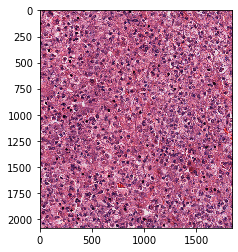

In [9]:
import scipy.misc
import matplotlib
EXTERNAL_DIR ='D:\\HCCW\\hcc2'
EXTERNAL_id=next(os.walk(EXTERNAL_DIR))[1]
for i in range(len(EXTERNAL_id)):
    inner_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i])
    inner_id=next(os.walk(inner_path))[1]
    for j in range(len(inner_id)):
        image_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j],"image.svs")
        at_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j],'CT.xml')
        if os.path.exists(at_path):
            print(image_path)
            image= open_slide(image_path)
            regions = get_regions(at_path)
            #有的region是三个
            print(image_path)
            print(regions)
            contours=[]
            for k in range(len(regions)):
                x,y,w,h = coordinate_regions(regions[k])
                print(regions[k])
                m=regions[k]
                region=[]
                for n in range(len(m)):
                    a = m[n][0]-x
                    b = m[n][1]-y
                    region.append((a,b))
                print(region)
                contours.append(region)
                if w>25000 or h>25000:
                    continue
                img = np.array(image.read_region((x,y),0,(w,h)))
                plt.imshow(img)
                r, g, b, a = cv2.split(img)
                imgs = cv2.merge([r, g, b])
                images = Image.new('L',(w,h))
                ImageDraw.Draw(images).polygon(region, outline=1, fill=1)
                mask=images
                im=np.array(mask)
                masked=cv2.bitwise_or(imgs,imgs,mask=im)
                file_path= os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j],"Cc"+str(k)+"_CTROI.tiff")
                matplotlib.image.imsave(file_path, masked)     


In [37]:
# def crop(image, H, W):

# 	# if image size is smaller than crop size, pad the image
#     n_y, n_x = image.shape[:2]
#     print(n_y,n_x)
#     pad_y = max(H-n_y, 0)
#     pad_x = max(W-n_x, 0)
#     image = np.pad(image, [(pad_y//2, pad_y-pad_y//2), (pad_x//2, pad_x-pad_x//2), (0, 0)], 'constant', constant_values=[(0,0)])
#     n_y, n_x = image.shape[:2]
#     print(n_y, n_x)
#     num_steps_y = math.ceil(n_y/H)
#     num_steps_x = math.ceil(n_x/W)
#     for i in np.linspace(0, n_y-H, num_steps_y, dtype=int):
#         for j in np.linspace(0, n_x-W, num_steps_x, dtype=int):
             
#             yield image[i:i+H, j:j+W]
#             print((i+H,j+W))       
            
            

In [12]:
def crop(image, H, W):

	# if image size is smaller than crop size, pad the image
    n_y, n_x = image.shape[:2]
    print(n_y,n_x)
#     pad_y = max(H-n_y, 0)
#     pad_x = max(W-n_x, 0)
    #需要补充的大小
    num_steps_y = math.ceil(n_y/H)
    num_steps_x = math.ceil(n_x/W)
    pad_y = max(num_steps_y*H-n_y, 0)
    pad_x = max(num_steps_x*W-n_x, 0)    
    image = np.pad(image, [(pad_y//2, pad_y-pad_y//2), (pad_x//2, pad_x-pad_x//2), (0, 0)], 'constant', constant_values=[(0,0)])
    n_y, n_x = image.shape[:2]
    num_steps_y = math.ceil(n_y/H)
    num_steps_x = math.ceil(n_x/W)
    for i in np.linspace(0, n_y-H, num_steps_y, dtype=int):
        for j in np.linspace(0, n_x-W, num_steps_x, dtype=int):
            yield image[i:i+H, j:j+W]
            print((i+H,j+W))       
            
            

In [13]:
import utilities
import math
import os
HEIGHTS = 1024
WIDTHS = 1024
EXTERNAL_DIR ='E:\\HCC\\hahaa'
OS=[]

EXTERNAL_id=next(os.walk(EXTERNAL_DIR))[1]
for i in range(len(EXTERNAL_id)):
    inner_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i])
    inner_id=next(os.walk(inner_path))[1]
    for j in range(len(inner_id)):
        image_paths=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j])
        dirs = os.listdir(image_paths)
        for k in dirs:
            if os.path.splitext(k)[1] == ".tiff":  
                image_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j],k)     
                image=cv2.imread(image_path)
                image = utilities.normalize_image(image)
                prefix = 'gray' if np.all(image[:,:,0]==image[:,:,1]) else 'color'
                cnt = 0
                c=[]
                for image_crop in crop(image,HEIGHTS, WIDTHS):
                    folder_path = os.path.join( EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j],os.path.splitext(k)[0]+"_",str(cnt))
                    os.makedirs(folder_path, exist_ok=False)
                    cv2.imwrite(os.path.join(folder_path, 'image.tiff'), image_crop)
                    image_p=os.path.join(folder_path, 'image.tiff')
                    img = Image.open(image_p)
                    print(image_p)
                    if not img.getbbox():
                        OS.append(image_p)
                    cnt += 1
print(OS)                    

20274 18395
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\0\image.tiff
(1024, 1024)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\1\image.tiff
(1024, 2048)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\2\image.tiff
(1024, 3072)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\3\image.tiff
(1024, 4096)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\4\image.tiff
(1024, 5120)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\5\image.tiff
(1024, 6144)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\6\image.tiff
(1024, 7168)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\7\image.tiff
(1024, 8192)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\8\image.tiff
(1024, 9216)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\9\image.tiff
(1024, 10240)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\C

E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\87\image.tiff
(5120, 16384)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\88\image.tiff
(5120, 17408)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\89\image.tiff
(5120, 18432)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\90\image.tiff
(6144, 1024)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\91\image.tiff
(6144, 2048)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\92\image.tiff
(6144, 3072)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\93\image.tiff
(6144, 4096)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\94\image.tiff
(6144, 5120)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\95\image.tiff
(6144, 6144)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\96\image.tiff
(6144, 7168)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\C

E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\173\image.tiff
(10240, 12288)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\174\image.tiff
(10240, 13312)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\175\image.tiff
(10240, 14336)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\176\image.tiff
(10240, 15360)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\177\image.tiff
(10240, 16384)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\178\image.tiff
(10240, 17408)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\179\image.tiff
(10240, 18432)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\180\image.tiff
(11264, 1024)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\181\image.tiff
(11264, 2048)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\182\image.tiff
(11264, 3072)
E:\HCC\hahaa\12-58\bc9e5af5-293f-

E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\258\image.tiff
(15360, 7168)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\259\image.tiff
(15360, 8192)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\260\image.tiff
(15360, 9216)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\261\image.tiff
(15360, 10240)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\262\image.tiff
(15360, 11264)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\263\image.tiff
(15360, 12288)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\264\image.tiff
(15360, 13312)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\265\image.tiff
(15360, 14336)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\266\image.tiff
(15360, 15360)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\267\image.tiff
(15360, 16384)
E:\HCC\hahaa\12-58\bc9e5af5-293f-

(20480, 3072)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\345\image.tiff
(20480, 4096)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\346\image.tiff
(20480, 5120)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\347\image.tiff
(20480, 6144)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\348\image.tiff
(20480, 7168)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\349\image.tiff
(20480, 8192)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\350\image.tiff
(20480, 9216)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\351\image.tiff
(20480, 10240)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\352\image.tiff
(20480, 11264)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\353\image.tiff
(20480, 12288)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Cc0_CTROI_\354\image.tiff
(20480, 13312)
E:\HCC\hahaa\12-58\bc9

E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Ii1_IMROI_\74\image.tiff
(6144, 5120)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Ii1_IMROI_\75\image.tiff
(6144, 6144)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Ii1_IMROI_\76\image.tiff
(6144, 7168)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Ii1_IMROI_\77\image.tiff
(6144, 8192)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Ii1_IMROI_\78\image.tiff
(6144, 9216)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Ii1_IMROI_\79\image.tiff
(6144, 10240)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Ii1_IMROI_\80\image.tiff
(6144, 11264)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Ii1_IMROI_\81\image.tiff
(6144, 12288)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Ii1_IMROI_\82\image.tiff
(6144, 13312)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672\Ii1_IMROI_\83\image.tiff
(6144, 14336)
E:\HCC\hahaa\12-58\bc9e5af5-293f-402c-9d29-883f711bf672

E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\22\image.tiff
(2048, 5120)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\23\image.tiff
(2048, 6144)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\24\image.tiff
(2048, 7168)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\25\image.tiff
(2048, 8192)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\26\image.tiff
(2048, 9216)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\27\image.tiff
(2048, 10240)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\28\image.tiff
(2048, 11264)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\29\image.tiff
(2048, 12288)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\30\image.tiff
(2048, 13312)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\31\image.tiff
(2048, 14336)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001

E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\109\image.tiff
(7168, 2048)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\110\image.tiff
(7168, 3072)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\111\image.tiff
(7168, 4096)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\112\image.tiff
(7168, 5120)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\113\image.tiff
(7168, 6144)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\114\image.tiff
(7168, 7168)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\115\image.tiff
(7168, 8192)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\116\image.tiff
(7168, 9216)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\117\image.tiff
(7168, 10240)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\118\image.tiff
(7168, 11264)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca

E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\195\image.tiff
(11264, 16384)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\196\image.tiff
(11264, 17408)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\197\image.tiff
(11264, 18432)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\198\image.tiff
(12288, 1024)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\199\image.tiff
(12288, 2048)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\200\image.tiff
(12288, 3072)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\201\image.tiff
(12288, 4096)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\202\image.tiff
(12288, 5120)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\203\image.tiff
(12288, 6144)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\204\image.tiff
(12288, 7168)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3

E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\280\image.tiff
(16384, 11264)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\281\image.tiff
(16384, 12288)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\282\image.tiff
(16384, 13312)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\283\image.tiff
(16384, 14336)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\284\image.tiff
(16384, 15360)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\285\image.tiff
(16384, 16384)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\286\image.tiff
(16384, 17408)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\287\image.tiff
(16384, 18432)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\288\image.tiff
(17408, 1024)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Aa0_ATROI_\289\image.tiff
(17408, 2048)
E:\HCC\hahaa\12-58\d36b150a-b813

E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Cc0_CTROI_\43\image.tiff
(4096, 8192)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Cc0_CTROI_\44\image.tiff
(4096, 9216)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Cc0_CTROI_\45\image.tiff
(4096, 10240)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Cc0_CTROI_\46\image.tiff
(4096, 11264)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Cc0_CTROI_\47\image.tiff
(4096, 12288)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Cc0_CTROI_\48\image.tiff
(5120, 1024)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Cc0_CTROI_\49\image.tiff
(5120, 2048)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Cc0_CTROI_\50\image.tiff
(5120, 3072)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Cc0_CTROI_\51\image.tiff
(5120, 4096)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Cc0_CTROI_\52\image.tiff
(5120, 5120)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\C

E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Cc0_CTROI_\131\image.tiff
(11264, 12288)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Cc0_CTROI_\132\image.tiff
(12288, 1024)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Cc0_CTROI_\133\image.tiff
(12288, 2048)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Cc0_CTROI_\134\image.tiff
(12288, 3072)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Cc0_CTROI_\135\image.tiff
(12288, 4096)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Cc0_CTROI_\136\image.tiff
(12288, 5120)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Cc0_CTROI_\137\image.tiff
(12288, 6144)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Cc0_CTROI_\138\image.tiff
(12288, 7168)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Cc0_CTROI_\139\image.tiff
(12288, 8192)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a043-f9bca6164001\Cc0_CTROI_\140\image.tiff
(12288, 9216)
E:\HCC\hahaa\12-58\d36b150a-b813-4bd3-a

E:\HCC\hahaa\142\fcfe68f4-5e27-4ff0-ad91-450e6fd4a047\Aa1_ATROI_\15\image.tiff
(2048, 6144)
E:\HCC\hahaa\142\fcfe68f4-5e27-4ff0-ad91-450e6fd4a047\Aa1_ATROI_\16\image.tiff
(2048, 7168)
E:\HCC\hahaa\142\fcfe68f4-5e27-4ff0-ad91-450e6fd4a047\Aa1_ATROI_\17\image.tiff
(2048, 8192)
E:\HCC\hahaa\142\fcfe68f4-5e27-4ff0-ad91-450e6fd4a047\Aa1_ATROI_\18\image.tiff
(2048, 9216)
E:\HCC\hahaa\142\fcfe68f4-5e27-4ff0-ad91-450e6fd4a047\Aa1_ATROI_\19\image.tiff
(2048, 10240)
E:\HCC\hahaa\142\fcfe68f4-5e27-4ff0-ad91-450e6fd4a047\Aa1_ATROI_\20\image.tiff
(3072, 1024)
E:\HCC\hahaa\142\fcfe68f4-5e27-4ff0-ad91-450e6fd4a047\Aa1_ATROI_\21\image.tiff
(3072, 2048)
E:\HCC\hahaa\142\fcfe68f4-5e27-4ff0-ad91-450e6fd4a047\Aa1_ATROI_\22\image.tiff
(3072, 3072)
E:\HCC\hahaa\142\fcfe68f4-5e27-4ff0-ad91-450e6fd4a047\Aa1_ATROI_\23\image.tiff
(3072, 4096)
E:\HCC\hahaa\142\fcfe68f4-5e27-4ff0-ad91-450e6fd4a047\Aa1_ATROI_\24\image.tiff
(3072, 5120)
E:\HCC\hahaa\142\fcfe68f4-5e27-4ff0-ad91-450e6fd4a047\Aa1_ATROI_\25\image.tiff


E:\HCC\hahaa\142\fcfe68f4-5e27-4ff0-ad91-450e6fd4a047\Aa1_ATROI_\104\image.tiff
(11264, 5120)
E:\HCC\hahaa\142\fcfe68f4-5e27-4ff0-ad91-450e6fd4a047\Aa1_ATROI_\105\image.tiff
(11264, 6144)
E:\HCC\hahaa\142\fcfe68f4-5e27-4ff0-ad91-450e6fd4a047\Aa1_ATROI_\106\image.tiff
(11264, 7168)
E:\HCC\hahaa\142\fcfe68f4-5e27-4ff0-ad91-450e6fd4a047\Aa1_ATROI_\107\image.tiff
(11264, 8192)
E:\HCC\hahaa\142\fcfe68f4-5e27-4ff0-ad91-450e6fd4a047\Aa1_ATROI_\108\image.tiff
(11264, 9216)
E:\HCC\hahaa\142\fcfe68f4-5e27-4ff0-ad91-450e6fd4a047\Aa1_ATROI_\109\image.tiff
(11264, 10240)
E:\HCC\hahaa\142\fcfe68f4-5e27-4ff0-ad91-450e6fd4a047\Aa1_ATROI_\110\image.tiff
(12288, 1024)
E:\HCC\hahaa\142\fcfe68f4-5e27-4ff0-ad91-450e6fd4a047\Aa1_ATROI_\111\image.tiff
(12288, 2048)
E:\HCC\hahaa\142\fcfe68f4-5e27-4ff0-ad91-450e6fd4a047\Aa1_ATROI_\112\image.tiff
(12288, 3072)
E:\HCC\hahaa\142\fcfe68f4-5e27-4ff0-ad91-450e6fd4a047\Aa1_ATROI_\113\image.tiff
(12288, 4096)
E:\HCC\hahaa\142\fcfe68f4-5e27-4ff0-ad91-450e6fd4a047\Aa1_A

E:\HCC\hahaa\142\fcfe68f4-5e27-4ff0-ad91-450e6fd4a047\Aa1_ATROI_\192\image.tiff
(20480, 3072)
E:\HCC\hahaa\142\fcfe68f4-5e27-4ff0-ad91-450e6fd4a047\Aa1_ATROI_\193\image.tiff
(20480, 4096)
E:\HCC\hahaa\142\fcfe68f4-5e27-4ff0-ad91-450e6fd4a047\Aa1_ATROI_\194\image.tiff
(20480, 5120)
E:\HCC\hahaa\142\fcfe68f4-5e27-4ff0-ad91-450e6fd4a047\Aa1_ATROI_\195\image.tiff
(20480, 6144)
E:\HCC\hahaa\142\fcfe68f4-5e27-4ff0-ad91-450e6fd4a047\Aa1_ATROI_\196\image.tiff
(20480, 7168)
E:\HCC\hahaa\142\fcfe68f4-5e27-4ff0-ad91-450e6fd4a047\Aa1_ATROI_\197\image.tiff
(20480, 8192)
E:\HCC\hahaa\142\fcfe68f4-5e27-4ff0-ad91-450e6fd4a047\Aa1_ATROI_\198\image.tiff
(20480, 9216)
E:\HCC\hahaa\142\fcfe68f4-5e27-4ff0-ad91-450e6fd4a047\Aa1_ATROI_\199\image.tiff
(20480, 10240)
E:\HCC\hahaa\142\fcfe68f4-5e27-4ff0-ad91-450e6fd4a047\Aa1_ATROI_\200\image.tiff
(21504, 1024)
E:\HCC\hahaa\142\fcfe68f4-5e27-4ff0-ad91-450e6fd4a047\Aa1_ATROI_\201\image.tiff
(21504, 2048)
E:\HCC\hahaa\142\fcfe68f4-5e27-4ff0-ad91-450e6fd4a047\Aa1_A

(2048, 2048)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\26\image.tiff
(2048, 3072)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\27\image.tiff
(2048, 4096)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\28\image.tiff
(2048, 5120)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\29\image.tiff
(2048, 6144)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\30\image.tiff
(2048, 7168)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\31\image.tiff
(2048, 8192)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\32\image.tiff
(2048, 9216)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\33\image.tiff
(2048, 10240)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\34\image.tiff
(2048, 11264)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\35\image.tiff
(2048, 12288)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_

E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\116\image.tiff
(5120, 21504)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\117\image.tiff
(5120, 22528)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\118\image.tiff
(5120, 23552)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\119\image.tiff
(5120, 24576)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\120\image.tiff
(6144, 1024)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\121\image.tiff
(6144, 2048)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\122\image.tiff
(6144, 3072)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\123\image.tiff
(6144, 4096)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\124\image.tiff
(6144, 5120)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\125\image.tiff
(6144, 6144)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\1

E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\205\image.tiff
(9216, 14336)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\206\image.tiff
(9216, 15360)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\207\image.tiff
(9216, 16384)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\208\image.tiff
(9216, 17408)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\209\image.tiff
(9216, 18432)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\210\image.tiff
(9216, 19456)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\211\image.tiff
(9216, 20480)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\212\image.tiff
(9216, 21504)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\213\image.tiff
(9216, 22528)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\214\image.tiff
(9216, 23552)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_AT

E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\292\image.tiff
(13312, 5120)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\293\image.tiff
(13312, 6144)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\294\image.tiff
(13312, 7168)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\295\image.tiff
(13312, 8192)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\296\image.tiff
(13312, 9216)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\297\image.tiff
(13312, 10240)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\298\image.tiff
(13312, 11264)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\299\image.tiff
(13312, 12288)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\300\image.tiff
(13312, 13312)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Aa2_ATROI_\301\image.tiff
(13312, 14336)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\A

E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Ii1_IMROI_\20\image.tiff
(4096, 3072)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Ii1_IMROI_\21\image.tiff
(4096, 4096)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Ii1_IMROI_\22\image.tiff
(4096, 5120)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Ii1_IMROI_\23\image.tiff
(4096, 6144)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Ii1_IMROI_\24\image.tiff
(5120, 1024)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Ii1_IMROI_\25\image.tiff
(5120, 2048)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Ii1_IMROI_\26\image.tiff
(5120, 3072)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Ii1_IMROI_\27\image.tiff
(5120, 4096)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Ii1_IMROI_\28\image.tiff
(5120, 5120)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Ii1_IMROI_\29\image.tiff
(5120, 6144)
E:\HCC\hahaa\142\fe040c77-cb9a-4b2a-899c-199ce8d875dc\Ii1_IMROI_\30\image.tiff
(

In [2]:
import os
import shutil
EXTERNAL_DIR ='D:\\HCCW\\HCCS'
EXTERNAL_id=next(os.walk(EXTERNAL_DIR))[1]
for i in range(len(EXTERNAL_id)):
    inner_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i])
    inner_id=next(os.walk(inner_path))[1]
    for j in range(len(inner_id)):
        image_paths=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j])
        inner=next(os.walk(image_paths))[1]
        print(inner)
        for k in range(len(inner)):
            folder_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j],inner[k])
            image_p = next(os.walk(folder_path))[1]
            for n in range(len(image_p)):
                image_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j],inner[k],image_p[n])
                print(image_path)
                images_p=os.path.join(image_path, 'image.png')
                if os.path.exists(images_p):
                    img = Image.open(images_p)
                    if not img.getbbox():
                        shutil.rmtree(image_path)

['Aa0_ATROI_', 'Cc0_CTROI_', 'Cc1_CTROI_', 'Cc2_CTROI_', 'Ii0_IMROI_']
D:\HCCW\HCC\1-7\0c75eb22-f8d8-4f34-8488-95e412ccbf89\Aa0_ATROI_\0
D:\HCCW\HCC\1-7\0c75eb22-f8d8-4f34-8488-95e412ccbf89\Aa0_ATROI_\1
D:\HCCW\HCC\1-7\0c75eb22-f8d8-4f34-8488-95e412ccbf89\Aa0_ATROI_\10
D:\HCCW\HCC\1-7\0c75eb22-f8d8-4f34-8488-95e412ccbf89\Aa0_ATROI_\100
D:\HCCW\HCC\1-7\0c75eb22-f8d8-4f34-8488-95e412ccbf89\Aa0_ATROI_\101
D:\HCCW\HCC\1-7\0c75eb22-f8d8-4f34-8488-95e412ccbf89\Aa0_ATROI_\102
D:\HCCW\HCC\1-7\0c75eb22-f8d8-4f34-8488-95e412ccbf89\Aa0_ATROI_\103
D:\HCCW\HCC\1-7\0c75eb22-f8d8-4f34-8488-95e412ccbf89\Aa0_ATROI_\104
D:\HCCW\HCC\1-7\0c75eb22-f8d8-4f34-8488-95e412ccbf89\Aa0_ATROI_\105
D:\HCCW\HCC\1-7\0c75eb22-f8d8-4f34-8488-95e412ccbf89\Aa0_ATROI_\106
D:\HCCW\HCC\1-7\0c75eb22-f8d8-4f34-8488-95e412ccbf89\Aa0_ATROI_\107
D:\HCCW\HCC\1-7\0c75eb22-f8d8-4f34-8488-95e412ccbf89\Aa0_ATROI_\108
D:\HCCW\HCC\1-7\0c75eb22-f8d8-4f34-8488-95e412ccbf89\Aa0_ATROI_\109
D:\HCCW\HCC\1-7\0c75eb22-f8d8-4f34-8488-95e412ccbf

D:\HCCW\HCC\1-7\1563880c-95c1-47cb-98dd-c3566adafbe6\Aa1_ATROI_\0
D:\HCCW\HCC\1-7\1563880c-95c1-47cb-98dd-c3566adafbe6\Aa1_ATROI_\1
D:\HCCW\HCC\1-7\1563880c-95c1-47cb-98dd-c3566adafbe6\Aa1_ATROI_\10
D:\HCCW\HCC\1-7\1563880c-95c1-47cb-98dd-c3566adafbe6\Aa1_ATROI_\11
D:\HCCW\HCC\1-7\1563880c-95c1-47cb-98dd-c3566adafbe6\Aa1_ATROI_\12
D:\HCCW\HCC\1-7\1563880c-95c1-47cb-98dd-c3566adafbe6\Aa1_ATROI_\13
D:\HCCW\HCC\1-7\1563880c-95c1-47cb-98dd-c3566adafbe6\Aa1_ATROI_\14
D:\HCCW\HCC\1-7\1563880c-95c1-47cb-98dd-c3566adafbe6\Aa1_ATROI_\15
D:\HCCW\HCC\1-7\1563880c-95c1-47cb-98dd-c3566adafbe6\Aa1_ATROI_\16
D:\HCCW\HCC\1-7\1563880c-95c1-47cb-98dd-c3566adafbe6\Aa1_ATROI_\17
D:\HCCW\HCC\1-7\1563880c-95c1-47cb-98dd-c3566adafbe6\Aa1_ATROI_\18
D:\HCCW\HCC\1-7\1563880c-95c1-47cb-98dd-c3566adafbe6\Aa1_ATROI_\19
D:\HCCW\HCC\1-7\1563880c-95c1-47cb-98dd-c3566adafbe6\Aa1_ATROI_\2
D:\HCCW\HCC\1-7\1563880c-95c1-47cb-98dd-c3566adafbe6\Aa1_ATROI_\20
D:\HCCW\HCC\1-7\1563880c-95c1-47cb-98dd-c3566adafbe6\Aa1_ATROI_\2

D:\HCCW\HCC\1-7\1563880c-95c1-47cb-98dd-c3566adafbe6\Ii0_IMROI_\73
D:\HCCW\HCC\1-7\1563880c-95c1-47cb-98dd-c3566adafbe6\Ii0_IMROI_\74
D:\HCCW\HCC\1-7\1563880c-95c1-47cb-98dd-c3566adafbe6\Ii0_IMROI_\75
D:\HCCW\HCC\1-7\1563880c-95c1-47cb-98dd-c3566adafbe6\Ii0_IMROI_\76
D:\HCCW\HCC\1-7\1563880c-95c1-47cb-98dd-c3566adafbe6\Ii0_IMROI_\77
D:\HCCW\HCC\1-7\1563880c-95c1-47cb-98dd-c3566adafbe6\Ii0_IMROI_\78
D:\HCCW\HCC\1-7\1563880c-95c1-47cb-98dd-c3566adafbe6\Ii0_IMROI_\79
D:\HCCW\HCC\1-7\1563880c-95c1-47cb-98dd-c3566adafbe6\Ii0_IMROI_\8
D:\HCCW\HCC\1-7\1563880c-95c1-47cb-98dd-c3566adafbe6\Ii0_IMROI_\80
D:\HCCW\HCC\1-7\1563880c-95c1-47cb-98dd-c3566adafbe6\Ii0_IMROI_\81
D:\HCCW\HCC\1-7\1563880c-95c1-47cb-98dd-c3566adafbe6\Ii0_IMROI_\82
D:\HCCW\HCC\1-7\1563880c-95c1-47cb-98dd-c3566adafbe6\Ii0_IMROI_\83
D:\HCCW\HCC\1-7\1563880c-95c1-47cb-98dd-c3566adafbe6\Ii0_IMROI_\84
D:\HCCW\HCC\1-7\1563880c-95c1-47cb-98dd-c3566adafbe6\Ii0_IMROI_\85
D:\HCCW\HCC\1-7\1563880c-95c1-47cb-98dd-c3566adafbe6\Ii0_IMROI_

D:\HCCW\HCC\1-7\213cda74-5f5d-4325-be39-2d726bb6f4ec\Aa2_ATROI_\219
D:\HCCW\HCC\1-7\213cda74-5f5d-4325-be39-2d726bb6f4ec\Aa2_ATROI_\22
D:\HCCW\HCC\1-7\213cda74-5f5d-4325-be39-2d726bb6f4ec\Aa2_ATROI_\220
D:\HCCW\HCC\1-7\213cda74-5f5d-4325-be39-2d726bb6f4ec\Aa2_ATROI_\221
D:\HCCW\HCC\1-7\213cda74-5f5d-4325-be39-2d726bb6f4ec\Aa2_ATROI_\222
D:\HCCW\HCC\1-7\213cda74-5f5d-4325-be39-2d726bb6f4ec\Aa2_ATROI_\223
D:\HCCW\HCC\1-7\213cda74-5f5d-4325-be39-2d726bb6f4ec\Aa2_ATROI_\224
D:\HCCW\HCC\1-7\213cda74-5f5d-4325-be39-2d726bb6f4ec\Aa2_ATROI_\225
D:\HCCW\HCC\1-7\213cda74-5f5d-4325-be39-2d726bb6f4ec\Aa2_ATROI_\226
D:\HCCW\HCC\1-7\213cda74-5f5d-4325-be39-2d726bb6f4ec\Aa2_ATROI_\227
D:\HCCW\HCC\1-7\213cda74-5f5d-4325-be39-2d726bb6f4ec\Aa2_ATROI_\228
D:\HCCW\HCC\1-7\213cda74-5f5d-4325-be39-2d726bb6f4ec\Aa2_ATROI_\229
D:\HCCW\HCC\1-7\213cda74-5f5d-4325-be39-2d726bb6f4ec\Aa2_ATROI_\23
D:\HCCW\HCC\1-7\213cda74-5f5d-4325-be39-2d726bb6f4ec\Aa2_ATROI_\230
D:\HCCW\HCC\1-7\213cda74-5f5d-4325-be39-2d726bb6f4

D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Aa0_ATROI_\137
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Aa0_ATROI_\138
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Aa0_ATROI_\139
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Aa0_ATROI_\14
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Aa0_ATROI_\140
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Aa0_ATROI_\141
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Aa0_ATROI_\142
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Aa0_ATROI_\143
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Aa0_ATROI_\144
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Aa0_ATROI_\145
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Aa0_ATROI_\146
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Aa0_ATROI_\147
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Aa0_ATROI_\148
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Aa0_ATROI_\149
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd0

D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Cc0_CTROI_\228
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Cc0_CTROI_\229
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Cc0_CTROI_\23
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Cc0_CTROI_\230
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Cc0_CTROI_\231
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Cc0_CTROI_\232
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Cc0_CTROI_\233
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Cc0_CTROI_\24
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Cc0_CTROI_\25
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Cc0_CTROI_\26
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Cc0_CTROI_\27
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Cc0_CTROI_\28
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Cc0_CTROI_\29
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Cc0_CTROI_\3
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Cc0_

D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Ii0_IMROI_\154
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Ii0_IMROI_\155
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Ii0_IMROI_\156
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Ii0_IMROI_\157
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Ii0_IMROI_\158
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Ii0_IMROI_\159
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Ii0_IMROI_\16
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Ii0_IMROI_\160
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Ii0_IMROI_\161
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Ii0_IMROI_\162
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Ii0_IMROI_\163
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Ii0_IMROI_\164
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Ii0_IMROI_\165
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd03b8\Ii0_IMROI_\166
D:\HCCW\HCC\1-7\5111a997-afae-465c-a38d-e18c59dd0

D:\HCCW\HCC\1-7\52052680-55ec-4e02-9e8c-21ef6812baae\Aa0_ATROI_\83
D:\HCCW\HCC\1-7\52052680-55ec-4e02-9e8c-21ef6812baae\Aa0_ATROI_\84
D:\HCCW\HCC\1-7\52052680-55ec-4e02-9e8c-21ef6812baae\Aa0_ATROI_\85
D:\HCCW\HCC\1-7\52052680-55ec-4e02-9e8c-21ef6812baae\Aa0_ATROI_\86
D:\HCCW\HCC\1-7\52052680-55ec-4e02-9e8c-21ef6812baae\Aa0_ATROI_\87
D:\HCCW\HCC\1-7\52052680-55ec-4e02-9e8c-21ef6812baae\Aa0_ATROI_\88
D:\HCCW\HCC\1-7\52052680-55ec-4e02-9e8c-21ef6812baae\Aa0_ATROI_\89
D:\HCCW\HCC\1-7\52052680-55ec-4e02-9e8c-21ef6812baae\Aa0_ATROI_\9
D:\HCCW\HCC\1-7\52052680-55ec-4e02-9e8c-21ef6812baae\Aa0_ATROI_\90
D:\HCCW\HCC\1-7\52052680-55ec-4e02-9e8c-21ef6812baae\Aa0_ATROI_\91
D:\HCCW\HCC\1-7\52052680-55ec-4e02-9e8c-21ef6812baae\Aa0_ATROI_\92
D:\HCCW\HCC\1-7\52052680-55ec-4e02-9e8c-21ef6812baae\Aa0_ATROI_\93
D:\HCCW\HCC\1-7\52052680-55ec-4e02-9e8c-21ef6812baae\Aa0_ATROI_\94
D:\HCCW\HCC\1-7\52052680-55ec-4e02-9e8c-21ef6812baae\Aa0_ATROI_\95
D:\HCCW\HCC\1-7\52052680-55ec-4e02-9e8c-21ef6812baae\Aa0_ATROI_

D:\HCCW\HCC\1-7\5433ac16-36f9-46c5-a0bf-5ab37bd74a23\Aa2_ATROI_\62
D:\HCCW\HCC\1-7\5433ac16-36f9-46c5-a0bf-5ab37bd74a23\Aa2_ATROI_\63
D:\HCCW\HCC\1-7\5433ac16-36f9-46c5-a0bf-5ab37bd74a23\Aa2_ATROI_\64
D:\HCCW\HCC\1-7\5433ac16-36f9-46c5-a0bf-5ab37bd74a23\Aa2_ATROI_\65
D:\HCCW\HCC\1-7\5433ac16-36f9-46c5-a0bf-5ab37bd74a23\Aa2_ATROI_\66
D:\HCCW\HCC\1-7\5433ac16-36f9-46c5-a0bf-5ab37bd74a23\Aa2_ATROI_\67
D:\HCCW\HCC\1-7\5433ac16-36f9-46c5-a0bf-5ab37bd74a23\Aa2_ATROI_\68
D:\HCCW\HCC\1-7\5433ac16-36f9-46c5-a0bf-5ab37bd74a23\Aa2_ATROI_\69
D:\HCCW\HCC\1-7\5433ac16-36f9-46c5-a0bf-5ab37bd74a23\Aa2_ATROI_\7
D:\HCCW\HCC\1-7\5433ac16-36f9-46c5-a0bf-5ab37bd74a23\Aa2_ATROI_\70
D:\HCCW\HCC\1-7\5433ac16-36f9-46c5-a0bf-5ab37bd74a23\Aa2_ATROI_\71
D:\HCCW\HCC\1-7\5433ac16-36f9-46c5-a0bf-5ab37bd74a23\Aa2_ATROI_\72
D:\HCCW\HCC\1-7\5433ac16-36f9-46c5-a0bf-5ab37bd74a23\Aa2_ATROI_\73
D:\HCCW\HCC\1-7\5433ac16-36f9-46c5-a0bf-5ab37bd74a23\Aa2_ATROI_\74
D:\HCCW\HCC\1-7\5433ac16-36f9-46c5-a0bf-5ab37bd74a23\Aa2_ATROI_

D:\HCCW\HCC\1-7\66af8c41-00c8-4dd7-8c7e-fe5240a4d6e6\Cc1_CTROI_\242
D:\HCCW\HCC\1-7\66af8c41-00c8-4dd7-8c7e-fe5240a4d6e6\Cc1_CTROI_\243
D:\HCCW\HCC\1-7\66af8c41-00c8-4dd7-8c7e-fe5240a4d6e6\Cc1_CTROI_\244
D:\HCCW\HCC\1-7\66af8c41-00c8-4dd7-8c7e-fe5240a4d6e6\Cc1_CTROI_\245
D:\HCCW\HCC\1-7\66af8c41-00c8-4dd7-8c7e-fe5240a4d6e6\Cc1_CTROI_\246
D:\HCCW\HCC\1-7\66af8c41-00c8-4dd7-8c7e-fe5240a4d6e6\Cc1_CTROI_\247
D:\HCCW\HCC\1-7\66af8c41-00c8-4dd7-8c7e-fe5240a4d6e6\Cc1_CTROI_\248
D:\HCCW\HCC\1-7\66af8c41-00c8-4dd7-8c7e-fe5240a4d6e6\Cc1_CTROI_\249
D:\HCCW\HCC\1-7\66af8c41-00c8-4dd7-8c7e-fe5240a4d6e6\Cc1_CTROI_\25
D:\HCCW\HCC\1-7\66af8c41-00c8-4dd7-8c7e-fe5240a4d6e6\Cc1_CTROI_\250
D:\HCCW\HCC\1-7\66af8c41-00c8-4dd7-8c7e-fe5240a4d6e6\Cc1_CTROI_\251
D:\HCCW\HCC\1-7\66af8c41-00c8-4dd7-8c7e-fe5240a4d6e6\Cc1_CTROI_\252
D:\HCCW\HCC\1-7\66af8c41-00c8-4dd7-8c7e-fe5240a4d6e6\Cc1_CTROI_\253
D:\HCCW\HCC\1-7\66af8c41-00c8-4dd7-8c7e-fe5240a4d6e6\Cc1_CTROI_\254
D:\HCCW\HCC\1-7\66af8c41-00c8-4dd7-8c7e-fe5240a4d

D:\HCCW\HCC\1-7\6965cc90-e649-4c7f-9f6b-45e51f7b19b0\Aa3_ATROI_\34
D:\HCCW\HCC\1-7\6965cc90-e649-4c7f-9f6b-45e51f7b19b0\Aa3_ATROI_\35
D:\HCCW\HCC\1-7\6965cc90-e649-4c7f-9f6b-45e51f7b19b0\Aa3_ATROI_\36
D:\HCCW\HCC\1-7\6965cc90-e649-4c7f-9f6b-45e51f7b19b0\Aa3_ATROI_\37
D:\HCCW\HCC\1-7\6965cc90-e649-4c7f-9f6b-45e51f7b19b0\Aa3_ATROI_\38
D:\HCCW\HCC\1-7\6965cc90-e649-4c7f-9f6b-45e51f7b19b0\Aa3_ATROI_\39
D:\HCCW\HCC\1-7\6965cc90-e649-4c7f-9f6b-45e51f7b19b0\Aa3_ATROI_\4
D:\HCCW\HCC\1-7\6965cc90-e649-4c7f-9f6b-45e51f7b19b0\Aa3_ATROI_\40
D:\HCCW\HCC\1-7\6965cc90-e649-4c7f-9f6b-45e51f7b19b0\Aa3_ATROI_\41
D:\HCCW\HCC\1-7\6965cc90-e649-4c7f-9f6b-45e51f7b19b0\Aa3_ATROI_\42
D:\HCCW\HCC\1-7\6965cc90-e649-4c7f-9f6b-45e51f7b19b0\Aa3_ATROI_\43
D:\HCCW\HCC\1-7\6965cc90-e649-4c7f-9f6b-45e51f7b19b0\Aa3_ATROI_\44
D:\HCCW\HCC\1-7\6965cc90-e649-4c7f-9f6b-45e51f7b19b0\Aa3_ATROI_\45
D:\HCCW\HCC\1-7\6965cc90-e649-4c7f-9f6b-45e51f7b19b0\Aa3_ATROI_\46
D:\HCCW\HCC\1-7\6965cc90-e649-4c7f-9f6b-45e51f7b19b0\Aa3_ATROI_

D:\HCCW\HCC\1-7\9522e3b2-215d-4391-a1ff-560852e1920b\Aa0_ATROI_\78
D:\HCCW\HCC\1-7\9522e3b2-215d-4391-a1ff-560852e1920b\Aa0_ATROI_\79
D:\HCCW\HCC\1-7\9522e3b2-215d-4391-a1ff-560852e1920b\Aa0_ATROI_\8
D:\HCCW\HCC\1-7\9522e3b2-215d-4391-a1ff-560852e1920b\Aa0_ATROI_\80
D:\HCCW\HCC\1-7\9522e3b2-215d-4391-a1ff-560852e1920b\Aa0_ATROI_\81
D:\HCCW\HCC\1-7\9522e3b2-215d-4391-a1ff-560852e1920b\Aa0_ATROI_\82
D:\HCCW\HCC\1-7\9522e3b2-215d-4391-a1ff-560852e1920b\Aa0_ATROI_\83
D:\HCCW\HCC\1-7\9522e3b2-215d-4391-a1ff-560852e1920b\Aa0_ATROI_\84
D:\HCCW\HCC\1-7\9522e3b2-215d-4391-a1ff-560852e1920b\Aa0_ATROI_\85
D:\HCCW\HCC\1-7\9522e3b2-215d-4391-a1ff-560852e1920b\Aa0_ATROI_\86
D:\HCCW\HCC\1-7\9522e3b2-215d-4391-a1ff-560852e1920b\Aa0_ATROI_\87
D:\HCCW\HCC\1-7\9522e3b2-215d-4391-a1ff-560852e1920b\Aa0_ATROI_\88
D:\HCCW\HCC\1-7\9522e3b2-215d-4391-a1ff-560852e1920b\Aa0_ATROI_\89
D:\HCCW\HCC\1-7\9522e3b2-215d-4391-a1ff-560852e1920b\Aa0_ATROI_\9
D:\HCCW\HCC\1-7\9522e3b2-215d-4391-a1ff-560852e1920b\Aa0_ATROI_\

D:\HCCW\HCC\1-7\9522e3b2-215d-4391-a1ff-560852e1920b\Ii0_IMROI_\196
D:\HCCW\HCC\1-7\9522e3b2-215d-4391-a1ff-560852e1920b\Ii0_IMROI_\197
D:\HCCW\HCC\1-7\9522e3b2-215d-4391-a1ff-560852e1920b\Ii0_IMROI_\198
D:\HCCW\HCC\1-7\9522e3b2-215d-4391-a1ff-560852e1920b\Ii0_IMROI_\199
D:\HCCW\HCC\1-7\9522e3b2-215d-4391-a1ff-560852e1920b\Ii0_IMROI_\2
D:\HCCW\HCC\1-7\9522e3b2-215d-4391-a1ff-560852e1920b\Ii0_IMROI_\20
D:\HCCW\HCC\1-7\9522e3b2-215d-4391-a1ff-560852e1920b\Ii0_IMROI_\200
D:\HCCW\HCC\1-7\9522e3b2-215d-4391-a1ff-560852e1920b\Ii0_IMROI_\201
D:\HCCW\HCC\1-7\9522e3b2-215d-4391-a1ff-560852e1920b\Ii0_IMROI_\202
D:\HCCW\HCC\1-7\9522e3b2-215d-4391-a1ff-560852e1920b\Ii0_IMROI_\203
D:\HCCW\HCC\1-7\9522e3b2-215d-4391-a1ff-560852e1920b\Ii0_IMROI_\204
D:\HCCW\HCC\1-7\9522e3b2-215d-4391-a1ff-560852e1920b\Ii0_IMROI_\205
D:\HCCW\HCC\1-7\9522e3b2-215d-4391-a1ff-560852e1920b\Ii0_IMROI_\206
D:\HCCW\HCC\1-7\9522e3b2-215d-4391-a1ff-560852e1920b\Ii0_IMROI_\207
D:\HCCW\HCC\1-7\9522e3b2-215d-4391-a1ff-560852e1920

D:\HCCW\HCC\1-7\953354bf-a0a1-4cda-8a5f-8345c9242b35\Cc0_CTROI_\217
D:\HCCW\HCC\1-7\953354bf-a0a1-4cda-8a5f-8345c9242b35\Cc0_CTROI_\218
D:\HCCW\HCC\1-7\953354bf-a0a1-4cda-8a5f-8345c9242b35\Cc0_CTROI_\219
D:\HCCW\HCC\1-7\953354bf-a0a1-4cda-8a5f-8345c9242b35\Cc0_CTROI_\22
D:\HCCW\HCC\1-7\953354bf-a0a1-4cda-8a5f-8345c9242b35\Cc0_CTROI_\220
D:\HCCW\HCC\1-7\953354bf-a0a1-4cda-8a5f-8345c9242b35\Cc0_CTROI_\221
D:\HCCW\HCC\1-7\953354bf-a0a1-4cda-8a5f-8345c9242b35\Cc0_CTROI_\222
D:\HCCW\HCC\1-7\953354bf-a0a1-4cda-8a5f-8345c9242b35\Cc0_CTROI_\223
D:\HCCW\HCC\1-7\953354bf-a0a1-4cda-8a5f-8345c9242b35\Cc0_CTROI_\224
D:\HCCW\HCC\1-7\953354bf-a0a1-4cda-8a5f-8345c9242b35\Cc0_CTROI_\225
D:\HCCW\HCC\1-7\953354bf-a0a1-4cda-8a5f-8345c9242b35\Cc0_CTROI_\226
D:\HCCW\HCC\1-7\953354bf-a0a1-4cda-8a5f-8345c9242b35\Cc0_CTROI_\227
D:\HCCW\HCC\1-7\953354bf-a0a1-4cda-8a5f-8345c9242b35\Cc0_CTROI_\228
D:\HCCW\HCC\1-7\953354bf-a0a1-4cda-8a5f-8345c9242b35\Cc0_CTROI_\229
D:\HCCW\HCC\1-7\953354bf-a0a1-4cda-8a5f-8345c9242

D:\HCCW\HCC\1-7\98816a9a-ad3e-4459-bde0-f77827e6d994\Aa2_ATROI_\109
D:\HCCW\HCC\1-7\98816a9a-ad3e-4459-bde0-f77827e6d994\Aa2_ATROI_\11
D:\HCCW\HCC\1-7\98816a9a-ad3e-4459-bde0-f77827e6d994\Aa2_ATROI_\110
D:\HCCW\HCC\1-7\98816a9a-ad3e-4459-bde0-f77827e6d994\Aa2_ATROI_\111
D:\HCCW\HCC\1-7\98816a9a-ad3e-4459-bde0-f77827e6d994\Aa2_ATROI_\112
D:\HCCW\HCC\1-7\98816a9a-ad3e-4459-bde0-f77827e6d994\Aa2_ATROI_\113
D:\HCCW\HCC\1-7\98816a9a-ad3e-4459-bde0-f77827e6d994\Aa2_ATROI_\114
D:\HCCW\HCC\1-7\98816a9a-ad3e-4459-bde0-f77827e6d994\Aa2_ATROI_\115
D:\HCCW\HCC\1-7\98816a9a-ad3e-4459-bde0-f77827e6d994\Aa2_ATROI_\116
D:\HCCW\HCC\1-7\98816a9a-ad3e-4459-bde0-f77827e6d994\Aa2_ATROI_\117
D:\HCCW\HCC\1-7\98816a9a-ad3e-4459-bde0-f77827e6d994\Aa2_ATROI_\118
D:\HCCW\HCC\1-7\98816a9a-ad3e-4459-bde0-f77827e6d994\Aa2_ATROI_\119
D:\HCCW\HCC\1-7\98816a9a-ad3e-4459-bde0-f77827e6d994\Aa2_ATROI_\12
D:\HCCW\HCC\1-7\98816a9a-ad3e-4459-bde0-f77827e6d994\Aa2_ATROI_\120
D:\HCCW\HCC\1-7\98816a9a-ad3e-4459-bde0-f77827e6d9

D:\HCCW\HCC\1-7\99c69e41-0ebb-4289-bc47-937d7a3b4ef9\Aa1_ATROI_\119
D:\HCCW\HCC\1-7\99c69e41-0ebb-4289-bc47-937d7a3b4ef9\Aa1_ATROI_\12
D:\HCCW\HCC\1-7\99c69e41-0ebb-4289-bc47-937d7a3b4ef9\Aa1_ATROI_\120
D:\HCCW\HCC\1-7\99c69e41-0ebb-4289-bc47-937d7a3b4ef9\Aa1_ATROI_\121
D:\HCCW\HCC\1-7\99c69e41-0ebb-4289-bc47-937d7a3b4ef9\Aa1_ATROI_\122
D:\HCCW\HCC\1-7\99c69e41-0ebb-4289-bc47-937d7a3b4ef9\Aa1_ATROI_\123
D:\HCCW\HCC\1-7\99c69e41-0ebb-4289-bc47-937d7a3b4ef9\Aa1_ATROI_\124
D:\HCCW\HCC\1-7\99c69e41-0ebb-4289-bc47-937d7a3b4ef9\Aa1_ATROI_\125
D:\HCCW\HCC\1-7\99c69e41-0ebb-4289-bc47-937d7a3b4ef9\Aa1_ATROI_\126
D:\HCCW\HCC\1-7\99c69e41-0ebb-4289-bc47-937d7a3b4ef9\Aa1_ATROI_\127
D:\HCCW\HCC\1-7\99c69e41-0ebb-4289-bc47-937d7a3b4ef9\Aa1_ATROI_\128
D:\HCCW\HCC\1-7\99c69e41-0ebb-4289-bc47-937d7a3b4ef9\Aa1_ATROI_\129
D:\HCCW\HCC\1-7\99c69e41-0ebb-4289-bc47-937d7a3b4ef9\Aa1_ATROI_\13
D:\HCCW\HCC\1-7\99c69e41-0ebb-4289-bc47-937d7a3b4ef9\Aa1_ATROI_\130
D:\HCCW\HCC\1-7\99c69e41-0ebb-4289-bc47-937d7a3b4e

D:\HCCW\HCC\1-7\99c69e41-0ebb-4289-bc47-937d7a3b4ef9\Cc2_CTROI_\4
D:\HCCW\HCC\1-7\99c69e41-0ebb-4289-bc47-937d7a3b4ef9\Cc2_CTROI_\40
D:\HCCW\HCC\1-7\99c69e41-0ebb-4289-bc47-937d7a3b4ef9\Cc2_CTROI_\41
D:\HCCW\HCC\1-7\99c69e41-0ebb-4289-bc47-937d7a3b4ef9\Cc2_CTROI_\42
D:\HCCW\HCC\1-7\99c69e41-0ebb-4289-bc47-937d7a3b4ef9\Cc2_CTROI_\43
D:\HCCW\HCC\1-7\99c69e41-0ebb-4289-bc47-937d7a3b4ef9\Cc2_CTROI_\44
D:\HCCW\HCC\1-7\99c69e41-0ebb-4289-bc47-937d7a3b4ef9\Cc2_CTROI_\45
D:\HCCW\HCC\1-7\99c69e41-0ebb-4289-bc47-937d7a3b4ef9\Cc2_CTROI_\46
D:\HCCW\HCC\1-7\99c69e41-0ebb-4289-bc47-937d7a3b4ef9\Cc2_CTROI_\47
D:\HCCW\HCC\1-7\99c69e41-0ebb-4289-bc47-937d7a3b4ef9\Cc2_CTROI_\48
D:\HCCW\HCC\1-7\99c69e41-0ebb-4289-bc47-937d7a3b4ef9\Cc2_CTROI_\49
D:\HCCW\HCC\1-7\99c69e41-0ebb-4289-bc47-937d7a3b4ef9\Cc2_CTROI_\5
D:\HCCW\HCC\1-7\99c69e41-0ebb-4289-bc47-937d7a3b4ef9\Cc2_CTROI_\50
D:\HCCW\HCC\1-7\99c69e41-0ebb-4289-bc47-937d7a3b4ef9\Cc2_CTROI_\51
D:\HCCW\HCC\1-7\99c69e41-0ebb-4289-bc47-937d7a3b4ef9\Cc2_CTROI_\

D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Aa0_ATROI_\23
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Aa0_ATROI_\230
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Aa0_ATROI_\231
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Aa0_ATROI_\232
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Aa0_ATROI_\233
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Aa0_ATROI_\234
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Aa0_ATROI_\235
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Aa0_ATROI_\236
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Aa0_ATROI_\237
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Aa0_ATROI_\238
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Aa0_ATROI_\239
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Aa0_ATROI_\24
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Aa0_ATROI_\240
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Aa0_ATROI_\241
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de

D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Cc1_CTROI_\0
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Cc1_CTROI_\1
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Cc1_CTROI_\10
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Cc1_CTROI_\100
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Cc1_CTROI_\101
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Cc1_CTROI_\102
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Cc1_CTROI_\103
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Cc1_CTROI_\104
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Cc1_CTROI_\105
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Cc1_CTROI_\106
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Cc1_CTROI_\107
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Cc1_CTROI_\108
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Cc1_CTROI_\109
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Cc1_CTROI_\11
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\C

D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Cc4_CTROI_\20
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Cc4_CTROI_\21
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Cc4_CTROI_\22
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Cc4_CTROI_\23
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Cc4_CTROI_\24
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Cc4_CTROI_\25
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Cc4_CTROI_\26
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Cc4_CTROI_\27
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Cc4_CTROI_\28
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Cc4_CTROI_\29
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Cc4_CTROI_\3
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Cc4_CTROI_\30
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Cc4_CTROI_\31
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Cc4_CTROI_\32
D:\HCCW\HCC\1-7\a585eed5-2b0e-4cd3-9e3b-d56d28e1de9f\Cc4_CTROI_

D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Cc0_CTROI_\119
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Cc0_CTROI_\12
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Cc0_CTROI_\120
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Cc0_CTROI_\121
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Cc0_CTROI_\122
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Cc0_CTROI_\123
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Cc0_CTROI_\124
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Cc0_CTROI_\125
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Cc0_CTROI_\126
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Cc0_CTROI_\127
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Cc0_CTROI_\128
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Cc0_CTROI_\129
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Cc0_CTROI_\13
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Cc0_CTROI_\130
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261cc

D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Cc2_CTROI_\188
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Cc2_CTROI_\189
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Cc2_CTROI_\19
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Cc2_CTROI_\190
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Cc2_CTROI_\191
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Cc2_CTROI_\192
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Cc2_CTROI_\193
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Cc2_CTROI_\194
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Cc2_CTROI_\195
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Cc2_CTROI_\196
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Cc2_CTROI_\197
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Cc2_CTROI_\198
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Cc2_CTROI_\199
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Cc2_CTROI_\2
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccf

D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Ii0_IMROI_\199
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Ii0_IMROI_\2
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Ii0_IMROI_\20
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Ii0_IMROI_\200
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Ii0_IMROI_\201
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Ii0_IMROI_\202
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Ii0_IMROI_\203
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Ii0_IMROI_\204
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Ii0_IMROI_\205
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Ii0_IMROI_\206
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Ii0_IMROI_\207
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Ii0_IMROI_\208
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Ii0_IMROI_\209
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc\Ii0_IMROI_\21
D:\HCCW\HCC\1-7\aaa8a746-c25c-4775-8724-2b54a261ccfc

D:\HCCW\HCC\1-7\aaafd3e1-84f1-4c9c-82fc-fbae3abfbc6c\Cc2_CTROI_\41
D:\HCCW\HCC\1-7\aaafd3e1-84f1-4c9c-82fc-fbae3abfbc6c\Cc2_CTROI_\42
D:\HCCW\HCC\1-7\aaafd3e1-84f1-4c9c-82fc-fbae3abfbc6c\Cc2_CTROI_\43
D:\HCCW\HCC\1-7\aaafd3e1-84f1-4c9c-82fc-fbae3abfbc6c\Cc2_CTROI_\44
D:\HCCW\HCC\1-7\aaafd3e1-84f1-4c9c-82fc-fbae3abfbc6c\Cc2_CTROI_\45
D:\HCCW\HCC\1-7\aaafd3e1-84f1-4c9c-82fc-fbae3abfbc6c\Cc2_CTROI_\46
D:\HCCW\HCC\1-7\aaafd3e1-84f1-4c9c-82fc-fbae3abfbc6c\Cc2_CTROI_\47
D:\HCCW\HCC\1-7\aaafd3e1-84f1-4c9c-82fc-fbae3abfbc6c\Cc2_CTROI_\48
D:\HCCW\HCC\1-7\aaafd3e1-84f1-4c9c-82fc-fbae3abfbc6c\Cc2_CTROI_\49
D:\HCCW\HCC\1-7\aaafd3e1-84f1-4c9c-82fc-fbae3abfbc6c\Cc2_CTROI_\5
D:\HCCW\HCC\1-7\aaafd3e1-84f1-4c9c-82fc-fbae3abfbc6c\Cc2_CTROI_\50
D:\HCCW\HCC\1-7\aaafd3e1-84f1-4c9c-82fc-fbae3abfbc6c\Cc2_CTROI_\51
D:\HCCW\HCC\1-7\aaafd3e1-84f1-4c9c-82fc-fbae3abfbc6c\Cc2_CTROI_\52
D:\HCCW\HCC\1-7\aaafd3e1-84f1-4c9c-82fc-fbae3abfbc6c\Cc2_CTROI_\53
D:\HCCW\HCC\1-7\aaafd3e1-84f1-4c9c-82fc-fbae3abfbc6c\Cc2_CTROI_

D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Aa0_ATROI_\10
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Aa0_ATROI_\100
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Aa0_ATROI_\101
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Aa0_ATROI_\102
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Aa0_ATROI_\103
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Aa0_ATROI_\104
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Aa0_ATROI_\105
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Aa0_ATROI_\106
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Aa0_ATROI_\107
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Aa0_ATROI_\108
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Aa0_ATROI_\109
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Aa0_ATROI_\11
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Aa0_ATROI_\110
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Aa0_ATROI_\111
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a

D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Cc0_CTROI_\69
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Cc0_CTROI_\7
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Cc0_CTROI_\70
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Cc0_CTROI_\71
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Cc0_CTROI_\72
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Cc0_CTROI_\73
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Cc0_CTROI_\74
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Cc0_CTROI_\75
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Cc0_CTROI_\76
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Cc0_CTROI_\77
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Cc0_CTROI_\78
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Cc0_CTROI_\79
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Cc0_CTROI_\8
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Cc0_CTROI_\80
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Cc0_CTROI_\

D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Ii0_IMROI_\56
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Ii0_IMROI_\57
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Ii0_IMROI_\58
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Ii0_IMROI_\59
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Ii0_IMROI_\6
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Ii0_IMROI_\60
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Ii0_IMROI_\61
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Ii0_IMROI_\62
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Ii0_IMROI_\63
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Ii0_IMROI_\64
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Ii0_IMROI_\65
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Ii0_IMROI_\66
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Ii0_IMROI_\67
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Ii0_IMROI_\68
D:\HCCW\HCC\1-7\ae13a461-e15d-4cf4-99a8-b5a146ca8a67\Ii0_IMROI_

D:\HCCW\HCC\1-7\ba2b8b6f-7c65-4fa1-9f91-ce55037457d2\Aa1_ATROI_\53
D:\HCCW\HCC\1-7\ba2b8b6f-7c65-4fa1-9f91-ce55037457d2\Aa1_ATROI_\54
D:\HCCW\HCC\1-7\ba2b8b6f-7c65-4fa1-9f91-ce55037457d2\Aa1_ATROI_\55
D:\HCCW\HCC\1-7\ba2b8b6f-7c65-4fa1-9f91-ce55037457d2\Aa1_ATROI_\56
D:\HCCW\HCC\1-7\ba2b8b6f-7c65-4fa1-9f91-ce55037457d2\Aa1_ATROI_\57
D:\HCCW\HCC\1-7\ba2b8b6f-7c65-4fa1-9f91-ce55037457d2\Aa1_ATROI_\58
D:\HCCW\HCC\1-7\ba2b8b6f-7c65-4fa1-9f91-ce55037457d2\Aa1_ATROI_\59
D:\HCCW\HCC\1-7\ba2b8b6f-7c65-4fa1-9f91-ce55037457d2\Aa1_ATROI_\6
D:\HCCW\HCC\1-7\ba2b8b6f-7c65-4fa1-9f91-ce55037457d2\Aa1_ATROI_\60
D:\HCCW\HCC\1-7\ba2b8b6f-7c65-4fa1-9f91-ce55037457d2\Aa1_ATROI_\61
D:\HCCW\HCC\1-7\ba2b8b6f-7c65-4fa1-9f91-ce55037457d2\Aa1_ATROI_\62
D:\HCCW\HCC\1-7\ba2b8b6f-7c65-4fa1-9f91-ce55037457d2\Aa1_ATROI_\63
D:\HCCW\HCC\1-7\ba2b8b6f-7c65-4fa1-9f91-ce55037457d2\Aa1_ATROI_\64
D:\HCCW\HCC\1-7\ba2b8b6f-7c65-4fa1-9f91-ce55037457d2\Aa1_ATROI_\65
D:\HCCW\HCC\1-7\ba2b8b6f-7c65-4fa1-9f91-ce55037457d2\Aa1_ATROI_

D:\HCCW\HCC\1-7\ba96026c-5279-4aaa-aa7c-814f7683a62d\Cc0_CTROI_\380
D:\HCCW\HCC\1-7\ba96026c-5279-4aaa-aa7c-814f7683a62d\Cc0_CTROI_\381
D:\HCCW\HCC\1-7\ba96026c-5279-4aaa-aa7c-814f7683a62d\Cc0_CTROI_\382
D:\HCCW\HCC\1-7\ba96026c-5279-4aaa-aa7c-814f7683a62d\Cc0_CTROI_\383
D:\HCCW\HCC\1-7\ba96026c-5279-4aaa-aa7c-814f7683a62d\Cc0_CTROI_\384
D:\HCCW\HCC\1-7\ba96026c-5279-4aaa-aa7c-814f7683a62d\Cc0_CTROI_\385
D:\HCCW\HCC\1-7\ba96026c-5279-4aaa-aa7c-814f7683a62d\Cc0_CTROI_\386
D:\HCCW\HCC\1-7\ba96026c-5279-4aaa-aa7c-814f7683a62d\Cc0_CTROI_\387
D:\HCCW\HCC\1-7\ba96026c-5279-4aaa-aa7c-814f7683a62d\Cc0_CTROI_\388
D:\HCCW\HCC\1-7\ba96026c-5279-4aaa-aa7c-814f7683a62d\Cc0_CTROI_\389
D:\HCCW\HCC\1-7\ba96026c-5279-4aaa-aa7c-814f7683a62d\Cc0_CTROI_\39
D:\HCCW\HCC\1-7\ba96026c-5279-4aaa-aa7c-814f7683a62d\Cc0_CTROI_\390
D:\HCCW\HCC\1-7\ba96026c-5279-4aaa-aa7c-814f7683a62d\Cc0_CTROI_\391
D:\HCCW\HCC\1-7\ba96026c-5279-4aaa-aa7c-814f7683a62d\Cc0_CTROI_\392
D:\HCCW\HCC\1-7\ba96026c-5279-4aaa-aa7c-814f7683a

D:\HCCW\HCC\1-7\be340449-5ed3-4ff5-a049-e0dcfea63832\Aa0_ATROI_\20
D:\HCCW\HCC\1-7\be340449-5ed3-4ff5-a049-e0dcfea63832\Aa0_ATROI_\200
D:\HCCW\HCC\1-7\be340449-5ed3-4ff5-a049-e0dcfea63832\Aa0_ATROI_\201
D:\HCCW\HCC\1-7\be340449-5ed3-4ff5-a049-e0dcfea63832\Aa0_ATROI_\202
D:\HCCW\HCC\1-7\be340449-5ed3-4ff5-a049-e0dcfea63832\Aa0_ATROI_\203
D:\HCCW\HCC\1-7\be340449-5ed3-4ff5-a049-e0dcfea63832\Aa0_ATROI_\204
D:\HCCW\HCC\1-7\be340449-5ed3-4ff5-a049-e0dcfea63832\Aa0_ATROI_\205
D:\HCCW\HCC\1-7\be340449-5ed3-4ff5-a049-e0dcfea63832\Aa0_ATROI_\206
D:\HCCW\HCC\1-7\be340449-5ed3-4ff5-a049-e0dcfea63832\Aa0_ATROI_\207
D:\HCCW\HCC\1-7\be340449-5ed3-4ff5-a049-e0dcfea63832\Aa0_ATROI_\208
D:\HCCW\HCC\1-7\be340449-5ed3-4ff5-a049-e0dcfea63832\Aa0_ATROI_\209
D:\HCCW\HCC\1-7\be340449-5ed3-4ff5-a049-e0dcfea63832\Aa0_ATROI_\21
D:\HCCW\HCC\1-7\be340449-5ed3-4ff5-a049-e0dcfea63832\Aa0_ATROI_\210
D:\HCCW\HCC\1-7\be340449-5ed3-4ff5-a049-e0dcfea63832\Aa0_ATROI_\211
D:\HCCW\HCC\1-7\be340449-5ed3-4ff5-a049-e0dcfea638

D:\HCCW\HCC\1-7\be340449-5ed3-4ff5-a049-e0dcfea63832\Cc0_CTROI_\60
D:\HCCW\HCC\1-7\be340449-5ed3-4ff5-a049-e0dcfea63832\Cc0_CTROI_\61
D:\HCCW\HCC\1-7\be340449-5ed3-4ff5-a049-e0dcfea63832\Cc0_CTROI_\62
D:\HCCW\HCC\1-7\be340449-5ed3-4ff5-a049-e0dcfea63832\Cc0_CTROI_\63
D:\HCCW\HCC\1-7\be340449-5ed3-4ff5-a049-e0dcfea63832\Cc0_CTROI_\64
D:\HCCW\HCC\1-7\be340449-5ed3-4ff5-a049-e0dcfea63832\Cc0_CTROI_\65
D:\HCCW\HCC\1-7\be340449-5ed3-4ff5-a049-e0dcfea63832\Cc0_CTROI_\66
D:\HCCW\HCC\1-7\be340449-5ed3-4ff5-a049-e0dcfea63832\Cc0_CTROI_\67
D:\HCCW\HCC\1-7\be340449-5ed3-4ff5-a049-e0dcfea63832\Cc0_CTROI_\68
D:\HCCW\HCC\1-7\be340449-5ed3-4ff5-a049-e0dcfea63832\Cc0_CTROI_\69
D:\HCCW\HCC\1-7\be340449-5ed3-4ff5-a049-e0dcfea63832\Cc0_CTROI_\7
D:\HCCW\HCC\1-7\be340449-5ed3-4ff5-a049-e0dcfea63832\Cc0_CTROI_\70
D:\HCCW\HCC\1-7\be340449-5ed3-4ff5-a049-e0dcfea63832\Cc0_CTROI_\71
D:\HCCW\HCC\1-7\be340449-5ed3-4ff5-a049-e0dcfea63832\Cc0_CTROI_\72
D:\HCCW\HCC\1-7\be340449-5ed3-4ff5-a049-e0dcfea63832\Cc0_CTROI_

D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa0_ATROI_\149
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa0_ATROI_\15
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa0_ATROI_\150
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa0_ATROI_\151
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa0_ATROI_\152
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa0_ATROI_\153
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa0_ATROI_\154
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa0_ATROI_\155
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa0_ATROI_\156
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa0_ATROI_\157
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa0_ATROI_\158
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa0_ATROI_\159
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa0_ATROI_\16
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa0_ATROI_\160
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec

D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa1_ATROI_\1
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa1_ATROI_\10
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa1_ATROI_\100
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa1_ATROI_\101
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa1_ATROI_\102
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa1_ATROI_\103
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa1_ATROI_\104
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa1_ATROI_\105
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa1_ATROI_\106
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa1_ATROI_\107
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa1_ATROI_\108
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa1_ATROI_\109
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa1_ATROI_\11
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa1_ATROI_\110
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f

D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa2_ATROI_\136
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa2_ATROI_\137
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa2_ATROI_\138
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa2_ATROI_\139
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa2_ATROI_\14
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa2_ATROI_\140
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa2_ATROI_\141
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa2_ATROI_\142
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa2_ATROI_\143
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa2_ATROI_\144
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa2_ATROI_\145
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa2_ATROI_\146
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa2_ATROI_\147
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Aa2_ATROI_\148
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8e

D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Cc0_CTROI_\39
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Cc0_CTROI_\4
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Cc0_CTROI_\40
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Cc0_CTROI_\41
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Cc0_CTROI_\42
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Cc0_CTROI_\43
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Cc0_CTROI_\44
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Cc0_CTROI_\45
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Cc0_CTROI_\46
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Cc0_CTROI_\47
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Cc0_CTROI_\48
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Cc0_CTROI_\49
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Cc0_CTROI_\5
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Cc0_CTROI_\50
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Cc0_CTROI_\

D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Ii0_IMROI_\16
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Ii0_IMROI_\160
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Ii0_IMROI_\161
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Ii0_IMROI_\162
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Ii0_IMROI_\163
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Ii0_IMROI_\164
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Ii0_IMROI_\165
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Ii0_IMROI_\166
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Ii0_IMROI_\167
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Ii0_IMROI_\168
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Ii0_IMROI_\169
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Ii0_IMROI_\17
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Ii0_IMROI_\170
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Ii0_IMROI_\171
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec

D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Ii2_IMROI_\1
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Ii2_IMROI_\10
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Ii2_IMROI_\100
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Ii2_IMROI_\101
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Ii2_IMROI_\102
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Ii2_IMROI_\103
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Ii2_IMROI_\104
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Ii2_IMROI_\105
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Ii2_IMROI_\106
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Ii2_IMROI_\107
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Ii2_IMROI_\108
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Ii2_IMROI_\109
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Ii2_IMROI_\11
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f\Ii2_IMROI_\110
D:\HCCW\HCC\1-7\ea42ab55-bed2-48bd-a036-8d721ae8ec8f

D:\HCCW\HCC\1-8\0e4e0164-71c6-4dbc-a23c-120874dbb68f\Aa2_ATROI_\140
D:\HCCW\HCC\1-8\0e4e0164-71c6-4dbc-a23c-120874dbb68f\Aa2_ATROI_\141
D:\HCCW\HCC\1-8\0e4e0164-71c6-4dbc-a23c-120874dbb68f\Aa2_ATROI_\142
D:\HCCW\HCC\1-8\0e4e0164-71c6-4dbc-a23c-120874dbb68f\Aa2_ATROI_\143
D:\HCCW\HCC\1-8\0e4e0164-71c6-4dbc-a23c-120874dbb68f\Aa2_ATROI_\144
D:\HCCW\HCC\1-8\0e4e0164-71c6-4dbc-a23c-120874dbb68f\Aa2_ATROI_\145
D:\HCCW\HCC\1-8\0e4e0164-71c6-4dbc-a23c-120874dbb68f\Aa2_ATROI_\146
D:\HCCW\HCC\1-8\0e4e0164-71c6-4dbc-a23c-120874dbb68f\Aa2_ATROI_\147
D:\HCCW\HCC\1-8\0e4e0164-71c6-4dbc-a23c-120874dbb68f\Aa2_ATROI_\148
D:\HCCW\HCC\1-8\0e4e0164-71c6-4dbc-a23c-120874dbb68f\Aa2_ATROI_\149
D:\HCCW\HCC\1-8\0e4e0164-71c6-4dbc-a23c-120874dbb68f\Aa2_ATROI_\15
D:\HCCW\HCC\1-8\0e4e0164-71c6-4dbc-a23c-120874dbb68f\Aa2_ATROI_\150
D:\HCCW\HCC\1-8\0e4e0164-71c6-4dbc-a23c-120874dbb68f\Aa2_ATROI_\151
D:\HCCW\HCC\1-8\0e4e0164-71c6-4dbc-a23c-120874dbb68f\Aa2_ATROI_\152
D:\HCCW\HCC\1-8\0e4e0164-71c6-4dbc-a23c-120874dbb

D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Aa0_ATROI_\194
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Aa0_ATROI_\195
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Aa0_ATROI_\196
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Aa0_ATROI_\197
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Aa0_ATROI_\198
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Aa0_ATROI_\199
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Aa0_ATROI_\2
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Aa0_ATROI_\20
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Aa0_ATROI_\200
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Aa0_ATROI_\201
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Aa0_ATROI_\202
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Aa0_ATROI_\203
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Aa0_ATROI_\204
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Aa0_ATROI_\205
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6

D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Cc0_CTROI_\1
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Cc0_CTROI_\10
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Cc0_CTROI_\11
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Cc0_CTROI_\12
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Cc0_CTROI_\13
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Cc0_CTROI_\14
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Cc0_CTROI_\15
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Cc0_CTROI_\16
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Cc0_CTROI_\17
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Cc0_CTROI_\18
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Cc0_CTROI_\19
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Cc0_CTROI_\2
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Cc0_CTROI_\20
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Cc0_CTROI_\21
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Cc0_CTROI_\

D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Ii0_IMROI_\64
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Ii0_IMROI_\65
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Ii0_IMROI_\66
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Ii0_IMROI_\67
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Ii0_IMROI_\68
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Ii0_IMROI_\69
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Ii0_IMROI_\7
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Ii0_IMROI_\70
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Ii0_IMROI_\71
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Ii0_IMROI_\72
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Ii0_IMROI_\73
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Ii0_IMROI_\74
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Ii0_IMROI_\75
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Ii0_IMROI_\76
D:\HCCW\HCC\1-8\10b7f34f-e262-406b-8d24-1e10eeccae6e\Ii0_IMROI_

D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Aa1_ATROI_\10
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Aa1_ATROI_\100
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Aa1_ATROI_\101
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Aa1_ATROI_\102
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Aa1_ATROI_\103
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Aa1_ATROI_\104
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Aa1_ATROI_\105
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Aa1_ATROI_\106
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Aa1_ATROI_\107
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Aa1_ATROI_\108
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Aa1_ATROI_\109
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Aa1_ATROI_\11
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Aa1_ATROI_\110
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Aa1_ATROI_\111
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b9

D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Cc0_CTROI_\25
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Cc0_CTROI_\26
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Cc0_CTROI_\27
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Cc0_CTROI_\28
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Cc0_CTROI_\29
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Cc0_CTROI_\3
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Cc0_CTROI_\30
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Cc0_CTROI_\31
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Cc0_CTROI_\32
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Cc0_CTROI_\33
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Cc0_CTROI_\34
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Cc0_CTROI_\35
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Cc0_CTROI_\36
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Cc0_CTROI_\37
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Cc0_CTROI_

D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Ii1_IMROI_\52
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Ii1_IMROI_\53
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Ii1_IMROI_\54
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Ii1_IMROI_\55
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Ii1_IMROI_\56
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Ii1_IMROI_\57
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Ii1_IMROI_\58
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Ii1_IMROI_\59
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Ii1_IMROI_\6
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Ii1_IMROI_\60
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Ii1_IMROI_\61
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Ii1_IMROI_\62
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Ii1_IMROI_\63
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Ii1_IMROI_\64
D:\HCCW\HCC\1-8\17b6ff81-ab01-4967-bb4a-4aefb166b957\Ii1_IMROI_

D:\HCCW\HCC\1-8\1a59e58b-41be-4c78-8d1a-9d16b6e8d278\Aa2_ATROI_\54
D:\HCCW\HCC\1-8\1a59e58b-41be-4c78-8d1a-9d16b6e8d278\Aa2_ATROI_\55
D:\HCCW\HCC\1-8\1a59e58b-41be-4c78-8d1a-9d16b6e8d278\Aa2_ATROI_\56
D:\HCCW\HCC\1-8\1a59e58b-41be-4c78-8d1a-9d16b6e8d278\Aa2_ATROI_\57
D:\HCCW\HCC\1-8\1a59e58b-41be-4c78-8d1a-9d16b6e8d278\Aa2_ATROI_\58
D:\HCCW\HCC\1-8\1a59e58b-41be-4c78-8d1a-9d16b6e8d278\Aa2_ATROI_\59
D:\HCCW\HCC\1-8\1a59e58b-41be-4c78-8d1a-9d16b6e8d278\Aa2_ATROI_\6
D:\HCCW\HCC\1-8\1a59e58b-41be-4c78-8d1a-9d16b6e8d278\Aa2_ATROI_\60
D:\HCCW\HCC\1-8\1a59e58b-41be-4c78-8d1a-9d16b6e8d278\Aa2_ATROI_\61
D:\HCCW\HCC\1-8\1a59e58b-41be-4c78-8d1a-9d16b6e8d278\Aa2_ATROI_\62
D:\HCCW\HCC\1-8\1a59e58b-41be-4c78-8d1a-9d16b6e8d278\Aa2_ATROI_\63
D:\HCCW\HCC\1-8\1a59e58b-41be-4c78-8d1a-9d16b6e8d278\Aa2_ATROI_\64
D:\HCCW\HCC\1-8\1a59e58b-41be-4c78-8d1a-9d16b6e8d278\Aa2_ATROI_\65
D:\HCCW\HCC\1-8\1a59e58b-41be-4c78-8d1a-9d16b6e8d278\Aa2_ATROI_\66
D:\HCCW\HCC\1-8\1a59e58b-41be-4c78-8d1a-9d16b6e8d278\Aa2_ATROI_

D:\HCCW\HCC\1-8\5c57d910-5aa3-4b07-97f0-bc8130808485\Aa2_ATROI_\263
D:\HCCW\HCC\1-8\5c57d910-5aa3-4b07-97f0-bc8130808485\Aa2_ATROI_\264
D:\HCCW\HCC\1-8\5c57d910-5aa3-4b07-97f0-bc8130808485\Aa2_ATROI_\265
D:\HCCW\HCC\1-8\5c57d910-5aa3-4b07-97f0-bc8130808485\Aa2_ATROI_\266
D:\HCCW\HCC\1-8\5c57d910-5aa3-4b07-97f0-bc8130808485\Aa2_ATROI_\267
D:\HCCW\HCC\1-8\5c57d910-5aa3-4b07-97f0-bc8130808485\Aa2_ATROI_\268
D:\HCCW\HCC\1-8\5c57d910-5aa3-4b07-97f0-bc8130808485\Aa2_ATROI_\269
D:\HCCW\HCC\1-8\5c57d910-5aa3-4b07-97f0-bc8130808485\Aa2_ATROI_\27
D:\HCCW\HCC\1-8\5c57d910-5aa3-4b07-97f0-bc8130808485\Aa2_ATROI_\270
D:\HCCW\HCC\1-8\5c57d910-5aa3-4b07-97f0-bc8130808485\Aa2_ATROI_\271
D:\HCCW\HCC\1-8\5c57d910-5aa3-4b07-97f0-bc8130808485\Aa2_ATROI_\272
D:\HCCW\HCC\1-8\5c57d910-5aa3-4b07-97f0-bc8130808485\Aa2_ATROI_\273
D:\HCCW\HCC\1-8\5c57d910-5aa3-4b07-97f0-bc8130808485\Aa2_ATROI_\274
D:\HCCW\HCC\1-8\5c57d910-5aa3-4b07-97f0-bc8130808485\Aa2_ATROI_\275
D:\HCCW\HCC\1-8\5c57d910-5aa3-4b07-97f0-bc8130808

D:\HCCW\HCC\1-8\5c57d910-5aa3-4b07-97f0-bc8130808485\Ii2_IMROI_\91
D:\HCCW\HCC\1-8\5c57d910-5aa3-4b07-97f0-bc8130808485\Ii2_IMROI_\92
D:\HCCW\HCC\1-8\5c57d910-5aa3-4b07-97f0-bc8130808485\Ii2_IMROI_\93
D:\HCCW\HCC\1-8\5c57d910-5aa3-4b07-97f0-bc8130808485\Ii2_IMROI_\94
D:\HCCW\HCC\1-8\5c57d910-5aa3-4b07-97f0-bc8130808485\Ii2_IMROI_\95
D:\HCCW\HCC\1-8\5c57d910-5aa3-4b07-97f0-bc8130808485\Ii2_IMROI_\96
D:\HCCW\HCC\1-8\5c57d910-5aa3-4b07-97f0-bc8130808485\Ii2_IMROI_\97
D:\HCCW\HCC\1-8\5c57d910-5aa3-4b07-97f0-bc8130808485\Ii2_IMROI_\98
D:\HCCW\HCC\1-8\5c57d910-5aa3-4b07-97f0-bc8130808485\Ii2_IMROI_\99
['Aa0_ATROI_', 'Aa1_ATROI_', 'Aa2_ATROI_', 'Aa3_ATROI_', 'Cc0_CTROI_', 'Cc1_CTROI_', 'Cc2_CTROI_', 'Cc3_CTROI_', 'Ii0_IMROI_', 'Ii1_IMROI_', 'Ii2_IMROI_']
D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef260af211d\Aa0_ATROI_\0
D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef260af211d\Aa0_ATROI_\1
D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef260af211d\Aa0_ATROI_\10
D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef

D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef260af211d\Aa3_ATROI_\1
D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef260af211d\Aa3_ATROI_\10
D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef260af211d\Aa3_ATROI_\11
D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef260af211d\Aa3_ATROI_\12
D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef260af211d\Aa3_ATROI_\13
D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef260af211d\Aa3_ATROI_\14
D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef260af211d\Aa3_ATROI_\15
D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef260af211d\Aa3_ATROI_\16
D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef260af211d\Aa3_ATROI_\17
D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef260af211d\Aa3_ATROI_\18
D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef260af211d\Aa3_ATROI_\19
D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef260af211d\Aa3_ATROI_\2
D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef260af211d\Aa3_ATROI_\20
D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef260af211d\Aa3_ATROI_\21
D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef260af211d\Aa3_ATROI_\

D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef260af211d\Ii2_IMROI_\24
D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef260af211d\Ii2_IMROI_\25
D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef260af211d\Ii2_IMROI_\26
D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef260af211d\Ii2_IMROI_\27
D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef260af211d\Ii2_IMROI_\28
D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef260af211d\Ii2_IMROI_\29
D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef260af211d\Ii2_IMROI_\3
D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef260af211d\Ii2_IMROI_\30
D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef260af211d\Ii2_IMROI_\31
D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef260af211d\Ii2_IMROI_\32
D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef260af211d\Ii2_IMROI_\33
D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef260af211d\Ii2_IMROI_\34
D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef260af211d\Ii2_IMROI_\35
D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef260af211d\Ii2_IMROI_\36
D:\HCCW\HCC\1-8\61ee59ec-758f-4ffd-9a45-8ef260af211d\Ii2_IMROI_

D:\HCCW\HCC\1-8\669aef8e-f79d-48d7-931a-040ae15e5bbc\Cc1_CTROI_\75
D:\HCCW\HCC\1-8\669aef8e-f79d-48d7-931a-040ae15e5bbc\Cc1_CTROI_\76
D:\HCCW\HCC\1-8\669aef8e-f79d-48d7-931a-040ae15e5bbc\Cc1_CTROI_\77
D:\HCCW\HCC\1-8\669aef8e-f79d-48d7-931a-040ae15e5bbc\Cc1_CTROI_\78
D:\HCCW\HCC\1-8\669aef8e-f79d-48d7-931a-040ae15e5bbc\Cc1_CTROI_\79
D:\HCCW\HCC\1-8\669aef8e-f79d-48d7-931a-040ae15e5bbc\Cc1_CTROI_\8
D:\HCCW\HCC\1-8\669aef8e-f79d-48d7-931a-040ae15e5bbc\Cc1_CTROI_\80
D:\HCCW\HCC\1-8\669aef8e-f79d-48d7-931a-040ae15e5bbc\Cc1_CTROI_\81
D:\HCCW\HCC\1-8\669aef8e-f79d-48d7-931a-040ae15e5bbc\Cc1_CTROI_\82
D:\HCCW\HCC\1-8\669aef8e-f79d-48d7-931a-040ae15e5bbc\Cc1_CTROI_\83
D:\HCCW\HCC\1-8\669aef8e-f79d-48d7-931a-040ae15e5bbc\Cc1_CTROI_\84
D:\HCCW\HCC\1-8\669aef8e-f79d-48d7-931a-040ae15e5bbc\Cc1_CTROI_\85
D:\HCCW\HCC\1-8\669aef8e-f79d-48d7-931a-040ae15e5bbc\Cc1_CTROI_\86
D:\HCCW\HCC\1-8\669aef8e-f79d-48d7-931a-040ae15e5bbc\Cc1_CTROI_\87
D:\HCCW\HCC\1-8\669aef8e-f79d-48d7-931a-040ae15e5bbc\Cc1_CTROI_

D:\HCCW\HCC\1-8\6c7e7d92-f722-4b99-9626-ab765fdd42e7\Aa1_ATROI_\26
D:\HCCW\HCC\1-8\6c7e7d92-f722-4b99-9626-ab765fdd42e7\Aa1_ATROI_\260
D:\HCCW\HCC\1-8\6c7e7d92-f722-4b99-9626-ab765fdd42e7\Aa1_ATROI_\261
D:\HCCW\HCC\1-8\6c7e7d92-f722-4b99-9626-ab765fdd42e7\Aa1_ATROI_\262
D:\HCCW\HCC\1-8\6c7e7d92-f722-4b99-9626-ab765fdd42e7\Aa1_ATROI_\263
D:\HCCW\HCC\1-8\6c7e7d92-f722-4b99-9626-ab765fdd42e7\Aa1_ATROI_\264
D:\HCCW\HCC\1-8\6c7e7d92-f722-4b99-9626-ab765fdd42e7\Aa1_ATROI_\265
D:\HCCW\HCC\1-8\6c7e7d92-f722-4b99-9626-ab765fdd42e7\Aa1_ATROI_\266
D:\HCCW\HCC\1-8\6c7e7d92-f722-4b99-9626-ab765fdd42e7\Aa1_ATROI_\267
D:\HCCW\HCC\1-8\6c7e7d92-f722-4b99-9626-ab765fdd42e7\Aa1_ATROI_\268
D:\HCCW\HCC\1-8\6c7e7d92-f722-4b99-9626-ab765fdd42e7\Aa1_ATROI_\269
D:\HCCW\HCC\1-8\6c7e7d92-f722-4b99-9626-ab765fdd42e7\Aa1_ATROI_\27
D:\HCCW\HCC\1-8\6c7e7d92-f722-4b99-9626-ab765fdd42e7\Aa1_ATROI_\270
D:\HCCW\HCC\1-8\6c7e7d92-f722-4b99-9626-ab765fdd42e7\Aa1_ATROI_\271
D:\HCCW\HCC\1-8\6c7e7d92-f722-4b99-9626-ab765fdd42

D:\HCCW\HCC\1-8\84aaf30c-25c4-4097-8cf4-22189d2de4da\Aa1_ATROI_\280
D:\HCCW\HCC\1-8\84aaf30c-25c4-4097-8cf4-22189d2de4da\Aa1_ATROI_\281
D:\HCCW\HCC\1-8\84aaf30c-25c4-4097-8cf4-22189d2de4da\Aa1_ATROI_\282
D:\HCCW\HCC\1-8\84aaf30c-25c4-4097-8cf4-22189d2de4da\Aa1_ATROI_\283
D:\HCCW\HCC\1-8\84aaf30c-25c4-4097-8cf4-22189d2de4da\Aa1_ATROI_\284
D:\HCCW\HCC\1-8\84aaf30c-25c4-4097-8cf4-22189d2de4da\Aa1_ATROI_\285
D:\HCCW\HCC\1-8\84aaf30c-25c4-4097-8cf4-22189d2de4da\Aa1_ATROI_\286
D:\HCCW\HCC\1-8\84aaf30c-25c4-4097-8cf4-22189d2de4da\Aa1_ATROI_\287
D:\HCCW\HCC\1-8\84aaf30c-25c4-4097-8cf4-22189d2de4da\Aa1_ATROI_\288
D:\HCCW\HCC\1-8\84aaf30c-25c4-4097-8cf4-22189d2de4da\Aa1_ATROI_\289
D:\HCCW\HCC\1-8\84aaf30c-25c4-4097-8cf4-22189d2de4da\Aa1_ATROI_\29
D:\HCCW\HCC\1-8\84aaf30c-25c4-4097-8cf4-22189d2de4da\Aa1_ATROI_\290
D:\HCCW\HCC\1-8\84aaf30c-25c4-4097-8cf4-22189d2de4da\Aa1_ATROI_\291
D:\HCCW\HCC\1-8\84aaf30c-25c4-4097-8cf4-22189d2de4da\Aa1_ATROI_\292
D:\HCCW\HCC\1-8\84aaf30c-25c4-4097-8cf4-22189d2de

D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Aa1_ATROI_\0
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Aa1_ATROI_\1
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Aa1_ATROI_\10
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Aa1_ATROI_\100
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Aa1_ATROI_\101
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Aa1_ATROI_\102
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Aa1_ATROI_\103
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Aa1_ATROI_\104
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Aa1_ATROI_\105
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Aa1_ATROI_\106
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Aa1_ATROI_\107
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Aa1_ATROI_\108
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Aa1_ATROI_\109
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Aa1_ATROI_\11
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\A

D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Aa2_ATROI_\1
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Aa2_ATROI_\10
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Aa2_ATROI_\100
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Aa2_ATROI_\101
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Aa2_ATROI_\102
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Aa2_ATROI_\103
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Aa2_ATROI_\104
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Aa2_ATROI_\105
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Aa2_ATROI_\106
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Aa2_ATROI_\107
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Aa2_ATROI_\108
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Aa2_ATROI_\109
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Aa2_ATROI_\11
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Aa2_ATROI_\110
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268

D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Cc0_CTROI_\307
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Cc0_CTROI_\308
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Cc0_CTROI_\309
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Cc0_CTROI_\31
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Cc0_CTROI_\310
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Cc0_CTROI_\311
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Cc0_CTROI_\312
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Cc0_CTROI_\313
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Cc0_CTROI_\314
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Cc0_CTROI_\315
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Cc0_CTROI_\316
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Cc0_CTROI_\317
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Cc0_CTROI_\318
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Cc0_CTROI_\319
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499

D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Cc1_CTROI_\337
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Cc1_CTROI_\338
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Cc1_CTROI_\339
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Cc1_CTROI_\34
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Cc1_CTROI_\35
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Cc1_CTROI_\36
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Cc1_CTROI_\37
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Cc1_CTROI_\38
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Cc1_CTROI_\39
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Cc1_CTROI_\4
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Cc1_CTROI_\40
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Cc1_CTROI_\41
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Cc1_CTROI_\42
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Cc1_CTROI_\43
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Cc1_CTR

D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Ii0_IMROI_\0
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Ii0_IMROI_\1
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Ii0_IMROI_\10
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Ii0_IMROI_\100
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Ii0_IMROI_\101
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Ii0_IMROI_\102
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Ii0_IMROI_\103
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Ii0_IMROI_\104
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Ii0_IMROI_\105
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Ii0_IMROI_\106
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Ii0_IMROI_\107
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Ii0_IMROI_\108
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Ii0_IMROI_\109
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\Ii0_IMROI_\11
D:\HCCW\HCC\1-8\9153d309-ea1c-4f13-92fd-83310b499268\I

D:\HCCW\HCC\1-8\93fe6ce8-8dbf-41aa-91e9-6308581e2305\Cc2_CTROI_\235
D:\HCCW\HCC\1-8\93fe6ce8-8dbf-41aa-91e9-6308581e2305\Cc2_CTROI_\236
D:\HCCW\HCC\1-8\93fe6ce8-8dbf-41aa-91e9-6308581e2305\Cc2_CTROI_\237
D:\HCCW\HCC\1-8\93fe6ce8-8dbf-41aa-91e9-6308581e2305\Cc2_CTROI_\238
D:\HCCW\HCC\1-8\93fe6ce8-8dbf-41aa-91e9-6308581e2305\Cc2_CTROI_\239
D:\HCCW\HCC\1-8\93fe6ce8-8dbf-41aa-91e9-6308581e2305\Cc2_CTROI_\24
D:\HCCW\HCC\1-8\93fe6ce8-8dbf-41aa-91e9-6308581e2305\Cc2_CTROI_\240
D:\HCCW\HCC\1-8\93fe6ce8-8dbf-41aa-91e9-6308581e2305\Cc2_CTROI_\241
D:\HCCW\HCC\1-8\93fe6ce8-8dbf-41aa-91e9-6308581e2305\Cc2_CTROI_\242
D:\HCCW\HCC\1-8\93fe6ce8-8dbf-41aa-91e9-6308581e2305\Cc2_CTROI_\243
D:\HCCW\HCC\1-8\93fe6ce8-8dbf-41aa-91e9-6308581e2305\Cc2_CTROI_\244
D:\HCCW\HCC\1-8\93fe6ce8-8dbf-41aa-91e9-6308581e2305\Cc2_CTROI_\245
D:\HCCW\HCC\1-8\93fe6ce8-8dbf-41aa-91e9-6308581e2305\Cc2_CTROI_\246
D:\HCCW\HCC\1-8\93fe6ce8-8dbf-41aa-91e9-6308581e2305\Cc2_CTROI_\247
D:\HCCW\HCC\1-8\93fe6ce8-8dbf-41aa-91e9-6308581e2

D:\HCCW\HCC\1-8\a30652c7-e18c-45f0-9452-cd72bd6130f7\Cc2_CTROI_\0
D:\HCCW\HCC\1-8\a30652c7-e18c-45f0-9452-cd72bd6130f7\Cc2_CTROI_\1
D:\HCCW\HCC\1-8\a30652c7-e18c-45f0-9452-cd72bd6130f7\Cc2_CTROI_\10
D:\HCCW\HCC\1-8\a30652c7-e18c-45f0-9452-cd72bd6130f7\Cc2_CTROI_\11
D:\HCCW\HCC\1-8\a30652c7-e18c-45f0-9452-cd72bd6130f7\Cc2_CTROI_\2
D:\HCCW\HCC\1-8\a30652c7-e18c-45f0-9452-cd72bd6130f7\Cc2_CTROI_\3
D:\HCCW\HCC\1-8\a30652c7-e18c-45f0-9452-cd72bd6130f7\Cc2_CTROI_\4
D:\HCCW\HCC\1-8\a30652c7-e18c-45f0-9452-cd72bd6130f7\Cc2_CTROI_\5
D:\HCCW\HCC\1-8\a30652c7-e18c-45f0-9452-cd72bd6130f7\Cc2_CTROI_\6
D:\HCCW\HCC\1-8\a30652c7-e18c-45f0-9452-cd72bd6130f7\Cc2_CTROI_\7
D:\HCCW\HCC\1-8\a30652c7-e18c-45f0-9452-cd72bd6130f7\Cc2_CTROI_\8
D:\HCCW\HCC\1-8\a30652c7-e18c-45f0-9452-cd72bd6130f7\Cc2_CTROI_\9
D:\HCCW\HCC\1-8\a30652c7-e18c-45f0-9452-cd72bd6130f7\Ii0_IMROI_\0
D:\HCCW\HCC\1-8\a30652c7-e18c-45f0-9452-cd72bd6130f7\Ii0_IMROI_\1
D:\HCCW\HCC\1-8\a30652c7-e18c-45f0-9452-cd72bd6130f7\Ii0_IMROI_\2
D:\HCCW\

D:\HCCW\HCC\1-8\bb390031-4440-468a-b4ce-36a726790de7\Cc0_CTROI_\41
D:\HCCW\HCC\1-8\bb390031-4440-468a-b4ce-36a726790de7\Cc0_CTROI_\42
D:\HCCW\HCC\1-8\bb390031-4440-468a-b4ce-36a726790de7\Cc0_CTROI_\43
D:\HCCW\HCC\1-8\bb390031-4440-468a-b4ce-36a726790de7\Cc0_CTROI_\44
D:\HCCW\HCC\1-8\bb390031-4440-468a-b4ce-36a726790de7\Cc0_CTROI_\45
D:\HCCW\HCC\1-8\bb390031-4440-468a-b4ce-36a726790de7\Cc0_CTROI_\46
D:\HCCW\HCC\1-8\bb390031-4440-468a-b4ce-36a726790de7\Cc0_CTROI_\47
D:\HCCW\HCC\1-8\bb390031-4440-468a-b4ce-36a726790de7\Cc0_CTROI_\48
D:\HCCW\HCC\1-8\bb390031-4440-468a-b4ce-36a726790de7\Cc0_CTROI_\49
D:\HCCW\HCC\1-8\bb390031-4440-468a-b4ce-36a726790de7\Cc0_CTROI_\5
D:\HCCW\HCC\1-8\bb390031-4440-468a-b4ce-36a726790de7\Cc0_CTROI_\50
D:\HCCW\HCC\1-8\bb390031-4440-468a-b4ce-36a726790de7\Cc0_CTROI_\51
D:\HCCW\HCC\1-8\bb390031-4440-468a-b4ce-36a726790de7\Cc0_CTROI_\52
D:\HCCW\HCC\1-8\bb390031-4440-468a-b4ce-36a726790de7\Cc0_CTROI_\53
D:\HCCW\HCC\1-8\bb390031-4440-468a-b4ce-36a726790de7\Cc0_CTROI_

D:\HCCW\HCC\1-8\bb390031-4440-468a-b4ce-36a726790de7\Cc4_CTROI_\0
D:\HCCW\HCC\1-8\bb390031-4440-468a-b4ce-36a726790de7\Cc4_CTROI_\1
D:\HCCW\HCC\1-8\bb390031-4440-468a-b4ce-36a726790de7\Cc4_CTROI_\10
D:\HCCW\HCC\1-8\bb390031-4440-468a-b4ce-36a726790de7\Cc4_CTROI_\11
D:\HCCW\HCC\1-8\bb390031-4440-468a-b4ce-36a726790de7\Cc4_CTROI_\12
D:\HCCW\HCC\1-8\bb390031-4440-468a-b4ce-36a726790de7\Cc4_CTROI_\13
D:\HCCW\HCC\1-8\bb390031-4440-468a-b4ce-36a726790de7\Cc4_CTROI_\14
D:\HCCW\HCC\1-8\bb390031-4440-468a-b4ce-36a726790de7\Cc4_CTROI_\15
D:\HCCW\HCC\1-8\bb390031-4440-468a-b4ce-36a726790de7\Cc4_CTROI_\16
D:\HCCW\HCC\1-8\bb390031-4440-468a-b4ce-36a726790de7\Cc4_CTROI_\17
D:\HCCW\HCC\1-8\bb390031-4440-468a-b4ce-36a726790de7\Cc4_CTROI_\18
D:\HCCW\HCC\1-8\bb390031-4440-468a-b4ce-36a726790de7\Cc4_CTROI_\19
D:\HCCW\HCC\1-8\bb390031-4440-468a-b4ce-36a726790de7\Cc4_CTROI_\2
D:\HCCW\HCC\1-8\bb390031-4440-468a-b4ce-36a726790de7\Cc4_CTROI_\20
D:\HCCW\HCC\1-8\bb390031-4440-468a-b4ce-36a726790de7\Cc4_CTROI_\2

D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Aa0_ATROI_\0
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Aa0_ATROI_\1
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Aa0_ATROI_\10
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Aa0_ATROI_\100
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Aa0_ATROI_\101
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Aa0_ATROI_\102
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Aa0_ATROI_\103
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Aa0_ATROI_\104
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Aa0_ATROI_\105
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Aa0_ATROI_\106
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Aa0_ATROI_\107
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Aa0_ATROI_\108
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Aa0_ATROI_\109
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Aa0_ATROI_\11
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\A

D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Aa1_ATROI_\4
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Aa1_ATROI_\40
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Aa1_ATROI_\41
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Aa1_ATROI_\42
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Aa1_ATROI_\43
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Aa1_ATROI_\44
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Aa1_ATROI_\45
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Aa1_ATROI_\46
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Aa1_ATROI_\47
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Aa1_ATROI_\48
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Aa1_ATROI_\49
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Aa1_ATROI_\5
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Aa1_ATROI_\50
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Aa1_ATROI_\51
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Aa1_ATROI_\

D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Ii1_IMROI_\0
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Ii1_IMROI_\1
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Ii1_IMROI_\10
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Ii1_IMROI_\100
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Ii1_IMROI_\101
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Ii1_IMROI_\102
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Ii1_IMROI_\103
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Ii1_IMROI_\11
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Ii1_IMROI_\12
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Ii1_IMROI_\13
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Ii1_IMROI_\14
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Ii1_IMROI_\15
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Ii1_IMROI_\16
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Ii1_IMROI_\17
D:\HCCW\HCC\1-8\d305f85f-fc0b-406b-b0c1-a908f64f7211\Ii1_IMR

D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Aa2_ATROI_\157
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Aa2_ATROI_\158
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Aa2_ATROI_\159
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Aa2_ATROI_\16
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Aa2_ATROI_\160
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Aa2_ATROI_\161
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Aa2_ATROI_\162
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Aa2_ATROI_\163
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Aa2_ATROI_\164
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Aa2_ATROI_\165
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Aa2_ATROI_\166
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Aa2_ATROI_\167
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Aa2_ATROI_\168
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Aa2_ATROI_\169
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc

D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Cc2_CTROI_\1
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Cc2_CTROI_\10
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Cc2_CTROI_\100
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Cc2_CTROI_\101
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Cc2_CTROI_\102
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Cc2_CTROI_\103
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Cc2_CTROI_\104
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Cc2_CTROI_\105
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Cc2_CTROI_\106
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Cc2_CTROI_\107
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Cc2_CTROI_\108
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Cc2_CTROI_\109
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Cc2_CTROI_\11
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Cc2_CTROI_\110
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0

D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Ii1_IMROI_\41
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Ii1_IMROI_\42
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Ii1_IMROI_\43
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Ii1_IMROI_\44
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Ii1_IMROI_\45
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Ii1_IMROI_\46
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Ii1_IMROI_\47
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Ii1_IMROI_\48
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Ii1_IMROI_\49
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Ii1_IMROI_\5
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Ii1_IMROI_\6
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Ii1_IMROI_\7
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Ii1_IMROI_\8
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Ii1_IMROI_\9
D:\HCCW\HCC\1-8\d8d1beca-33db-4867-ad17-5224e16fc3d0\Ii2_IMROI_\0
D

D:\HCCW\HCC\1-8\d8edf083-1569-448d-b056-23a71afc1d64\Cc2_CTROI_\8
D:\HCCW\HCC\1-8\d8edf083-1569-448d-b056-23a71afc1d64\Cc2_CTROI_\9
D:\HCCW\HCC\1-8\d8edf083-1569-448d-b056-23a71afc1d64\Ii0_IMROI_\0
D:\HCCW\HCC\1-8\d8edf083-1569-448d-b056-23a71afc1d64\Ii0_IMROI_\1
D:\HCCW\HCC\1-8\d8edf083-1569-448d-b056-23a71afc1d64\Ii0_IMROI_\10
D:\HCCW\HCC\1-8\d8edf083-1569-448d-b056-23a71afc1d64\Ii0_IMROI_\100
D:\HCCW\HCC\1-8\d8edf083-1569-448d-b056-23a71afc1d64\Ii0_IMROI_\101
D:\HCCW\HCC\1-8\d8edf083-1569-448d-b056-23a71afc1d64\Ii0_IMROI_\102
D:\HCCW\HCC\1-8\d8edf083-1569-448d-b056-23a71afc1d64\Ii0_IMROI_\103
D:\HCCW\HCC\1-8\d8edf083-1569-448d-b056-23a71afc1d64\Ii0_IMROI_\104
D:\HCCW\HCC\1-8\d8edf083-1569-448d-b056-23a71afc1d64\Ii0_IMROI_\105
D:\HCCW\HCC\1-8\d8edf083-1569-448d-b056-23a71afc1d64\Ii0_IMROI_\106
D:\HCCW\HCC\1-8\d8edf083-1569-448d-b056-23a71afc1d64\Ii0_IMROI_\107
D:\HCCW\HCC\1-8\d8edf083-1569-448d-b056-23a71afc1d64\Ii0_IMROI_\108
D:\HCCW\HCC\1-8\d8edf083-1569-448d-b056-23a71afc1d64\Ii0_

D:\HCCW\HCC\1-8\dfb11558-264a-4491-b934-f1a0541cc798\Aa1_ATROI_\216
D:\HCCW\HCC\1-8\dfb11558-264a-4491-b934-f1a0541cc798\Aa1_ATROI_\217
D:\HCCW\HCC\1-8\dfb11558-264a-4491-b934-f1a0541cc798\Aa1_ATROI_\218
D:\HCCW\HCC\1-8\dfb11558-264a-4491-b934-f1a0541cc798\Aa1_ATROI_\219
D:\HCCW\HCC\1-8\dfb11558-264a-4491-b934-f1a0541cc798\Aa1_ATROI_\22
D:\HCCW\HCC\1-8\dfb11558-264a-4491-b934-f1a0541cc798\Aa1_ATROI_\220
D:\HCCW\HCC\1-8\dfb11558-264a-4491-b934-f1a0541cc798\Aa1_ATROI_\221
D:\HCCW\HCC\1-8\dfb11558-264a-4491-b934-f1a0541cc798\Aa1_ATROI_\222
D:\HCCW\HCC\1-8\dfb11558-264a-4491-b934-f1a0541cc798\Aa1_ATROI_\223
D:\HCCW\HCC\1-8\dfb11558-264a-4491-b934-f1a0541cc798\Aa1_ATROI_\224
D:\HCCW\HCC\1-8\dfb11558-264a-4491-b934-f1a0541cc798\Aa1_ATROI_\225
D:\HCCW\HCC\1-8\dfb11558-264a-4491-b934-f1a0541cc798\Aa1_ATROI_\226
D:\HCCW\HCC\1-8\dfb11558-264a-4491-b934-f1a0541cc798\Aa1_ATROI_\227
D:\HCCW\HCC\1-8\dfb11558-264a-4491-b934-f1a0541cc798\Aa1_ATROI_\228
D:\HCCW\HCC\1-8\dfb11558-264a-4491-b934-f1a0541cc

D:\HCCW\HCC\1-8\dfb11558-264a-4491-b934-f1a0541cc798\Ii2_IMROI_\30
D:\HCCW\HCC\1-8\dfb11558-264a-4491-b934-f1a0541cc798\Ii2_IMROI_\31
D:\HCCW\HCC\1-8\dfb11558-264a-4491-b934-f1a0541cc798\Ii2_IMROI_\32
D:\HCCW\HCC\1-8\dfb11558-264a-4491-b934-f1a0541cc798\Ii2_IMROI_\33
D:\HCCW\HCC\1-8\dfb11558-264a-4491-b934-f1a0541cc798\Ii2_IMROI_\34
D:\HCCW\HCC\1-8\dfb11558-264a-4491-b934-f1a0541cc798\Ii2_IMROI_\35
D:\HCCW\HCC\1-8\dfb11558-264a-4491-b934-f1a0541cc798\Ii2_IMROI_\36
D:\HCCW\HCC\1-8\dfb11558-264a-4491-b934-f1a0541cc798\Ii2_IMROI_\37
D:\HCCW\HCC\1-8\dfb11558-264a-4491-b934-f1a0541cc798\Ii2_IMROI_\38
D:\HCCW\HCC\1-8\dfb11558-264a-4491-b934-f1a0541cc798\Ii2_IMROI_\39
D:\HCCW\HCC\1-8\dfb11558-264a-4491-b934-f1a0541cc798\Ii2_IMROI_\4
D:\HCCW\HCC\1-8\dfb11558-264a-4491-b934-f1a0541cc798\Ii2_IMROI_\40
D:\HCCW\HCC\1-8\dfb11558-264a-4491-b934-f1a0541cc798\Ii2_IMROI_\41
D:\HCCW\HCC\1-8\dfb11558-264a-4491-b934-f1a0541cc798\Ii2_IMROI_\42
D:\HCCW\HCC\1-8\dfb11558-264a-4491-b934-f1a0541cc798\Ii2_IMROI_

D:\HCCW\HCC\1-8\fdbadb16-252b-4881-8972-389fa1b800c3\Cc0_CTROI_\271
D:\HCCW\HCC\1-8\fdbadb16-252b-4881-8972-389fa1b800c3\Cc0_CTROI_\272
D:\HCCW\HCC\1-8\fdbadb16-252b-4881-8972-389fa1b800c3\Cc0_CTROI_\273
D:\HCCW\HCC\1-8\fdbadb16-252b-4881-8972-389fa1b800c3\Cc0_CTROI_\274
D:\HCCW\HCC\1-8\fdbadb16-252b-4881-8972-389fa1b800c3\Cc0_CTROI_\275
D:\HCCW\HCC\1-8\fdbadb16-252b-4881-8972-389fa1b800c3\Cc0_CTROI_\276
D:\HCCW\HCC\1-8\fdbadb16-252b-4881-8972-389fa1b800c3\Cc0_CTROI_\277
D:\HCCW\HCC\1-8\fdbadb16-252b-4881-8972-389fa1b800c3\Cc0_CTROI_\278
D:\HCCW\HCC\1-8\fdbadb16-252b-4881-8972-389fa1b800c3\Cc0_CTROI_\279
D:\HCCW\HCC\1-8\fdbadb16-252b-4881-8972-389fa1b800c3\Cc0_CTROI_\28
D:\HCCW\HCC\1-8\fdbadb16-252b-4881-8972-389fa1b800c3\Cc0_CTROI_\280
D:\HCCW\HCC\1-8\fdbadb16-252b-4881-8972-389fa1b800c3\Cc0_CTROI_\281
D:\HCCW\HCC\1-8\fdbadb16-252b-4881-8972-389fa1b800c3\Cc0_CTROI_\282
D:\HCCW\HCC\1-8\fdbadb16-252b-4881-8972-389fa1b800c3\Cc0_CTROI_\283
D:\HCCW\HCC\1-8\fdbadb16-252b-4881-8972-389fa1b80

D:\HCCW\HCC\1-8\fdbadb16-252b-4881-8972-389fa1b800c3\Cc2_CTROI_\0
D:\HCCW\HCC\1-8\fdbadb16-252b-4881-8972-389fa1b800c3\Cc2_CTROI_\1
D:\HCCW\HCC\1-8\fdbadb16-252b-4881-8972-389fa1b800c3\Cc2_CTROI_\10
D:\HCCW\HCC\1-8\fdbadb16-252b-4881-8972-389fa1b800c3\Cc2_CTROI_\100
D:\HCCW\HCC\1-8\fdbadb16-252b-4881-8972-389fa1b800c3\Cc2_CTROI_\101
D:\HCCW\HCC\1-8\fdbadb16-252b-4881-8972-389fa1b800c3\Cc2_CTROI_\102
D:\HCCW\HCC\1-8\fdbadb16-252b-4881-8972-389fa1b800c3\Cc2_CTROI_\103
D:\HCCW\HCC\1-8\fdbadb16-252b-4881-8972-389fa1b800c3\Cc2_CTROI_\104
D:\HCCW\HCC\1-8\fdbadb16-252b-4881-8972-389fa1b800c3\Cc2_CTROI_\105
D:\HCCW\HCC\1-8\fdbadb16-252b-4881-8972-389fa1b800c3\Cc2_CTROI_\106
D:\HCCW\HCC\1-8\fdbadb16-252b-4881-8972-389fa1b800c3\Cc2_CTROI_\107
D:\HCCW\HCC\1-8\fdbadb16-252b-4881-8972-389fa1b800c3\Cc2_CTROI_\108
D:\HCCW\HCC\1-8\fdbadb16-252b-4881-8972-389fa1b800c3\Cc2_CTROI_\109
D:\HCCW\HCC\1-8\fdbadb16-252b-4881-8972-389fa1b800c3\Cc2_CTROI_\11
D:\HCCW\HCC\1-8\fdbadb16-252b-4881-8972-389fa1b800c3\C

In [ ]:
# import scipy.misc
# import matplotlib
# EXTERNAL_DIR ='D:\\HCCW\\hcc2'
# EXTERNAL_id=next(os.walk(EXTERNAL_DIR))[1]
# for i in range(len(EXTERNAL_id)):
#     inner_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i])
#     inner_id=next(os.walk(inner_path))[1]
#     for j in range(len(inner_id)):
#         image_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j],"image.svs")
#         at_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j],'AT.xml')
#         print(image_path)
#         image= open_slide(image_path)
#         regions = get_regions(at_path)
#         #有的region是三个
#         print(image_path)
#         print(regions)
#         contours=[]
#         for k in range(len(regions)):
#             x,y,w,h = coordinate_regions(regions[k])
#             print(regions[k])
#             m=regions[k]
#             region=[]
#             for n in range(len(m)):
#                 a = m[n][0]-x
#                 b = m[n][1]-y
#                 region.append((a,b))
#             print(region)
#             contours.append(region)
#             if w>25000 or h>25000:
#                 continue
#             img = np.array(image.read_region((x,y),0,(w,h)))
#             plt.imshow(img)
#             r, g, b, a = cv2.split(img)
#             imgs = cv2.merge([r, g, b])
#             images = Image.new('L',(w,h))
#             ImageDraw.Draw(images).polygon(region, outline=1, fill=1)
#             mask=images
#             im=np.array(mask)
#             masked=cv2.bitwise_or(imgs,imgs,mask=im)
#             file_path= os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j],"Aa"+str(k)+"_ATROI.tiff")
#             matplotlib.image.imsave(file_path, masked)     
 

D:\haiyue\hah\1-7\a\image.svs
D:\haiyue\hah\1-7\a\image.svs
[array([[12719.,  5907.],
       [12367.,  6003.],
       [11931.,  6237.],
       [11644.,  6513.],
       [11324.,  7003.],
       [11197.,  7365.],
       [11186.,  7684.],
       [11186.,  8078.],
       [11271.,  8440.],
       [11505.,  8791.],
       [11782.,  9068.],
       [11952.,  9238.],
       [12367.,  9515.],
       [12602.,  9653.],
       [13091.,  9909.],
       [13474., 10079.],
       [13655., 10143.],
       [14060., 10239.],
       [14422., 10292.],
       [14752., 10303.],
       [15039., 10271.],
       [15369., 10058.],
       [15593.,  9802.],
       [15763.,  9377.],
       [15763.,  9079.],
       [15763.,  8812.],
       [15742.,  8663.],
       [15667.,  8429.],
       [15593.,  8089.],
       [15443.,  7833.],
       [15348.,  7599.],
       [15177.,  7258.],
       [14975.,  6971.],
       [14709.,  6673.],
       [14390.,  6471.],
       [14156.,  6354.],
       [13868.,  6237.],
       [13528.

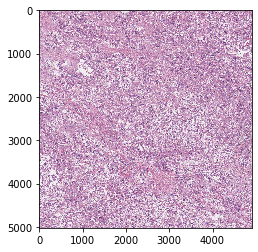

In [25]:
import scipy.misc
import matplotlib
EXTERNAL_DIR ='D:\\haiyue\\hah'
EXTERNAL_id=next(os.walk(EXTERNAL_DIR))[1]
for i in range(len(EXTERNAL_id)):
    inner_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i])
    inner_id=next(os.walk(inner_path))[1]
    for j in range(len(inner_id)):
        image_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j],"image.svs")
        at_path=os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j],'CT.xml')
        if os.path.exists(at_path):
            print(image_path)
            image= open_slide(image_path)
            regions = get_regions(at_path)
            #有的region是三个
            print(image_path)
            print(regions)
            contours=[]
            for k in range(len(regions)):
                x,y,w,h = coordinate_regions(regions[k])
                print(regions[k])
                m=regions[k]
                region=[]
                for n in range(len(m)):
                    a = m[n][0]-x
                    b = m[n][1]-y
                    region.append((a,b))
                print(region)
                contours.append(region)
                if w>25000 or h>25000:
                    continue
                img = np.array(image.read_region((x,y),0,(w,h)))
                plt.imshow(img)
                r, g, b, a = cv2.split(img)
                imgs = cv2.merge([r, g, b])
                images = Image.new('L',(w,h))
                ImageDraw.Draw(images).polygon(region, outline=1, fill=1)
                mask=images
                im=np.array(mask)
                masked=cv2.bitwise_or(imgs,imgs,mask=im)
                file_path= os.path.join(EXTERNAL_DIR,EXTERNAL_id[i],inner_id[j],"Cc"+str(k)+"_CTROI.png")
                matplotlib.image.imsave(file_path, masked)     


In [27]:
import PIL.ImageOps    

# #读入图片
# image = Image.open('your_image.png')

# #反转颜色
# inverted_image = PIL.ImageOps.invert(image)

# #保存图片
# inverted_image.save('new_name.png')

image_path="D:\\haiyue\\hah\\1-7\\a\\Cc0_CTROI.png"     
image=Image.open(image_path)
im2 = image.convert('RGBA')
# 旋转
rot = im2.rotate(-18.0, expand=1)
# 创建一个与旋转图像大小相同的白色图像
fff = Image.new('RGBA', rot.size, (255,)*4)
# 使用alpha层的rot作为掩码创建一个复合图像
out = Image.composite(rot, fff, rot)
# 保存
out.convert(image.mode).save('D:\\haiyue\\hah\\1-7\\a\\out.png')